In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, SymLogNorm
import matplotlib.colors as colors
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd
from os import path
import time
from scipy.ndimage import gaussian_filter

In [2]:
%matplotlib notebook

In [3]:
npd.triton_init('lockin865', 'lockin830', 'lockin830_2', 'srframe')
station = qc.Station(triton, lockin865, lockin830, lockin830_2, srframe)

Connected to: OXFORD INSTRUMENTS Triton (serial:N/A, firmware:2.449) in 0.03s
Connected to: Stanford_Research_Systems SR865A (serial:003538, firmware:V1.51) in 1.06s
Connected to: Stanford_Research_Systems SR830 (serial:s/n49840, firmware:ver1.07) in 0.05s
Connected to: Stanford_Research_Systems SR830 (serial:s/n31562, firmware:ver1.07) in 0.04s
Connected to: Stanford_Research_Systems SIM900 (serial:s/n152150, firmware:ver3.6) in 0.91s


In [4]:
lockin830_3 = npd.SR830('lockin830_3', 'GPIB0::7::INSTR')

Connected to: Stanford_Research_Systems SR830 (serial:s/n31609, firmware:ver1.07) in 0.04s


In [5]:
srframe.volt_p1.step = 0.05
srframe.volt_p1.inter_delay = 0.1
srframe.volt_p5.step = 0.15
srframe.volt_p5.inter_delay = 0.1
srframe.volt_p7.step = 0.2
srframe.volt_p7.inter_delay = 0.1
lockin865.amplitude.step = 0.1 
lockin865.amplitude.inter_delay = 0.1
lockin830.amplitude.step = 0.1
lockin830.amplitude.inter_delay = 0.1
lockin830_2.amplitude.step = 0.1
lockin830_2.amplitude.inter_delay = 0.1

In [5]:
triton.MC_cernox_temp()

47.7933

In [6]:
triton.fullcooldown()

In [8]:
triton.read_temps()

MC - on:  0.0241733 K
MC_cernox - off:  321.181 K
still - off:  0.805594 K
cold_plate - off:  0.0731142 K
magnet - on:  4.35099 K
PT2h - off:  3.35797 K
PT2p - off:  3.64519 K
PT1h - off:  48.0035 K
PT1p - off:  64.5685 K


Gate resistor: 1 GOhm, 100 MOhm resistor limiting the current

# S12 initial check

In [9]:
srframe.volt_p1(-15)#1nA
time.sleep(30)
gvals = np.linspace(-15, 15, 301)
data1, plot1 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S12_865_19-17_830_17-16_8302_16-14_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-11-23 12:23:36
DataSet:
   location = 'data/2020-11-23/#001_S12_865_19-17_830_17-16_8302_16-14_base_1nA_gatesweep_12-23-31'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
Finished at 2020-11-23 12:31:20


<IPython.core.display.Javascript object>


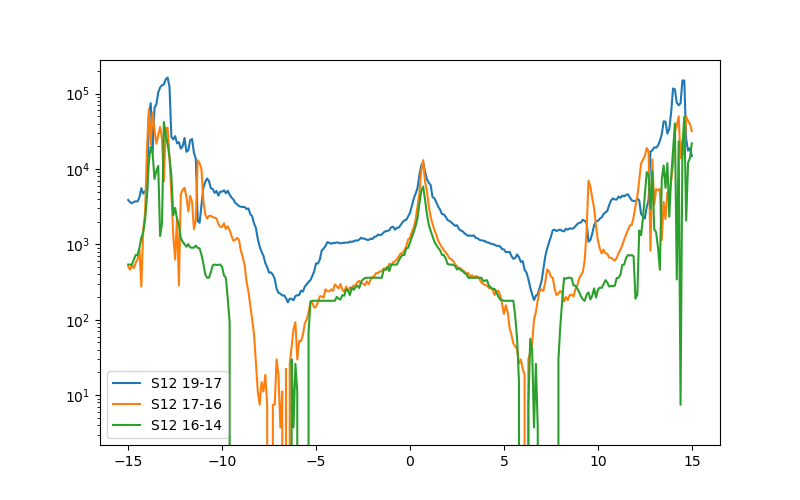

In [11]:
plt.figure(figsize=(8, 5))
plt.semilogy(data1.srframe_volt_p1_set[:], abs(data1.lockin865_X[:]/1e-9), label='S12 19-17')
plt.semilogy(data1.srframe_volt_p1_set[:], abs(data1.lockin830_X[:]/1e-9), label='S12 17-16')
plt.semilogy(data1.srframe_volt_p1_set[:], abs(data1.lockin830_2_X[:]/1e-9), label='S12 16-14')
plt.legend()

In [12]:
srframe.volt_p1(-15)#1nA
time.sleep(30)
gvals = np.linspace(-15, 16, 621)
data2, plot2 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S12_865_19-17_830_17-16_8302_16-14_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-11-23 14:57:22
DataSet:
   location = 'data/2020-11-23/#002_S12_865_19-17_830_17-16_8302_16-14_base_1nA_gatesweep_14-57-20'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (621,)
   Measured | lockin865_X         | X            | (621,)
   Measured | lockin865_Y         | Y            | (621,)
   Measured | lockin830_X         | X            | (621,)
   Measured | lockin830_Y         | Y            | (621,)
   Measured | lockin830_2_X       | X            | (621,)
   Measured | lockin830_2_Y       | Y            | (621,)
Finished at 2020-11-23 15:11:23


<IPython.core.display.Javascript object>


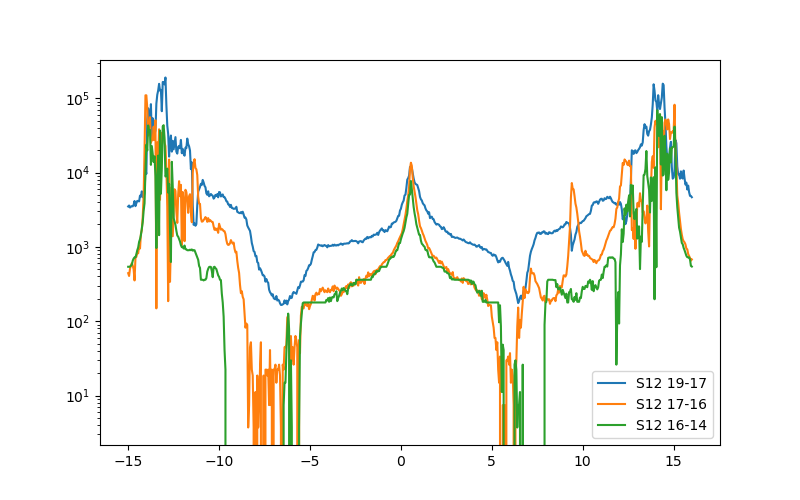

In [20]:
plt.figure(figsize=(8, 5))
plt.semilogy(data2.srframe_volt_p1_set[:], abs(data2.lockin865_X[:]/1e-9), label='S12 19-17')
plt.semilogy(data2.srframe_volt_p1_set[:], abs(data2.lockin830_X[:]/1e-9), label='S12 17-16')
plt.semilogy(data2.srframe_volt_p1_set[:], abs(data2.lockin830_2_X[:]/1e-9), label='S12 16-14')
plt.legend()

Lockin865 on 8-9, lockin830 on 9-10, lockin830_2 on 10-11 (opposide side of the device)

In [21]:
srframe.volt_p1(-15)#1nA
time.sleep(30)
gvals = np.linspace(-15, 16, 621)
data3, plot3 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S12_865_8-9_830_9-10_8302_10-11_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-11-23 15:35:51
DataSet:
   location = 'data/2020-11-23/#003_S12_865_8-9_830_9-10_8302_10-11_base_1nA_gatesweep_15-35-49'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (621,)
   Measured | lockin865_X         | X            | (621,)
   Measured | lockin865_Y         | Y            | (621,)
   Measured | lockin830_X         | X            | (621,)
   Measured | lockin830_Y         | Y            | (621,)
   Measured | lockin830_2_X       | X            | (621,)
   Measured | lockin830_2_Y       | Y            | (621,)
Finished at 2020-11-23 15:49:53


<IPython.core.display.Javascript object>


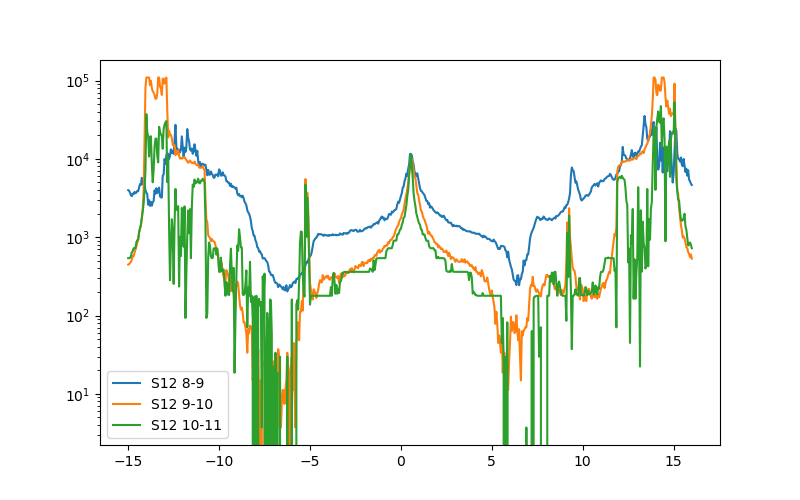

In [22]:
plt.figure(figsize=(8, 5))
plt.semilogy(data3.srframe_volt_p1_set[:], abs(data3.lockin865_X[:]/1e-9), label='S12 8-9')
plt.semilogy(data3.srframe_volt_p1_set[:], abs(data3.lockin830_X[:]/1e-9), label='S12 9-10')
plt.semilogy(data3.srframe_volt_p1_set[:], abs(data3.lockin830_2_X[:]/1e-9), label='S12 10-11')
plt.legend()

Back to the previous side. Only difference is we turned off the sync filter on lockin830_2

In [23]:
srframe.volt_p1(-15)#1nA
time.sleep(30)
gvals = np.linspace(-15, 16, 621)
data3, plot3 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S12_865_19-17_830_17-16_8302_16-14_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-11-23 15:59:06
DataSet:
   location = 'data/2020-11-23/#004_S12_865_19-17_830_17-16_8302_16-14_base_1nA_gatesweep_15-59-03'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (621,)
   Measured | lockin865_X         | X            | (621,)
   Measured | lockin865_Y         | Y            | (621,)
   Measured | lockin830_X         | X            | (621,)
   Measured | lockin830_Y         | Y            | (621,)
   Measured | lockin830_2_X       | X            | (621,)
   Measured | lockin830_2_Y       | Y            | (621,)
Finished at 2020-11-23 16:13:10


# S12 Fan diagram

Also set lockin830_3 to measure Rxy

In [30]:
triton.magnet_POC(0)
triton.magnet_swh(1)

Wait 5 min for the switch to warm


In [34]:
gvals = np.linspace(-15, 16, 621)
Bvals = np.linspace(0, 6, 121)
data4, plot4 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_19-17_830_17-16_8302_16-14_8303_10-16_base_1nA_Landaufan')

Started at 2020-11-23 16:55:34
DataSet:
   location = 'data/2020-11-23/#006_S12_865_19-17_830_17-16_8302_16-14_8303_10-16_base_1nA_Landaufan_16-55-29'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (121,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (121, 621)
   Measured | lockin865_X                 | X                | (121, 621)
   Measured | lockin865_Y                 | Y                | (121, 621)
   Measured | lockin830_X                 | X                | (121, 621)
   Measured | lockin830_Y                 | Y                | (121, 621)
   Measured | lockin830_2_X               | X                | (121, 621)
   Measured | lockin830_2_Y               | Y                | (121, 621)
   Measured | lockin830_3_X               | X                | (121, 621)
   Measured | lockin830_3_Y               | Y                | (121, 621)
Finished at 2020-11-25 00:12:31


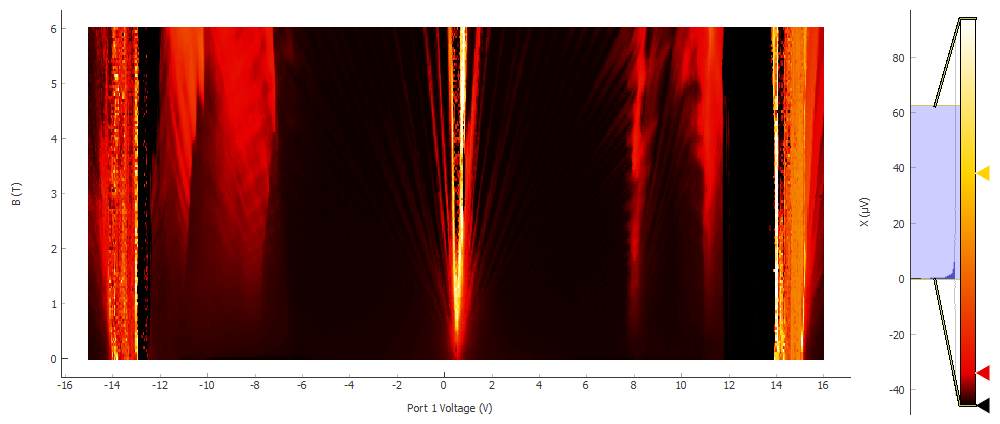

In [69]:
plot4[4]

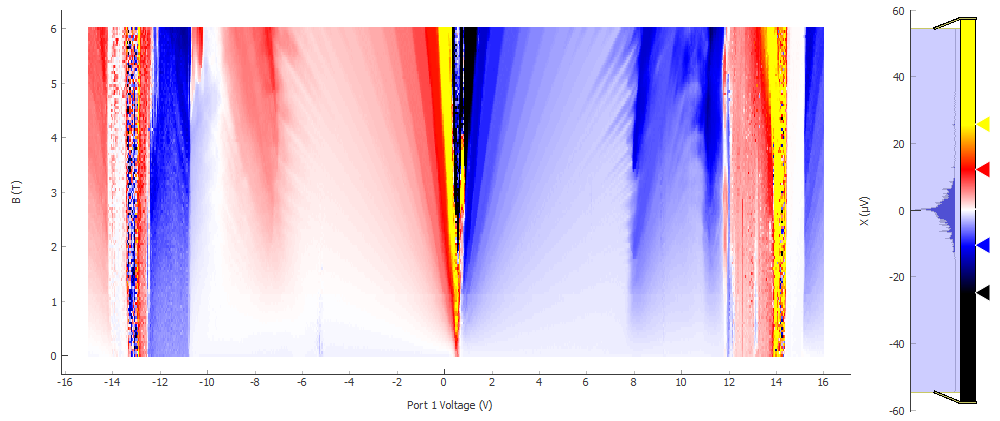

In [72]:
plot4[6]

In [33]:
srframe.volt_p1(0)#1nA

In [35]:
triton.magnet_POC(1)
gvals = np.linspace(-15, 16, 621)
Bvals = np.concatenate((np.linspace(6.05, 7.95, 39), [7.998]))
data5, plot5 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_19-17_830_17-16_8302_16-14_8303_10-16_base_1nA_Landaufan')

Started at 2020-11-25 00:12:38
DataSet:
   location = 'data/2020-11-25/#001_S12_865_19-17_830_17-16_8302_16-14_8303_10-16_base_1nA_Landaufan_00-12-33'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (40,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (40, 621)
   Measured | lockin865_X                 | X                | (40, 621)
   Measured | lockin865_Y                 | Y                | (40, 621)
   Measured | lockin830_X                 | X                | (40, 621)
   Measured | lockin830_Y                 | Y                | (40, 621)
   Measured | lockin830_2_X               | X                | (40, 621)
   Measured | lockin830_2_Y               | Y                | (40, 621)
   Measured | lockin830_3_X               | X                | (40, 621)
   Measured | lockin830_3_Y               | Y                | (40, 621)
Finished at 2020-11-25 20:20:13


In [36]:
srframe.volt_p1(0)

In [37]:
triton.field_set_stable(0)

# hole side fraunhafer

In [42]:
srframe.volt_p1(-10)

In [44]:
bgvals = np.linspace(-10, -5, 51)
Ivals = np.linspace(-5, 5, 101)
data6, plot6 = npd.twod_param_sweep(srframe.volt_p1, bgvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=15, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_19-17_830_17-16_8302_16-14_1nA_gate_Ic_hole_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X])
srframe.volt_p5(0)

Started at 2020-11-25 21:26:45
DataSet:
   location = 'data/2020-11-25/#002_S12_865_19-17_830_17-16_8302_16-14_1nA_gate_Ic_hole_baseT_21-26-43'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (51,)
   Setpoint | srframe_volt_p5_set | volt_p5      | (51, 101)
   Measured | lockin865_X         | X            | (51, 101)
   Measured | lockin865_Y         | Y            | (51, 101)
   Measured | lockin830_X         | X            | (51, 101)
   Measured | lockin830_Y         | Y            | (51, 101)
   Measured | lockin830_2_X       | X            | (51, 101)
   Measured | lockin830_2_Y       | Y            | (51, 101)
Finished at 2020-11-25 23:34:03


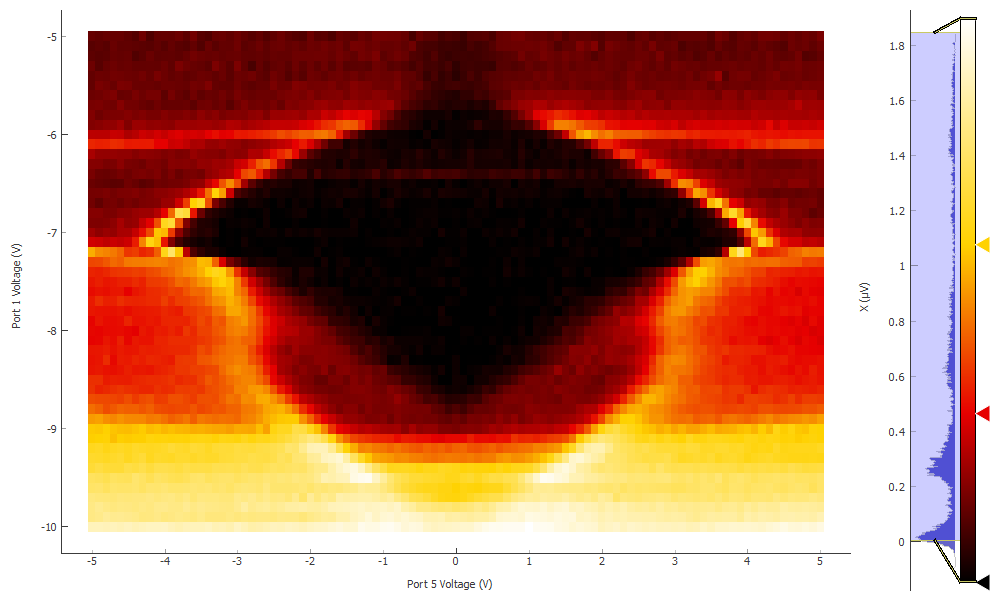

In [65]:
plot6[1]

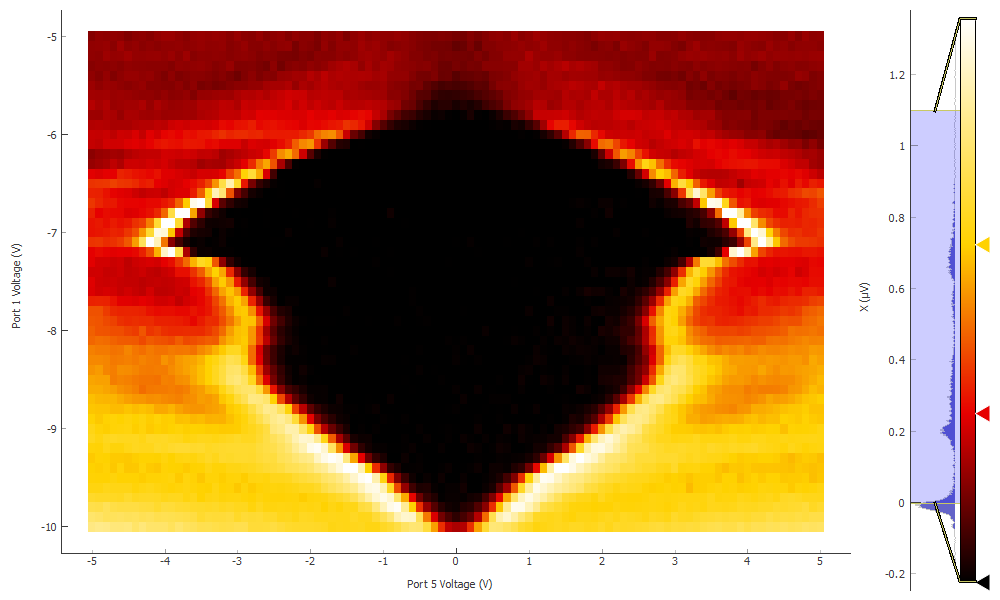

In [64]:
plot6[2]

In [45]:
srframe.volt_p1(-7.1)

In [46]:
triton.field_set_stable(-0.05)

In [47]:
Bvals = np.linspace(-0.05, 0.05, 51)
Ivals = np.linspace(-7, 7, 141)
data7, plot7 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_19-17_830_17-16_8302_16-14_1nA_vg_-7p1_field_Ic_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X])
srframe.volt_p5(0)
triton.field_set_stable(0)

Started at 2020-11-25 23:35:38
DataSet:
   location = 'data/2020-11-25/#003_S12_865_19-17_830_17-16_8302_16-14_1nA_vg_-7p1_field_Ic_baseT_23-35-36'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (51,)
   Setpoint | srframe_volt_p5_set         | volt_p5          | (51, 141)
   Measured | lockin865_X                 | X                | (51, 141)
   Measured | lockin865_Y                 | Y                | (51, 141)
   Measured | lockin830_X                 | X                | (51, 141)
   Measured | lockin830_Y                 | Y                | (51, 141)
   Measured | lockin830_2_X               | X                | (51, 141)
   Measured | lockin830_2_Y               | Y                | (51, 141)
Finished at 2020-11-26 01:13:54
Keyboard Interrupt


In [48]:
triton.field_set_stable(-0.035)

In [49]:
Bvals = np.linspace(-0.035, 0.035, 141)
Ivals = np.linspace(-7, 7, 141)
data8, plot8 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_19-17_830_17-16_8302_16-14_1nA_vg_-7p1_field_Ic_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X])
srframe.volt_p5(0)
triton.field_set_stable(0)

Started at 2020-11-26 01:15:21
DataSet:
   location = 'data/2020-11-26/#001_S12_865_19-17_830_17-16_8302_16-14_1nA_vg_-7p1_field_Ic_baseT_01-15-19'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (141,)
   Setpoint | srframe_volt_p5_set         | volt_p5          | (141, 141)
   Measured | lockin865_X                 | X                | (141, 141)
   Measured | lockin865_Y                 | Y                | (141, 141)
   Measured | lockin830_X                 | X                | (141, 141)
   Measured | lockin830_Y                 | Y                | (141, 141)
   Measured | lockin830_2_X               | X                | (141, 141)
   Measured | lockin830_2_Y               | Y                | (141, 141)
Finished at 2020-11-26 08:29:22
Keyboard Interrupt


In [50]:
triton.field_set_stable(-0.02)

In [51]:
Bvals = np.linspace(-0.02, 0.02, 161)
Ivals = np.linspace(-7, 7, 141)
data9, plot9 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_19-17_830_17-16_8302_16-14_1nA_vg_-7p1_field_Ic_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X])
srframe.volt_p5(0)
triton.field_set_stable(0)

Started at 2020-11-26 08:30:41
DataSet:
   location = 'data/2020-11-26/#002_S12_865_19-17_830_17-16_8302_16-14_1nA_vg_-7p1_field_Ic_baseT_08-30-40'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (161,)
   Setpoint | srframe_volt_p5_set         | volt_p5          | (161, 141)
   Measured | lockin865_X                 | X                | (161, 141)
   Measured | lockin865_Y                 | Y                | (161, 141)
   Measured | lockin830_X                 | X                | (161, 141)
   Measured | lockin830_Y                 | Y                | (161, 141)
   Measured | lockin830_2_X               | X                | (161, 141)
   Measured | lockin830_2_Y               | Y                | (161, 141)
Finished at 2020-11-26 18:08:53


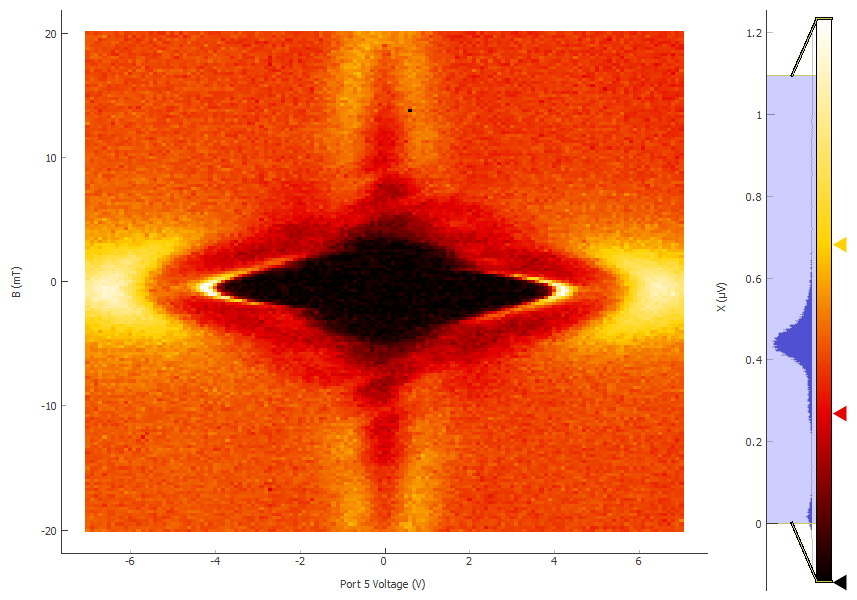

In [63]:
plot9[1]

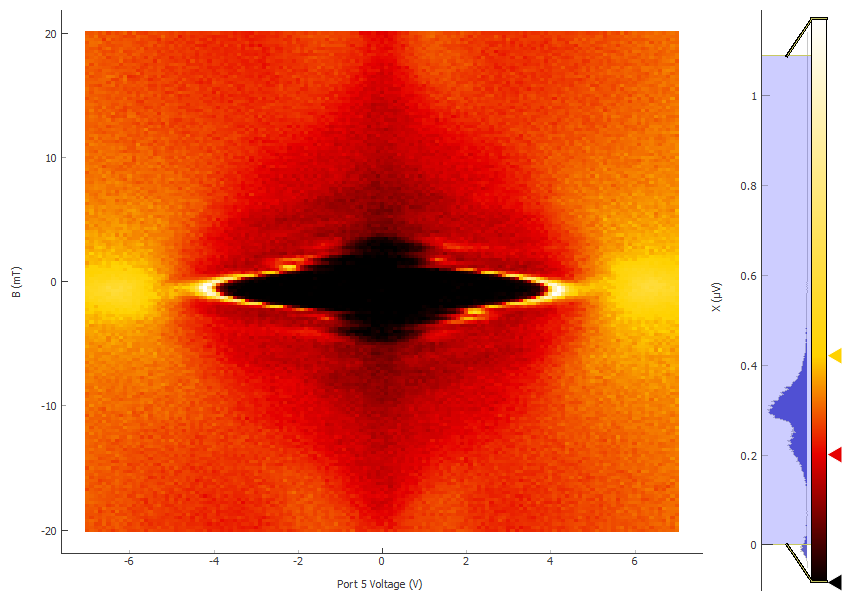

In [62]:
plot9[2]

In [52]:
srframe.volt_p1(0)

In [53]:
triton.field_set_stable(-0.0008)

# electron side fraunhafer

In [54]:
srframe.volt_p1(5)

In [55]:
bgvals = np.linspace(5, 8, 31)
Ivals = np.linspace(-5, 5, 101)
data10, plot10 = npd.twod_param_sweep(srframe.volt_p1, bgvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=15, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_19-17_830_17-16_8302_16-14_1nA_gate_Ic_electron_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X])
srframe.volt_p5(0)

Started at 2020-11-26 18:53:40
DataSet:
   location = 'data/2020-11-26/#003_S12_865_19-17_830_17-16_8302_16-14_1nA_gate_Ic_electron_baseT_18-53-38'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (31,)
   Setpoint | srframe_volt_p5_set | volt_p5      | (31, 101)
   Measured | lockin865_X         | X            | (31, 101)
   Measured | lockin865_Y         | Y            | (31, 101)
   Measured | lockin830_X         | X            | (31, 101)
   Measured | lockin830_Y         | Y            | (31, 101)
   Measured | lockin830_2_X       | X            | (31, 101)
   Measured | lockin830_2_Y       | Y            | (31, 101)
Finished at 2020-11-26 20:10:58


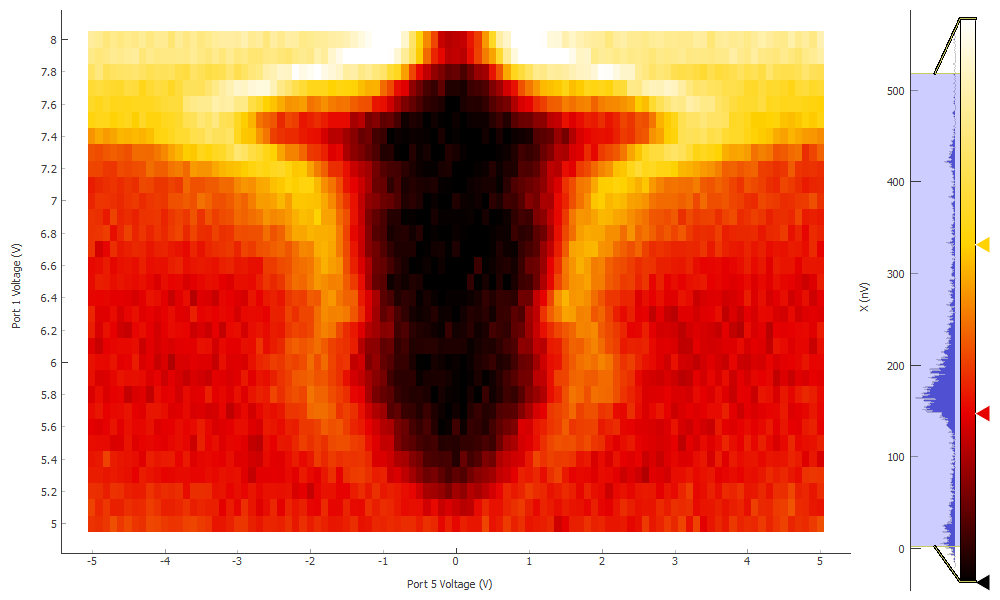

In [60]:
plot10[2]

In [56]:
srframe.volt_p1(7.4)

In [57]:
Bvals = np.linspace(-0.03, 0.03, 31)
Ivals = np.linspace(-5, 5, 101)
data7, plot7 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_19-17_830_17-16_8302_16-14_1nA_vg_7p4_field_Ic_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X])
srframe.volt_p5(0)
triton.field_set_stable(0)

Started at 2020-11-26 20:30:08
DataSet:
   location = 'data/2020-11-26/#004_S12_865_19-17_830_17-16_8302_16-14_1nA_vg_7p4_field_Ic_baseT_20-30-06'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (31,)
   Setpoint | srframe_volt_p5_set         | volt_p5          | (31, 101)
   Measured | lockin865_X                 | X                | (31, 101)
   Measured | lockin865_Y                 | Y                | (31, 101)
   Measured | lockin830_X                 | X                | (31, 101)
   Measured | lockin830_Y                 | Y                | (31, 101)
   Measured | lockin830_2_X               | X                | (31, 101)
   Measured | lockin830_2_Y               | Y                | (31, 101)
Finished at 2020-11-26 21:43:15
Keyboard Interrupt


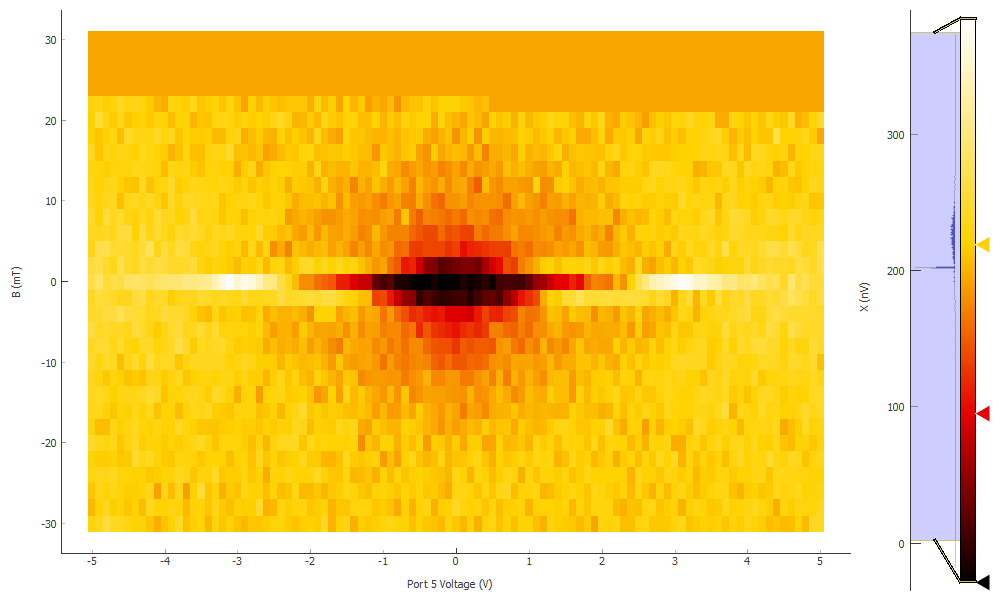

In [59]:
plot7[2]

In [6]:
Bvals = np.linspace(-0.02, 0.02, 161)
Ivals = np.linspace(-5, 5, 101)
data11, plot11 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_19-17_830_17-16_8302_16-14_1nA_vg_7p4_field_Ic_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X])
srframe.volt_p5(0)
triton.field_set_stable(0)

Started at 2020-11-26 22:12:17
Are you sure you want to use the magnet? [y/n]: y
Request timed out: ('getObjAttr', 1091, 0, b'\x80\x03}q\x00(X\x03\x00\x00\x00objq\x01cpyqtgraph.multiprocess.remoteproxy\nunpickleObjectProxy\nq\x02(M\xc88K\x12XX\x00\x00\x00<pyqtgraph.graphicsItems.HistogramLUTItem.HistogramLUTItem object at 0x00000119F25AA9D8>q\x03)tq\x04Rq\x05X\x04\x00\x00\x00attrq\x06X\t\x00\x00\x00getLevelsq\x07X\n\x00\x00\x00returnTypeq\x08X\x04\x00\x00\x00autoq\tu.')


  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-11-26/#005_S12_865_19-17_830_17-16_8302_16-14_1nA_vg_7p4_field_Ic_baseT_22-12-11'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (161,)
   Setpoint | srframe_volt_p5_set         | volt_p5          | (161, 101)
   Measured | lockin865_X                 | X                | (161, 101)
   Measured | lockin865_Y                 | Y                | (161, 101)
   Measured | lockin830_X                 | X                | (161, 101)
   Measured | lockin830_Y                 | Y                | (161, 101)
   Measured | lockin830_2_X               | X                | (161, 101)
   Measured | lockin830_2_Y               | Y                | (161, 101)
Finished at 2020-11-27 05:28:10


In [7]:
srframe.volt_p1(0)

In [8]:
triton.field_set_stable(-0.0008)

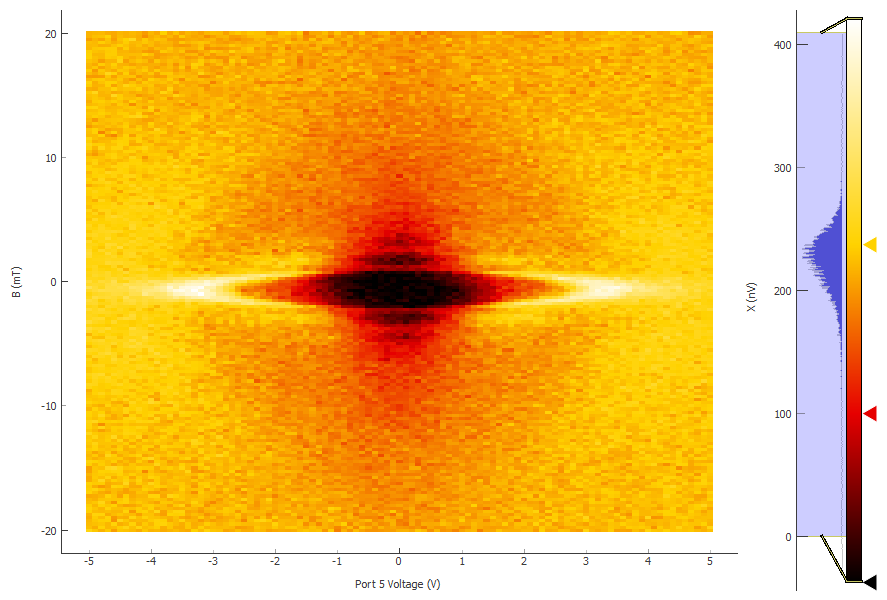

In [10]:
plot11[2]

# Rxx T dependence of S12

switch the contact 14-16 to lockin865 and 19-17 to lockin 830_2 since lockin 865 lower noise

In [11]:
srframe.volt_p1(-15)#1nA sensor disconnected
time.sleep(30)
gvals = np.linspace(-15, 16, 621)
data12, plot12 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S12_865_16-14_830_17-16_8302_19-17_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-11-27 10:58:39
DataSet:
   location = 'data/2020-11-27/#001_S12_865_16-14_830_17-16_8302_19-17_base_1nA_gatesweep_10-58-36'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (621,)
   Measured | lockin865_X         | X            | (621,)
   Measured | lockin865_Y         | Y            | (621,)
   Measured | lockin830_X         | X            | (621,)
   Measured | lockin830_Y         | Y            | (621,)
   Measured | lockin830_2_X       | X            | (621,)
   Measured | lockin830_2_Y       | Y            | (621,)
Finished at 2020-11-27 11:12:41


In [21]:
triton.pid_range(10)

In [18]:
triton.pid_setpoint(0.05)

In [20]:
triton.pid_mode(1)

In [22]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
bgvals = np.linspace(-15, 16, 621)
data13, plot13 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweepto1K')
srframe.volt_p1(0)

Started at 2020-11-27 11:23:06


Failed to execute bg task
Traceback (most recent call last):
  File "c:\users\nplab\documents\qcodes\qcodes\loops.py", line 903, in _run_loop
    self.bg_task()
  File "c:\users\nplab\documents\qcodes\qcodes\instrument_drivers\nplab_drivers\common_commands.py", line 164, in _plot_update
    p.update()
  File "c:\users\nplab\documents\qcodes\qcodes\plots\base.py", line 280, in update
    self.update_plot()
  File "c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py", line 466, in update_plot
    self._update_image(plot_object, config)
  File "c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py", line 285, in _update_image
    hist_range = hist.getLevels()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 897, in __getattr__
    return self._handler.getObjAttr(self, attr, **opts)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 532, in getObjAttr
    return sel

DataSet:
   location = 'data/2020-11-27/#002_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweepto1K_11-23-00'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 621)
   Measured | lockin865_X             | X            | (20, 621)
   Measured | lockin865_Y             | Y            | (20, 621)
   Measured | lockin830_X             | X            | (20, 621)
   Measured | lockin830_Y             | Y            | (20, 621)
   Measured | lockin830_2_X           | X            | (20, 621)
   Measured | lockin830_2_Y           | Y            | (20, 621)
Finished at 2020-11-27 17:09:49


ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host

In [23]:
triton.pid_range(31.6)
time.sleep(10)

In [24]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(1.05, 1.4, 8)
bgvals = np.linspace(-15, 16, 621)
data14, plot14 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep1p05to1p4K')
srframe.volt_p1(0)

Remote plot responded with [WinError 10054] An existing connection was forcibly closed by the remote host 
Restarting remote plot
Exception ignored in: <bound method RemoteEventHandler.deleteProxy of <pyqtgraph.multiprocess.processes.QtProcess object at 0x000001CD591BC710>>
Traceback (most recent call last):
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 579, in deleteProxy
    self.send(request='del', opts=dict(proxyId=proxyId), callSync='off')
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 452, in send
    self.conn.send(request)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\multiprocessing\connection.py", line 206, in send
    self._send_bytes(_ForkingPickler.dumps(obj))
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\multiprocessing\connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\multipro

Started at 2020-11-27 17:17:54
DataSet:
   location = 'data/2020-11-27/#003_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep1p05to1p4K_17-17-48'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (8,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (8, 621)
   Measured | lockin865_X             | X            | (8, 621)
   Measured | lockin865_Y             | Y            | (8, 621)
   Measured | lockin830_X             | X            | (8, 621)
   Measured | lockin830_Y             | Y            | (8, 621)
   Measured | lockin830_2_X           | X            | (8, 621)
   Measured | lockin830_2_Y           | Y            | (8, 621)
Finished at 2020-11-27 19:36:28


In [25]:
triton.pid_range(100)
time.sleep(10)

In [26]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(1.45, 2, 12)
bgvals = np.linspace(-15, 16, 621)
data15, plot15 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep1p45to2K')
srframe.volt_p1(0)

Started at 2020-11-27 19:38:50
DataSet:
   location = 'data/2020-11-27/#004_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep1p45to2K_19-38-46'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (12,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (12, 621)
   Measured | lockin865_X             | X            | (12, 621)
   Measured | lockin865_Y             | Y            | (12, 621)
   Measured | lockin830_X             | X            | (12, 621)
   Measured | lockin830_Y             | Y            | (12, 621)
   Measured | lockin830_2_X           | X            | (12, 621)
   Measured | lockin830_2_Y           | Y            | (12, 621)
Finished at 2020-11-27 23:06:53


In [27]:
triton.pid_setpoint(2.1)

In [28]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(2.1, 10, 80)
bgvals = np.linspace(-15, 16, 621)
data16, plot16 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep2p1to10K')
srframe.volt_p1(0)

Started at 2020-11-27 23:33:42
DataSet:
   location = 'data/2020-11-27/#005_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep2p1to10K_23-33-38'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (80,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (80, 621)
   Measured | lockin865_X             | X            | (80, 621)
   Measured | lockin865_Y             | Y            | (80, 621)
   Measured | lockin830_X             | X            | (80, 621)
   Measured | lockin830_Y             | Y            | (80, 621)
   Measured | lockin830_2_X           | X            | (80, 621)
   Measured | lockin830_2_Y           | Y            | (80, 621)
Finished at 2020-11-28 22:47:49


In [29]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(10.5, 30, 40)
bgvals = np.linspace(-15, 16, 621)
data17, plot17 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=240, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep10p5to30K')
srframe.volt_p1(0)

Started at 2020-11-28 22:49:04
DataSet:
   location = 'data/2020-11-28/#001_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep10p5to30K_22-49-01'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (40,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (40, 621)
   Measured | lockin865_X             | X            | (40, 621)
   Measured | lockin865_Y             | Y            | (40, 621)
   Measured | lockin830_X             | X            | (40, 621)
   Measured | lockin830_Y             | Y            | (40, 621)
   Measured | lockin830_2_X           | X            | (40, 621)
   Measured | lockin830_2_Y           | Y            | (40, 621)
Finished at 2020-11-29 11:03:14


In [30]:
triton.write('SET:DEV:V1:VALV:SIG:STATE:CLOSE')

In [31]:
time.sleep(60)

In [32]:
triton.pid_setpoint(31)

In [33]:
time.sleep(10)

In [34]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(30.5, 40, 20)
bgvals = np.linspace(-15, 16, 621)
data18, plot18 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=420, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep30p5to40K')
srframe.volt_p1(0)

Started at 2020-11-29 11:05:40
DataSet:
   location = 'data/2020-11-29/#001_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep30p5to40K_11-05-37'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 621)
   Measured | lockin865_X             | X            | (20, 621)
   Measured | lockin865_Y             | Y            | (20, 621)
   Measured | lockin830_X             | X            | (20, 621)
   Measured | lockin830_Y             | Y            | (20, 621)
   Measured | lockin830_2_X           | X            | (20, 621)
   Measured | lockin830_2_Y           | Y            | (20, 621)
Finished at 2020-11-29 18:12:33


In [189]:
triton.pid_mode(0)
time.sleep(10)

In [190]:
triton.alltempsenable()
time.sleep(20)

In [191]:
triton.fullcooldown()

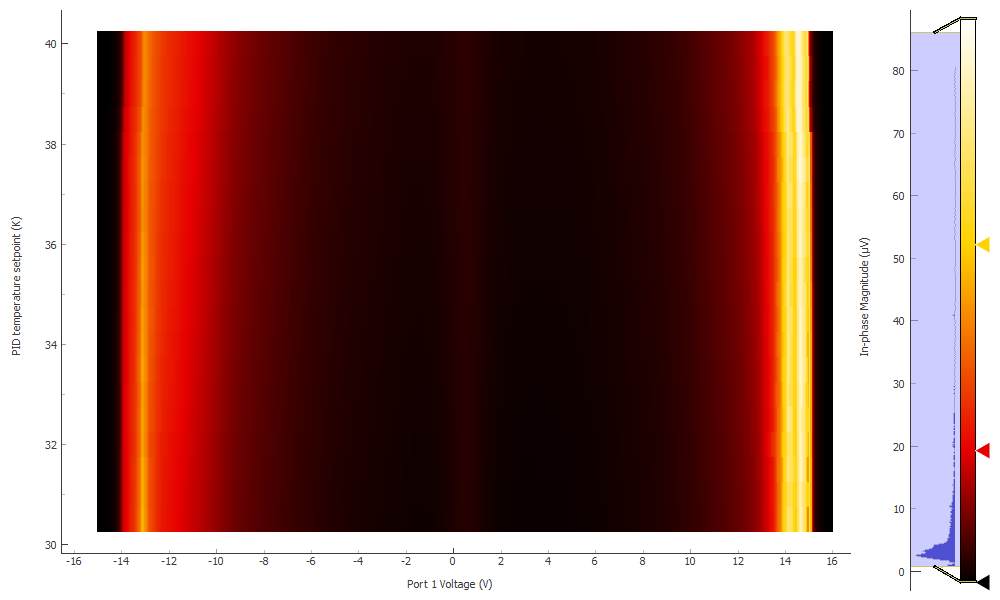

In [38]:
plot18[0]

In [50]:
triton.read_temps()

MC - on:  0.0257327 K
MC_cernox - on:  321.181 K
still - on:  0.797016 K
cold_plate - on:  0.0719684 K
magnet - on:  322.207 K
PT2h - on:  3.40682 K
PT2p - on:  3.62473 K
PT1h - on:  47.5109 K
PT1p - on:  64.4676 K


# re scan the base T different contact gate curve to see uniformity 

In [51]:
srframe.volt_p1(-15)#1nA sensor disconnected
time.sleep(30)
gvals = np.linspace(-15, 16, 621)
data12, plot12 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S12_865_16-14_830_17-16_8302_19-17_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-11-30 10:18:39
DataSet:
   location = 'data/2020-11-30/#001_S12_865_16-14_830_17-16_8302_19-17_base_1nA_gatesweep_10-18-37'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (621,)
   Measured | lockin865_X         | X            | (621,)
   Measured | lockin865_Y         | Y            | (621,)
   Measured | lockin830_X         | X            | (621,)
   Measured | lockin830_Y         | Y            | (621,)
   Measured | lockin830_2_X       | X            | (621,)
   Measured | lockin830_2_Y       | Y            | (621,)
Finished at 2020-11-30 10:32:54


In [54]:
srframe.volt_p1(-15)#1nA sensor disconnected
time.sleep(30)
gvals = np.linspace(-15, 16, 621)
data19, plot19 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S12_865_10-11_830_9-10_8302_8-9_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-11-30 10:42:59
DataSet:
   location = 'data/2020-11-30/#002_S12_865_10-11_830_9-10_8302_8-9_base_1nA_gatesweep_10-42-57'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (621,)
   Measured | lockin865_X         | X            | (621,)
   Measured | lockin865_Y         | Y            | (621,)
   Measured | lockin830_X         | X            | (621,)
   Measured | lockin830_Y         | Y            | (621,)
   Measured | lockin830_2_X       | X            | (621,)
   Measured | lockin830_2_Y       | Y            | (621,)
Finished at 2020-11-30 10:57:01


<IPython.core.display.Javascript object>


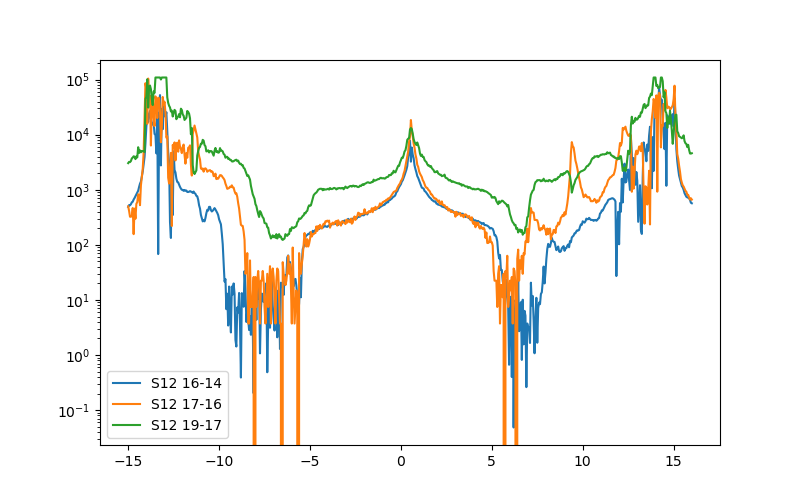

In [52]:
plt.figure(figsize=(8, 5))
plt.semilogy(data12.srframe_volt_p1_set[:], abs(data12.lockin865_X[:]/1e-9), label='S12 16-14')
plt.semilogy(data12.srframe_volt_p1_set[:], abs(data12.lockin830_X[:]/1e-9), label='S12 17-16')
plt.semilogy(data12.srframe_volt_p1_set[:], abs(data12.lockin830_2_X[:]/1e-9), label='S12 19-17')
plt.legend()

<IPython.core.display.Javascript object>


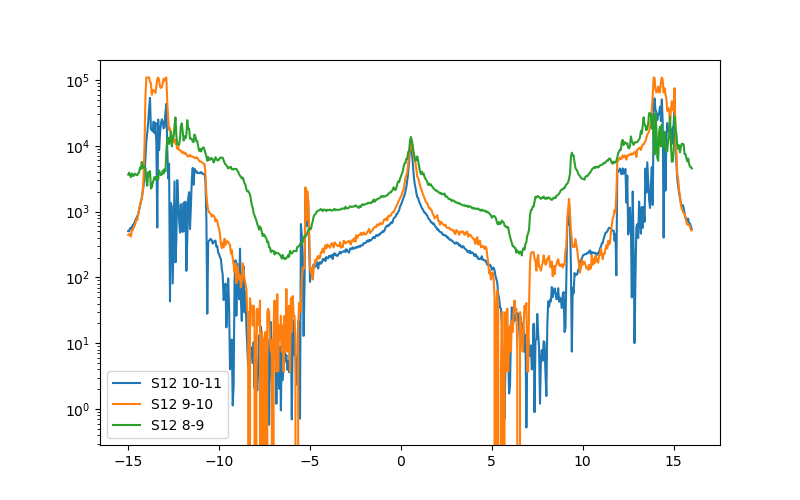

In [57]:
plt.figure(figsize=(8, 5))
plt.semilogy(data19.srframe_volt_p1_set[:], abs(data19.lockin865_X[:]/1e-9), label='S12 10-11')
plt.semilogy(data19.srframe_volt_p1_set[:], abs(data19.lockin830_X[:]/1e-9), label='S12 9-10')
plt.semilogy(data19.srframe_volt_p1_set[:], abs(data19.lockin830_2_X[:]/1e-9), label='S12 8-9')
plt.legend()

<IPython.core.display.Javascript object>


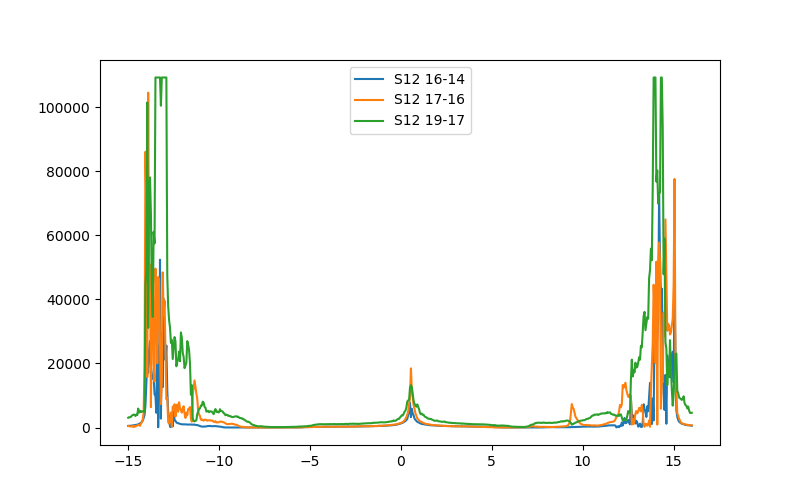

In [53]:
plt.figure(figsize=(8, 5))
plt.plot(data12.srframe_volt_p1_set[:], abs(data12.lockin865_X[:]/1e-9), label='S12 16-14')
plt.plot(data12.srframe_volt_p1_set[:], abs(data12.lockin830_X[:]/1e-9), label='S12 17-16')
plt.plot(data12.srframe_volt_p1_set[:], abs(data12.lockin830_2_X[:]/1e-9), label='S12 19-17')
plt.legend()

<IPython.core.display.Javascript object>


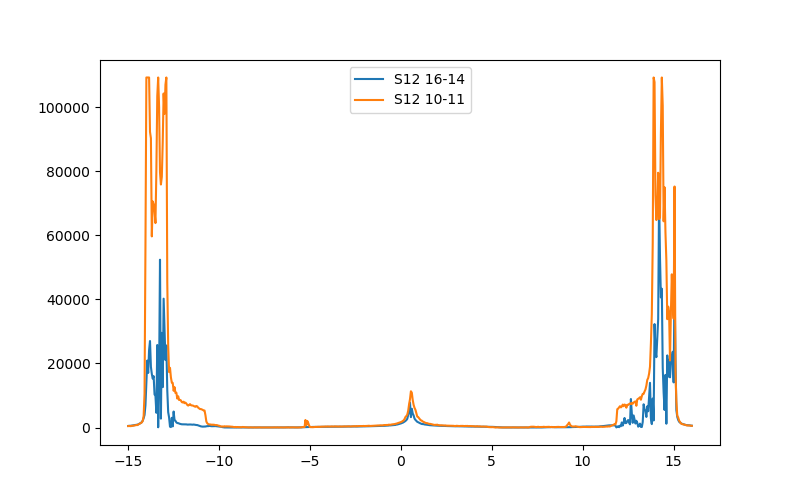

In [56]:
plt.figure(figsize=(8, 5))
plt.plot(data12.srframe_volt_p1_set[:], abs(data12.lockin865_X[:]/1e-9), label='S12 16-14')
plt.plot(data19.srframe_volt_p1_set[:], abs(data19.lockin830_X[:]/1e-9), label='S12 10-11')

plt.legend()

<IPython.core.display.Javascript object>


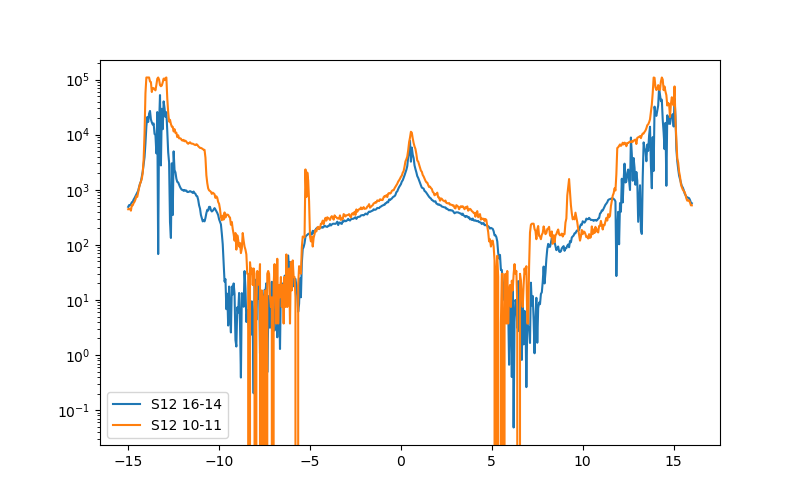

In [59]:
plt.figure(figsize=(8, 5))
plt.semilogy(data12.srframe_volt_p1_set[:], abs(data12.lockin865_X[:]/1e-9), label='S12 16-14')
plt.semilogy(data19.srframe_volt_p1_set[:], abs(data19.lockin830_X[:]/1e-9), label='S12 10-11')

plt.legend()

# S12 Rxy T dependence

use 5nA

In [60]:
lockin865.amplitude(0.5)

In [61]:
srframe.volt_p1(-15)
time.sleep(30)
gvals = np.linspace(-15, 16, 311)
data20, plot20 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S12_865_10-16_830_11-14_8302_9-17_8303_8-19_base_5nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-11-30 11:17:53
DataSet:
   location = 'data/2020-11-30/#003_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_base_5nA_gatesweep_11-17-50'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (311,)
   Measured | lockin865_X         | X            | (311,)
   Measured | lockin865_Y         | Y            | (311,)
   Measured | lockin830_X         | X            | (311,)
   Measured | lockin830_Y         | Y            | (311,)
   Measured | lockin830_2_X       | X            | (311,)
   Measured | lockin830_2_Y       | Y            | (311,)
   Measured | lockin830_3_X       | X            | (311,)
   Measured | lockin830_3_Y       | Y            | (311,)
Finished at 2020-11-30 11:26:05


<IPython.core.display.Javascript object>


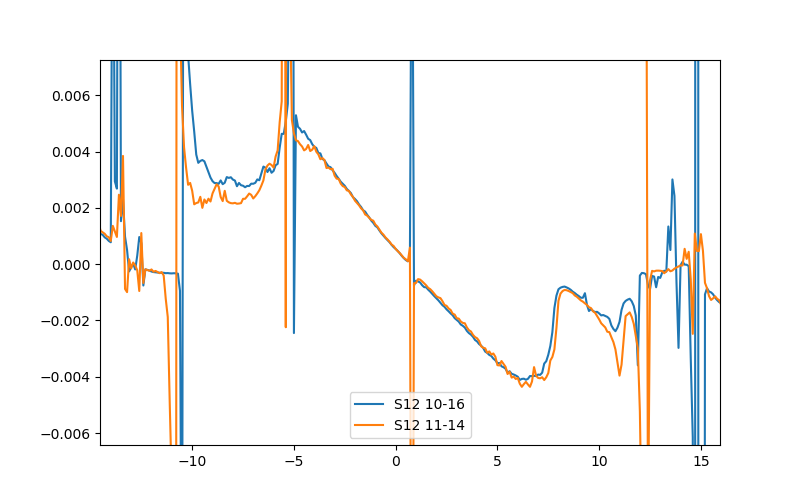

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


In [67]:
plt.figure(figsize=(8, 5))
plt.plot(data20.srframe_volt_p1_set[:], 1/(data20.lockin865_X[:]/5e-9), label='S12 10-16')
plt.plot(data20.srframe_volt_p1_set[:], 1/(data20.lockin830_X[:]/5e-9), label='S12 11-14')
plt.legend()

In [71]:
srframe.volt_p1(-15)#baseT sensor disconnected
time.sleep(30)
gvals = np.linspace(-15, 16, 621)
data21, plot21 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S12_865_10-16_830_11-14_8302_9-17_8303_8-19_base_5nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-11-30 11:41:25
DataSet:
   location = 'data/2020-11-30/#004_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_base_5nA_gatesweep_11-41-21'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (621,)
   Measured | lockin865_X         | X            | (621,)
   Measured | lockin865_Y         | Y            | (621,)
   Measured | lockin830_X         | X            | (621,)
   Measured | lockin830_Y         | Y            | (621,)
   Measured | lockin830_2_X       | X            | (621,)
   Measured | lockin830_2_Y       | Y            | (621,)
   Measured | lockin830_3_X       | X            | (621,)
   Measured | lockin830_3_Y       | Y            | (621,)
Finished at 2020-11-30 11:56:13


In [72]:
triton.pid_setpoint(0.1)

In [77]:
triton.pid_range(10)

In [76]:
triton.pid_mode(1)

In [78]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(0.1, 1, 10)
bgvals = np.linspace(-15, 16, 621)
data22, plot22 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y,  lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweepto1K')
srframe.volt_p1(0)

Started at 2020-11-30 12:02:05
DataSet:
   location = 'data/2020-11-30/#005_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweepto1K_12-02-00'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (10,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (10, 621)
   Measured | lockin865_X             | X            | (10, 621)
   Measured | lockin865_Y             | Y            | (10, 621)
   Measured | lockin830_X             | X            | (10, 621)
   Measured | lockin830_Y             | Y            | (10, 621)
   Measured | lockin830_2_X           | X            | (10, 621)
   Measured | lockin830_2_Y           | Y            | (10, 621)
   Measured | lockin830_3_X           | X            | (10, 621)
   Measured | lockin830_3_Y           | Y            | (10, 621)
Finished at 2020-11-30 14:58:51


In [79]:
triton.pid_range(31.6)
time.sleep(10)

In [80]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(1.1, 1.4, 4)
bgvals = np.linspace(-15, 16, 621)
data23, plot23 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y,  lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep1p1to1p4K')
srframe.volt_p1(0)

Started at 2020-11-30 15:00:19
DataSet:
   location = 'data/2020-11-30/#006_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep1p1to1p4K_15-00-14'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (4,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (4, 621)
   Measured | lockin865_X             | X            | (4, 621)
   Measured | lockin865_Y             | Y            | (4, 621)
   Measured | lockin830_X             | X            | (4, 621)
   Measured | lockin830_Y             | Y            | (4, 621)
   Measured | lockin830_2_X           | X            | (4, 621)
   Measured | lockin830_2_Y           | Y            | (4, 621)
   Measured | lockin830_3_X           | X            | (4, 621)
   Measured | lockin830_3_Y           | Y            | (4, 621)
Finished at 2020-11-30 16:10:28


In [81]:
triton.pid_range(100)
time.sleep(10)

In [82]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(1.5, 2, 6)
bgvals = np.linspace(-15, 16, 621)
data24, plot24 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y,  lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep1p5to2K')
srframe.volt_p1(0)

Started at 2020-11-30 16:11:55
DataSet:
   location = 'data/2020-11-30/#007_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep1p5to2K_16-11-50'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (6, 621)
   Measured | lockin865_X             | X            | (6, 621)
   Measured | lockin865_Y             | Y            | (6, 621)
   Measured | lockin830_X             | X            | (6, 621)
   Measured | lockin830_Y             | Y            | (6, 621)
   Measured | lockin830_2_X           | X            | (6, 621)
   Measured | lockin830_2_Y           | Y            | (6, 621)
   Measured | lockin830_3_X           | X            | (6, 621)
   Measured | lockin830_3_Y           | Y            | (6, 621)
Finished at 2020-11-30 17:57:32


In [83]:
triton.pid_setpoint(2.2)

In [84]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(2.2, 10, 40)
bgvals = np.linspace(-15, 16, 621)
data25, plot25 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y,  lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep2p2to10K')
srframe.volt_p1(0)

Started at 2020-11-30 18:01:40
DataSet:
   location = 'data/2020-11-30/#008_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep2p2to10K_18-01-35'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (40,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (40, 621)
   Measured | lockin865_X             | X            | (40, 621)
   Measured | lockin865_Y             | Y            | (40, 621)
   Measured | lockin830_X             | X            | (40, 621)
   Measured | lockin830_Y             | Y            | (40, 621)
   Measured | lockin830_2_X           | X            | (40, 621)
   Measured | lockin830_2_Y           | Y            | (40, 621)
   Measured | lockin830_3_X           | X            | (40, 621)
   Measured | lockin830_3_Y           | Y            | (40, 621)
Finished at 2020-12-01 05:51:00


In [85]:
srframe.volt_p1(-15)
time.sleep(25)
Tvals = np.linspace(10.5, 25, 30)
bgvals = np.linspace(-15, 16, 621)
data26, plot26 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y,  lockin830_3.X, lockin830_3.Y, SetDelay1=240, SetDelay2=1.1, Param2_SetBetween=0, DataName='S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep10p5to25K')
srframe.volt_p1(0)

Exception ignored in: <bound method RemoteEventHandler.deleteProxy of <pyqtgraph.multiprocess.processes.QtProcess object at 0x000001CD591BC710>>
Traceback (most recent call last):
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 579, in deleteProxy
    self.send(request='del', opts=dict(proxyId=proxyId), callSync='off')
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 452, in send
    self.conn.send(request)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\multiprocessing\connection.py", line 206, in send
    self._send_bytes(_ForkingPickler.dumps(obj))
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\multiprocessing\connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\multiprocessing\connection.py", line 368, in _send
    n = write(self._handle, buf)
ConnectionResetError: [WinError 10054] An existing con

Started at 2020-12-01 05:52:18
DataSet:
   location = 'data/2020-12-01/#001_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep10p5to25K_05-52-13'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (30,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (30, 621)
   Measured | lockin865_X             | X            | (30, 621)
   Measured | lockin865_Y             | Y            | (30, 621)
   Measured | lockin830_X             | X            | (30, 621)
   Measured | lockin830_Y             | Y            | (30, 621)
   Measured | lockin830_2_X           | X            | (30, 621)
   Measured | lockin830_2_Y           | Y            | (30, 621)
   Measured | lockin830_3_X           | X            | (30, 621)
   Measured | lockin830_3_Y           | Y            | (30, 621)
Finished at 2020-12-01 15:13:16


In [86]:
triton.pid_mode(0)
time.sleep(10)

In [87]:
triton.field_set_stable(0)

Are you sure you want to use the magnet? [y/n]: y


In [88]:
triton.alltempsenable()
time.sleep(20)

In [89]:
triton.fullcooldown()

In [92]:
triton.read_temps()

MC - on:  0.0247111 K
MC_cernox - on:  321.181 K
still - on:  0.833623 K
cold_plate - on:  0.0766908 K
magnet - on:  4.27133 K
PT2h - on:  3.35814 K
PT2p - on:  3.57642 K
PT1h - on:  47.3551 K
PT1p - on:  64.1919 K


# now go to S13

In [93]:
srframe.volt_p1(-12)#1nA
time.sleep(30)
gvals = np.linspace(-12, 12, 241)
data27, plot27 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep')
srframe.volt_p1(0)

Exception ignored in: <bound method RemoteEventHandler.deleteProxy of <pyqtgraph.multiprocess.processes.QtProcess object at 0x000001CD591BC710>>
Traceback (most recent call last):
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 579, in deleteProxy
    self.send(request='del', opts=dict(proxyId=proxyId), callSync='off')
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 452, in send
    self.conn.send(request)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\multiprocessing\connection.py", line 206, in send
    self._send_bytes(_ForkingPickler.dumps(obj))
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\multiprocessing\connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\multiprocessing\connection.py", line 368, in _send
    n = write(self._handle, buf)
ConnectionResetError: [WinError 10054] An existing con

Started at 2020-12-01 21:34:27
DataSet:
   location = 'data/2020-12-01/#002_S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep_21-34-24'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (241,)
   Measured | lockin865_X         | X            | (241,)
   Measured | lockin865_Y         | Y            | (241,)
   Measured | lockin830_X         | X            | (241,)
   Measured | lockin830_Y         | Y            | (241,)
   Measured | lockin830_2_X       | X            | (241,)
   Measured | lockin830_2_Y       | Y            | (241,)
Finished at 2020-12-01 21:40:31


In [98]:
srframe.volt_p1(-11)#1nA
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data28, plot28 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-12-01 21:50:26
DataSet:
   location = 'data/2020-12-01/#003_S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep_21-50-24'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
Finished at 2020-12-01 22:03:27


<IPython.core.display.Javascript object>


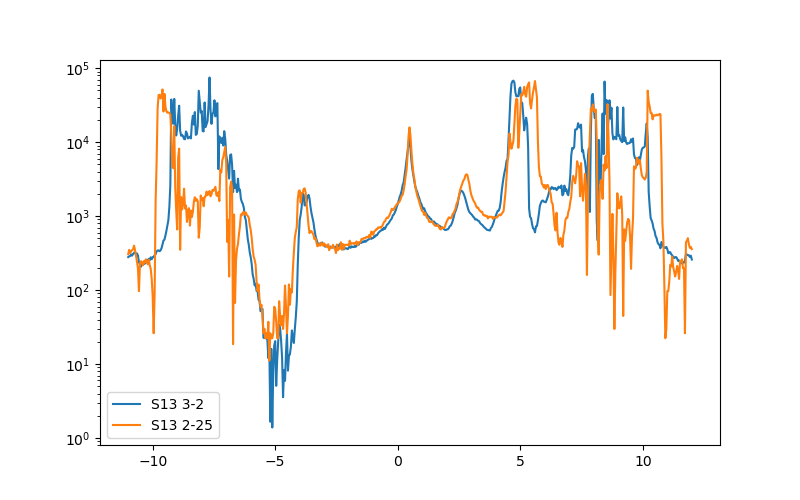

In [99]:
plt.figure(figsize=(8, 5))
plt.semilogy(data28.srframe_volt_p1_set[:], abs(data28.lockin865_X[:]/1e-9), label='S13 3-2')
plt.semilogy(data28.srframe_volt_p1_set[:], abs(data28.lockin830_X[:]/1e-9), label='S13 2-25')
plt.legend()

In [100]:
srframe.volt_p1(-11)#1nA
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data29, plot29 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S13_865_30-29_830_29-28_8302_31-30_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-12-01 22:12:41
DataSet:
   location = 'data/2020-12-01/#004_S13_865_30-29_830_29-28_8302_31-30_base_1nA_gatesweep_22-12-38'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
Finished at 2020-12-01 22:25:42


<IPython.core.display.Javascript object>


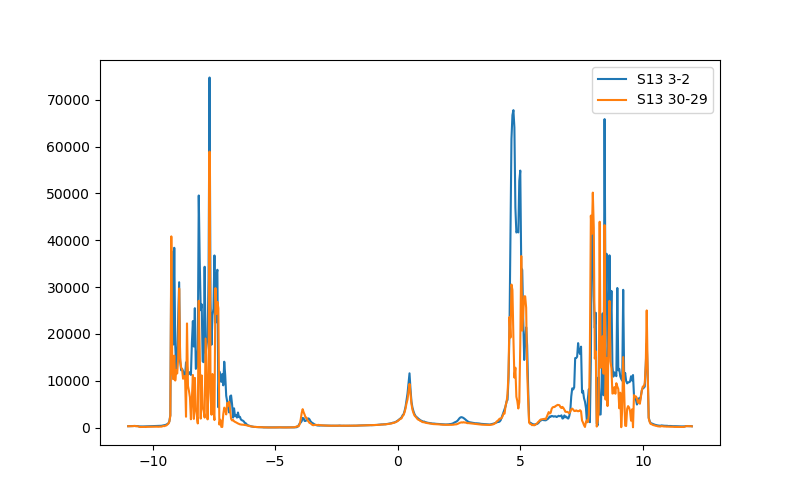

In [105]:
plt.figure(figsize=(8, 5))
plt.plot(data28.srframe_volt_p1_set[:], abs(data28.lockin865_X[:]/1e-9), label='S13 3-2')
plt.plot(data29.srframe_volt_p1_set[:], abs(data29.lockin865_X[:]/1e-9), label='S13 30-29')
plt.legend()

<IPython.core.display.Javascript object>


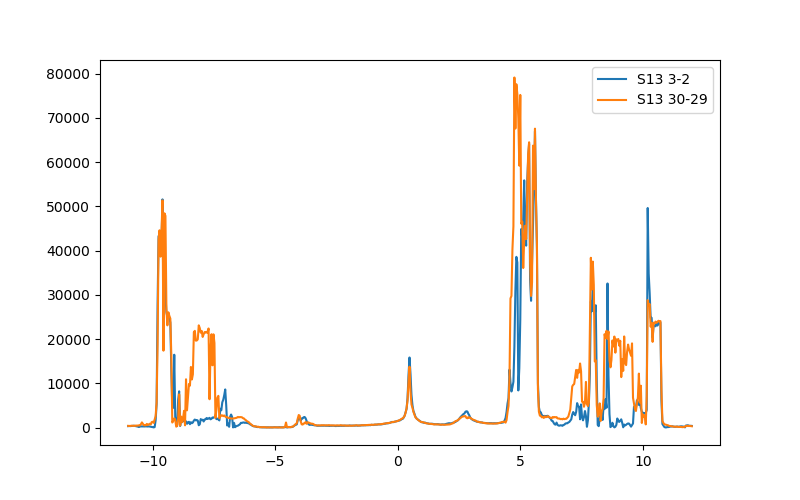

In [106]:
plt.figure(figsize=(8, 5))
plt.plot(data28.srframe_volt_p1_set[:], abs(data28.lockin830_X[:]/1e-9), label='S13 3-2')
plt.plot(data29.srframe_volt_p1_set[:], abs(data29.lockin830_X[:]/1e-9), label='S13 30-29')
plt.legend()

<IPython.core.display.Javascript object>


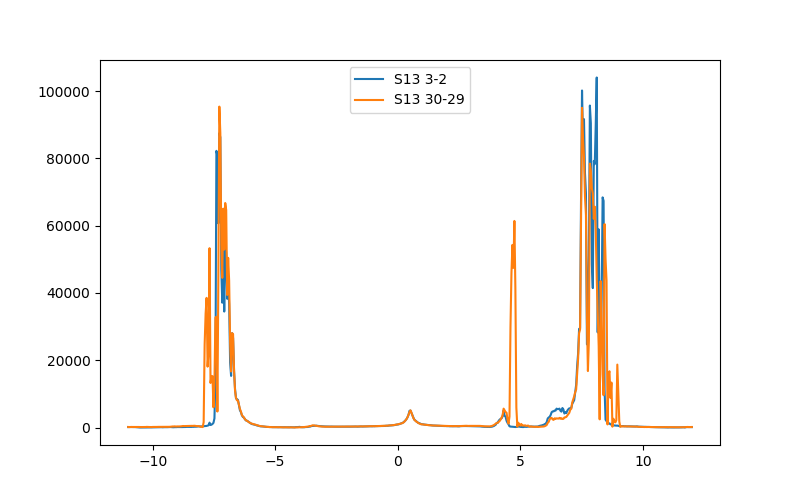

In [107]:
plt.figure(figsize=(8, 5))
plt.plot(data28.srframe_volt_p1_set[:], abs(data28.lockin830_2_X[:]/1e-9), label='S13 3-2')
plt.plot(data29.srframe_volt_p1_set[:], abs(data29.lockin830_2_X[:]/1e-9), label='S13 30-29')
plt.legend()

In [120]:
lockin865.amplitude(0.1)

In [119]:
triton.read_temps()

MC - on:  0.0214611 K
MC_cernox - off:  321.181 K
still - off:  0.779957 K
cold_plate - off:  0.0703074 K
magnet - on:  4.27422 K
PT2h - off:  3.32202 K
PT2p - off:  3.56244 K
PT1h - off:  46.9633 K
PT1p - off:  63.3174 K


In [121]:
gvals = np.linspace(-11, 12, 576)
Bvals = np.linspace(0, 5, 101)
data30, plot30 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan')

Started at 2020-12-02 10:00:32
DataSet:
   location = 'data/2020-12-02/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_10-00-27'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (101,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (101, 576)
   Measured | lockin865_X                 | X                | (101, 576)
   Measured | lockin865_Y                 | Y                | (101, 576)
   Measured | lockin830_X                 | X                | (101, 576)
   Measured | lockin830_Y                 | Y                | (101, 576)
   Measured | lockin830_2_X               | X                | (101, 576)
   Measured | lockin830_2_Y               | Y                | (101, 576)
   Measured | lockin830_3_X               | X                | (101, 576)
   Measured | lockin830_3_Y               | Y                | (101, 576)
Finished at 2020-12-03 00:34:27
Keyboard I

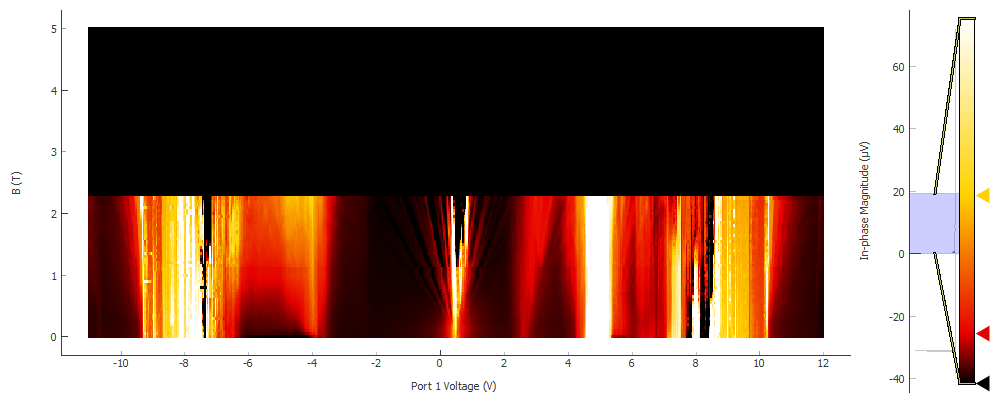

In [157]:
plot30[0]

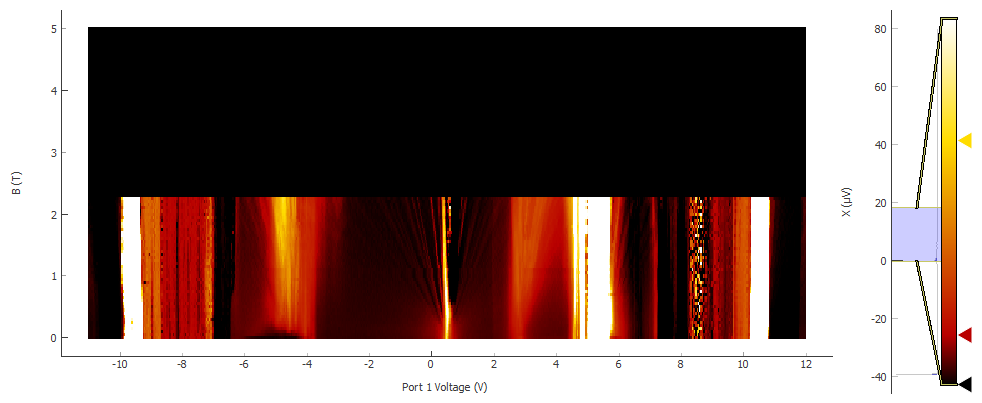

In [159]:
plot30[2]

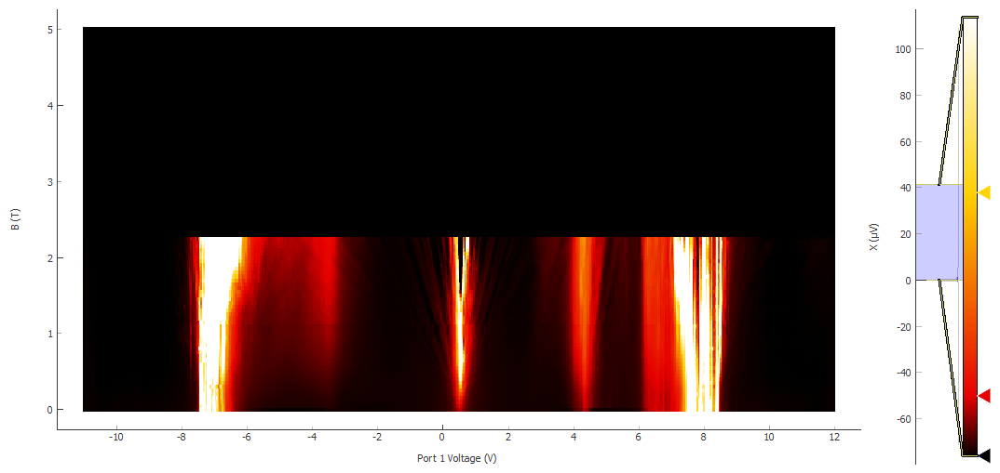

In [160]:
plot30[4]

magnet quenched

In [154]:
lockin865.X()

2.0018362648e-06

In [153]:
triton.read_temps()

MC - off:  0.022276 K
MC_cernox - off:  321.181 K
still - off:  0.779957 K
cold_plate - off:  0.0703074 K
magnet - on:  4.27764 K
PT2h - off:  3.32202 K
PT2p - off:  3.56244 K
PT1h - off:  46.9633 K
PT1p - off:  63.3174 K


the magnet struggles, probably T dependence first

# S13 T dependence and come back fan later

In [165]:
srframe.volt_p1(-11)#1nA sensor disconnected
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data31, plot31 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-12-03 11:32:01
DataSet:
   location = 'data/2020-12-03/#004_S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep_11-31-59'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
Finished at 2020-12-03 11:45:03


<IPython.core.display.Javascript object>


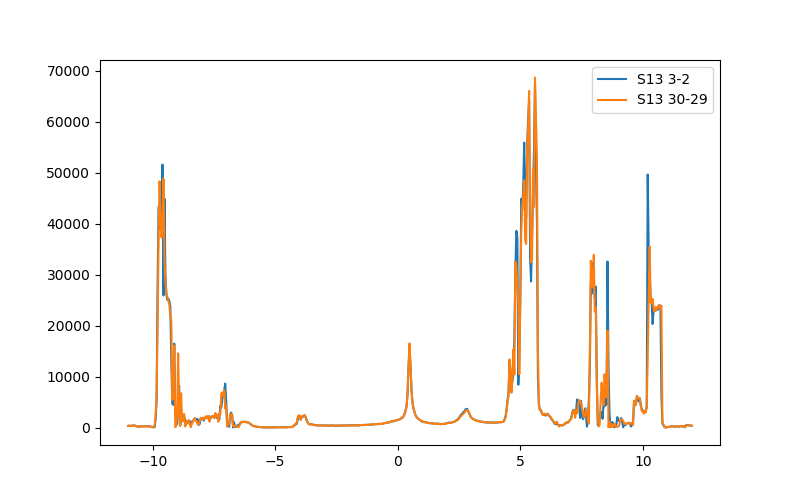

In [167]:
plt.figure(figsize=(8, 5))
plt.plot(data28.srframe_volt_p1_set[:], abs(data28.lockin830_X[:]/1e-9), label='S13 3-2')
plt.plot(data31.srframe_volt_p1_set[:], abs(data31.lockin830_X[:]/1e-9), label='S13 30-29')
plt.legend()

In [173]:
triton.pid_setpoint(0.05)

In [176]:
triton.pid_range(10)

In [175]:
triton.pid_mode(1)

In [177]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
bgvals = np.linspace(-11, 12, 576)
data32, plot32 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweepto1K')
srframe.volt_p1(0)

Started at 2020-12-03 11:50:12
DataSet:
   location = 'data/2020-12-03/#005_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweepto1K_11-50-09'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 576)
   Measured | lockin865_X             | X            | (20, 576)
   Measured | lockin865_Y             | Y            | (20, 576)
   Measured | lockin830_X             | X            | (20, 576)
   Measured | lockin830_Y             | Y            | (20, 576)
   Measured | lockin830_2_X           | X            | (20, 576)
   Measured | lockin830_2_Y           | Y            | (20, 576)
Finished at 2020-12-03 17:11:19


In [178]:
triton.pid_range(31.6)
time.sleep(10)

In [179]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(1.05, 1.4, 8)
bgvals = np.linspace(-11, 12, 576)
data33, plot33 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p05to1p4K')
srframe.volt_p1(0)

Started at 2020-12-03 17:12:35
DataSet:
   location = 'data/2020-12-03/#006_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p05to1p4K_17-12-31'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (8,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (8, 576)
   Measured | lockin865_X             | X            | (8, 576)
   Measured | lockin865_Y             | Y            | (8, 576)
   Measured | lockin830_X             | X            | (8, 576)
   Measured | lockin830_Y             | Y            | (8, 576)
   Measured | lockin830_2_X           | X            | (8, 576)
   Measured | lockin830_2_Y           | Y            | (8, 576)
Finished at 2020-12-03 19:20:39


In [180]:
triton.pid_range(100)
time.sleep(10)

In [181]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(1.45, 2, 12)
bgvals = np.linspace(-11, 12, 576)
data34, plot34 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p45to2K')
srframe.volt_p1(0)

Started at 2020-12-03 19:21:52
DataSet:
   location = 'data/2020-12-03/#007_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p45to2K_19-21-48'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (12,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (12, 576)
   Measured | lockin865_X             | X            | (12, 576)
   Measured | lockin865_Y             | Y            | (12, 576)
   Measured | lockin830_X             | X            | (12, 576)
   Measured | lockin830_Y             | Y            | (12, 576)
   Measured | lockin830_2_X           | X            | (12, 576)
   Measured | lockin830_2_Y           | Y            | (12, 576)
Finished at 2020-12-03 22:34:02


In [182]:
triton.pid_setpoint(2.1)

In [183]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(2.1, 10, 80)
bgvals = np.linspace(-11, 12, 576)
data35, plot35 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep2p1to10K')
srframe.volt_p1(0)

Started at 2020-12-03 22:51:49
DataSet:
   location = 'data/2020-12-03/#008_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep2p1to10K_22-51-46'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (80,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (80, 576)
   Measured | lockin865_X             | X            | (80, 576)
   Measured | lockin865_Y             | Y            | (80, 576)
   Measured | lockin830_X             | X            | (80, 576)
   Measured | lockin830_Y             | Y            | (80, 576)
   Measured | lockin830_2_X           | X            | (80, 576)
   Measured | lockin830_2_Y           | Y            | (80, 576)
Finished at 2020-12-04 20:17:38


In [184]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(10.5, 30, 40)
bgvals = np.linspace(-11, 12, 576)
data36, plot36 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=240, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep10p5to30K')
srframe.volt_p1(0)

Started at 2020-12-04 20:18:42
DataSet:
   location = 'data/2020-12-04/#001_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep10p5to30K_20-18-38'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (40,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (40, 576)
   Measured | lockin865_X             | X            | (40, 576)
   Measured | lockin865_Y             | Y            | (40, 576)
   Measured | lockin830_X             | X            | (40, 576)
   Measured | lockin830_Y             | Y            | (40, 576)
   Measured | lockin830_2_X           | X            | (40, 576)
   Measured | lockin830_2_Y           | Y            | (40, 576)
Finished at 2020-12-05 07:40:44


In [185]:
triton.write('SET:DEV:V1:VALV:SIG:STATE:CLOSE')

In [186]:
time.sleep(60)

In [187]:
triton.pid_setpoint(30.5)

In [188]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(30.5, 40, 20)
bgvals = np.linspace(-11, 12, 576)
data37, plot37 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=420, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep30p5to40K')
srframe.volt_p1(0)

Started at 2020-12-05 07:42:49
DataSet:
   location = 'data/2020-12-05/#001_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep30p5to40K_07-42-45'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 576)
   Measured | lockin865_X             | X            | (20, 576)
   Measured | lockin865_Y             | Y            | (20, 576)
   Measured | lockin830_X             | X            | (20, 576)
   Measured | lockin830_Y             | Y            | (20, 576)
   Measured | lockin830_2_X           | X            | (20, 576)
   Measured | lockin830_2_Y           | Y            | (20, 576)
Finished at 2020-12-05 14:23:03


In [243]:
triton.read_temps()

MC - on:  0.0563601 K
MC_cernox - off:  321.181 K
still - off:  0.708847 K
cold_plate - off:  0.0664829 K
magnet - on:  4.33679 K
PT2h - off:  3.3594 K
PT2p - off:  3.60925 K
PT1h - off:  47.2143 K
PT1p - off:  63.7241 K


# continue with fan diagram

In [240]:
triton.field_set_stable(2.2)

In [207]:
gvals = np.linspace(-11, 12, 576)
Bvals = np.concatenate((np.linspace(2.2, 7.95, 116), [7.998]))
data38, plot38 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan')

Started at 2020-12-05 21:12:40
DataSet:
   location = 'data/2020-12-05/#002_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_21-12-35'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (117,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (117, 576)
   Measured | lockin865_X                 | X                | (117, 576)
   Measured | lockin865_Y                 | Y                | (117, 576)
   Measured | lockin830_X                 | X                | (117, 576)
   Measured | lockin830_Y                 | Y                | (117, 576)
   Measured | lockin830_2_X               | X                | (117, 576)
   Measured | lockin830_2_Y               | Y                | (117, 576)
   Measured | lockin830_3_X               | X                | (117, 576)
   Measured | lockin830_3_Y               | Y                | (117, 576)
Finished at 2020-12-07 00:27:53
Keyboard I

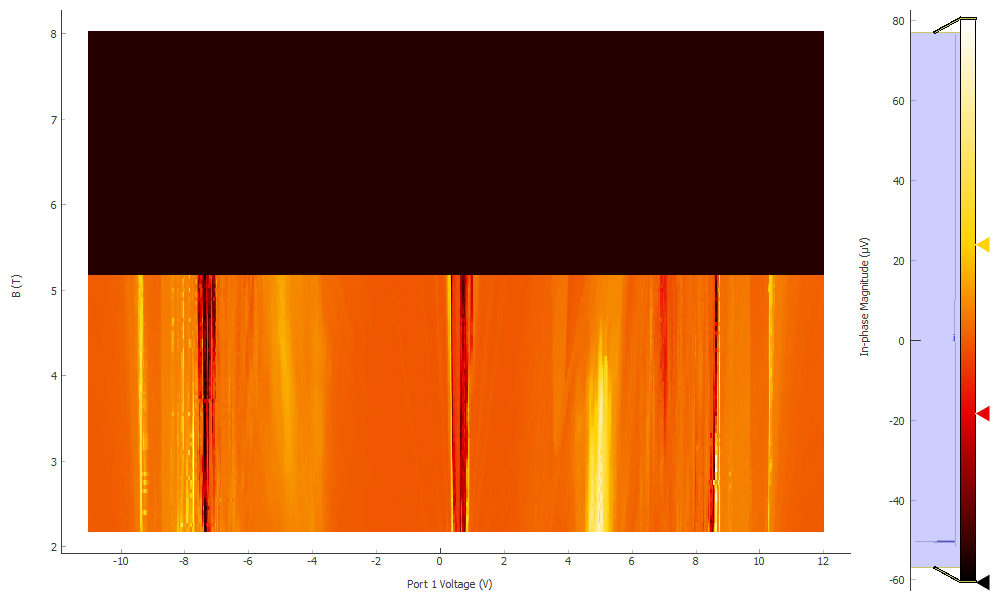

In [227]:
plot38[0]

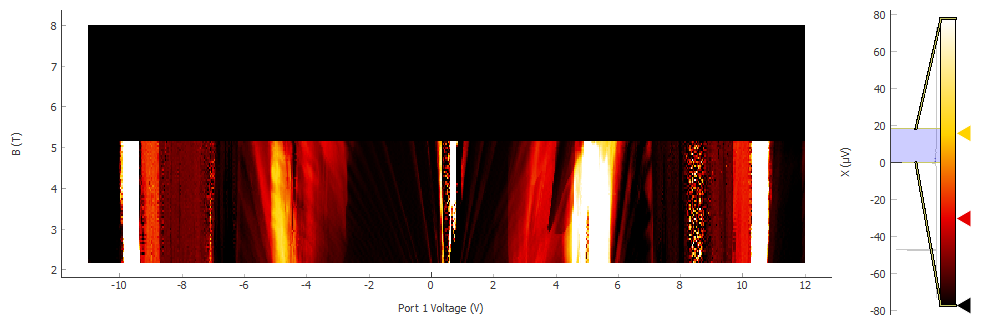

In [228]:
plot38[2]

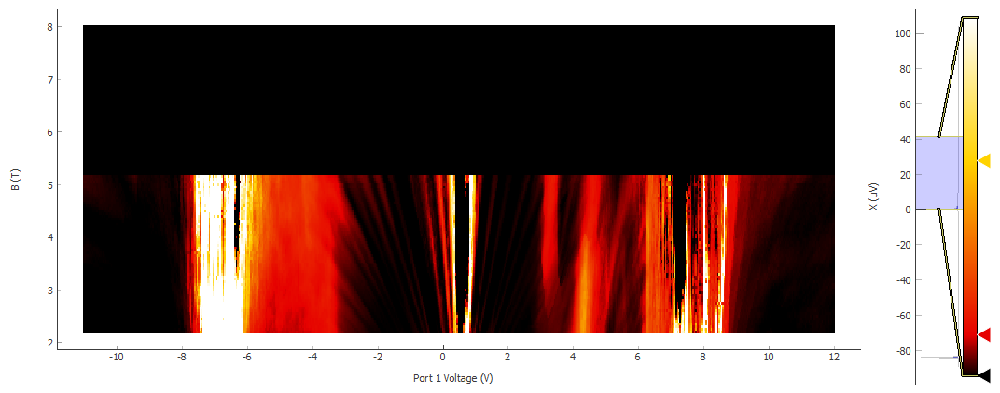

In [229]:
plot38[4]

In [225]:
triton.magnet_hold()

In [238]:
triton.magnet_swh(1)

Wait 5 min for the switch to warm


In [246]:
time.sleep(1800)

In [245]:
triton.field_set_stable(5.1)

In [247]:
gvals = np.linspace(-11, 12, 576)
Bvals = np.concatenate((np.linspace(5.1, 7.95, 58), [7.998]))
data39, plot39 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan')

Started at 2020-12-07 02:19:28
DataSet:
   location = 'data/2020-12-07/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_02-19-23'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (59,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (59, 576)
   Measured | lockin865_X                 | X                | (59, 576)
   Measured | lockin865_Y                 | Y                | (59, 576)
   Measured | lockin830_X                 | X                | (59, 576)
   Measured | lockin830_Y                 | Y                | (59, 576)
   Measured | lockin830_2_X               | X                | (59, 576)
   Measured | lockin830_2_Y               | Y                | (59, 576)
   Measured | lockin830_3_X               | X                | (59, 576)
   Measured | lockin830_3_Y               | Y                | (59, 576)
Finished at 2020-12-08 07:00:39


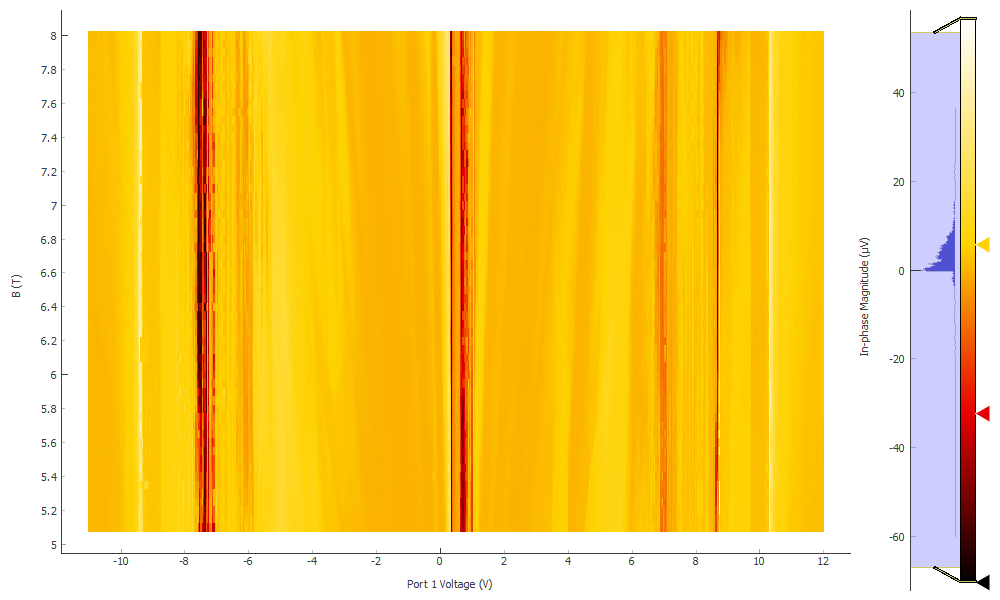

In [252]:
plot39[0]

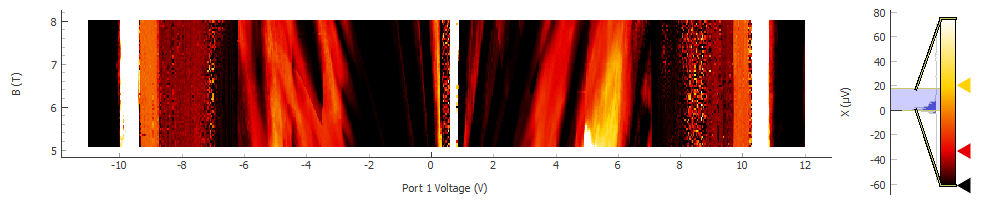

In [253]:
plot39[2]

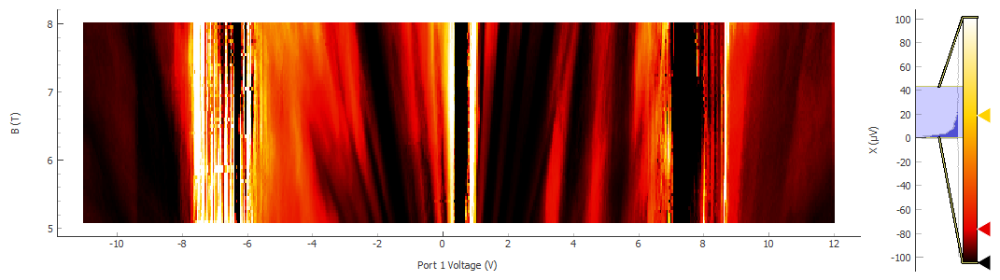

In [254]:
plot39[4]

In [248]:
triton.field_set_stable(6)

In [249]:
triton.field_set_stable(4)

In [250]:
triton.field_set_stable(2)

In [251]:
triton.field_set_stable(0)

# Fraunhofer pattern 

In [255]:
triton.field_set_stable(-0.0008)

In [264]:
srframe.volt_p5(0)

In [258]:
lockin865.sensitivity(2e-5)

In [259]:
lockin830.sensitivity(2e-5)

In [260]:
lockin830_2.sensitivity(2e-5)

In [261]:
srframe.volt_p5(-8)
time.sleep(30)
DCbias = np.linspace(-8, 8, 161)
data40, plot40 = npd.single_param_sweep(srframe.volt_p5, DCbias, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S13_865_3-2_830_2-25_8302_4-3_base_1nA_Vg-5_DCsweep')
srframe.volt_p5(0)

Started at 2020-12-08 10:25:31
DataSet:
   location = 'data/2020-12-08/#001_S13_865_3-2_830_2-25_8302_4-3_base_1nA_Vg-5_DCsweep_10-25-28'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
   Measured | lockin830_2_X       | X            | (161,)
   Measured | lockin830_2_Y       | Y            | (161,)
Finished at 2020-12-08 10:29:13


In [281]:
lockin865.amplitude(0.01)

In [279]:
srframe.volt_p1(-5.3)

now switch to 10Mohm resistor , 10mV is 1nA

In [282]:
srframe.volt_p5(-1.5)
time.sleep(30)
DCbias = np.linspace(-1.5, 1.5, 301)
data41, plot41 = npd.single_param_sweep(srframe.volt_p5, DCbias, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S13_865_3-2_830_2-25_8302_4-3_base_1nA_Vg-5_DCsweep')
srframe.volt_p5(0)

Started at 2020-12-08 14:18:03
DataSet:
   location = 'data/2020-12-08/#002_S13_865_3-2_830_2-25_8302_4-3_base_1nA_Vg-5_DCsweep_14-18-01'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
Finished at 2020-12-08 14:24:52


In [283]:
srframe.volt_p1(-6)

In [284]:
bgvals = np.linspace(-6, -4, 41)
Ivals = np.linspace(-1.7, 1.7, 341)
data42, plot42 = npd.twod_param_sweep(srframe.volt_p1, bgvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=15, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_1nA_gate_Ic_hole_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X])
srframe.volt_p5(0)

Started at 2020-12-08 14:28:52
DataSet:
   location = 'data/2020-12-08/#003_S13_865_3-2_830_2-25_8302_4-3_1nA_gate_Ic_hole_baseT_14-28-50'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (41,)
   Setpoint | srframe_volt_p5_set | volt_p5      | (41, 341)
   Measured | lockin865_X         | X            | (41, 341)
   Measured | lockin865_Y         | Y            | (41, 341)
   Measured | lockin830_X         | X            | (41, 341)
   Measured | lockin830_Y         | Y            | (41, 341)
   Measured | lockin830_2_X       | X            | (41, 341)
   Measured | lockin830_2_Y       | Y            | (41, 341)
Finished at 2020-12-08 19:29:15


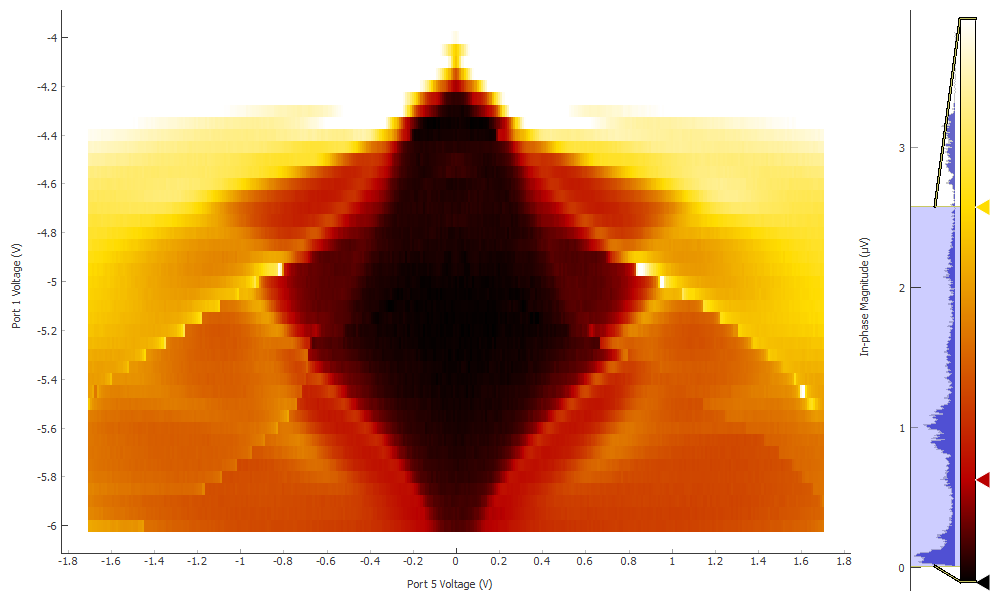

In [300]:
plot42[0]

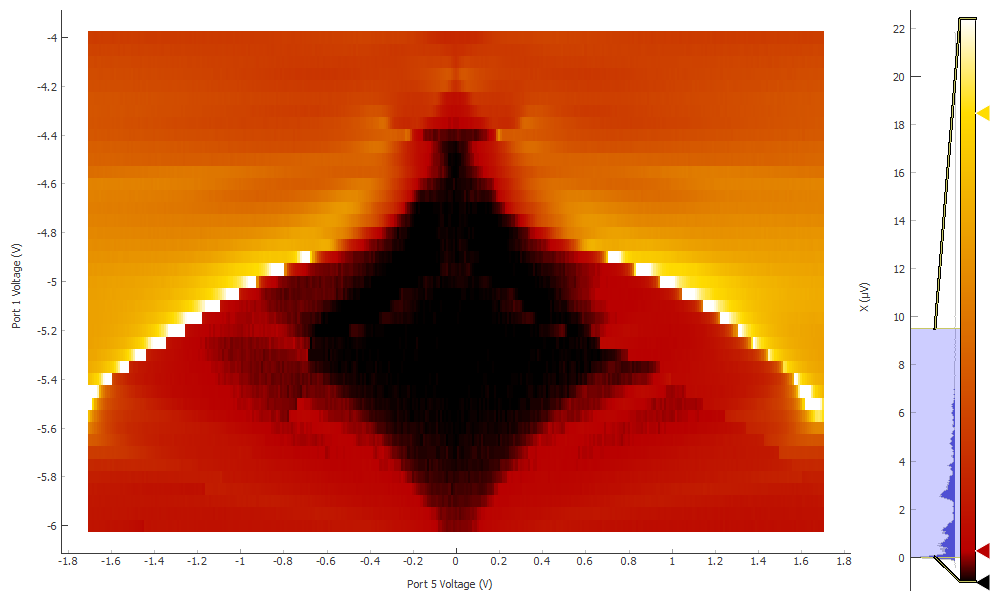

In [301]:
plot42[1]

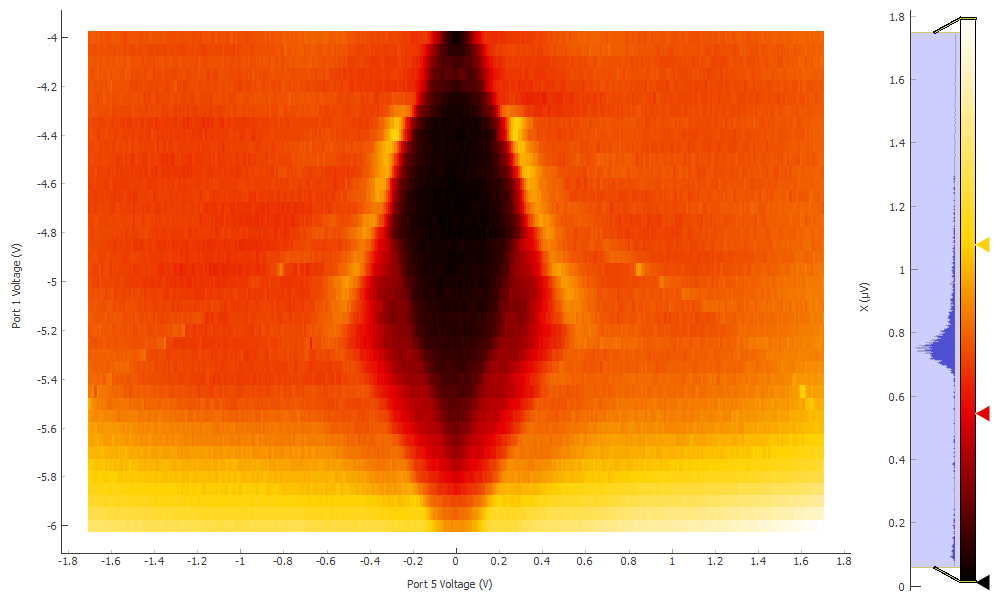

In [302]:
plot42[2]

In [285]:
srframe.volt_p1(-5.3)

In [286]:
srframe.volt_p5(-1.7)
time.sleep(30)
DCbias = np.linspace(-1.7, 1.7, 341)
data43, plot43 = npd.single_param_sweep(srframe.volt_p5, DCbias, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S13_865_3-2_830_2-25_8302_4-3_base_1nA_Vg-5p3_DCsweep')
srframe.volt_p5(0)

Started at 2020-12-08 20:27:51
DataSet:
   location = 'data/2020-12-08/#004_S13_865_3-2_830_2-25_8302_4-3_base_1nA_Vg-5p3_DCsweep_20-27-48'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (341,)
   Measured | lockin865_X         | X            | (341,)
   Measured | lockin865_Y         | Y            | (341,)
   Measured | lockin830_X         | X            | (341,)
   Measured | lockin830_Y         | Y            | (341,)
   Measured | lockin830_2_X       | X            | (341,)
   Measured | lockin830_2_Y       | Y            | (341,)
Finished at 2020-12-08 20:35:34


In [287]:
srframe.volt_p5(1.7)
time.sleep(30)
DCbias = np.linspace(1.7, -1.7, 341)
data43, plot43 = npd.single_param_sweep(srframe.volt_p5, DCbias, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S13_865_3-2_830_2-25_8302_4-3_base_1nA_Vg-5p3_DCsweep')
srframe.volt_p5(0)

Started at 2020-12-08 20:36:11
DataSet:
   location = 'data/2020-12-08/#005_S13_865_3-2_830_2-25_8302_4-3_base_1nA_Vg-5p3_DCsweep_20-36-08'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (341,)
   Measured | lockin865_X         | X            | (341,)
   Measured | lockin865_Y         | Y            | (341,)
   Measured | lockin830_X         | X            | (341,)
   Measured | lockin830_Y         | Y            | (341,)
   Measured | lockin830_2_X       | X            | (341,)
   Measured | lockin830_2_Y       | Y            | (341,)
Finished at 2020-12-08 20:43:54


In [288]:
data44 = qc.load_data('data/2020-12-08/#004_S13_865_3-2_830_2-25_8302_4-3_base_1nA_Vg-5p3_DCsweep_20-27-48')

<IPython.core.display.Javascript object>


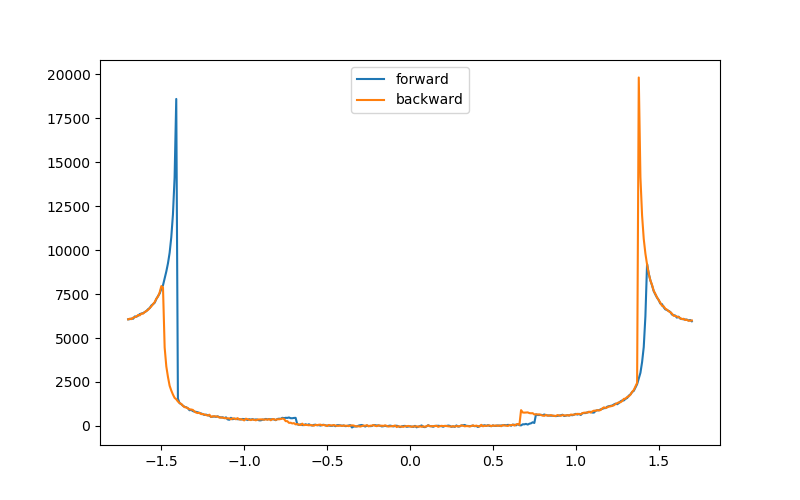

In [289]:
plt.figure(figsize=(8, 5))
plt.plot(data44.srframe_volt_p5_set[:], data44.lockin830_X[:]/1e-9, label='forward')
plt.plot(data43.srframe_volt_p5_set[:], data43.lockin830_X[:]/1e-9, label='backward')
plt.legend()

<IPython.core.display.Javascript object>


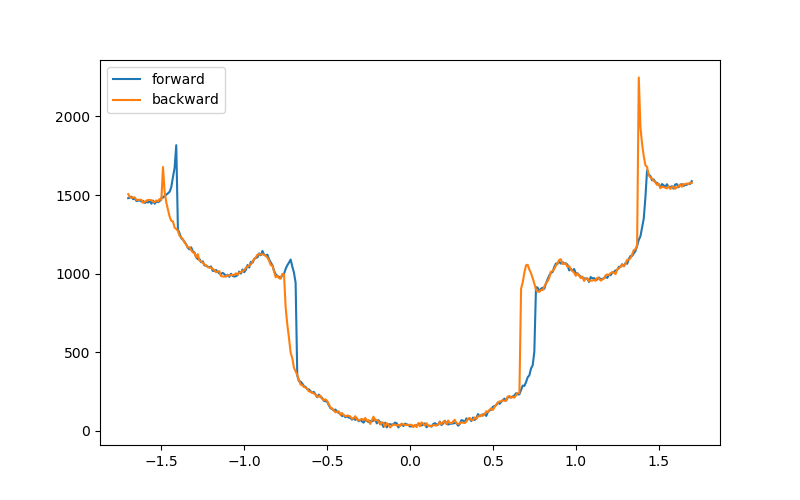

In [290]:
plt.figure(figsize=(8, 5))
plt.plot(data44.srframe_volt_p5_set[:], data44.lockin865_X[:]/1e-9, label='forward')
plt.plot(data43.srframe_volt_p5_set[:], data43.lockin865_X[:]/1e-9, label='backward')
plt.legend()

In [292]:
triton.magnet_POC(0)
triton.magnet_swh(1)

Wait 5 min for the switch to warm


In [294]:
Bvals = np.linspace(-0.1, 0.1, 51)
Ivals = np.linspace(-1.7, 1.7, 171)
data45, plot45 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_1nA_vg_-5p3_field_Ic_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X])
srframe.volt_p5(0)
triton.field_set_stable(0)

Started at 2020-12-08 21:16:25
DataSet:
   location = 'data/2020-12-08/#007_S13_865_3-2_830_2-25_8302_4-3_1nA_vg_-5p3_field_Ic_baseT_21-16-23'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (51,)
   Setpoint | srframe_volt_p5_set         | volt_p5          | (51, 171)
   Measured | lockin865_X                 | X                | (51, 171)
   Measured | lockin865_Y                 | Y                | (51, 171)
   Measured | lockin830_X                 | X                | (51, 171)
   Measured | lockin830_Y                 | Y                | (51, 171)
   Measured | lockin830_2_X               | X                | (51, 171)
   Measured | lockin830_2_Y               | Y                | (51, 171)
Finished at 2020-12-08 23:13:24
Keyboard Interrupt


In [295]:
Bvals = np.linspace(-0.1, 0.1, 201)
Ivals = np.linspace(-1.7, 1.7, 171)
data46, plot46 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_4-3_1nA_vg_-5p3_field_Ic_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X])
srframe.volt_p5(0)
triton.field_set_stable(0)

Started at 2020-12-08 23:14:18
DataSet:
   location = 'data/2020-12-08/#008_S13_865_3-2_830_2-25_8302_4-3_1nA_vg_-5p3_field_Ic_baseT_23-14-16'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (201,)
   Setpoint | srframe_volt_p5_set         | volt_p5          | (201, 171)
   Measured | lockin865_X                 | X                | (201, 171)
   Measured | lockin865_Y                 | Y                | (201, 171)
   Measured | lockin830_X                 | X                | (201, 171)
   Measured | lockin830_Y                 | Y                | (201, 171)
   Measured | lockin830_2_X               | X                | (201, 171)
   Measured | lockin830_2_Y               | Y                | (201, 171)
Finished at 2020-12-09 12:50:40


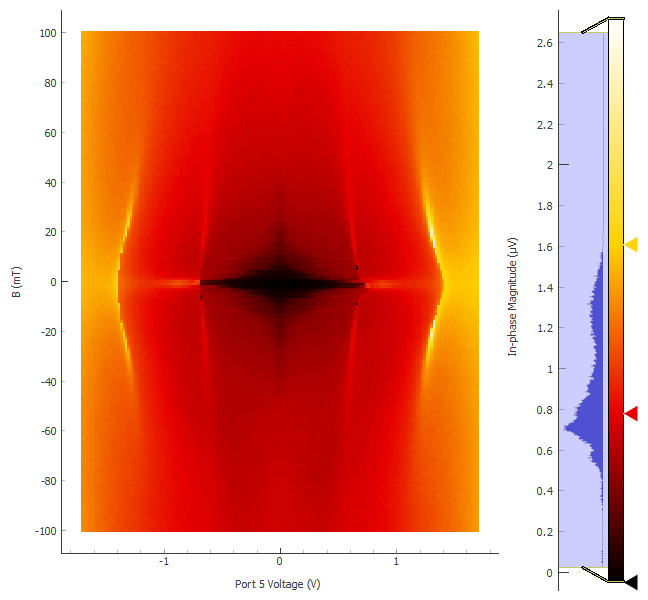

In [296]:
plot46[0]

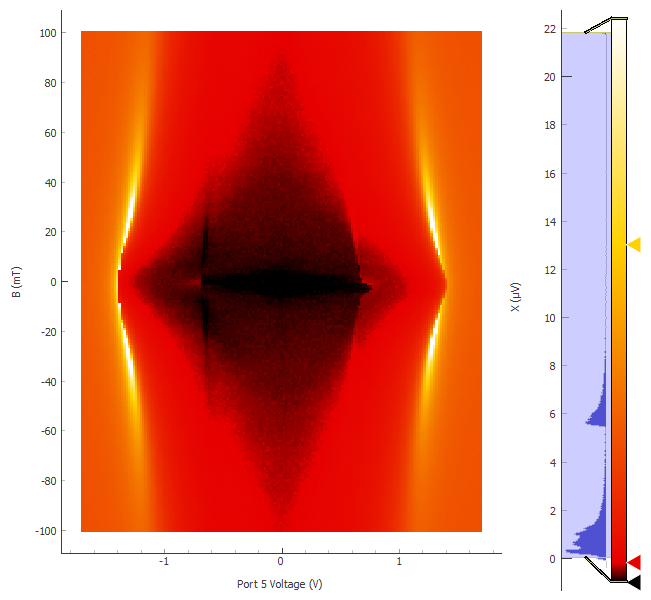

In [298]:
plot46[1]

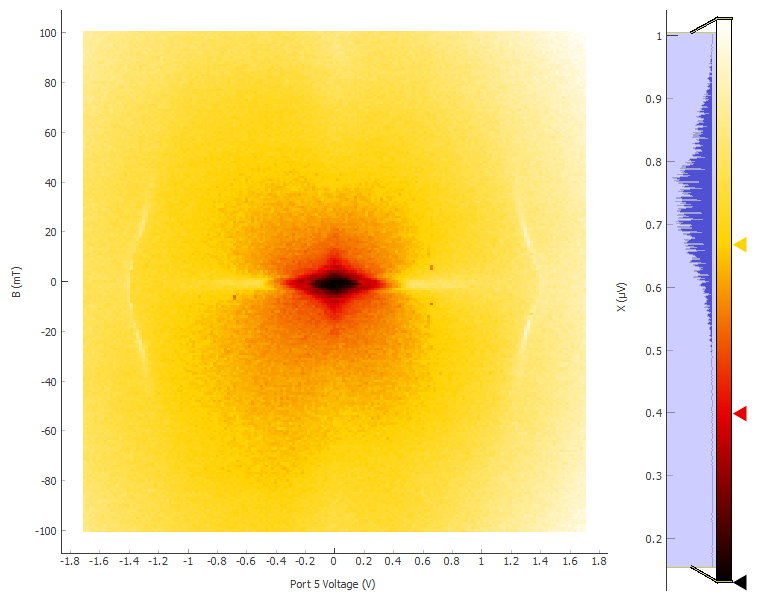

In [299]:
plot46[2]

In [303]:
srframe.volt_p1(0)

In [304]:
lockin865.amplitude(0.1)

# Looking at the potential for ferromagnetism at $\nu = 1$ in contacts 2-25

Setup: lockin865 on 2-25 (Rxx)

lockin830 on 25-28 (Rxy)

lockin830_2 on 2-29 (Rxy)

Source/drain on 7/27

In [382]:
#First find the peak
srframe.volt_p1(2)
time.sleep(15)
bgvals = np.linspace(2, 4, 61)
data47, plot47 = npd.single_param_sweep(srframe.volt_p1, bgvals, 4, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_nu1peak_1nA')

Started at 2020-12-09 16:10:09
DataSet:
   location = 'data/2020-12-09/#002_S13_865_2-25_830_25-28_8302_2-29_nu1peak_1nA_16-10-07'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (61,)
   Measured | lockin865_X         | X            | (61,)
   Measured | lockin865_Y         | Y            | (61,)
   Measured | lockin830_X         | X            | (61,)
   Measured | lockin830_Y         | Y            | (61,)
   Measured | lockin830_2_X       | X            | (61,)
   Measured | lockin830_2_Y       | Y            | (61,)
Finished at 2020-12-09 16:14:29


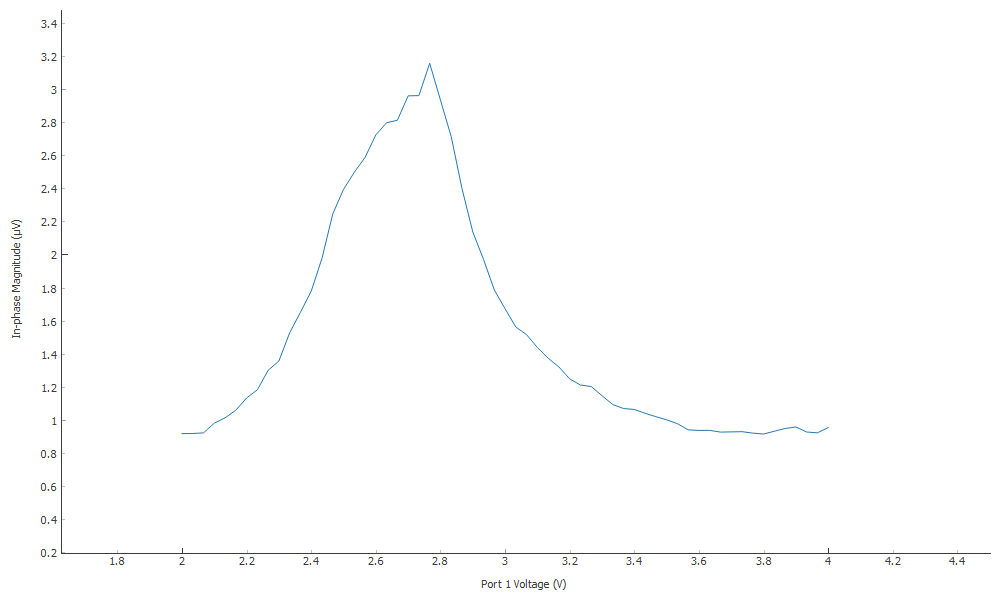

In [481]:
plot47[0]

In [448]:
srframe.volt_p1(2.76)

At Vbg=2.76 V

In [463]:
lockin865.X()

3.2085256407e-06

In [469]:
triton.magnet_sweeprate(0.1)
triton.field(2)
data48, plot48 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=25, breakif=npd.breakat(triton.field, 2, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweep_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-09 16:30:30
DataSet:
   location = 'data/2020-12-09/#004_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweep_1nA_16-30-29'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (1500,)
   Measured | time0         | time0        | (1500,)
   Measured | triton_field  | field        | (1500,)
   Measured | lockin865_X   | X            | (1500,)
   Measured | lockin865_Y   | Y            | (1500,)
   Measured | lockin830_X   | X            | (1500,)
   Measured | lockin830_Y   | Y            | (1500,)
   Measured | lockin830_2_X | X            | (1500,)
   Measured | lockin830_2_Y | Y            | (1500,)
Finished at 2020-12-09 16:40:23
Keyboard Interrupt


In [471]:
triton.magnet_sweeprate(0.1)
triton.field(-1)
data49, plot49 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=50, breakif=npd.breakat(triton.field, -1, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-09 16:40:38
DataSet:
   location = 'data/2020-12-09/#005_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_16-40-36'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (3000,)
   Measured | time0         | time0        | (3000,)
   Measured | triton_field  | field        | (3000,)
   Measured | lockin865_X   | X            | (3000,)
   Measured | lockin865_Y   | Y            | (3000,)
   Measured | lockin830_X   | X            | (3000,)
   Measured | lockin830_Y   | Y            | (3000,)
   Measured | lockin830_2_X | X            | (3000,)
   Measured | lockin830_2_Y | Y            | (3000,)
Finished at 2020-12-09 16:57:39
Keyboard Interrupt


In [473]:
triton.magnet_hold()

In [474]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data50, plot50 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=20, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-09 16:58:06
DataSet:
   location = 'data/2020-12-09/#006_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_16-58-05'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (1200,)
   Measured | time0         | time0        | (1200,)
   Measured | triton_field  | field        | (1200,)
   Measured | lockin865_X   | X            | (1200,)
   Measured | lockin865_Y   | Y            | (1200,)
   Measured | lockin830_X   | X            | (1200,)
   Measured | lockin830_Y   | Y            | (1200,)
   Measured | lockin830_2_X | X            | (1200,)
   Measured | lockin830_2_Y | Y            | (1200,)
Finished at 2020-12-09 17:09:44


<IPython.core.display.Javascript object>


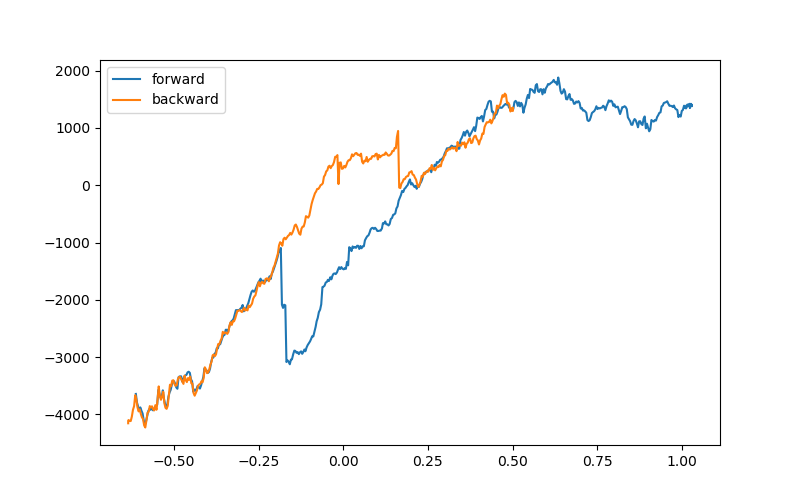

In [475]:
plt.figure(figsize=(8, 5)) #2.76 V
plt.plot(data49.triton_field[:], data49.lockin830_X[:]/1e-9, label='forward')
plt.plot(data50.triton_field[:], data50.lockin830_X[:]/1e-9, label='backward')
plt.legend()

Vbg=2.65

In [476]:
srframe.volt_p1(2.65)

In [477]:
triton.magnet_sweeprate(0.1)
triton.field(-0.5)
data51, plot51 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p65FieldSweepdown_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-09 17:19:40
DataSet:
   location = 'data/2020-12-09/#007_S13_865_2-25_830_25-28_8302_2-29_vbg2p65FieldSweepdown_1nA_17-19-39'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-09 17:29:56


In [478]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data52, plot52 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=20, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p65FieldSweepup_1nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-09 17:30:01
DataSet:
   location = 'data/2020-12-09/#008_S13_865_2-25_830_25-28_8302_2-29_vbg2p65FieldSweepup_1nA_17-29-59'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (1200,)
   Measured | time0         | time0        | (1200,)
   Measured | triton_field  | field        | (1200,)
   Measured | lockin865_X   | X            | (1200,)
   Measured | lockin865_Y   | Y            | (1200,)
   Measured | lockin830_X   | X            | (1200,)
   Measured | lockin830_Y   | Y            | (1200,)
   Measured | lockin830_2_X | X            | (1200,)
   Measured | lockin830_2_Y | Y            | (1200,)
Finished at 2020-12-09 17:40:16


<IPython.core.display.Javascript object>


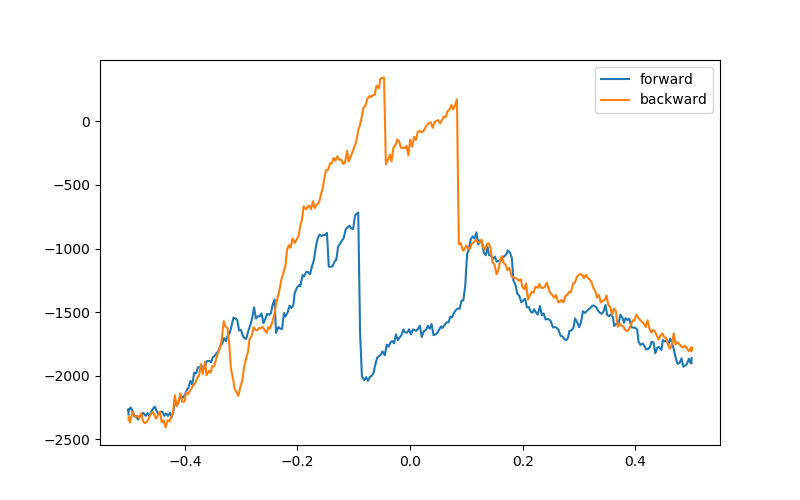

In [479]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data51.triton_field[:], data51.lockin830_X[:]/1e-9, label='forward')
plt.plot(data52.triton_field[:], data52.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [483]:
'S13_865_2-25_830_25-28_8302_2-29_vbg{:.3f}V_FieldSweepdown_1nA'.format(2.785)

'S13_865_2-25_830_25-28_8302_2-29_vbg2.785V_FieldSweepdown_1nA'

Sweep over a range of backgates at base temperature (some drifting upward to 30-40 or so mK because of the sweeps)

In [497]:
bgvals = np.linspace(1.8, 3.8, 51)
for bg in bgvals:
    srframe.volt_p1(bg)
    time.sleep(15)
    bgstr = str(int(bg)) + 'p' + str(np.round(bg-int(bg), 4))[2:]
    triton.field(-0.5)
    data53, plot53 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepdown_1nA'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
    triton.field(0.5)
    data54, plot54 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepup_1nA'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-09 17:48:36
DataSet:
   location = 'data/2020-12-09/#009_S13_865_2-25_830_25-28_8302_2-29_vbg1p8V_FieldSweepdown_1nA_17-48-35'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-09 17:58:54
Started at 2020-12-09 17:58:58
DataSet:
   location = 'data/2020-12-09/#010_S13_865_2-25_830_25-28_8302_2-29_vbg1p8V_FieldSweepup_1nA_17-58-57'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0     

Failed to execute bg task
Traceback (most recent call last):
  File "c:\users\nplab\documents\qcodes\qcodes\loops.py", line 903, in _run_loop
    self.bg_task()
  File "c:\users\nplab\documents\qcodes\qcodes\instrument_drivers\nplab_drivers\common_commands.py", line 274, in _plot_update
    p.update()
  File "c:\users\nplab\documents\qcodes\qcodes\plots\base.py", line 280, in update
    self.update_plot()
  File "c:\users\nplab\documents\qcodes\qcodes\plots\pyqtgraph.py", line 468, in update_plot
    plot_object.setData(*self._line_data(config['x'], config['y']))
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 897, in __getattr__
    return self._handler.getObjAttr(self, attr, **opts)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\pyqtgraph\multiprocess\remoteproxy.py", line 532, in getObjAttr
    return self.send(request='getObjAttr', opts=dict(obj=obj, attr=attr), **kwds)
  File "C:\Users\NPLAB\Anaconda3\envs

DataSet:
   location = 'data/2020-12-10/#051_S13_865_2-25_830_25-28_8302_2-29_vbg3p52V_FieldSweepdown_1nA_08-48-48'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 08:59:07


ClosedError: 

# ferromagnetism T dependence at vg = 2.76

In [498]:
srframe.volt_p1(2.76)

In [499]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data55, plot55 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data56, plot56 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Remote plot responded with  
Restarting remote plot


Started at 2020-12-10 11:05:44
DataSet:
   location = 'data/2020-12-10/#052_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_base_11-05-40'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 11:15:56
Started at 2020-12-10 11:16:00
DataSet:
   location = 'data/2020-12-10/#053_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_base_11-15-59'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

<IPython.core.display.Javascript object>


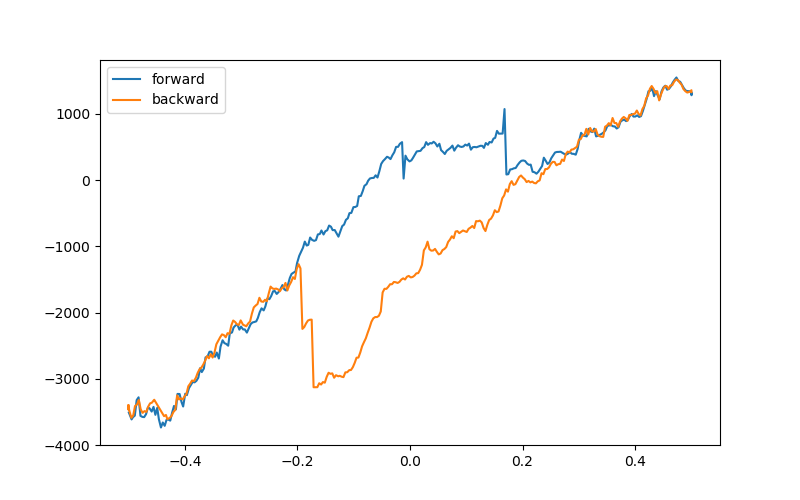

In [500]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data55.triton_field[:], data55.lockin830_X[:]/1e-9, label='forward')
plt.plot(data56.triton_field[:], data56.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [510]:
triton.pid_range(10)

In [511]:
triton.pid_setpoint(0.1)

In [512]:
triton.pid_mode(1)

In [508]:
time.sleep(180)

In [513]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data57, plot57 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_100mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data58, plot58 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_100mk', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 11:36:58
DataSet:
   location = 'data/2020-12-10/#055_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_100mK_11-36-57'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 11:47:15
Started at 2020-12-10 11:47:19
DataSet:
   location = 'data/2020-12-10/#056_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_100mk_11-47-17'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [514]:
triton.pid_setpoint(0.3)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data59, plot59 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_300mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data60, plot60 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_300mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 12:00:40
DataSet:
   location = 'data/2020-12-10/#057_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_300mK_12-00-38'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 12:10:55
Started at 2020-12-10 12:10:59
DataSet:
   location = 'data/2020-12-10/#058_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_300mK_12-10-57'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [515]:
triton.pid_setpoint(0.5)#500mK
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data61, plot61 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_300mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data62, plot62 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_300mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 12:24:20
DataSet:
   location = 'data/2020-12-10/#059_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_300mK_12-24-18'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 12:34:35
Started at 2020-12-10 12:34:39
DataSet:
   location = 'data/2020-12-10/#060_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_300mK_12-34-37'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [516]:
triton.pid_setpoint(0.8)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data63, plot63 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_800mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data64, plot64 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_800mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 12:48:00
DataSet:
   location = 'data/2020-12-10/#061_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_800mK_12-47-58'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 12:58:17
Started at 2020-12-10 12:58:21
DataSet:
   location = 'data/2020-12-10/#062_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_800mK_12-58-19'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [517]:
triton.pid_setpoint(1)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data65, plot65 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_1K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data66, plot66 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_1K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 13:11:42
DataSet:
   location = 'data/2020-12-10/#063_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_1K_13-11-40'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 13:21:59
Started at 2020-12-10 13:22:03
DataSet:
   location = 'data/2020-12-10/#064_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_1K_13-22-01'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0 

In [518]:
triton.pid_range(31.6)
time.sleep(10)
triton.pid_setpoint(1.25)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data67, plot67 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_1p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data68, plot68 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_1p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 13:35:37
DataSet:
   location = 'data/2020-12-10/#065_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_1p25K_13-35-35'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 13:45:54
Started at 2020-12-10 13:45:58
DataSet:
   location = 'data/2020-12-10/#066_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_1p25K_13-45-56'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [519]:
triton.pid_range(100)
time.sleep(10)
triton.pid_setpoint(1.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data69, plot69 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data70, plot70 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 13:59:28
DataSet:
   location = 'data/2020-12-10/#067_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_1p5K_13-59-27'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 14:09:46
Started at 2020-12-10 14:09:50
DataSet:
   location = 'data/2020-12-10/#068_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_1p5K_14-09-48'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

In [520]:
triton.pid_setpoint(2)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data71, plot71 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data72, plot72 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 14:23:12
DataSet:
   location = 'data/2020-12-10/#069_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_2K_14-23-11'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 14:33:28
Started at 2020-12-10 14:33:31
DataSet:
   location = 'data/2020-12-10/#070_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_2K_14-33-30'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0 

In [523]:
triton.pid_setpoint(2.25)

In [522]:
triton.pid_range(100)

In [524]:
triton.pid_mode(1)

In [525]:
triton.pid_setpoint(2.25)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data73, plot73 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_2p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data74, plot74 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_2p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 14:52:36
DataSet:
   location = 'data/2020-12-10/#071_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_2p25K_14-52-35'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 15:02:52
Started at 2020-12-10 15:02:55
DataSet:
   location = 'data/2020-12-10/#072_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_2p25K_15-02-54'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [526]:
triton.pid_setpoint(2.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data75, plot75 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data76, plot76 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 15:16:17
DataSet:
   location = 'data/2020-12-10/#073_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_2p5K_15-16-15'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 15:26:34
Started at 2020-12-10 15:26:37
DataSet:
   location = 'data/2020-12-10/#074_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_2p5K_15-26-36'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

In [527]:
triton.pid_setpoint(2.75)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data77, plot77 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_2p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data78, plot78 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_2p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 15:40:00
DataSet:
   location = 'data/2020-12-10/#075_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_2p75K_15-39-59'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 15:50:16
Started at 2020-12-10 15:50:19
DataSet:
   location = 'data/2020-12-10/#076_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_2p75K_15-50-18'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [528]:
triton.pid_setpoint(3)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data79, plot79 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_3K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data80, plot80 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_3K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 16:03:42
DataSet:
   location = 'data/2020-12-10/#077_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_3K_16-03-41'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 16:14:00
Started at 2020-12-10 16:14:03
DataSet:
   location = 'data/2020-12-10/#078_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_3K_16-14-02'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0 

In [529]:
triton.pid_setpoint(3.25)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data81, plot81 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_3p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data82, plot82 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_3p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 16:27:24
DataSet:
   location = 'data/2020-12-10/#079_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_3p25K_16-27-23'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 16:37:42
Started at 2020-12-10 16:37:45
DataSet:
   location = 'data/2020-12-10/#080_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_3p25K_16-37-44'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [530]:
triton.pid_setpoint(3.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data83, plot83 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data84, plot84 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 16:51:09
DataSet:
   location = 'data/2020-12-10/#081_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_3p5K_16-51-07'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 17:01:26
Started at 2020-12-10 17:01:30
DataSet:
   location = 'data/2020-12-10/#082_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_3p5K_17-01-29'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

In [531]:
triton.pid_setpoint(3.75)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data85, plot85 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_3p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data86, plot86 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_3p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 17:14:54
DataSet:
   location = 'data/2020-12-10/#083_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_3p75K_17-14-52'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 17:25:13
Started at 2020-12-10 17:25:17
DataSet:
   location = 'data/2020-12-10/#084_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_3p75K_17-25-16'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [533]:
triton.pid_setpoint(4)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data87, plot87 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data88, plot88 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 18:02:23
DataSet:
   location = 'data/2020-12-10/#087_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_4K_18-02-22'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 18:12:38
Started at 2020-12-10 18:12:42
DataSet:
   location = 'data/2020-12-10/#088_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_4K_18-12-41'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0 

In [534]:
triton.pid_setpoint(4.25)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data89, plot89 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_4p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data90, plot90 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_4p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 18:26:03
DataSet:
   location = 'data/2020-12-10/#089_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_4p25K_18-26-02'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 18:36:20
Started at 2020-12-10 18:36:24
DataSet:
   location = 'data/2020-12-10/#090_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_4p25K_18-36-23'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [535]:
triton.pid_setpoint(4.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data91, plot91 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_4p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data92, plot92 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_4p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 18:49:46
DataSet:
   location = 'data/2020-12-10/#091_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_4p5K_18-49-45'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 19:00:03
Started at 2020-12-10 19:00:07
DataSet:
   location = 'data/2020-12-10/#092_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_4p5K_19-00-06'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

In [536]:
triton.pid_setpoint(4.75)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data93, plot93 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_4p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data94, plot94 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_4p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 19:13:28
DataSet:
   location = 'data/2020-12-10/#093_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_4p75K_19-13-26'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 19:23:43
Started at 2020-12-10 19:23:47
DataSet:
   location = 'data/2020-12-10/#094_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_4p75K_19-23-45'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [537]:
triton.pid_setpoint(5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data95, plot95 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data96, plot96 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 19:37:09
DataSet:
   location = 'data/2020-12-10/#095_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_5K_19-37-07'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 19:47:24
Started at 2020-12-10 19:47:28
DataSet:
   location = 'data/2020-12-10/#096_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_5K_19-47-26'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0 

In [538]:
triton.pid_setpoint(5.25)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data97, plot97 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_5p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data98, plot98 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_5p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 20:00:51
DataSet:
   location = 'data/2020-12-10/#097_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_5p25K_20-00-49'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 20:11:08
Started at 2020-12-10 20:11:12
DataSet:
   location = 'data/2020-12-10/#098_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_5p25K_20-11-10'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [539]:
triton.pid_setpoint(5.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data99, plot99 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_5p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data100, plot100 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_5p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 20:24:35
DataSet:
   location = 'data/2020-12-10/#099_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_5p5K_20-24-33'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 20:34:50
Started at 2020-12-10 20:34:54
DataSet:
   location = 'data/2020-12-10/#100_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_5p5K_20-34-52'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

In [540]:
triton.pid_setpoint(5.75)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data101, plot101 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_5p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data102, plot102 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_5p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 20:48:17
DataSet:
   location = 'data/2020-12-10/#101_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_5p75K_20-48-15'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 20:58:34
Started at 2020-12-10 20:58:38
DataSet:
   location = 'data/2020-12-10/#102_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_5p75K_20-58-36'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [541]:
triton.pid_setpoint(6)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data103, plot103 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data104, plot104 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_6K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 21:12:01
DataSet:
   location = 'data/2020-12-10/#103_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_6K_21-11-59'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 21:22:18
Started at 2020-12-10 21:22:22
DataSet:
   location = 'data/2020-12-10/#104_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_6K_21-22-20'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0 

In [542]:
triton.pid_setpoint(6.25)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data105, plot105 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_6p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data106, plot106 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_6p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 21:53:13
DataSet:
   location = 'data/2020-12-10/#105_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_6p25K_21-53-11'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 22:03:30
Started at 2020-12-10 22:03:34
DataSet:
   location = 'data/2020-12-10/#106_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_6p25K_22-03-32'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [543]:
triton.pid_setpoint(6.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data107, plot107 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_6p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data108, plot108 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_6p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 22:16:55
DataSet:
   location = 'data/2020-12-10/#107_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_6p5K_22-16-53'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 22:27:10
Started at 2020-12-10 22:27:13
DataSet:
   location = 'data/2020-12-10/#108_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_6p5K_22-27-12'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

In [544]:
triton.pid_setpoint(6.75)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data109, plot109 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_6p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data110, plot110 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_6p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 22:40:34
DataSet:
   location = 'data/2020-12-10/#109_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_6p75K_22-40-33'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 22:50:52
Started at 2020-12-10 22:50:55
DataSet:
   location = 'data/2020-12-10/#110_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_6p75K_22-50-54'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [545]:
triton.pid_setpoint(7)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data111, plot111 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_7K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data112, plot112 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_7K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 23:04:18
DataSet:
   location = 'data/2020-12-10/#111_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_7K_23-04-17'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 23:14:36
Started at 2020-12-10 23:14:39
DataSet:
   location = 'data/2020-12-10/#112_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_7K_23-14-38'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0 

In [546]:
triton.pid_setpoint(7.25)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data113, plot113 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_7p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data114, plot114 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_7p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 23:28:03
DataSet:
   location = 'data/2020-12-10/#113_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_7p25K_23-28-02'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-10 23:38:19
Started at 2020-12-10 23:38:22
DataSet:
   location = 'data/2020-12-10/#114_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_7p25K_23-38-21'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [547]:
triton.pid_setpoint(7.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data115, plot115 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_7p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data116, plot116 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_7p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-10 23:51:43
DataSet:
   location = 'data/2020-12-10/#115_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_7p5K_23-51-42'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-11 00:02:01
Started at 2020-12-11 00:02:04
DataSet:
   location = 'data/2020-12-11/#001_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_7p5K_00-02-03'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

In [548]:
triton.pid_setpoint(7.75)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data117, plot117 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_7p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data118, plot118 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_7p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-11 00:15:25
DataSet:
   location = 'data/2020-12-11/#002_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_7p75K_00-15-24'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-11 00:25:44
Started at 2020-12-11 00:25:47
DataSet:
   location = 'data/2020-12-11/#003_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_7p75K_00-25-46'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [549]:
triton.pid_setpoint(8)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data119, plot119 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_8K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data120, plot120 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_8K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-11 00:39:08
DataSet:
   location = 'data/2020-12-11/#004_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_8K_00-39-07'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-11 00:49:25
Started at 2020-12-11 00:49:29
DataSet:
   location = 'data/2020-12-11/#005_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_8K_00-49-28'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0 

In [550]:
triton.pid_mode(0)

In [551]:
srframe.volt_p1(0)

In [552]:
triton.magnet_POC(1)
triton.field_set_stable(0)

In [553]:
triton.condense()

In [554]:
triton.read_temps()

MC - on:  0.0240066 K
MC_cernox - on:  321.181 K
still - on:  0.700098 K
cold_plate - off:  0.0664829 K
magnet - off:  4.60126 K
PT2h - off:  3.3594 K
PT2p - off:  3.60925 K
PT1h - off:  47.2143 K
PT1p - off:  63.7241 K


# now try a small fan to see chern number at 1 quarter

connect contact 830_3 to 30-3

In [706]:
triton.field_set_stable(2)

In [558]:
lockin865.amplitude(0.2)#2nA

In [561]:
srframe.volt_p1(1.8)

In [562]:
bgnvals = np.linspace(1.8, 3.8, 101)
bvals = np.linspace(-2, 2, 101)
data121, plot121 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_baseT_B-n_1quarter')
srframe.volt_p1(0)

Started at 2020-12-11 12:01:54
DataSet:
   location = 'data/2020-12-11/#007_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_baseT_B-n_1quarter_12-01-49'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (101,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (101, 101)
   Measured | lockin865_X                 | X                | (101, 101)
   Measured | lockin865_Y                 | Y                | (101, 101)
   Measured | lockin830_X                 | X                | (101, 101)
   Measured | lockin830_Y                 | Y                | (101, 101)
   Measured | lockin830_2_X               | X                | (101, 101)
   Measured | lockin830_2_Y               | Y                | (101, 101)
   Measured | lockin830_3_X               | X                | (101, 101)
   Measured | lockin830_3_Y               | Y                | (101, 101)
Finished at 2020-12-11 17:01:02


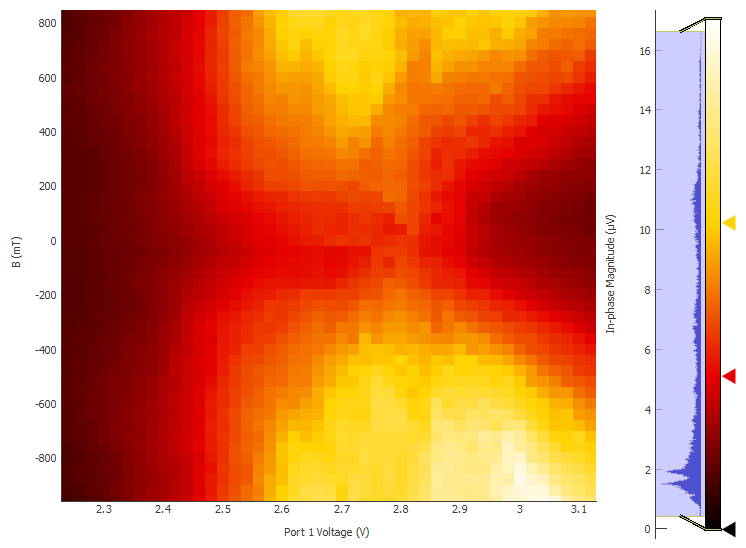

In [567]:
plot121[0]

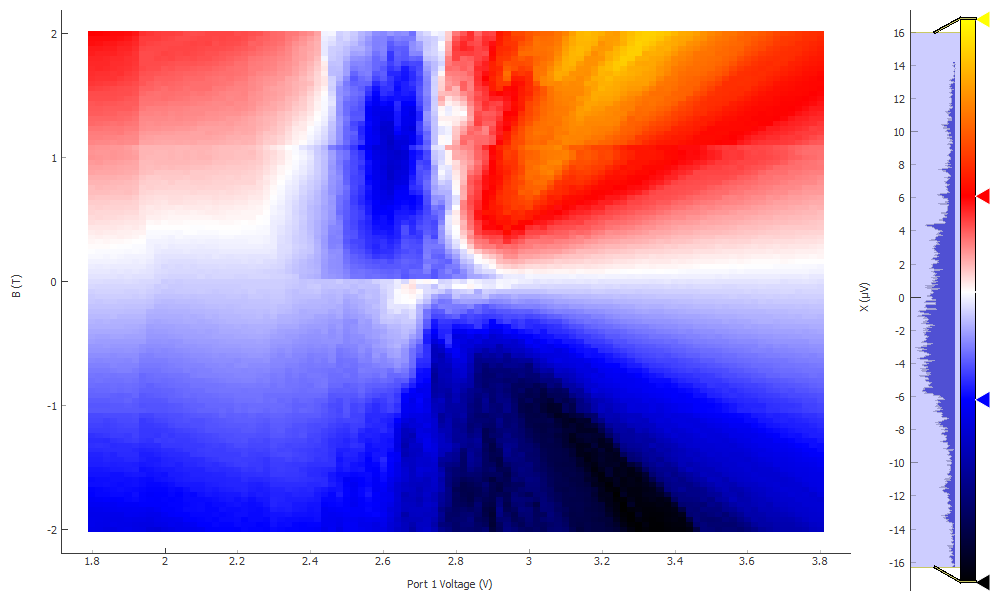

In [569]:
plot121[2]

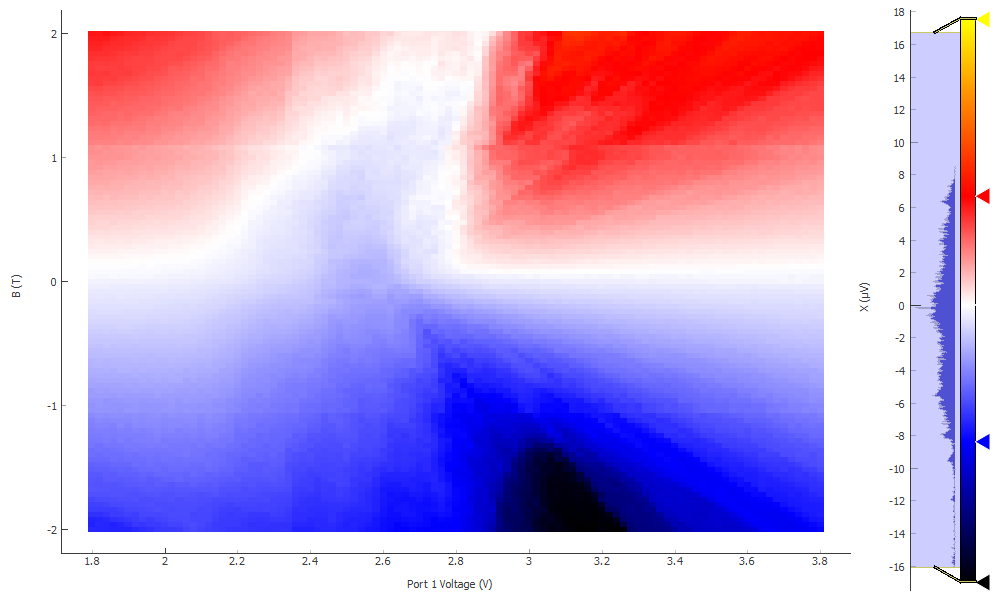

In [570]:
plot121[4]

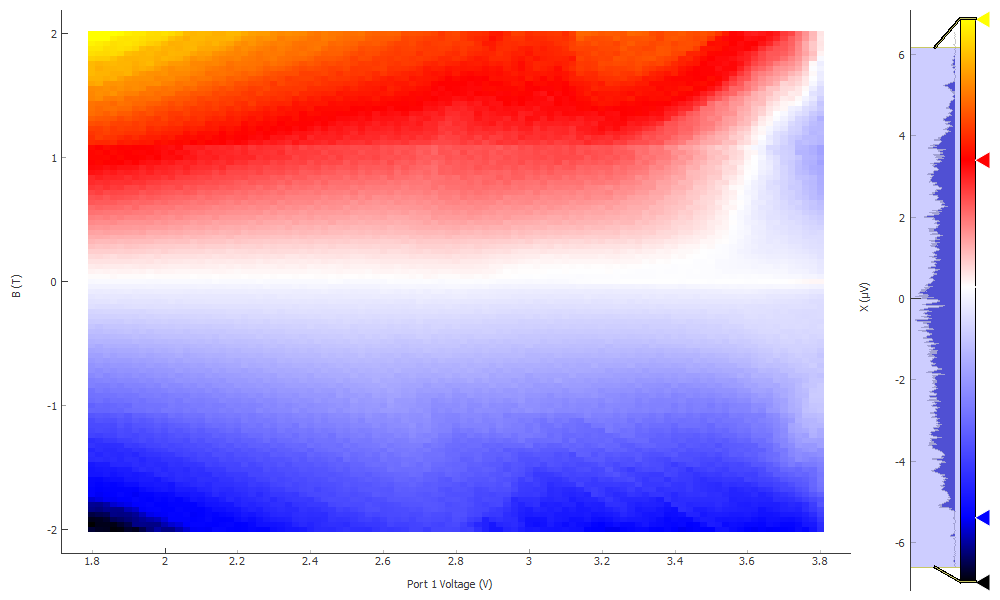

In [571]:
plot121[6]

In [563]:
triton.field_set_stable(0)

In [564]:
#most likely chern number is 3

In [565]:
lockin865.amplitude(0.1)

# base T gate sweep around one quarter

In [566]:
# first 0T gate sweep

In [572]:
srframe.volt_p1(1.8)
time.sleep(15)
bgvals = np.linspace(1.8, 3.8, 201)
data122, plot122 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-11 21:15:45
DataSet:
   location = 'data/2020-12-11/#008_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_21-15-42'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-11 21:20:34


In [573]:
srframe.volt_p1(3.8)
time.sleep(15)
bgvals = np.linspace(3.8, 1.8, 201)
data123, plot123 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-11 21:20:53
DataSet:
   location = 'data/2020-12-11/#009_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_21-20-50'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-11 21:25:41


<IPython.core.display.Javascript object>


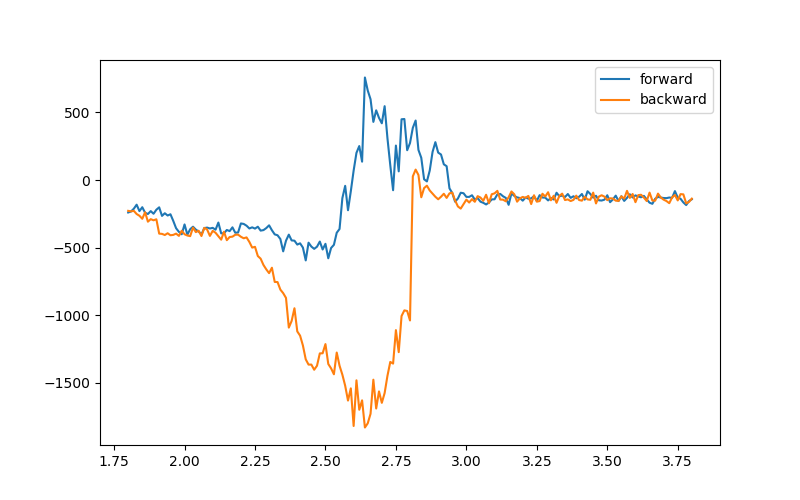

In [575]:
plt.figure(figsize=(8, 5))
plt.plot(data122.srframe_volt_p1_set[:], data122.lockin830_X[:]/1e-9, label='forward')
plt.plot(data123.srframe_volt_p1_set[:], data123.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [576]:
# try again

In [577]:
srframe.volt_p1(1.8)
time.sleep(15)
bgvals = np.linspace(1.8, 3.8, 201)
data122, plot122 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-11 21:49:02
DataSet:
   location = 'data/2020-12-11/#010_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_21-48-58'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-11 21:53:50


In [578]:
srframe.volt_p1(3.8)
time.sleep(15)
bgvals = np.linspace(3.8, 1.8, 201)
data123, plot123 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-11 21:54:09
DataSet:
   location = 'data/2020-12-11/#011_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_21-54-06'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-11 21:58:57


<IPython.core.display.Javascript object>


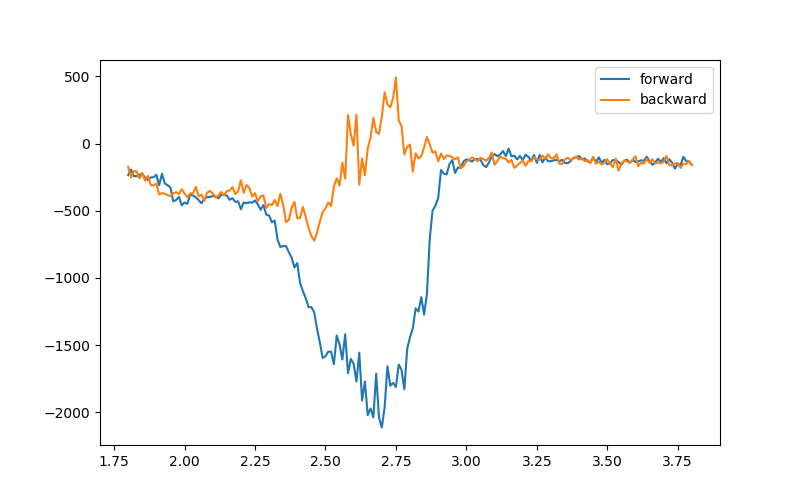

In [579]:
plt.figure(figsize=(8, 5))
plt.plot(data122.srframe_volt_p1_set[:], data122.lockin830_X[:]/1e-9, label='forward')
plt.plot(data123.srframe_volt_p1_set[:], data123.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [580]:
# again

In [581]:
srframe.volt_p1(1.8)
time.sleep(15)
bgvals = np.linspace(1.8, 3.8, 201)
data124, plot124 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-11 22:02:19
DataSet:
   location = 'data/2020-12-11/#012_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_22-02-16'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-11 22:07:08


In [582]:
srframe.volt_p1(3.8)
time.sleep(15)
bgvals = np.linspace(3.8, 1.8, 201)
data125, plot125 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-11 22:07:27
DataSet:
   location = 'data/2020-12-11/#013_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_22-07-24'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-11 22:12:16


<IPython.core.display.Javascript object>


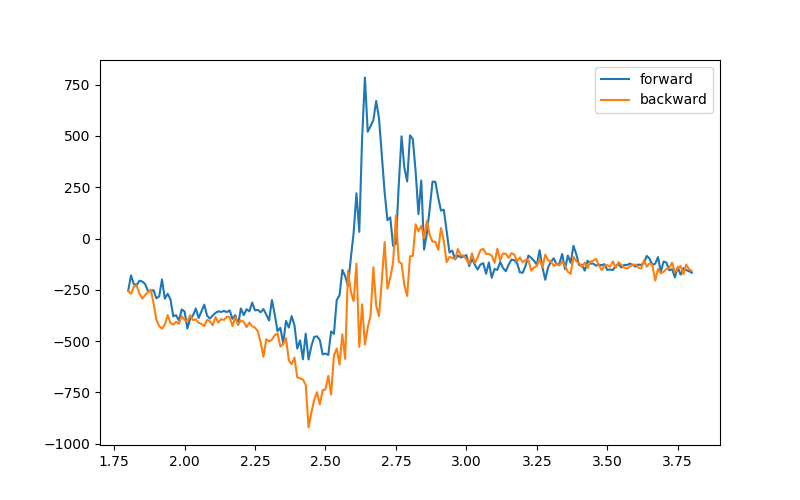

In [583]:
plt.figure(figsize=(8, 5))
plt.plot(data124.srframe_volt_p1_set[:], data124.lockin830_X[:]/1e-9, label='forward')
plt.plot(data125.srframe_volt_p1_set[:], data125.lockin830_X[:]/1e-9, label='backward')
plt.legend()

seems really not stable

probably get the Rxy fan first

In [584]:
srframe.volt_p1(0)

# fan diagram 865 2-25 830 25-28 8302 2-29 8303 3-30

In [585]:
gvals = np.linspace(-11, 12, 576)
Bvals = np.linspace(0, 4, 81)
data126, plot126 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_base_1nA_Landaufan')

Started at 2020-12-11 22:29:27
DataSet:
   location = 'data/2020-12-11/#014_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_base_1nA_Landaufan_22-29-22'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (81,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (81, 576)
   Measured | lockin865_X                 | X                | (81, 576)
   Measured | lockin865_Y                 | Y                | (81, 576)
   Measured | lockin830_X                 | X                | (81, 576)
   Measured | lockin830_Y                 | Y                | (81, 576)
   Measured | lockin830_2_X               | X                | (81, 576)
   Measured | lockin830_2_Y               | Y                | (81, 576)
   Measured | lockin830_3_X               | X                | (81, 576)
   Measured | lockin830_3_Y               | Y                | (81, 576)
Finished at 2020-12-12 17:44:47


In [586]:
triton.magnet_POC(1)

In [587]:
gvals = np.linspace(-11, 12, 576)
Bvals = np.concatenate((np.linspace(4.05, 7.95, 79), [7.998]))
data127, plot127 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_base_1nA_Landaufan')

Started at 2020-12-12 18:16:05
DataSet:
   location = 'data/2020-12-12/#001_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_base_1nA_Landaufan_18-16-00'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (80,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (80, 576)
   Measured | lockin865_X                 | X                | (80, 576)
   Measured | lockin865_Y                 | Y                | (80, 576)
   Measured | lockin830_X                 | X                | (80, 576)
   Measured | lockin830_Y                 | Y                | (80, 576)
   Measured | lockin830_2_X               | X                | (80, 576)
   Measured | lockin830_2_Y               | Y                | (80, 576)
   Measured | lockin830_3_X               | X                | (80, 576)
   Measured | lockin830_3_Y               | Y                | (80, 576)
Finished at 2020-12-14 07:54:54


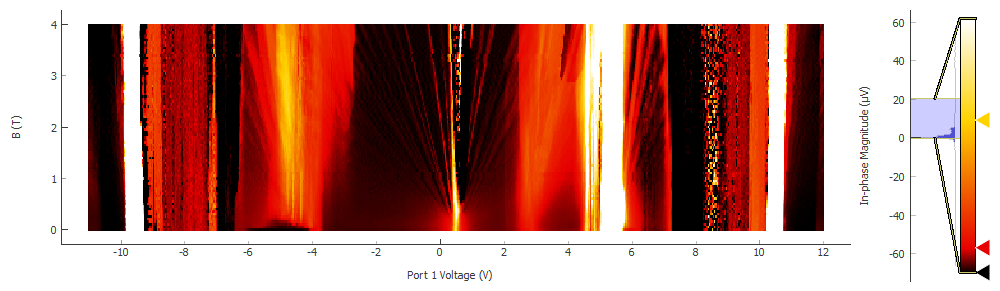

In [593]:
plot126[0]

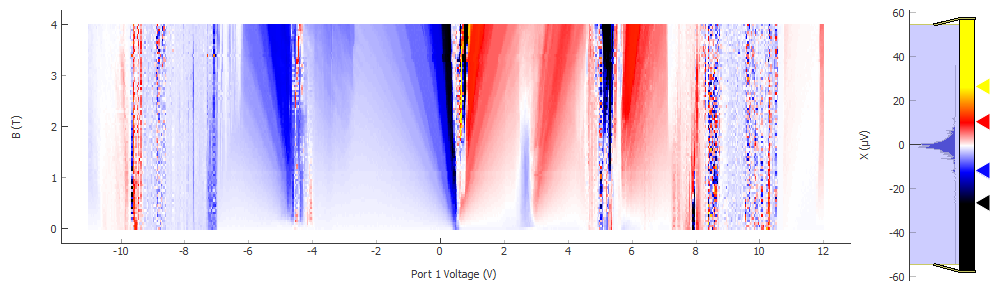

In [591]:
plot126[2]

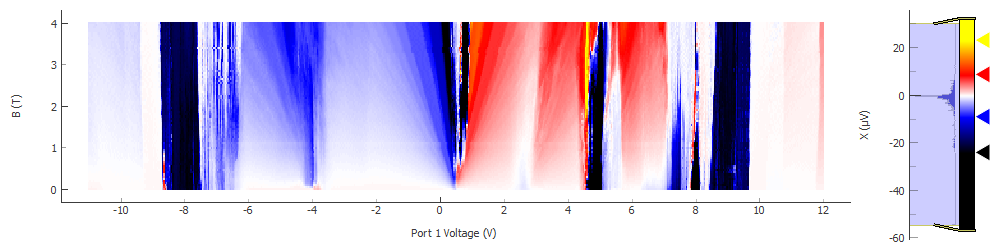

In [594]:
plot126[4]

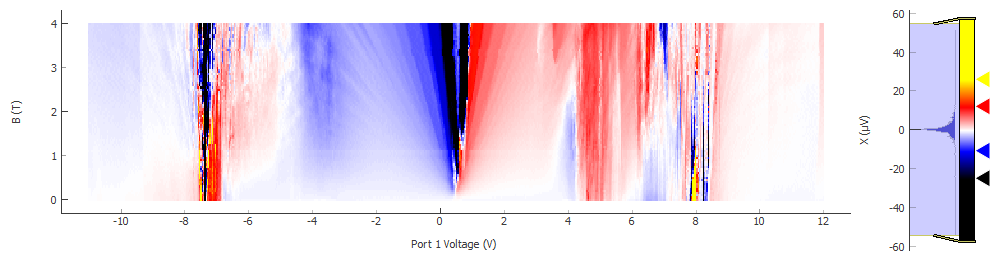

In [595]:
plot126[6]

In [588]:
triton.field_set_stable(4)

In [589]:
triton.field_set_stable(0)

In [590]:
triton.field_set_stable(-0.0008)

# now come back for a gate sweep around one quarter forward backward

In [596]:
srframe.volt_p1(1.8)
time.sleep(15)
bgvals = np.linspace(1.8, 3.8, 201)
data128, plot128 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-14 11:00:19
DataSet:
   location = 'data/2020-12-14/#001_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_11-00-15'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-14 11:05:07


In [597]:
srframe.volt_p1(3.8)
time.sleep(15)
bgvals = np.linspace(3.8, 1.8, 201)
data129, plot129 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-14 11:06:23
DataSet:
   location = 'data/2020-12-14/#002_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_11-06-20'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-14 11:11:11


<IPython.core.display.Javascript object>


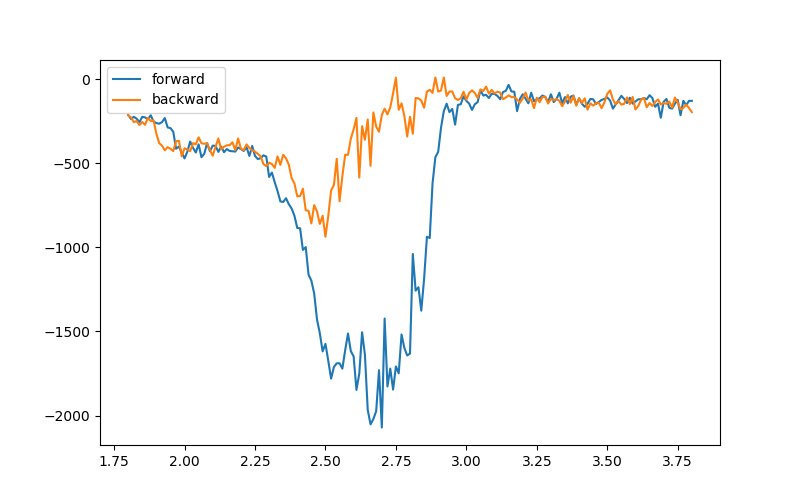

In [600]:
plt.figure(figsize=(8, 5))
plt.plot(data128.srframe_volt_p1_set[:], data128.lockin830_X[:]/1e-9, label='forward')
plt.plot(data129.srframe_volt_p1_set[:], data129.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [598]:
srframe.volt_p1(1.8)
time.sleep(15)
bgvals = np.linspace(1.8, 3.8, 201)
data130, plot130 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-14 11:16:29
DataSet:
   location = 'data/2020-12-14/#003_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_11-16-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-14 11:21:17


In [599]:
srframe.volt_p1(3.8)
time.sleep(15)
bgvals = np.linspace(3.8, 1.8, 201)
data131, plot131 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-14 11:21:36
DataSet:
   location = 'data/2020-12-14/#004_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_11-21-33'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-14 11:26:24


<IPython.core.display.Javascript object>


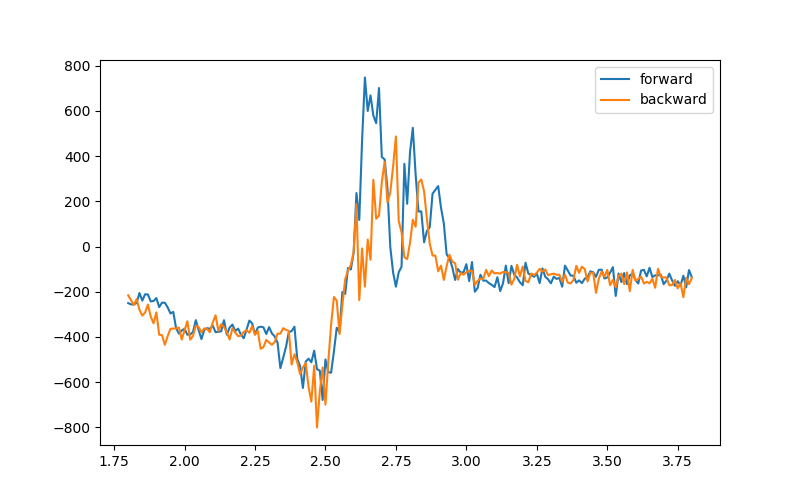

In [602]:
plt.figure(figsize=(8, 5))
plt.plot(data130.srframe_volt_p1_set[:], data130.lockin830_X[:]/1e-9, label='forward')
plt.plot(data131.srframe_volt_p1_set[:], data131.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [603]:
srframe.volt_p1(1.8)
time.sleep(15)
bgvals = np.linspace(1.8, 3.8, 201)
data133, plot133 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-14 11:27:57
DataSet:
   location = 'data/2020-12-14/#005_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_11-27-54'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-14 11:32:45


In [604]:
srframe.volt_p1(3.8)
time.sleep(15)
bgvals = np.linspace(3.8, 1.8, 201)
data134, plot134 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA')

Started at 2020-12-14 11:33:04
DataSet:
   location = 'data/2020-12-14/#006_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_11-33-01'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-14 11:37:52


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


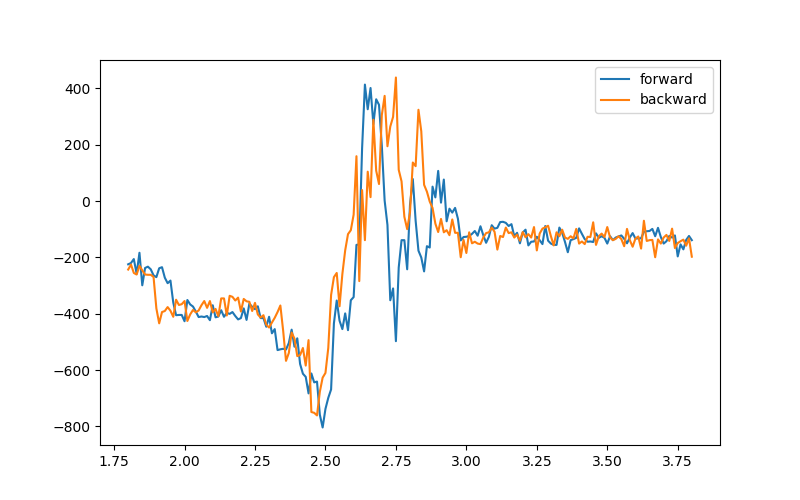

In [605]:
plt.figure(figsize=(8, 5))
plt.plot(data133.srframe_volt_p1_set[:], data133.lockin830_X[:]/1e-9, label='forward')
plt.plot(data134.srframe_volt_p1_set[:], data134.lockin830_X[:]/1e-9, label='backward')
plt.legend()

# try to play with DC bias switch

In [606]:
srframe.volt_p1(2.76)

In [607]:
triton.field_set_stable(-0.5)

In [608]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data135, plot135 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data136, plot136 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-14 11:59:21
DataSet:
   location = 'data/2020-12-14/#007_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_base_11-59-19'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-14 12:09:37
Started at 2020-12-14 12:09:41
DataSet:
   location = 'data/2020-12-14/#008_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_base_12-09-39'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


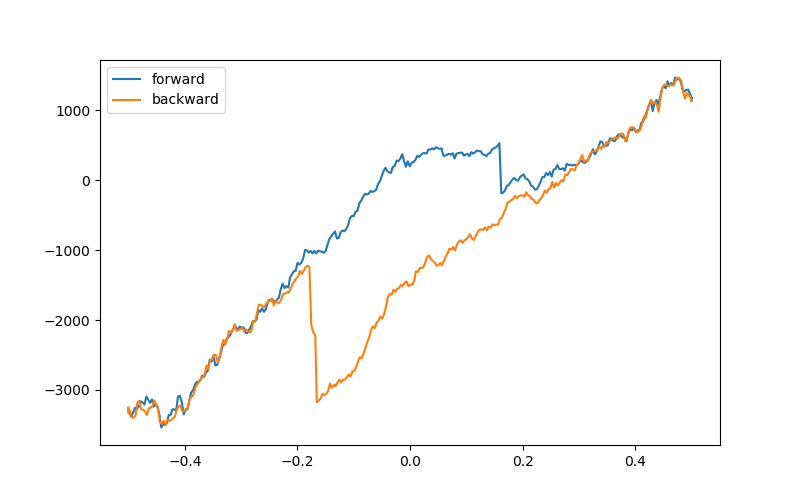

In [609]:
plt.figure(figsize=(8, 5))
plt.plot(data135.triton_field[:], data135.lockin830_X[:]/1e-9, label='forward')
plt.plot(data136.triton_field[:], data136.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [610]:
triton.field_set_stable(0)

In [611]:
srframe.volt_p5(0)
time.sleep(15)
bgvals = np.linspace(0, -7.5, 151)
data137, plot137 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep')

Started at 2020-12-14 12:26:45
DataSet:
   location = 'data/2020-12-14/#009_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_12-26-42'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2020-12-14 12:30:24


In [612]:
srframe.volt_p5(-7.5)
time.sleep(15)
bgvals = np.linspace(-7.5, 7.5, 301)
data138, plot138 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep')

Started at 2020-12-14 12:30:43
DataSet:
   location = 'data/2020-12-14/#010_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_12-30-40'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2020-12-14 12:37:55


In [613]:
srframe.volt_p5(7.5)
time.sleep(15)
bgvals = np.linspace(7.5, -7.5, 301)
data139, plot139 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep')

Started at 2020-12-14 12:38:15
DataSet:
   location = 'data/2020-12-14/#011_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_12-38-11'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2020-12-14 12:45:29


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


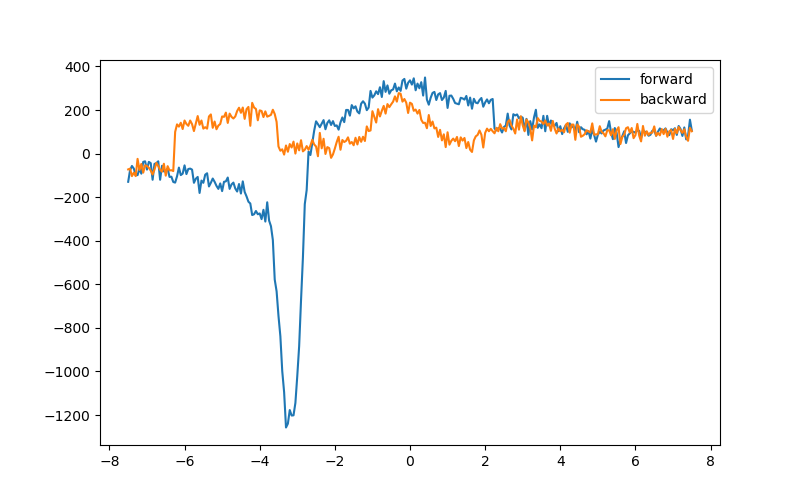

In [614]:
plt.figure(figsize=(8, 5))
plt.plot(data138.srframe_volt_p5_set[:], data138.lockin830_X[:]/1e-9, label='forward')
plt.plot(data139.srframe_volt_p5_set[:], data139.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [651]:
srframe.volt_p5(0)

In [630]:
triton.pid_range(10)

In [641]:
triton.pid_setpoint(1.5)

In [640]:
triton.pid_range(100)

In [642]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data140, plot140 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data141, plot141 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-14 13:12:33
DataSet:
   location = 'data/2020-12-14/#012_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_1p5K_13-12-32'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-14 13:17:50
Started at 2020-12-14 13:17:53
DataSet:
   location = 'data/2020-12-14/#013_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_1p5K_13-17-52'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

In [643]:
triton.field(0.5)
data142, plot142 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-14 13:30:32
DataSet:
   location = 'data/2020-12-14/#014_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_1p5K_13-30-31'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-14 13:40:50


In [644]:
triton.field_set_stable(0)

In [648]:
lockin830.X()

-1.59071e-06

In [649]:
srframe.volt_p5(-7.5)
time.sleep(15)
bgvals = np.linspace(-7.5, 7.5, 301)
data143, plot143 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_1p5K')

Started at 2020-12-14 13:53:28
DataSet:
   location = 'data/2020-12-14/#015_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_1p5K_13-53-25'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2020-12-14 14:00:40


In [650]:
srframe.volt_p5(7.5)
time.sleep(15)
bgvals = np.linspace(7.5, -7.5, 301)
data144, plot144 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_1.5K')

Started at 2020-12-14 14:01:00
DataSet:
   location = 'data/2020-12-14/#016_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_1.5K_14-00-56'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2020-12-14 14:08:12


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


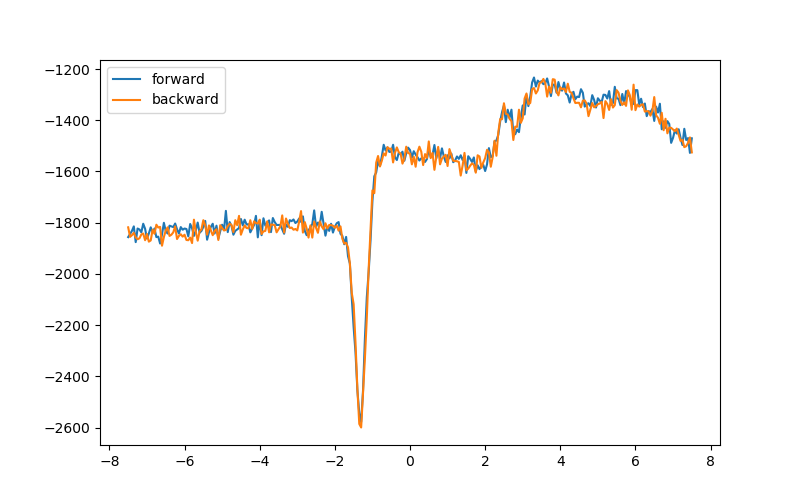

In [652]:
plt.figure(figsize=(8, 5))
plt.plot(data143.srframe_volt_p5_set[:], data143.lockin830_X[:]/1e-9, label='forward')
plt.plot(data144.srframe_volt_p5_set[:], data144.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [654]:
triton.pid_setpoint(2.5)

In [667]:
triton.field(-0.5)

In [656]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data145, plot145 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data146, plot146 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-14 15:02:24
DataSet:
   location = 'data/2020-12-14/#017_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_2p5K_15-02-23'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-14 15:12:42
Started at 2020-12-14 15:12:46
DataSet:
   location = 'data/2020-12-14/#018_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_2p5K_15-12-45'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

<IPython.core.display.Javascript object>


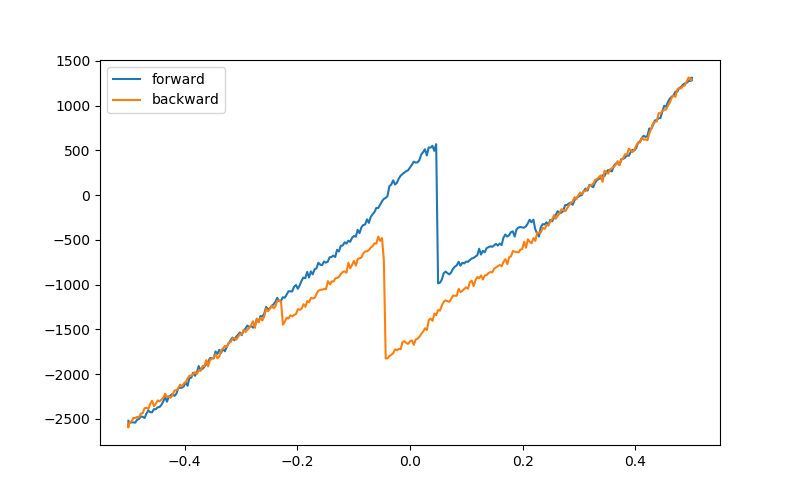

In [658]:
plt.figure(figsize=(8, 5))
plt.plot(data145.triton_field[:], data145.lockin830_X[:]/1e-9, label='forward')
plt.plot(data146.triton_field[:], data146.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [660]:
triton.field(0)

In [661]:
srframe.volt_p5(0)
time.sleep(15)
bgvals = np.linspace(0, 7.5, 151)
data147, plot147 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_2p5K')

Started at 2020-12-14 15:45:35
DataSet:
   location = 'data/2020-12-14/#019_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_2p5K_15-45-32'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2020-12-14 15:49:13


In [662]:
srframe.volt_p5(7.5)
time.sleep(15)
bgvals = np.linspace(7.5, -7.5, 151)
data148, plot148 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_2p5K')

Started at 2020-12-14 15:50:48
DataSet:
   location = 'data/2020-12-14/#020_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_2p5K_15-50-45'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2020-12-14 15:54:25


In [663]:
srframe.volt_p5(-7.5)
time.sleep(15)
bgvals = np.linspace(-7.5, 7.5, 151)
data149, plot149 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_2p5K')

Started at 2020-12-14 15:54:45
DataSet:
   location = 'data/2020-12-14/#021_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_2p5K_15-54-41'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2020-12-14 15:58:22


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


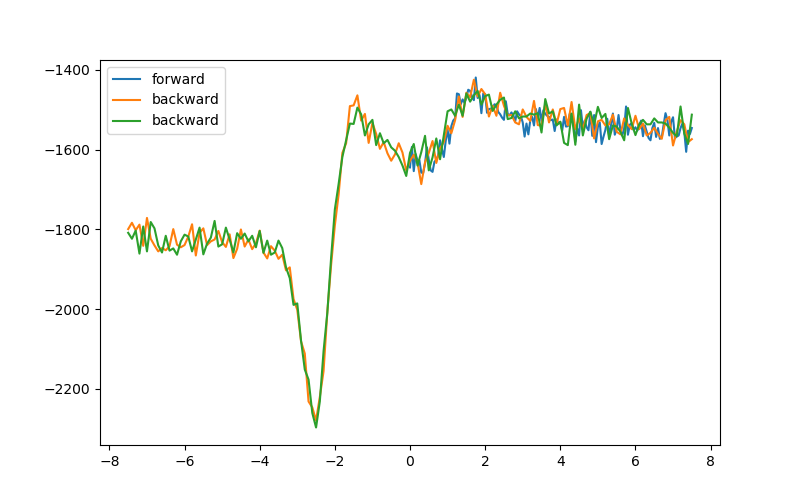

In [664]:
plt.figure(figsize=(8, 5))
plt.plot(data147.srframe_volt_p5_set[:], data147.lockin830_X[:]/1e-9, label='forward')
plt.plot(data148.srframe_volt_p5_set[:], data148.lockin830_X[:]/1e-9, label='backward')
plt.plot(data149.srframe_volt_p5_set[:], data149.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [666]:
srframe.volt_p5(0)

In [665]:
triton.pid_setpoint(3.5)

In [668]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data150, plot150 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data151, plot151 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-14 16:31:44
DataSet:
   location = 'data/2020-12-14/#022_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_3p5K_16-31-43'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-14 16:42:02
Started at 2020-12-14 16:42:06
DataSet:
   location = 'data/2020-12-14/#023_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_3p5K_16-42-05'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


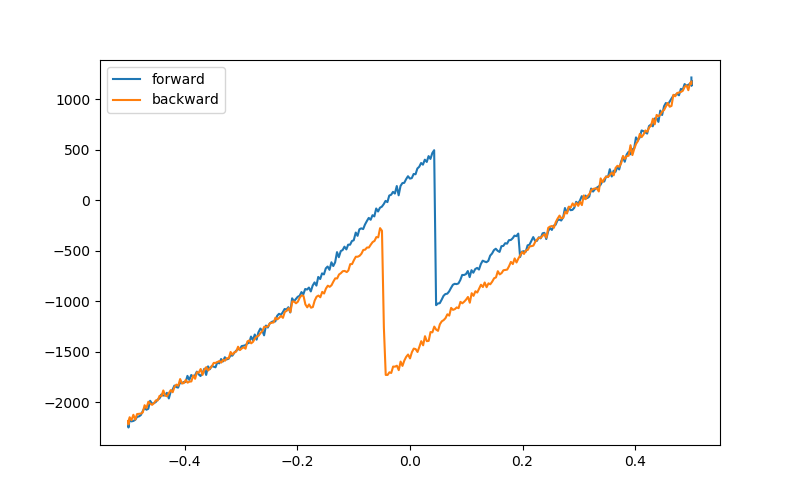

In [669]:
plt.figure(figsize=(8, 5))
plt.plot(data150.triton_field[:], data150.lockin830_X[:]/1e-9, label='forward')
plt.plot(data151.triton_field[:], data151.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [671]:
triton.field_set_stable(-0.0008)

In [672]:
srframe.volt_p5(0)
time.sleep(15)
bgvals = np.linspace(0, 7.5, 151)
data152, plot152 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_3p5K')

Started at 2020-12-14 17:00:29
DataSet:
   location = 'data/2020-12-14/#024_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_3p5K_17-00-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2020-12-14 17:04:07


In [673]:
srframe.volt_p5(7.5)
time.sleep(15)
bgvals = np.linspace(7.5, -7.5, 151)
data153, plot153 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_3p5K')

Started at 2020-12-14 17:04:26
DataSet:
   location = 'data/2020-12-14/#025_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_3p5K_17-04-23'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2020-12-14 17:08:04


In [674]:
srframe.volt_p5(-7.5)
time.sleep(15)
bgvals = np.linspace(-7.5, 7.5, 151)
data154, plot154 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_3p5K')

Started at 2020-12-14 17:08:23
DataSet:
   location = 'data/2020-12-14/#026_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_3p5K_17-08-20'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2020-12-14 17:12:01


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


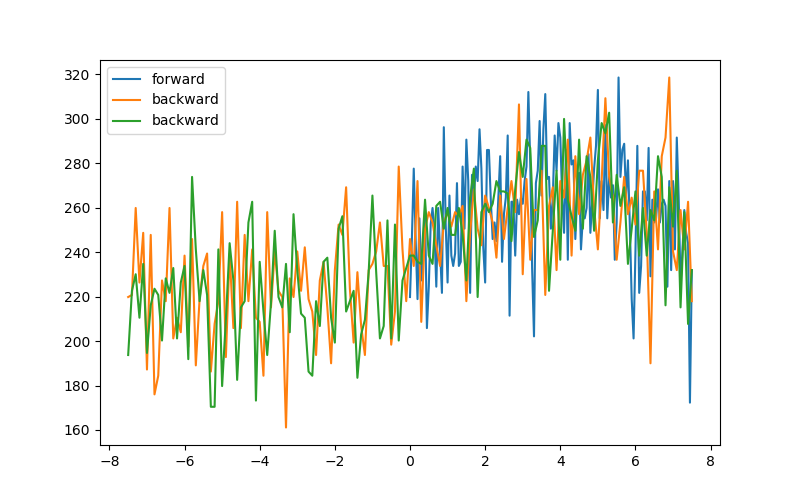

In [676]:
plt.figure(figsize=(8, 5))
plt.plot(data152.srframe_volt_p5_set[:], data152.lockin830_X[:]/1e-9, label='forward')
plt.plot(data153.srframe_volt_p5_set[:], data153.lockin830_X[:]/1e-9, label='backward')
plt.plot(data154.srframe_volt_p5_set[:], data154.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [675]:
triton.pid_setpoint(4.5)

In [677]:
triton.field_set_stable(-0.5)

In [ ]:
triton.field_set_stable(-0.5)

In [678]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data155, plot155 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_4p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data156, plot156 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_4p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-14 17:26:44
DataSet:
   location = 'data/2020-12-14/#027_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepup_1nA_4p5K_17-26-43'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-14 17:36:59
Started at 2020-12-14 17:37:03
DataSet:
   location = 'data/2020-12-14/#028_S13_865_2-25_830_25-28_8302_2-29_vbg2p76FieldSweepdown_1nA_4p5K_17-37-02'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

In [681]:
triton.field_set_stable(0.3)

In [682]:
triton.field_set_stable(0)

<IPython.core.display.Javascript object>


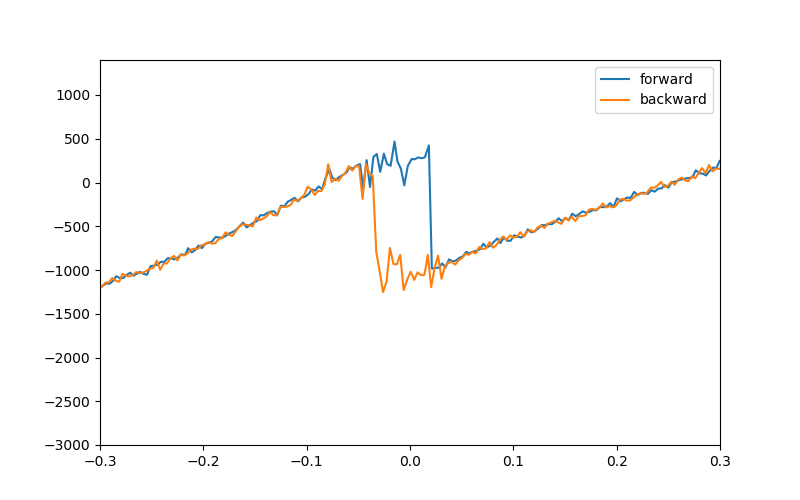

In [680]:
plt.figure(figsize=(8, 5))
plt.plot(data155.triton_field[:], data155.lockin830_X[:]/1e-9, label='forward')
plt.plot(data156.triton_field[:], data156.lockin830_X[:]/1e-9, label='backward')
plt.xlim(-0.3,0.3)
plt.ylim(-3000,1400)
plt.legend()

In [690]:
lockin830.X()

-1.0226e-06

In [691]:
srframe.volt_p5(0)
time.sleep(15)
bgvals = np.linspace(0, 7.5, 151)
data157, plot157 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_4p5K')

Started at 2020-12-14 18:03:23
DataSet:
   location = 'data/2020-12-14/#029_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_4p5K_18-03-19'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2020-12-14 18:07:01


In [692]:
srframe.volt_p5(7.5)
time.sleep(15)
bgvals = np.linspace(7.5, -7.5, 151)
data158, plot158 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_4p5K')

Started at 2020-12-14 18:07:20
DataSet:
   location = 'data/2020-12-14/#030_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_4p5K_18-07-17'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2020-12-14 18:10:58


In [693]:
srframe.volt_p5(-7.5)
time.sleep(15)
bgvals = np.linspace(-7.5, 7.5, 151)
data159, plot159 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_4p5K')

Started at 2020-12-14 18:11:17
DataSet:
   location = 'data/2020-12-14/#031_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vg2p76_1nA_DCsweep_4p5K_18-11-14'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2020-12-14 18:14:55


<IPython.core.display.Javascript object>


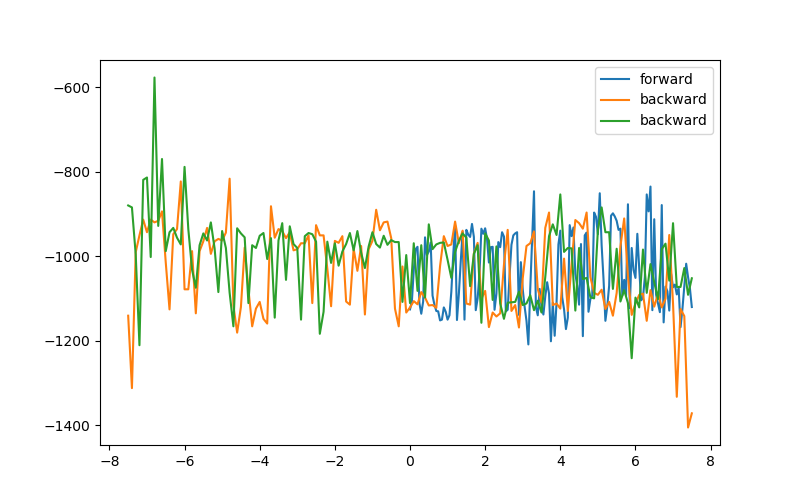

In [695]:
plt.figure(figsize=(8, 5))
plt.plot(data157.srframe_volt_p5_set[:], data157.lockin830_X[:]/1e-9, label='forward')
plt.plot(data158.srframe_volt_p5_set[:], data158.lockin830_X[:]/1e-9, label='backward')
plt.plot(data159.srframe_volt_p5_set[:], data159.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [697]:
srframe.volt_p5(0)

In [698]:
lockin865.amplitude(0.1)

In [699]:
triton.pid_mode(0)

seems no AC switch for now

# now probably try onsager symmerization for better fan around one quarter

In [702]:
lockin865.amplitude(0.1)

In [703]:
srframe.volt_p1(2.76)

now source current from 2 ground 27, 830 +25 - 28, 865 +29 - 28

In [704]:
triton.field_set_stable(-0.5)

In [705]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data160, plot160 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data161, plot161 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2020-12-14 21:01:30
DataSet:
   location = 'data/2020-12-14/#032_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_base_21-01-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-12-14 21:11:46
Started at 2020-12-14 21:11:49
DataSet:
   location = 'data/2020-12-14/#033_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_base_21-11-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured

<IPython.core.display.Javascript object>


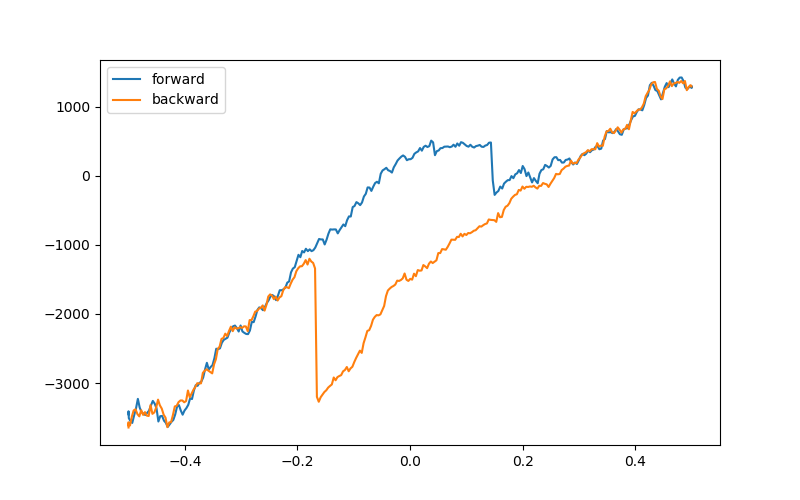

In [708]:
plt.figure(figsize=(8, 5))
plt.plot(data160.triton_field[:], data160.lockin830_X[:]/1e-9, label='forward')
plt.plot(data161.triton_field[:], data161.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [709]:
srframe.volt_p1(1.8)

In [712]:
lockin865.amplitude(0.2)

In [713]:
bgnvals = np.linspace(1.8, 3.8, 101)
bvals = np.linspace(2, -2, 201)
data162, plot162 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_29-28_830_25-28_2nA_baseT_B-n_1quarter')
srframe.volt_p1(0)

Started at 2020-12-14 21:58:45
DataSet:
   location = 'data/2020-12-14/#034_S13_865_29-28_830_25-28_2nA_baseT_B-n_1quarter_21-58-42'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (201,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (201, 101)
   Measured | lockin865_X                 | X                | (201, 101)
   Measured | lockin865_Y                 | Y                | (201, 101)
   Measured | lockin830_X                 | X                | (201, 101)
   Measured | lockin830_Y                 | Y                | (201, 101)
Finished at 2020-12-15 07:11:53


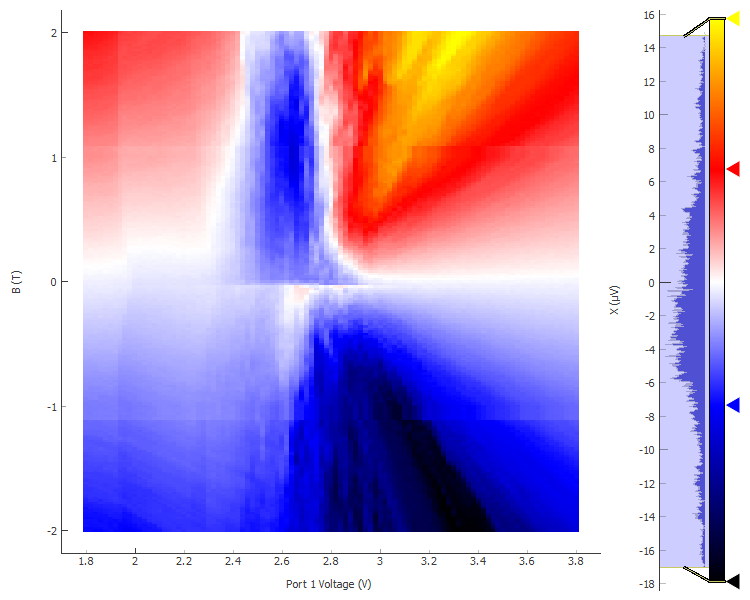

In [718]:
plot162[2]

In [714]:
triton.field_set_stable(0)

In [715]:
lockin865.amplitude(0.2)

In [716]:
triton.field_set_stable(2)

In [717]:
srframe.volt_p1(1.8)

now source current from 25 ground 28, 830 +2 - 27

In [719]:
bgnvals = np.linspace(1.8, 3.8, 101)
bvals = np.linspace(2, -2, 201)
data163, plot163 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin830.X, lockin830.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_830_2-27_2nA_baseT_B-n_1quarter')
srframe.volt_p1(0)

Started at 2020-12-15 10:38:04
DataSet:
   location = 'data/2020-12-15/#001_S13_830_2-27_2nA_baseT_B-n_1quarter_10-38-02'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (201,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (201, 101)
   Measured | lockin830_X                 | X                | (201, 101)
   Measured | lockin830_Y                 | Y                | (201, 101)
Finished at 2020-12-15 20:00:39


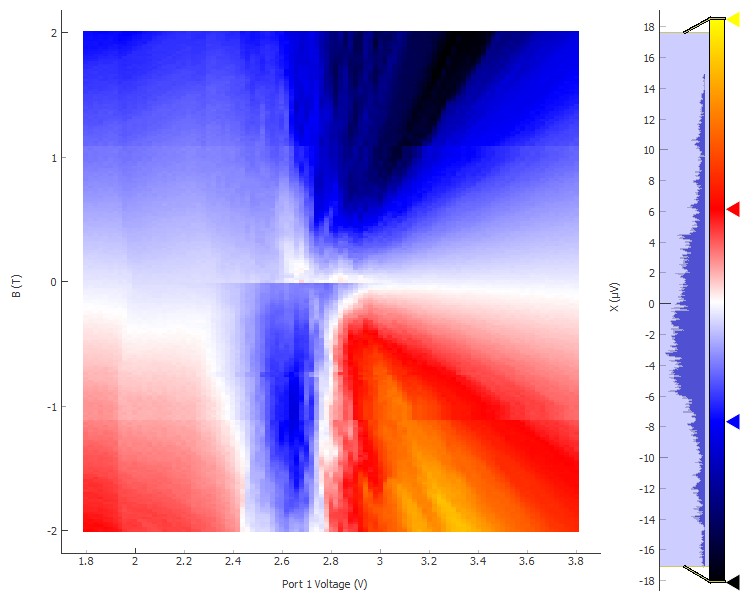

In [746]:
plot163[0]

In [720]:
triton.field_set_stable(0)

In [721]:
srframe.volt_p1(0)

In [724]:
lockin865.amplitude(0.2)

In [738]:
triton.pid_range(100)

In [744]:
triton.pid_setpoint(3)

In [730]:
triton.pid_mode(1)

In [745]:
srframe.volt_p1(1.8)

# go back to original configuration small fan around one quarter 3K

source current from 7 drain 27, lockin865 2-25, 830 25-28, 8302 2-29, 8303 3-30

In [748]:
bgnvals = np.linspace(1.8, 3.8, 201)
bvals = np.linspace(2, -2, 101)
data164, plot164 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_3K_B-n_1quarter')

Started at 2020-12-15 21:56:37
DataSet:
   location = 'data/2020-12-15/#002_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_3K_B-n_1quarter_21-56-32'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (101,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (101, 201)
   Measured | lockin865_X                 | X                | (101, 201)
   Measured | lockin865_Y                 | Y                | (101, 201)
   Measured | lockin830_X                 | X                | (101, 201)
   Measured | lockin830_Y                 | Y                | (101, 201)
   Measured | lockin830_2_X               | X                | (101, 201)
   Measured | lockin830_2_Y               | Y                | (101, 201)
   Measured | lockin830_3_X               | X                | (101, 201)
   Measured | lockin830_3_Y               | Y                | (101, 201)
Finished at 2020-12-16 10:09:55
Keyboa

magnet restarted itself

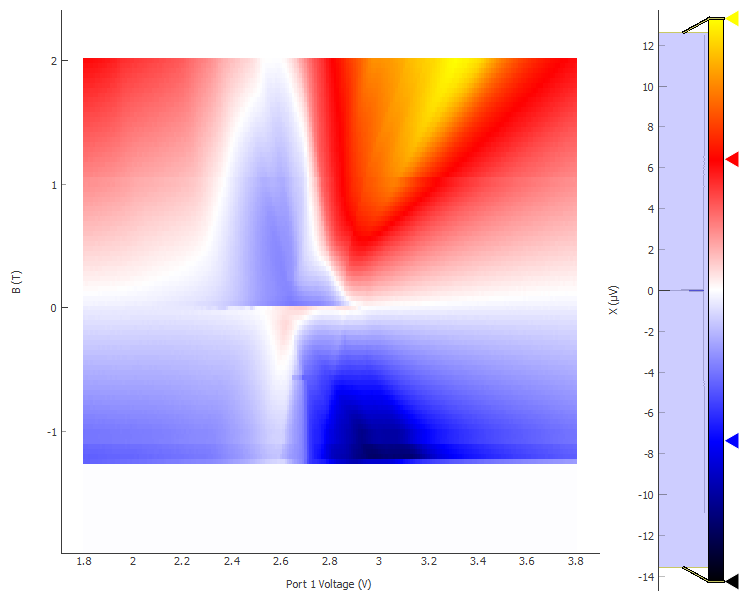

In [752]:
plot164[2]

In [753]:
bgnvals = np.linspace(1.8, 3.8, 201)
bvals = np.linspace(-1, -2, 26)
data165, plot165 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_3K_B-n_1quarter')

Started at 2020-12-16 11:01:09
DataSet:
   location = 'data/2020-12-16/#001_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_3K_B-n_1quarter_11-01-04'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (26,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (26, 201)
   Measured | lockin865_X                 | X                | (26, 201)
   Measured | lockin865_Y                 | Y                | (26, 201)
   Measured | lockin830_X                 | X                | (26, 201)
   Measured | lockin830_Y                 | Y                | (26, 201)
   Measured | lockin830_2_X               | X                | (26, 201)
   Measured | lockin830_2_Y               | Y                | (26, 201)
   Measured | lockin830_3_X               | X                | (26, 201)
   Measured | lockin830_3_Y               | Y                | (26, 201)
Finished at 2020-12-16 13:17:11


In [754]:
triton.pid_setpoint(5)

In [755]:
bgnvals = np.linspace(1.8, 3.8, 201)
bvals = np.linspace(-2, 2, 101)
data166, plot166 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_5K_B-n_1quarter')

Started at 2020-12-16 13:26:28
DataSet:
   location = 'data/2020-12-16/#002_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_5K_B-n_1quarter_13-26-22'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (101,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (101, 201)
   Measured | lockin865_X                 | X                | (101, 201)
   Measured | lockin865_Y                 | Y                | (101, 201)
   Measured | lockin830_X                 | X                | (101, 201)
   Measured | lockin830_Y                 | Y                | (101, 201)
   Measured | lockin830_2_X               | X                | (101, 201)
   Measured | lockin830_2_Y               | Y                | (101, 201)
   Measured | lockin830_3_X               | X                | (101, 201)
   Measured | lockin830_3_Y               | Y                | (101, 201)
Finished at 2020-12-16 14:56:50
Keyboa

magnet restarted again

In [6]:
bgnvals = np.linspace(1.8, 3.8, 201)
bvals = np.linspace(-1.52, 2, 89)
data167, plot167 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_5K_B-n_1quarter')

Started at 2020-12-16 15:57:55
Are you sure you want to use the magnet? [y/n]: y
DataSet:
   location = 'data/2020-12-16/#005_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_5K_B-n_1quarter_15-57-47'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (89,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (89, 201)
   Measured | lockin865_X                 | X                | (89, 201)
   Measured | lockin865_Y                 | Y                | (89, 201)
   Measured | lockin830_X                 | X                | (89, 201)
   Measured | lockin830_Y                 | Y                | (89, 201)
   Measured | lockin830_2_X               | X                | (89, 201)
   Measured | lockin830_2_Y               | Y                | (89, 201)
   Measured | lockin830_3_X               | X                | (89, 201)
   Measured | lockin830_3_Y               | Y                | (89, 201

timeout: ('timed out', "writing 'SET:SYS:VRM:ACTN:RTOS' to <Triton: triton>", 'setting triton_field_set_stable to 1.3599999999999999')

In [6]:
bgnvals = np.linspace(1.8, 3.8, 201)
bvals = np.linspace(1.28, 2, 19)
data168, plot168 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_5K_B-n_1quarter')

Started at 2020-12-16 23:58:51
Are you sure you want to use the magnet? [y/n]: y
DataSet:
   location = 'data/2020-12-16/#007_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_5K_B-n_1quarter_23-58-44'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (19,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (19, 201)
   Measured | lockin865_X                 | X                | (19, 201)
   Measured | lockin865_Y                 | Y                | (19, 201)
   Measured | lockin830_X                 | X                | (19, 201)
   Measured | lockin830_Y                 | Y                | (19, 201)
   Measured | lockin830_2_X               | X                | (19, 201)
   Measured | lockin830_2_Y               | Y                | (19, 201)
   Measured | lockin830_3_X               | X                | (19, 201)
   Measured | lockin830_3_Y               | Y                | (19, 201

In [19]:
triton.field()

0.0

In [7]:
triton.pid_setpoint(7.5)

In [8]:
time.sleep(1800)

In [9]:
bgnvals = np.linspace(1.8, 3.8, 201)
bvals = np.linspace(2, -2, 101)
data169, plot169 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_7p5K_B-n_1quarter')

Started at 2020-12-17 02:08:42
DataSet:
   location = 'data/2020-12-17/#001_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_2nA_7p5K_B-n_1quarter_02-08-37'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (101,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (101, 201)
   Measured | lockin865_X                 | X                | (101, 201)
   Measured | lockin865_Y                 | Y                | (101, 201)
   Measured | lockin830_X                 | X                | (101, 201)
   Measured | lockin830_Y                 | Y                | (101, 201)
   Measured | lockin830_2_X               | X                | (101, 201)
   Measured | lockin830_2_Y               | Y                | (101, 201)
   Measured | lockin830_3_X               | X                | (101, 201)
   Measured | lockin830_3_Y               | Y                | (101, 201)
Finished at 2020-12-17 10:59:54


In [10]:
triton.field_set_stable(0)

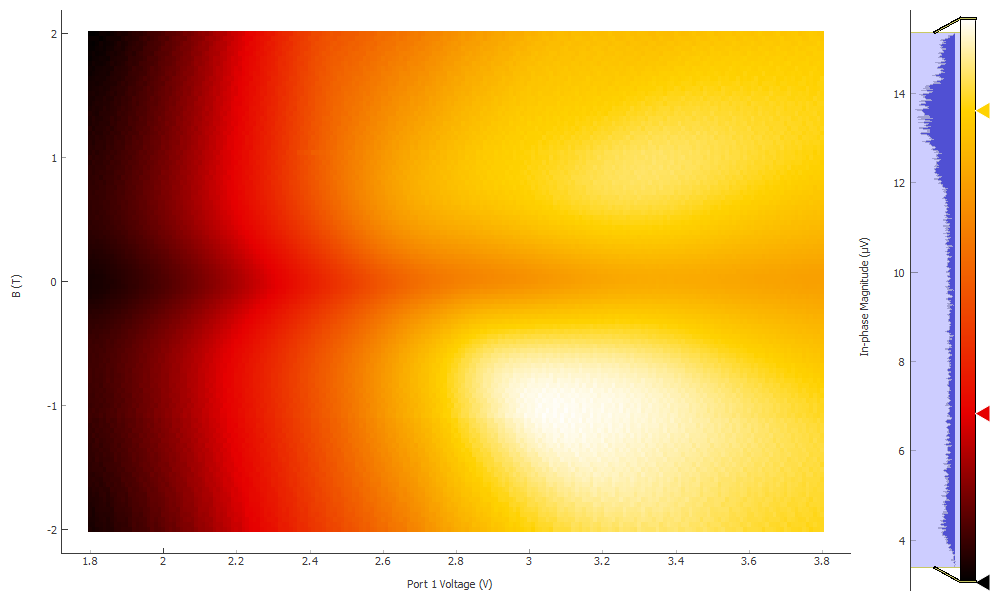

In [11]:
plot169[0]

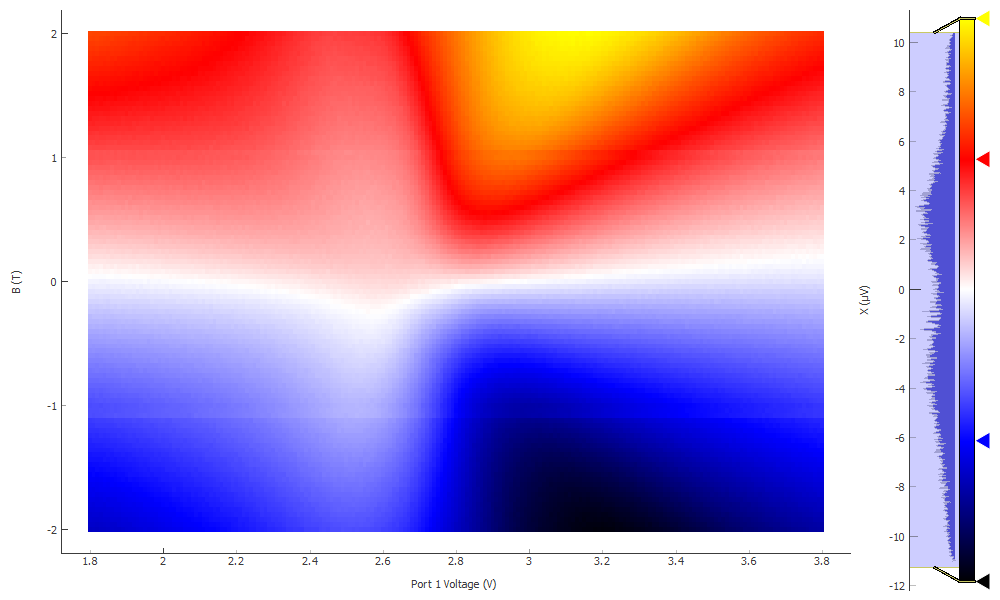

In [12]:
plot169[2]

# now come to 4K to see switching magnetic order with gate

In [23]:
srframe.volt_p1(2.76)

In [24]:
triton.field_set_stable(-0.5)

In [16]:
lockin865.amplitude(0.1)

In [17]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data170, plot170 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data171, plot171 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 11:55:50
DataSet:
   location = 'data/2020-12-17/#002_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_4K_11-55-48'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 12:06:04
Started at 2020-12-17 12:06:08
DataSet:
   location = 'data/2020-12-17/#003_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_4K_12-06-06'
   <Type>   | <array_id

In [18]:
triton.field_set_stable(-0.0008)

In [19]:
srframe.volt_p1(2.76)
time.sleep(15)
bgvals = np.linspace(2.76, 3.8, 105)
data172, plot172 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 12:24:13
DataSet:
   location = 'data/2020-12-17/#004_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_12-24-12'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (105,)
   Measured | lockin865_X         | X            | (105,)
   Measured | lockin865_Y         | Y            | (105,)
   Measured | lockin830_X         | X            | (105,)
   Measured | lockin830_Y         | Y            | (105,)
   Measured | lockin830_2_X       | X            | (105,)
   Measured | lockin830_2_Y       | Y            | (105,)
   Measured | lockin830_3_X       | X            | (105,)
   Measured | lockin830_3_Y       | Y            | (105,)
Finished at 2020-12-17 12:26:35


In [20]:
srframe.volt_p1(3.8)
time.sleep(15)
bgvals = np.linspace(3.8, 1.8, 201)
data173, plot173 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 12:26:52
DataSet:
   location = 'data/2020-12-17/#005_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_12-26-50'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-17 12:31:23


In [21]:
srframe.volt_p1(1.8)
time.sleep(15)
bgvals = np.linspace(1.8, 3.8, 201)
data174, plot174 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 12:31:40
DataSet:
   location = 'data/2020-12-17/#006_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_12-31-39'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
   Measured | lockin830_2_X       | X            | (201,)
   Measured | lockin830_2_Y       | Y            | (201,)
   Measured | lockin830_3_X       | X            | (201,)
   Measured | lockin830_3_Y       | Y            | (201,)
Finished at 2020-12-17 12:36:12


<IPython.core.display.Javascript object>


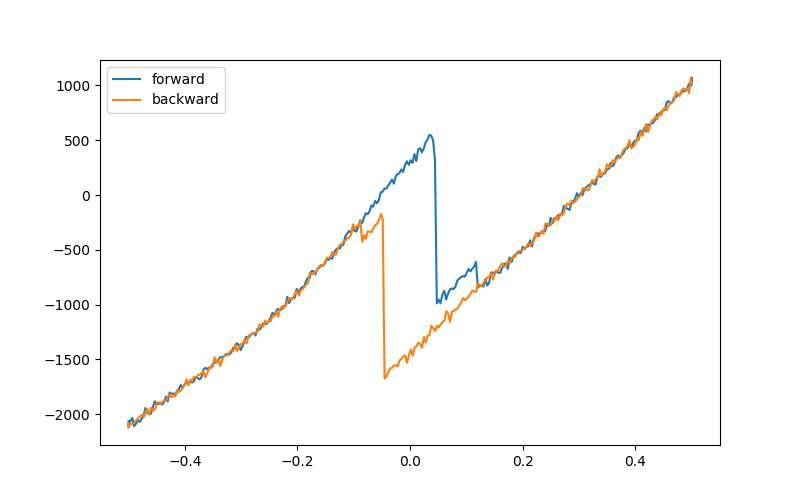

In [22]:
plt.figure(figsize=(8, 5))
plt.plot(data170.triton_field[:], data170.lockin830_X[:]/1e-9, label='forward')
plt.plot(data171.triton_field[:], data171.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [25]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data175, plot175 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data176, plot176 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 14:06:13
DataSet:
   location = 'data/2020-12-17/#007_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_4K_14-06-11'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 14:16:30
Started at 2020-12-17 14:16:34
DataSet:
   location = 'data/2020-12-17/#008_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_4K_14-16-32'
   <Type>   | <array_id

<IPython.core.display.Javascript object>


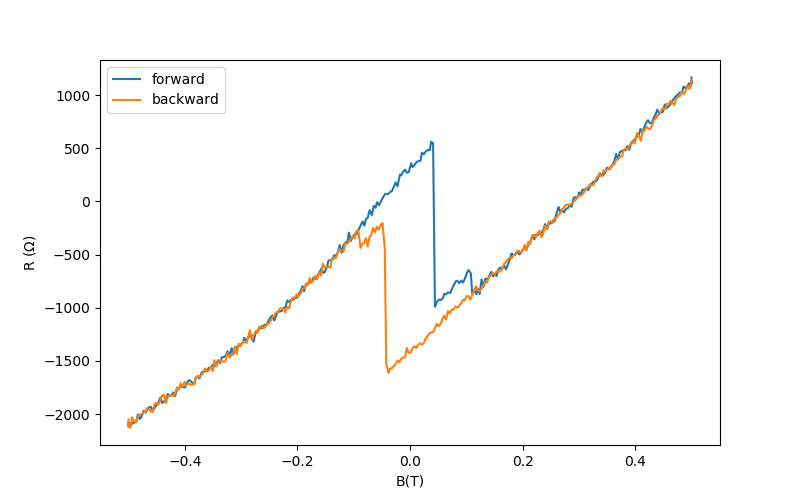

In [116]:
plt.figure(figsize=(8, 5))
plt.plot(data175.triton_field[:], data175.lockin830_X[:]/1e-9, label='forward')
plt.plot(data176.triton_field[:], data176.lockin830_X[:]/1e-9, label='backward')
plt.xlabel('B(T)')
plt.ylabel('R ($\Omega$)')
plt.legend()

In [27]:
triton.field_set_stable(0.2)

In [28]:
triton.field_set_stable(0.03)

In [29]:
srframe.volt_p1(2.76)
time.sleep(15)
bgvals = np.linspace(2.76, 2.4, 73)
data177, plot177 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 14:40:33
DataSet:
   location = 'data/2020-12-17/#009_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-40-32'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (73,)
   Measured | lockin865_X         | X            | (73,)
   Measured | lockin865_Y         | Y            | (73,)
   Measured | lockin830_X         | X            | (73,)
   Measured | lockin830_Y         | Y            | (73,)
   Measured | lockin830_2_X       | X            | (73,)
   Measured | lockin830_2_Y       | Y            | (73,)
   Measured | lockin830_3_X       | X            | (73,)
   Measured | lockin830_3_Y       | Y            | (73,)
Finished at 2020-12-17 14:42:12


In [30]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data178, plot178 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 14:43:16
DataSet:
   location = 'data/2020-12-17/#010_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-43-14'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 14:45:59


In [31]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data179, plot179 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 14:46:16
DataSet:
   location = 'data/2020-12-17/#011_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-46-15'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 14:49:00


In [33]:
#again

In [34]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data180, plot180 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 14:51:16
DataSet:
   location = 'data/2020-12-17/#012_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-51-14'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 14:53:59


In [35]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data181, plot181 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 14:54:16
DataSet:
   location = 'data/2020-12-17/#013_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-54-15'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 14:57:00


In [37]:
#again

In [38]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data182, plot182 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 14:58:54
DataSet:
   location = 'data/2020-12-17/#014_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-58-52'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 15:01:37


In [39]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data183, plot183 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 15:01:54
DataSet:
   location = 'data/2020-12-17/#015_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-01-53'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 15:04:38


In [41]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3.2, 161)
data184, plot184 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 15:06:24
DataSet:
   location = 'data/2020-12-17/#016_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-06-22'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
   Measured | lockin830_2_X       | X            | (161,)
   Measured | lockin830_2_Y       | Y            | (161,)
   Measured | lockin830_3_X       | X            | (161,)
   Measured | lockin830_3_Y       | Y            | (161,)
Finished at 2020-12-17 15:10:01


In [42]:
srframe.volt_p1(3.2)
time.sleep(15)
bgvals = np.linspace(3.2, 2.4, 161)
data185, plot185 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 15:10:19
DataSet:
   location = 'data/2020-12-17/#017_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-10-17'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (161,)
   Measured | lockin865_X         | X            | (161,)
   Measured | lockin865_Y         | Y            | (161,)
   Measured | lockin830_X         | X            | (161,)
   Measured | lockin830_Y         | Y            | (161,)
   Measured | lockin830_2_X       | X            | (161,)
   Measured | lockin830_2_Y       | Y            | (161,)
   Measured | lockin830_3_X       | X            | (161,)
   Measured | lockin830_3_Y       | Y            | (161,)
Finished at 2020-12-17 15:13:56


In [44]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data186, plot186 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 15:15:36
DataSet:
   location = 'data/2020-12-17/#018_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-15-34'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 15:18:19


In [45]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data187, plot187 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 15:18:36
DataSet:
   location = 'data/2020-12-17/#019_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-18-35'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 15:21:19


In [48]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data188, plot188 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 15:23:15
DataSet:
   location = 'data/2020-12-17/#020_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-23-13'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 15:25:58


In [49]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data189, plot189 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 15:26:15
DataSet:
   location = 'data/2020-12-17/#021_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-26-13'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 15:28:59


<IPython.core.display.Javascript object>


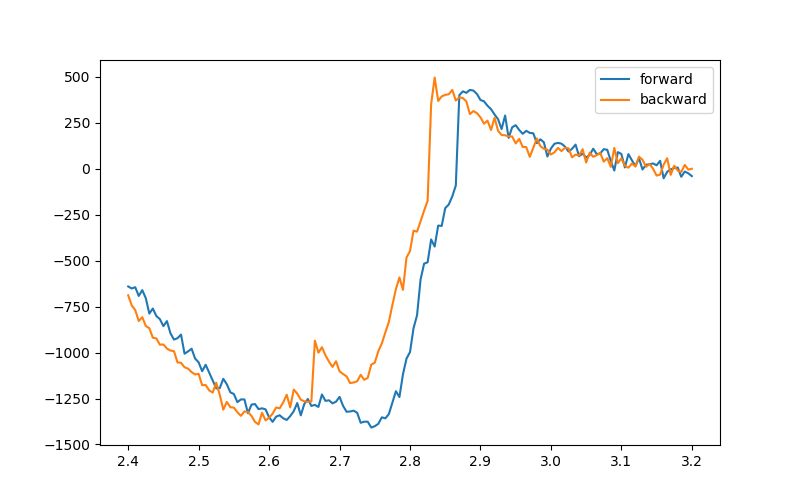

In [43]:
plt.figure(figsize=(8, 5))
plt.plot(data184.srframe_volt_p1_set[:], data184.lockin830_X[:]/1e-9, label='forward')
plt.plot(data185.srframe_volt_p1_set[:], data185.lockin830_X[:]/1e-9, label='backward')
plt.legend()

<IPython.core.display.Javascript object>


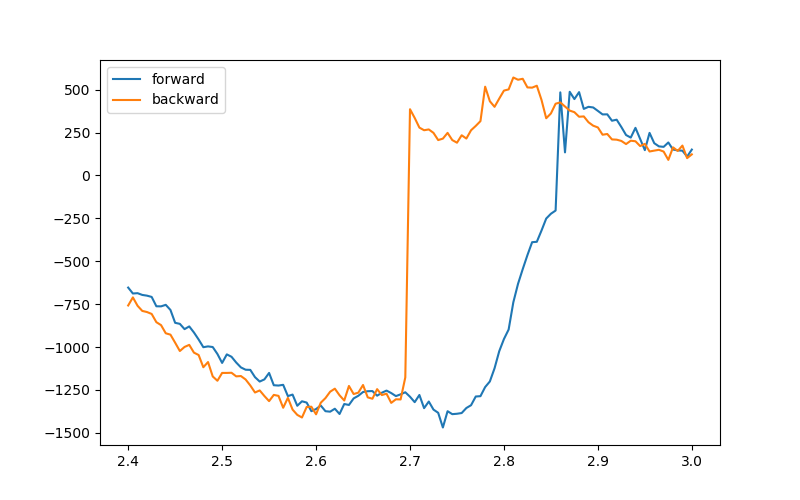

In [32]:
plt.figure(figsize=(8, 5))
plt.plot(data178.srframe_volt_p1_set[:], data178.lockin830_X[:]/1e-9, label='forward')
plt.plot(data179.srframe_volt_p1_set[:], data179.lockin830_X[:]/1e-9, label='backward')
plt.legend()

<IPython.core.display.Javascript object>


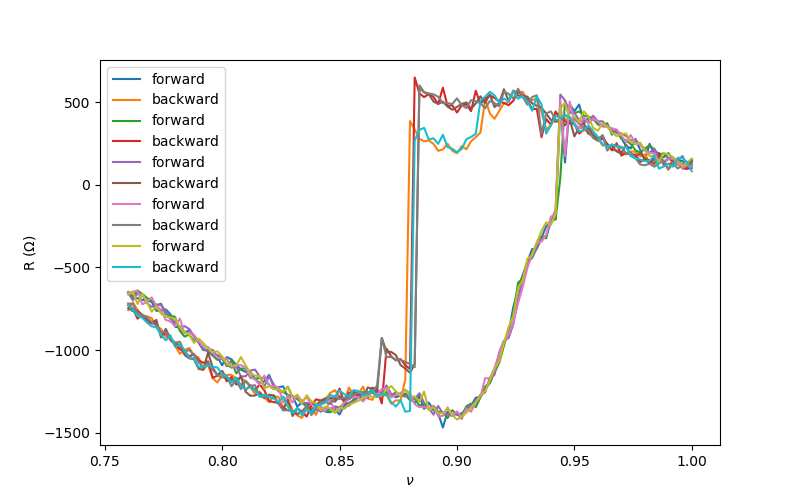

In [117]:
plt.figure(figsize=(8, 5))
plt.plot((data178.srframe_volt_p1_set[:]-0.5)/10*4, data178.lockin830_X[:]/1e-9, label='forward')
plt.plot((data179.srframe_volt_p1_set[:]-0.5)/10*4, data179.lockin830_X[:]/1e-9, label='backward')
plt.plot((data180.srframe_volt_p1_set[:]-0.5)/10*4, data180.lockin830_X[:]/1e-9, label='forward')
plt.plot((data181.srframe_volt_p1_set[:]-0.5)/10*4, data181.lockin830_X[:]/1e-9, label='backward')
plt.plot((data182.srframe_volt_p1_set[:]-0.5)/10*4, data182.lockin830_X[:]/1e-9, label='forward')
plt.plot((data183.srframe_volt_p1_set[:]-0.5)/10*4, data183.lockin830_X[:]/1e-9, label='backward')
plt.plot((data186.srframe_volt_p1_set[:]-0.5)/10*4, data186.lockin830_X[:]/1e-9, label='forward')
plt.plot((data187.srframe_volt_p1_set[:]-0.5)/10*4, data187.lockin830_X[:]/1e-9, label='backward')
plt.plot((data188.srframe_volt_p1_set[:]-0.5)/10*4, data188.lockin830_X[:]/1e-9, label='forward')
plt.plot((data189.srframe_volt_p1_set[:]-0.5)/10*4, data189.lockin830_X[:]/1e-9, label='backward')
plt.xlabel(r'$\nu$')
plt.ylabel('R ($\Omega$)')
plt.legend()

# now try to see the the hysteresis loop at different doping to see if there chern number switch

In [51]:
srframe.volt_p1(2.76)

In [52]:
triton.field_set_stable(-0.5)

In [53]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data190, plot190 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data191, plot191 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 15:45:55
DataSet:
   location = 'data/2020-12-17/#022_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_4K_15-45-53'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 15:56:13
Started at 2020-12-17 15:56:17
DataSet:
   location = 'data/2020-12-17/#023_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_4K_15-56-15'
   <Type>   | <array_id

<IPython.core.display.Javascript object>


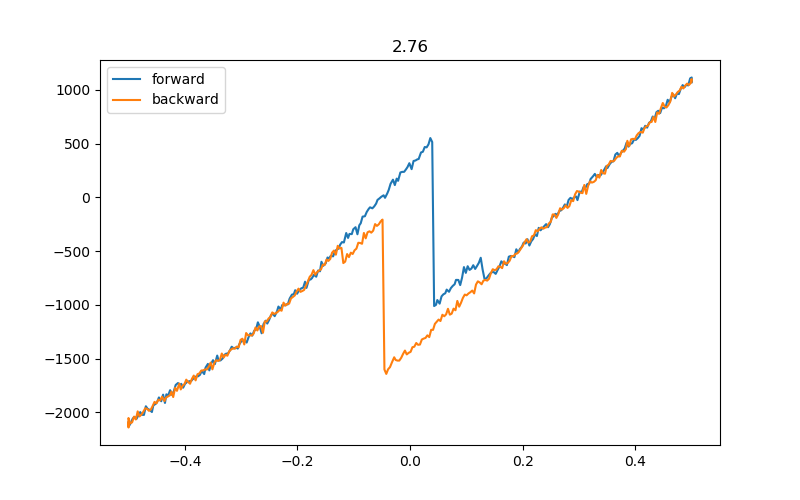

In [61]:
plt.figure(figsize=(8, 5))
plt.plot(data190.triton_field[:], data190.lockin830_X[:]/1e-9, label='forward')
plt.plot(data191.triton_field[:], data191.lockin830_X[:]/1e-9, label='backward')
plt.title('2.76')
plt.legend()

In [57]:
srframe.volt_p1(2.74)

In [58]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data192, plot192 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p74FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data193, plot193 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p74FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 16:08:08
DataSet:
   location = 'data/2020-12-17/#024_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p74FieldSweepup_1nA_4K_16-08-06'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 16:18:25
Started at 2020-12-17 16:18:29
DataSet:
   location = 'data/2020-12-17/#025_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p74FieldSweepdown_1nA_4K_16-18-27'
   <Type>   | <array_id

In [59]:
srframe.volt_p1(2.7)

In [62]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data194, plot194 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p7FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data195, plot195 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p7FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 16:32:01
DataSet:
   location = 'data/2020-12-17/#026_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p7FieldSweepup_1nA_4K_16-32-00'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 16:42:17
Started at 2020-12-17 16:42:20
DataSet:
   location = 'data/2020-12-17/#027_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p7FieldSweepdown_1nA_4K_16-42-19'
   <Type>   | <array_id> 

<IPython.core.display.Javascript object>


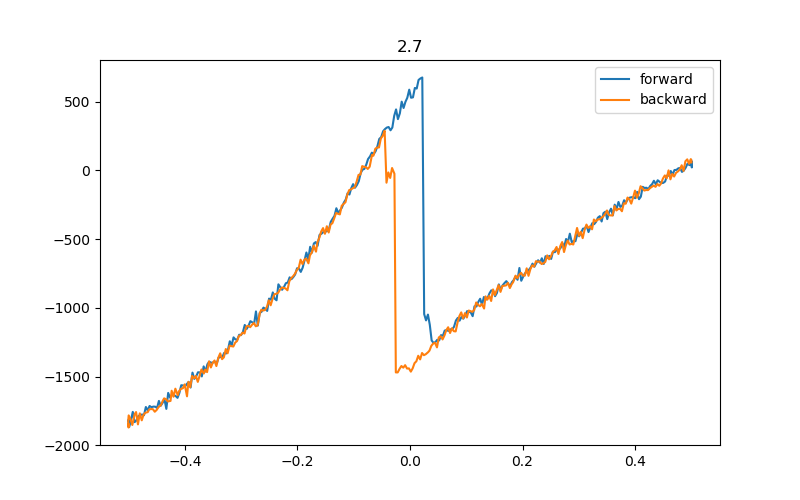

In [63]:
plt.figure(figsize=(8, 5))
plt.plot(data194.triton_field[:], data194.lockin830_X[:]/1e-9, label='forward')
plt.plot(data195.triton_field[:], data195.lockin830_X[:]/1e-9, label='backward')
plt.title('2.7')
plt.legend()

In [64]:
srframe.volt_p1(2.66)

In [65]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data196, plot196 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p66FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data197, plot197 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p66FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 16:55:08
DataSet:
   location = 'data/2020-12-17/#028_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p66FieldSweepup_1nA_4K_16-55-06'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 17:05:24
Started at 2020-12-17 17:05:28
DataSet:
   location = 'data/2020-12-17/#029_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p66FieldSweepdown_1nA_4K_17-05-27'
   <Type>   | <array_id

In [66]:
srframe.volt_p1(2.62)

In [67]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data198, plot198 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p62FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data199, plot199 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p62FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 17:16:48
DataSet:
   location = 'data/2020-12-17/#030_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p62FieldSweepup_1nA_4K_17-16-46'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 17:27:05
Started at 2020-12-17 17:27:10
DataSet:
   location = 'data/2020-12-17/#031_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p62FieldSweepdown_1nA_4K_17-27-08'
   <Type>   | <array_id

<IPython.core.display.Javascript object>


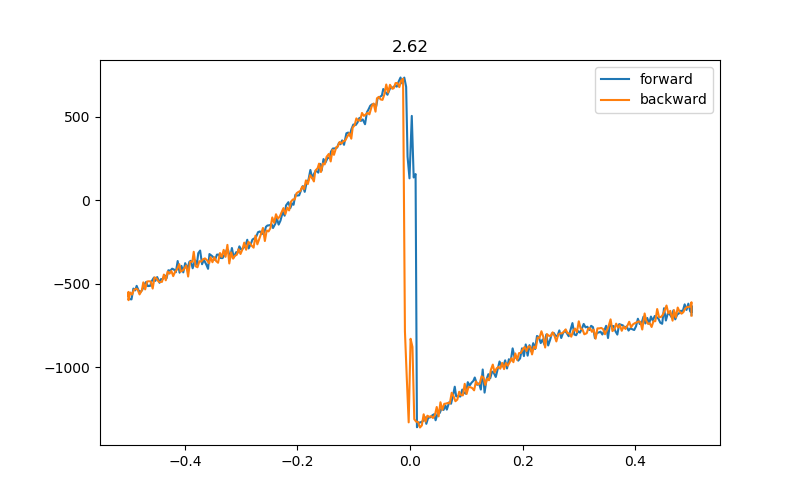

In [70]:
plt.figure(figsize=(8, 5))
plt.plot(data198.triton_field[:], data198.lockin830_X[:]/1e-9, label='forward')
plt.plot(data199.triton_field[:], data199.lockin830_X[:]/1e-9, label='backward')
plt.title('2.62')
plt.legend()

In [71]:
srframe.volt_p1(2.78)

In [72]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data200, plot200 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p78FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data201, plot201 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p78FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 17:39:51
DataSet:
   location = 'data/2020-12-17/#032_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p78FieldSweepup_1nA_4K_17-39-49'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 17:50:07
Started at 2020-12-17 17:50:11
DataSet:
   location = 'data/2020-12-17/#033_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p78FieldSweepdown_1nA_4K_17-50-10'
   <Type>   | <array_id

<IPython.core.display.Javascript object>


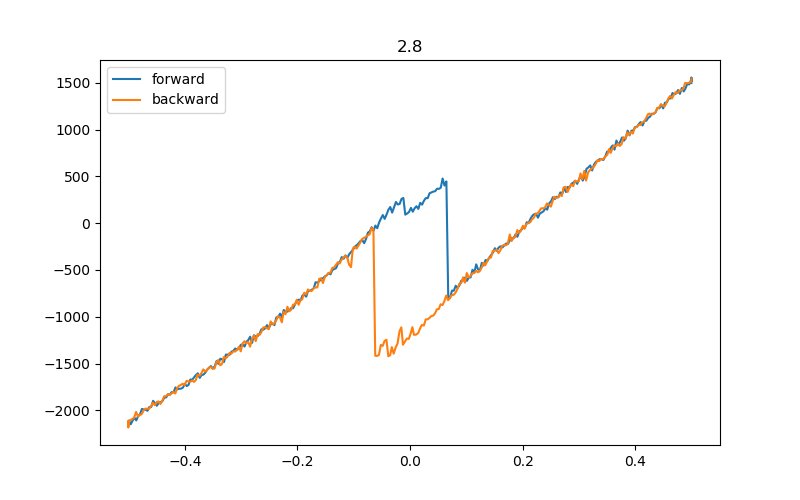

In [75]:
plt.figure(figsize=(8, 5))
plt.plot(data200.triton_field[:], data200.lockin830_X[:]/1e-9, label='forward')
plt.plot(data201.triton_field[:], data201.lockin830_X[:]/1e-9, label='backward')
plt.title('2.8')
plt.legend()

In [73]:
srframe.volt_p1(2.8)

In [76]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data202, plot202 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p8FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data203, plot203 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p8FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 18:02:27
DataSet:
   location = 'data/2020-12-17/#034_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p8FieldSweepup_1nA_4K_18-02-25'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 18:12:41
Started at 2020-12-17 18:12:45
DataSet:
   location = 'data/2020-12-17/#035_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p8FieldSweepdown_1nA_4K_18-12-44'
   <Type>   | <array_id> 

In [77]:
srframe.volt_p1(2.82)

In [78]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data204, plot204 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p82FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data205, plot205 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p82FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 18:23:06
DataSet:
   location = 'data/2020-12-17/#036_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p82FieldSweepup_1nA_4K_18-23-04'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 18:33:20
Started at 2020-12-17 18:33:24
DataSet:
   location = 'data/2020-12-17/#037_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p82FieldSweepdown_1nA_4K_18-33-23'
   <Type>   | <array_id

In [79]:
srframe.volt_p1(2.84)

In [80]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data206, plot206 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p84FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data207, plot207 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p84FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 18:43:47
DataSet:
   location = 'data/2020-12-17/#038_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p84FieldSweepup_1nA_4K_18-43-45'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 18:54:01
Started at 2020-12-17 18:54:05
DataSet:
   location = 'data/2020-12-17/#039_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p84FieldSweepdown_1nA_4K_18-54-03'
   <Type>   | <array_id

In [81]:
srframe.volt_p1(2.86)

In [82]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data208, plot208 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data209, plot209 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 19:04:28
DataSet:
   location = 'data/2020-12-17/#040_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepup_1nA_4K_19-04-26'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 19:14:44
Started at 2020-12-17 19:14:48
DataSet:
   location = 'data/2020-12-17/#041_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepdown_1nA_4K_19-14-46'
   <Type>   | <array_id

In [83]:
srframe.volt_p1(2.88)

In [84]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data210, plot210 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p88FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data211, plot211 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p88FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 19:25:11
DataSet:
   location = 'data/2020-12-17/#042_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p88FieldSweepup_1nA_4K_19-25-09'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 19:35:25
Started at 2020-12-17 19:35:29
DataSet:
   location = 'data/2020-12-17/#043_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p88FieldSweepdown_1nA_4K_19-35-27'
   <Type>   | <array_id

In [85]:
srframe.volt_p1(2.9)

In [86]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data212, plot212 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p9FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data213, plot213 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p9FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 19:45:51
DataSet:
   location = 'data/2020-12-17/#044_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p9FieldSweepup_1nA_4K_19-45-50'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 19:56:09
Started at 2020-12-17 19:56:13
DataSet:
   location = 'data/2020-12-17/#045_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p9FieldSweepdown_1nA_4K_19-56-11'
   <Type>   | <array_id> 

In [87]:
srframe.volt_p1(2.92)

In [88]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data214, plot214 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p92FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data215, plot215 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p92FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 20:06:34
DataSet:
   location = 'data/2020-12-17/#046_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p92FieldSweepup_1nA_4K_20-06-32'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-17 20:16:48
Started at 2020-12-17 20:16:53
DataSet:
   location = 'data/2020-12-17/#047_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p92FieldSweepdown_1nA_4K_20-16-50'
   <Type>   | <array_id

<IPython.core.display.Javascript object>


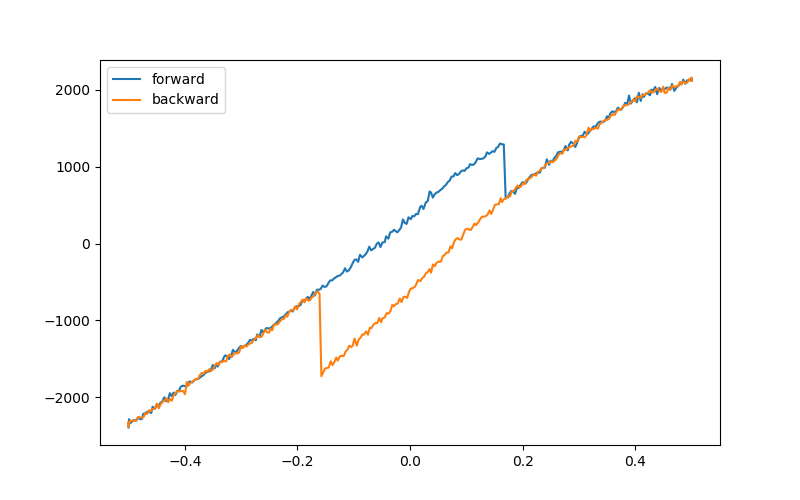

In [157]:
plt.figure(figsize=(8, 5))
plt.plot(data204.triton_field[:], data204.lockin830_X[:]/1e-9, label='forward')
plt.plot(data205.triton_field[:], data205.lockin830_X[:]/1e-9, label='backward')
plt.legend()

<IPython.core.display.Javascript object>


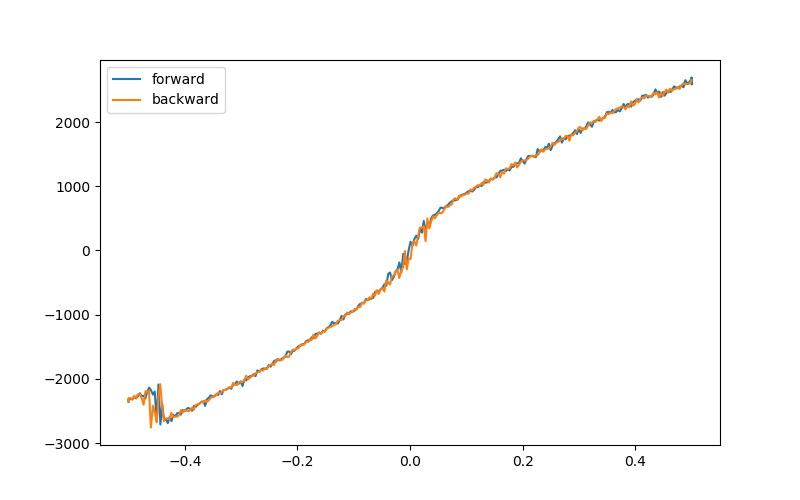

In [160]:
plt.figure(figsize=(8, 5))
plt.plot(data208.triton_field[:], data208.lockin830_X[:]/1e-9, label='forward')
plt.plot(data209.triton_field[:], data209.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [89]:
triton.field_set_stable(0.03)

# now come back for stepping B field forward backward gate

In [99]:
srframe.volt_p1(2.4)

In [100]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data216, plot216 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 20:46:54
DataSet:
   location = 'data/2020-12-17/#048_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_20-46-50'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 20:49:38


In [101]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data217, plot217 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 20:49:58
DataSet:
   location = 'data/2020-12-17/#049_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_20-49-53'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 20:52:41


<IPython.core.display.Javascript object>


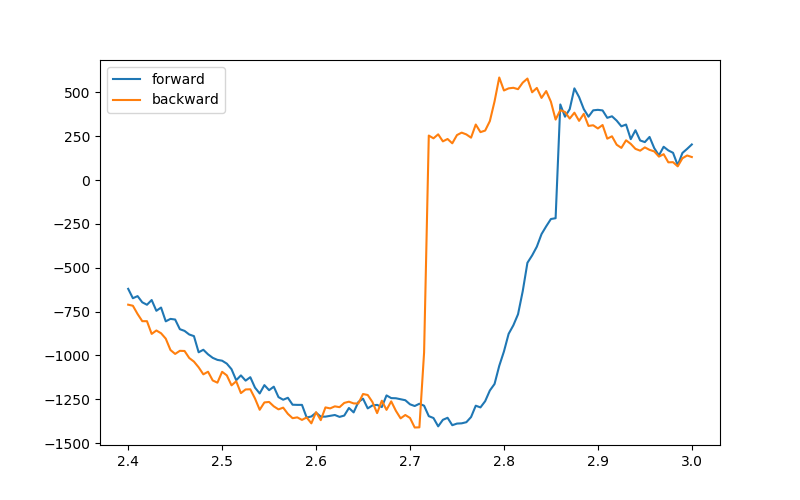

In [102]:
plt.figure(figsize=(8, 5))
plt.plot(data216.srframe_volt_p1_set[:], data216.lockin830_X[:]/1e-9, label='forward')
plt.plot(data217.srframe_volt_p1_set[:], data217.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [113]:
triton.field_set_stable(0.5)

In [114]:
bvals = np.linspace(0.5, -0.5, 101)
for B in bvals:
    triton.field_set_stable(B)
    time.sleep(15)
    Bstr = str(int(B)) + 'p' + str(np.round(B-int(B), 4))[2:]
    
    srframe.volt_p1(2.4)
    time.sleep(15)
    bgvals = np.linspace(2.4, 3, 121)
    data218, plot218 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B{}T_1nA_gatesweepforward_4K'.format(Bstr), YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
    
    srframe.volt_p1(3)
    time.sleep(15)
    bgvals = np.linspace(3, 2.4, 121)
    data219, plot219 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B{}T_1nA_gatesweepbackward_4K'.format(Bstr), YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-17 21:11:29
DataSet:
   location = 'data/2020-12-17/#050_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p5T_1nA_gatesweepforward_4K_21-11-27'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-17 21:14:13
Started at 2020-12-17 21:14:30
DataSet:
   location = 'data/2020-12-17/#051_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p5T_1nA_gatesweepbackward_4K_21-14-28'
   <Type>   | <array_id>          | <array.name> | <array.shap

In [110]:
B = 0.001

In [111]:
Bstr = str(int(B)) + 'p' + str(np.round(B-int(B), 4))[2:]

In [112]:
Bstr

'0p001'

In [115]:
triton.field_set_stable(0)

# go the the potential C = 1 to C =3 transition to see if there is hysterisis 

In [118]:
srframe.volt_p1(2.76)

In [119]:
triton.field_set_stable(-0.5)

In [120]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data220, plot220 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data221, plot221 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 14:09:02
DataSet:
   location = 'data/2020-12-18/#151_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_4K_14-09-00'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-18 14:19:17
Started at 2020-12-18 14:19:21
DataSet:
   location = 'data/2020-12-18/#152_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_4K_14-19-19'
   <Type>   | <array_id

In [123]:
triton.field_set_stable(-0.3)

In [124]:
srframe.volt_p1(2.88)

In [125]:
triton.magnet_sweeprate(0.1)
triton.field(-1.3)
data222, plot222 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -1.3, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p88FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.3)
data223, plot223 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.3, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p88FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 15:08:03
DataSet:
   location = 'data/2020-12-18/#153_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p88FieldSweepup_1nA_4K_15-08-01'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-18 15:18:20
Started at 2020-12-18 15:18:24
DataSet:
   location = 'data/2020-12-18/#154_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p88FieldSweepdown_1nA_4K_15-18-22'
   <Type>   | <array_id

<IPython.core.display.Javascript object>


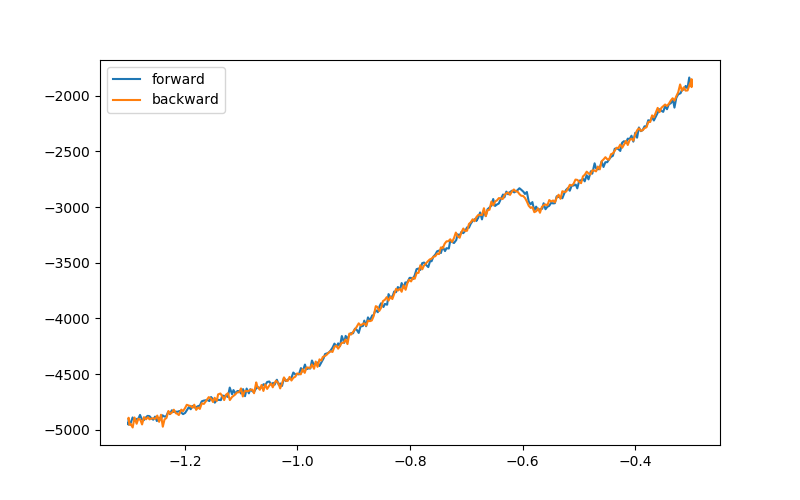

In [127]:
plt.figure(figsize=(8, 5))
plt.plot(data222.triton_field[:], data222.lockin830_X[:]/1e-9, label='forward')
plt.plot(data223.triton_field[:], data223.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [140]:
triton.field_set_stable(-0.5)

# probably find the transition point around zero field first

In [158]:
srframe.volt_p1(2.82)

In [159]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data224, plot224 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p82FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data225, plot225 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p82FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 15:59:25
DataSet:
   location = 'data/2020-12-18/#155_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p82FieldSweepup_1nA_4K_15-59-23'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-18 16:09:41
Started at 2020-12-18 16:09:45
DataSet:
   location = 'data/2020-12-18/#156_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p82FieldSweepdown_1nA_4K_16-09-44'
   <Type>   | <array_id

In [162]:
srframe.volt_p1(2.83)

In [163]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data226, plot226 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p83FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data227, plot227 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p83FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 16:23:03
DataSet:
   location = 'data/2020-12-18/#157_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p83FieldSweepup_1nA_4K_16-23-01'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-18 16:33:17
Started at 2020-12-18 16:33:21
DataSet:
   location = 'data/2020-12-18/#158_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p83FieldSweepdown_1nA_4K_16-33-20'
   <Type>   | <array_id

In [165]:
srframe.volt_p1(2.84)

In [166]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data228, plot228 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p84FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data229, plot229 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p84FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 16:45:12
DataSet:
   location = 'data/2020-12-18/#159_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p84FieldSweepup_1nA_4K_16-45-10'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-18 16:55:26
Started at 2020-12-18 16:55:30
DataSet:
   location = 'data/2020-12-18/#160_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p84FieldSweepdown_1nA_4K_16-55-29'
   <Type>   | <array_id

<IPython.core.display.Javascript object>


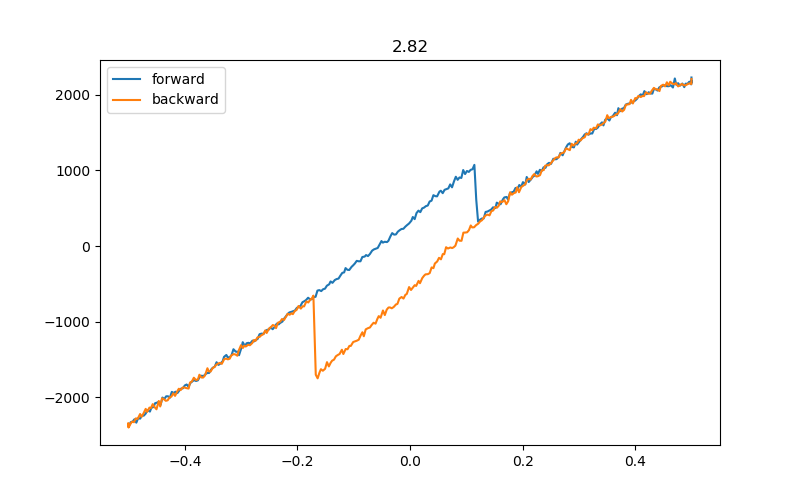

In [161]:
plt.figure(figsize=(8, 5))
plt.plot(data224.triton_field[:], data224.lockin830_X[:]/1e-9, label='forward')
plt.plot(data225.triton_field[:], data225.lockin830_X[:]/1e-9, label='backward')
plt.title('2.82')
plt.legend()

<IPython.core.display.Javascript object>


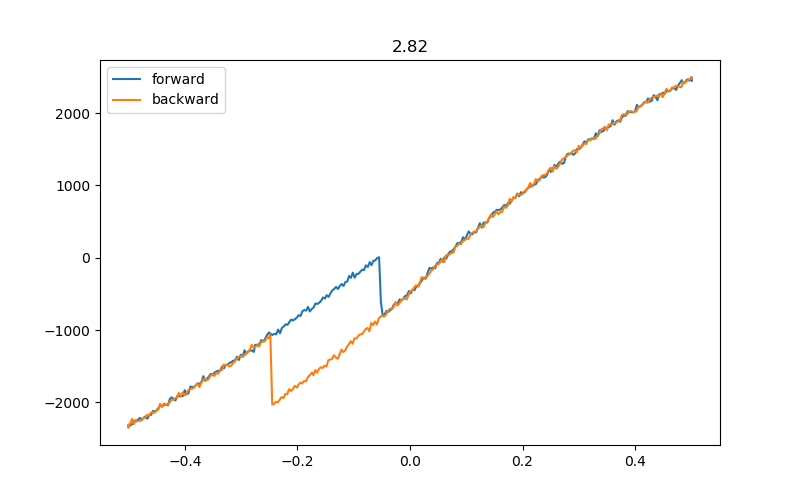

In [164]:
plt.figure(figsize=(8, 5))
plt.plot(data226.triton_field[:], data226.lockin830_X[:]/1e-9, label='forward')
plt.plot(data227.triton_field[:], data227.lockin830_X[:]/1e-9, label='backward')
plt.title('2.82')
plt.legend()

<IPython.core.display.Javascript object>


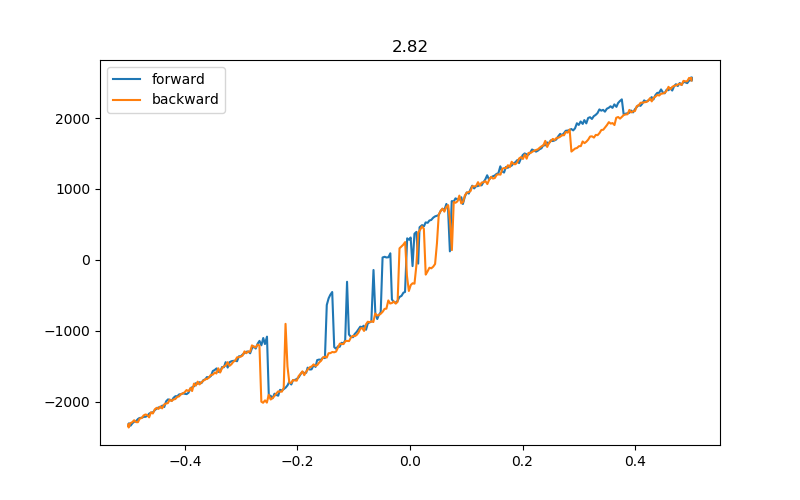

In [167]:
plt.figure(figsize=(8, 5))
plt.plot(data228.triton_field[:], data228.lockin830_X[:]/1e-9, label='forward')
plt.plot(data229.triton_field[:], data229.lockin830_X[:]/1e-9, label='backward')
plt.title('2.82')
plt.legend()

In [168]:
srframe.volt_p1(2.843)

In [169]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data230, plot230 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p843FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data231, plot231 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p843FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 17:07:11
DataSet:
   location = 'data/2020-12-18/#161_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p843FieldSweepup_1nA_4K_17-07-09'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-18 17:17:27
Started at 2020-12-18 17:17:31
DataSet:
   location = 'data/2020-12-18/#162_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p843FieldSweepdown_1nA_4K_17-17-30'
   <Type>   | <array_

<IPython.core.display.Javascript object>


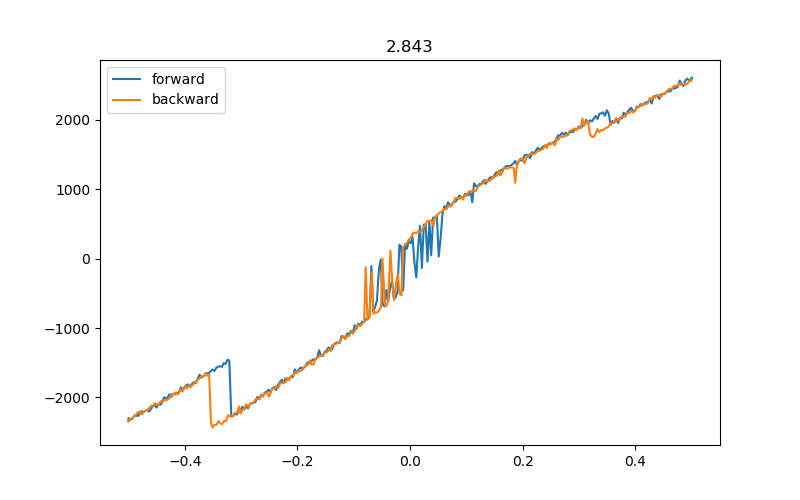

In [170]:
plt.figure(figsize=(8, 5))
plt.plot(data230.triton_field[:], data230.lockin830_X[:]/1e-9, label='forward')
plt.plot(data231.triton_field[:], data231.lockin830_X[:]/1e-9, label='backward')
plt.title('2.843')
plt.legend()

In [171]:
srframe.volt_p1(2.846)

In [172]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data232, plot232 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data233, plot233 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 17:31:11
DataSet:
   location = 'data/2020-12-18/#163_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepup_1nA_4K_17-31-10'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-18 17:41:28
Started at 2020-12-18 17:41:32
DataSet:
   location = 'data/2020-12-18/#164_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepdown_1nA_4K_17-41-31'
   <Type>   | <array_

<IPython.core.display.Javascript object>


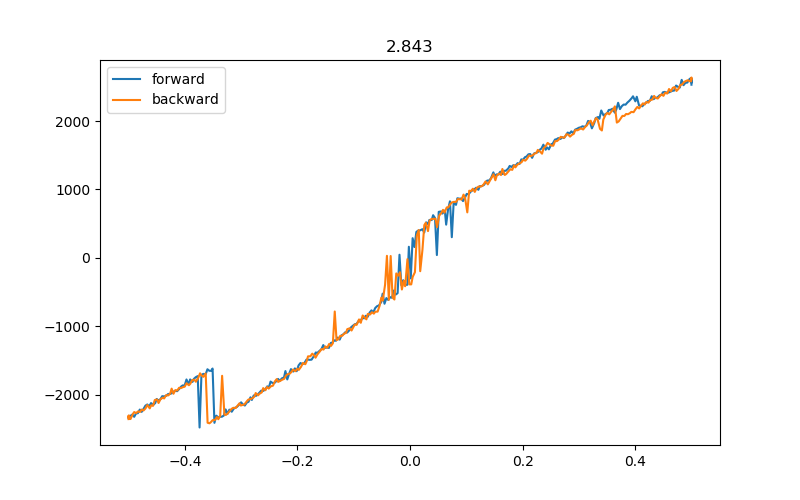

In [174]:
plt.figure(figsize=(8, 5))
plt.plot(data232.triton_field[:], data232.lockin830_X[:]/1e-9, label='forward')
plt.plot(data233.triton_field[:], data233.lockin830_X[:]/1e-9, label='backward')
plt.title('2.843')
plt.legend()

In [175]:
triton.pid_setpoint(4.5)

In [176]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data234, plot234 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepup_1nA_4p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data235, plot235 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepdown_1nA_4p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 17:54:40
DataSet:
   location = 'data/2020-12-18/#165_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepup_1nA_4p5K_17-54-38'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-18 18:04:55
Started at 2020-12-18 18:04:59
DataSet:
   location = 'data/2020-12-18/#166_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepdown_1nA_4p5K_18-04-58'
   <Type>   | <ar

In [177]:
triton.pid_setpoint(3.5)

In [178]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data236, plot236 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data237, plot237 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 21:46:20
DataSet:
   location = 'data/2020-12-18/#167_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepup_1nA_3p5K_21-46-18'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-18 21:56:36
Started at 2020-12-18 21:56:40
DataSet:
   location = 'data/2020-12-18/#168_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p846FieldSweepdown_1nA_3p5K_21-56-38'
   <Type>   | <ar

<IPython.core.display.Javascript object>


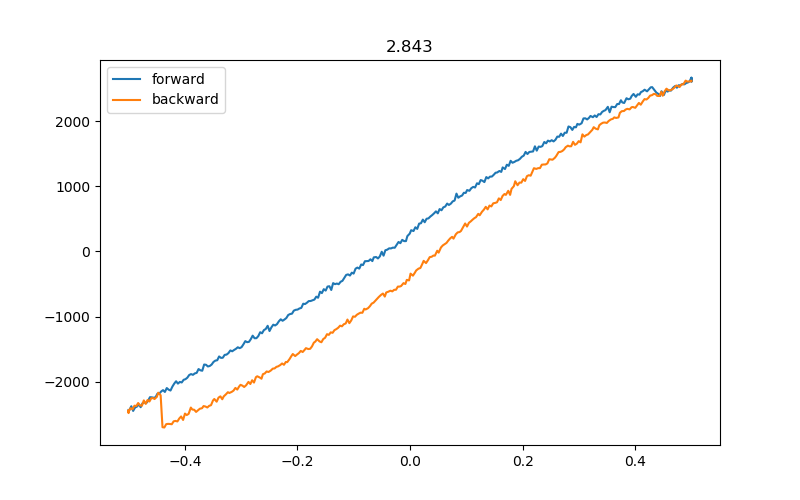

In [179]:
plt.figure(figsize=(8, 5))
plt.plot(data236.triton_field[:], data236.lockin830_X[:]/1e-9, label='forward')
plt.plot(data237.triton_field[:], data237.lockin830_X[:]/1e-9, label='backward')
plt.title('2.843')
plt.legend()

In [180]:
srframe.volt_p1(2.85)

In [181]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data238, plot238 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data239, plot239 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 22:09:51
DataSet:
   location = 'data/2020-12-18/#169_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3p5K_22-09-49'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-18 22:20:08
Started at 2020-12-18 22:20:12
DataSet:
   location = 'data/2020-12-18/#170_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3p5K_22-20-10'
   <Type>   | <arra

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


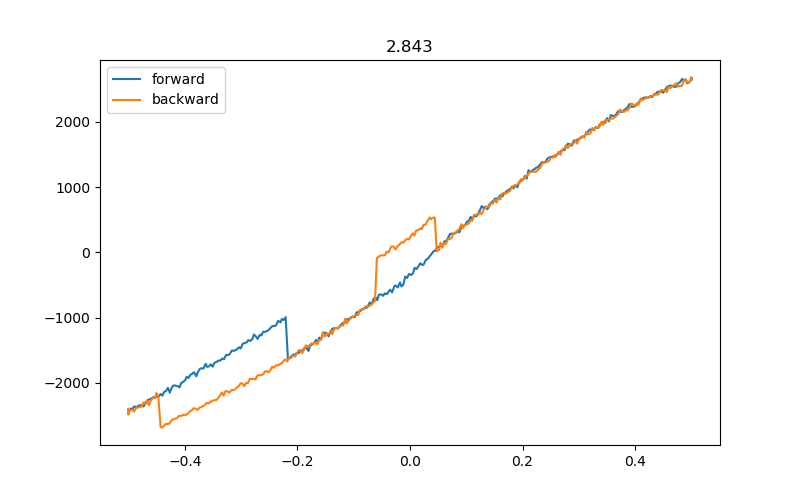

In [182]:
plt.figure(figsize=(8, 5))
plt.plot(data238.triton_field[:], data238.lockin830_X[:]/1e-9, label='forward')
plt.plot(data239.triton_field[:], data239.lockin830_X[:]/1e-9, label='backward')
plt.title('2.843')
plt.legend()

In [183]:
srframe.volt_p1(2.853)

In [ ]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data240, plot240 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p853FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data241, plot241 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p853FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-18 22:33:40


In [193]:
triton.field_set_stable(-0.5)

In [192]:
triton.pid_setpoint(2.5)

In [194]:
srframe.volt_p1(2.86)

In [195]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data242, plot242 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepup_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data243, plot243 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepdown_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-19 20:41:24
DataSet:
   location = 'data/2020-12-19/#059_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepup_1nA_2p5K_20-41-22'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-19 20:51:41
Started at 2020-12-19 20:51:45
DataSet:
   location = 'data/2020-12-19/#060_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepdown_1nA_2p5K_20-51-43'
   <Type>   | <arra

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


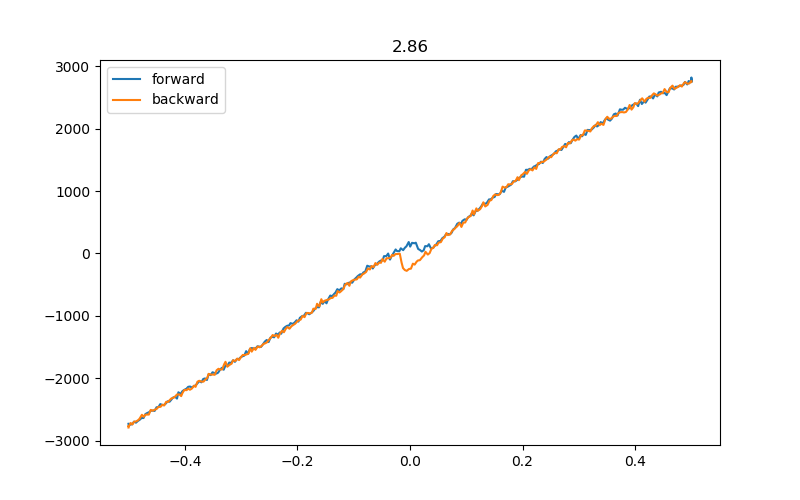

In [196]:
plt.figure(figsize=(8, 5))
plt.plot(data242.triton_field[:], data242.lockin830_X[:]/1e-9, label='forward')
plt.plot(data243.triton_field[:], data243.lockin830_X[:]/1e-9, label='backward')
plt.title('2.86')
plt.legend()

In [197]:
srframe.volt_p1(2.87)

In [198]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data244, plot244 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p87FieldSweepup_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data245, plot245 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p87FieldSweepdown_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-19 21:04:43
DataSet:
   location = 'data/2020-12-19/#061_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p87FieldSweepup_1nA_2p5K_21-04-41'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-19 21:15:00
Started at 2020-12-19 21:15:04
DataSet:
   location = 'data/2020-12-19/#062_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p87FieldSweepdown_1nA_2p5K_21-15-02'
   <Type>   | <arra

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


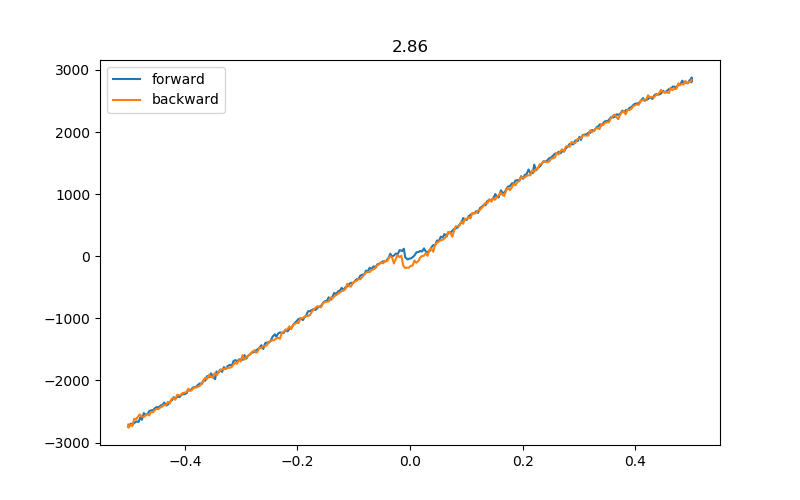

In [199]:
plt.figure(figsize=(8, 5))
plt.plot(data244.triton_field[:], data244.lockin830_X[:]/1e-9, label='forward')
plt.plot(data245.triton_field[:], data245.lockin830_X[:]/1e-9, label='backward')
plt.title('2.86')
plt.legend()

In [201]:
srframe.volt_p1(2.89)

In [202]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data246, plot246 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p89FieldSweepup_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data247, plot247 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p89FieldSweepdown_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-19 21:41:30
DataSet:
   location = 'data/2020-12-19/#063_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p89FieldSweepup_1nA_2p5K_21-41-28'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-19 21:51:47
Started at 2020-12-19 21:51:50
DataSet:
   location = 'data/2020-12-19/#064_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p89FieldSweepdown_1nA_2p5K_21-51-49'
   <Type>   | <arra

In [204]:
srframe.volt_p1(2.9)

In [205]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data248, plot248 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p9FieldSweepup_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data249, plot249 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p9FieldSweepdown_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-19 22:06:59
DataSet:
   location = 'data/2020-12-19/#065_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p9FieldSweepup_1nA_2p5K_22-06-57'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-19 22:17:15
Started at 2020-12-19 22:17:20
DataSet:
   location = 'data/2020-12-19/#066_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p9FieldSweepdown_1nA_2p5K_22-17-18'
   <Type>   | <array_

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


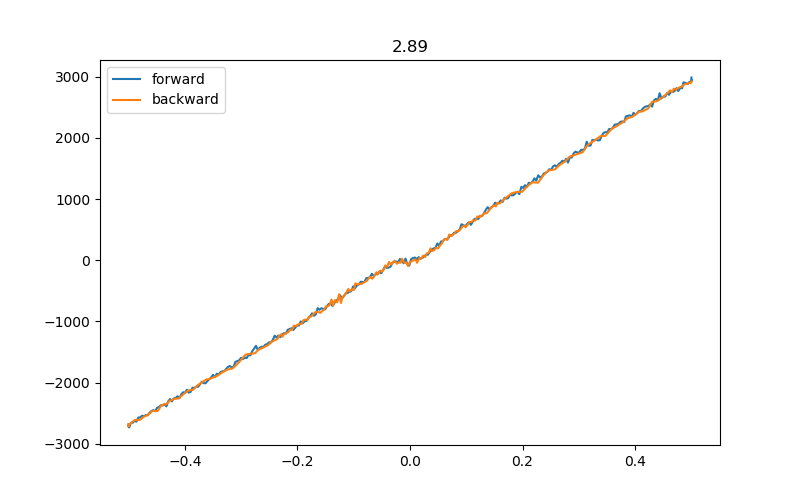

In [206]:
plt.figure(figsize=(8, 5))
plt.plot(data248.triton_field[:], data248.lockin830_X[:]/1e-9, label='forward')
plt.plot(data249.triton_field[:], data249.lockin830_X[:]/1e-9, label='backward')
plt.title('2.89')
plt.legend()

In [207]:
srframe.volt_p1(2.85)

In [208]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data250, plot250 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data251, plot251 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-19 22:30:02
DataSet:
   location = 'data/2020-12-19/#067_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_2p5K_22-30-01'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-19 22:40:19
Started at 2020-12-19 22:40:23
DataSet:
   location = 'data/2020-12-19/#068_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_2p5K_22-40-22'
   <Type>   | <arra

<IPython.core.display.Javascript object>


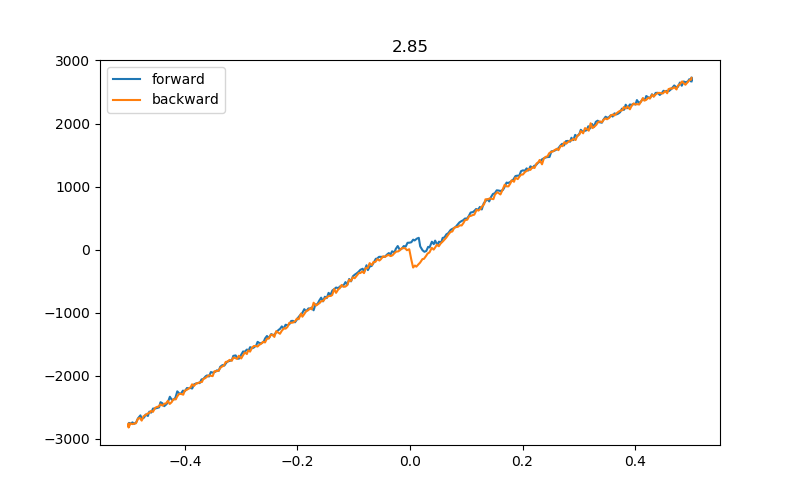

In [210]:
plt.figure(figsize=(8, 5))
plt.plot(data250.triton_field[:], data250.lockin830_X[:]/1e-9, label='forward')
plt.plot(data251.triton_field[:], data251.lockin830_X[:]/1e-9, label='backward')
plt.title('2.85')
plt.legend()

In [211]:
triton.pid_setpoint(3)

In [212]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data252, plot252 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data253, plot253 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-19 22:54:34
DataSet:
   location = 'data/2020-12-19/#069_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3K_22-54-32'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-19 23:04:49
Started at 2020-12-19 23:05:24
DataSet:
   location = 'data/2020-12-19/#070_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3K_23-04-51'
   <Type>   | <array_id

In [214]:
triton.pid_setpoint(3.5)

In [215]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data254, plot254 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data255, plot255 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-19 23:21:30
DataSet:
   location = 'data/2020-12-19/#071_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3p5K_23-21-28'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-19 23:31:47
Started at 2020-12-19 23:31:51
DataSet:
   location = 'data/2020-12-19/#072_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3p5K_23-31-50'
   <Type>   | <arra

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


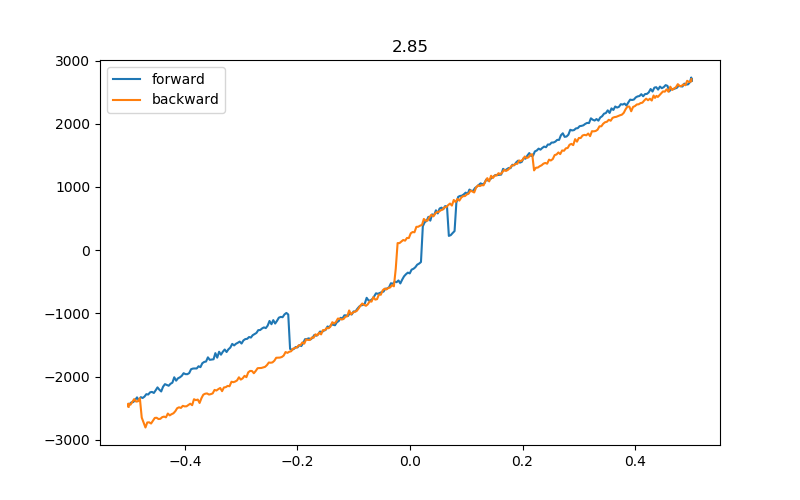

In [216]:
plt.figure(figsize=(8, 5))
plt.plot(data254.triton_field[:], data254.lockin830_X[:]/1e-9, label='forward')
plt.plot(data255.triton_field[:], data255.lockin830_X[:]/1e-9, label='backward')
plt.title('2.85')
plt.legend()

# 4K data

In [217]:
triton.pid_setpoint(4)

In [218]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data254, plot254 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data255, plot255 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-19 23:46:36
DataSet:
   location = 'data/2020-12-19/#073_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_4K_23-46-35'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-19 23:56:54
Started at 2020-12-19 23:56:58
DataSet:
   location = 'data/2020-12-19/#074_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_4K_23-56-57'
   <Type>   | <array_id

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


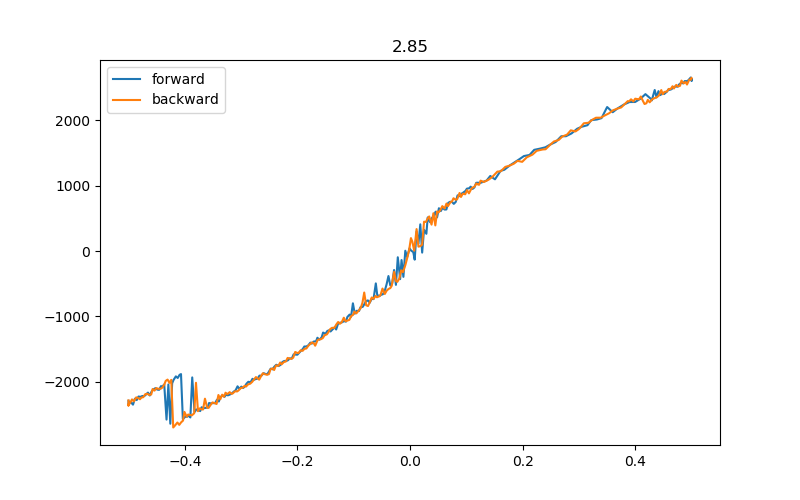

In [219]:
plt.figure(figsize=(8, 5))
plt.plot(data254.triton_field[:], data254.lockin830_X[:]/1e-9, label='forward')
plt.plot(data255.triton_field[:], data255.lockin830_X[:]/1e-9, label='backward')
plt.title('2.85')
plt.legend()

In [220]:
srframe.volt_p1(2.55)

In [221]:
bgvals = np.linspace(2.55, 2.95, 41)
for bg in bgvals:
    srframe.volt_p1(bg)
    time.sleep(15)
    bgstr = str(int(bg)) + 'p' + str(np.round(bg-int(bg), 4))[2:]
    triton.field(0.5)
    data256, plot256 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepup_1nA_4K'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
    triton.field(-0.5)
    data257, plot257 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepdown_1nA_4K'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-20 00:13:35
DataSet:
   location = 'data/2020-12-20/#001_S13_865_2-25_830_25-28_8302_2-29_vbg2p55V_FieldSweepup_1nA_4K_00-13-33'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-20 00:23:53
Started at 2020-12-20 00:23:57
DataSet:
   location = 'data/2020-12-20/#002_S13_865_2-25_830_25-28_8302_2-29_vbg2p55V_FieldSweepdown_1nA_4K_00-23-56'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | ti

# 3.25 K data

In [222]:
triton.pid_setpoint(3.25)

In [223]:
srframe.volt_p1(2.85)

In [224]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data258, plot258 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data259, plot259 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 15:23:51
DataSet:
   location = 'data/2020-12-20/#083_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3p25K_15-23-49'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-20 15:34:07
Started at 2020-12-20 15:34:11
DataSet:
   location = 'data/2020-12-20/#084_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3p25K_15-34-10'
   <Type>   | <ar

<IPython.core.display.Javascript object>


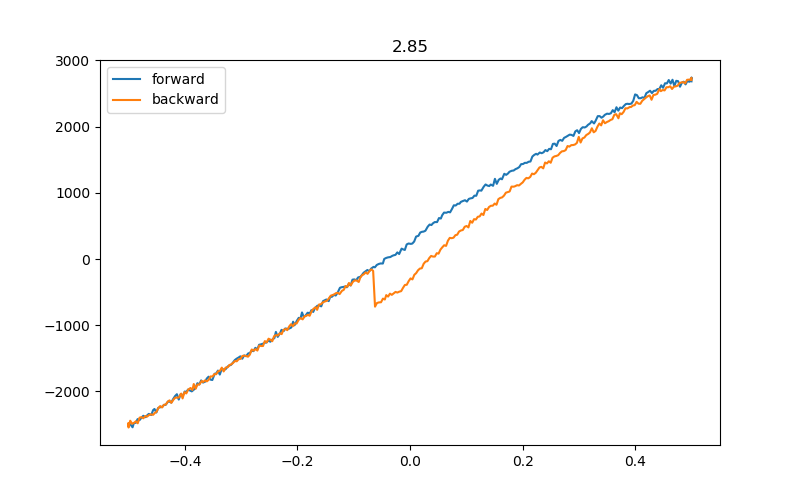

In [227]:
plt.figure(figsize=(8, 5))
plt.plot(data258.triton_field[:], data258.lockin830_X[:]/1e-9, label='forward')
plt.plot(data259.triton_field[:], data259.lockin830_X[:]/1e-9, label='backward')
plt.title('2.85')
plt.legend()

In [226]:
srframe.volt_p1(2.86)

In [228]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data260, plot260 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepup_1nA_3p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data261, plot261 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepdown_1nA_3p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 15:46:28
DataSet:
   location = 'data/2020-12-20/#085_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepup_1nA_3p25K_15-46-26'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-20 15:56:44
Started at 2020-12-20 15:56:48
DataSet:
   location = 'data/2020-12-20/#086_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepdown_1nA_3p25K_15-56-47'
   <Type>   | <ar

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


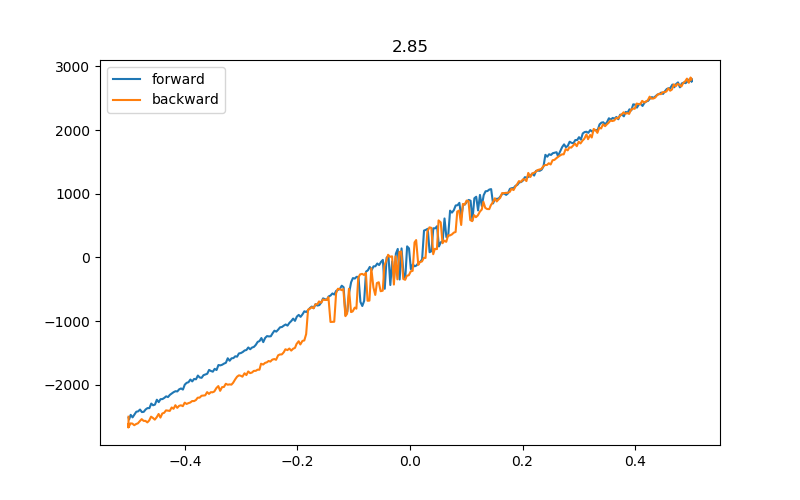

In [229]:
plt.figure(figsize=(8, 5))
plt.plot(data260.triton_field[:], data260.lockin830_X[:]/1e-9, label='forward')
plt.plot(data261.triton_field[:], data261.lockin830_X[:]/1e-9, label='backward')
plt.title('2.85')
plt.legend()

In [230]:
triton.pid_setpoint(1.5)

In [232]:
triton.read_temps()

MC - off:  0.0697197 K
MC_cernox - on:  321.181 K
still - off:  0.751222 K
cold_plate - off:  0.0664829 K
magnet - on:  4.58957 K
PT2h - off:  3.3594 K
PT2p - off:  3.60925 K
PT1h - off:  47.2143 K
PT1p - off:  63.7227 K


# come to 1.5K to see if there is gate switch behavior

In [248]:
triton.field_set_stable(0.03)

In [249]:
srframe.volt_p1(2.4)

In [250]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data262, plot262 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 17:48:00
DataSet:
   location = 'data/2020-12-20/#095_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K_17-47-59'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-20 17:50:44


In [251]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data263, plot263 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 17:51:15
DataSet:
   location = 'data/2020-12-20/#096_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K_17-51-14'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-20 17:53:59


In [253]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data264, plot264 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 17:55:33
DataSet:
   location = 'data/2020-12-20/#097_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K_17-55-31'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-20 17:58:16


In [254]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data265, plot265 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 17:58:33
DataSet:
   location = 'data/2020-12-20/#098_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K_17-58-32'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-20 18:01:17


at low temperature there is no switch with gate

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


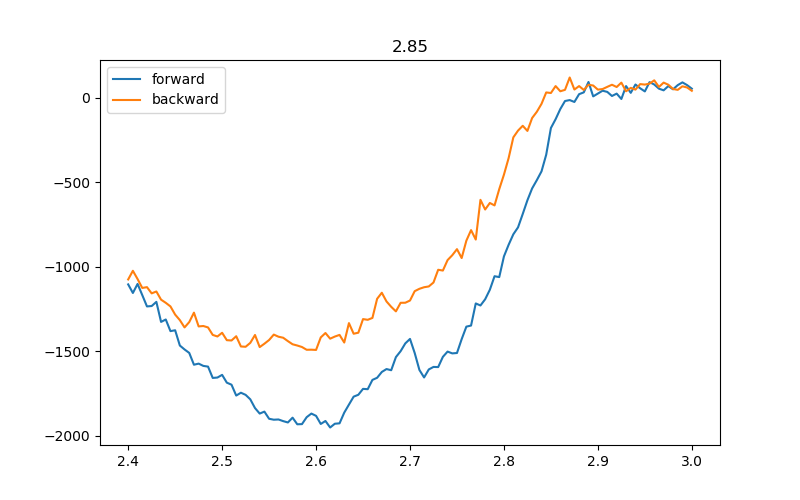

In [252]:
plt.figure(figsize=(8, 5))
plt.plot(data262.srframe_volt_p1_set[:], data262.lockin830_X[:]/1e-9, label='forward')
plt.plot(data263.srframe_volt_p1_set[:], data263.lockin830_X[:]/1e-9, label='backward')
plt.title('2.85')
plt.legend()

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


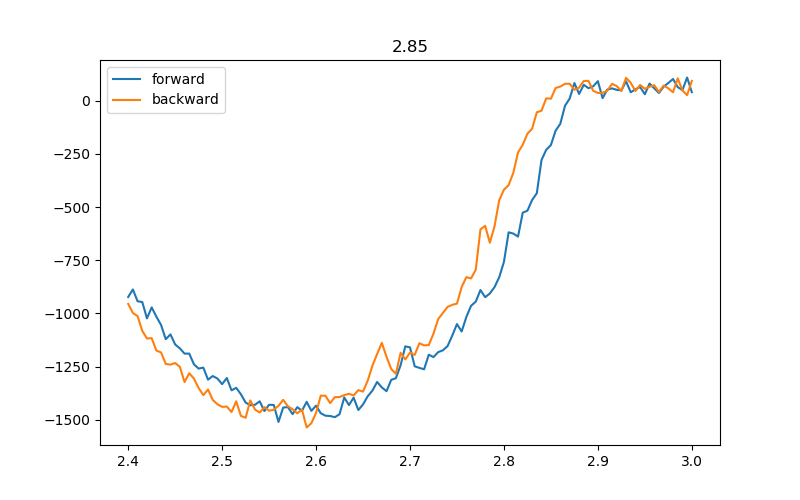

In [255]:
plt.figure(figsize=(8, 5))
plt.plot(data264.srframe_volt_p1_set[:], data264.lockin830_X[:]/1e-9, label='forward')
plt.plot(data265.srframe_volt_p1_set[:], data265.lockin830_X[:]/1e-9, label='backward')
plt.title('2.85')
plt.legend()

try a bit wit fix dnesity scan field

In [256]:
srframe.volt_p1(2.85)

In [257]:
triton.field_set_stable(-0.5)

In [258]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data266, plot266 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data267, plot267 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 18:06:59
DataSet:
   location = 'data/2020-12-20/#099_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_1p5K_18-06-57'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-20 18:17:16
Started at 2020-12-20 18:17:20
DataSet:
   location = 'data/2020-12-20/#100_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_1p5K_18-17-18'
   <Type>   | <arra

In [259]:
srframe.volt_p1(2.76)

In [260]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data268, plot268 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data269, plot269 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 18:27:42
DataSet:
   location = 'data/2020-12-20/#101_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_1p5K_18-27-41'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-20 18:38:00
Started at 2020-12-20 18:38:04
DataSet:
   location = 'data/2020-12-20/#102_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_1p5K_18-38-02'
   <Type>   | <arra

<IPython.core.display.Javascript object>


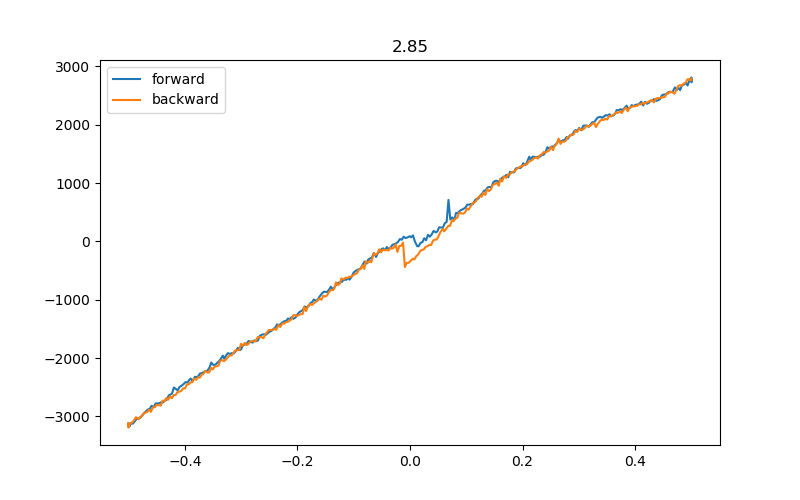

In [263]:
plt.figure(figsize=(8, 5))
plt.plot(data266.triton_field[:], data266.lockin830_X[:]/1e-9, label='forward')
plt.plot(data267.triton_field[:], data267.lockin830_X[:]/1e-9, label='backward')
plt.title('2.85')
plt.legend()

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


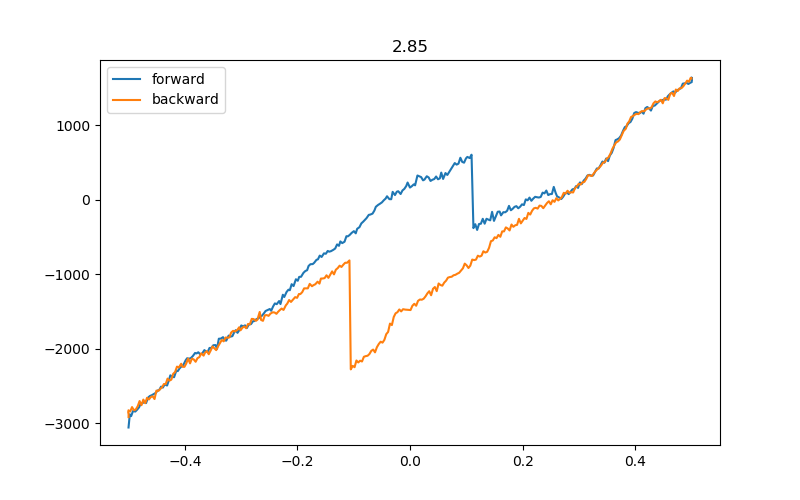

In [261]:
plt.figure(figsize=(8, 5))
plt.plot(data268.triton_field[:], data268.lockin830_X[:]/1e-9, label='forward')
plt.plot(data269.triton_field[:], data269.lockin830_X[:]/1e-9, label='backward')
plt.title('2.85')
plt.legend()

In [264]:
srframe.volt_p1(2.87)

In [265]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data270, plot270 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p87FieldSweepup_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data271, plot271 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p87FieldSweepdown_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 18:53:44
DataSet:
   location = 'data/2020-12-20/#103_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p87FieldSweepup_1nA_1p5K_18-53-43'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-20 19:04:01
Started at 2020-12-20 19:04:05
DataSet:
   location = 'data/2020-12-20/#104_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p87FieldSweepdown_1nA_1p5K_19-04-03'
   <Type>   | <arra

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


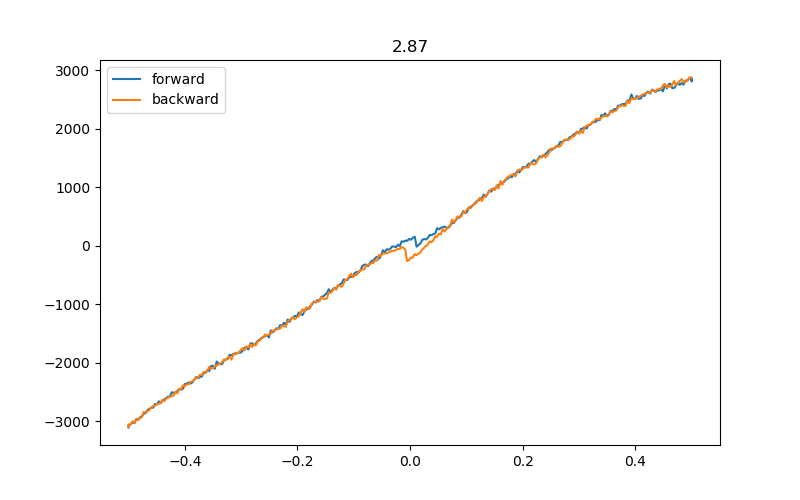

In [266]:
plt.figure(figsize=(8, 5))
plt.plot(data270.triton_field[:], data270.lockin830_X[:]/1e-9, label='forward')
plt.plot(data271.triton_field[:], data271.lockin830_X[:]/1e-9, label='backward')
plt.title('2.87')
plt.legend()

In [268]:
triton.field_set_stable(0.03)

In [267]:
srframe.volt_p1(2.3)

In [269]:
srframe.volt_p1(2.3)
time.sleep(15)
bgvals = np.linspace(2.3, 3, 141)
data272, plot272 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 19:22:34
DataSet:
   location = 'data/2020-12-20/#105_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K_19-22-32'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (141,)
   Measured | lockin865_X         | X            | (141,)
   Measured | lockin865_Y         | Y            | (141,)
   Measured | lockin830_X         | X            | (141,)
   Measured | lockin830_Y         | Y            | (141,)
   Measured | lockin830_2_X       | X            | (141,)
   Measured | lockin830_2_Y       | Y            | (141,)
   Measured | lockin830_3_X       | X            | (141,)
   Measured | lockin830_3_Y       | Y            | (141,)
Finished at 2020-12-20 19:25:45


In [270]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.3, 141)
data273, plot273 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 19:26:02
DataSet:
   location = 'data/2020-12-20/#106_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p03T_1p5K_19-26-00'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (141,)
   Measured | lockin865_X         | X            | (141,)
   Measured | lockin865_Y         | Y            | (141,)
   Measured | lockin830_X         | X            | (141,)
   Measured | lockin830_Y         | Y            | (141,)
   Measured | lockin830_2_X       | X            | (141,)
   Measured | lockin830_2_Y       | Y            | (141,)
   Measured | lockin830_3_X       | X            | (141,)
   Measured | lockin830_3_Y       | Y            | (141,)
Finished at 2020-12-20 19:29:13


<IPython.core.display.Javascript object>


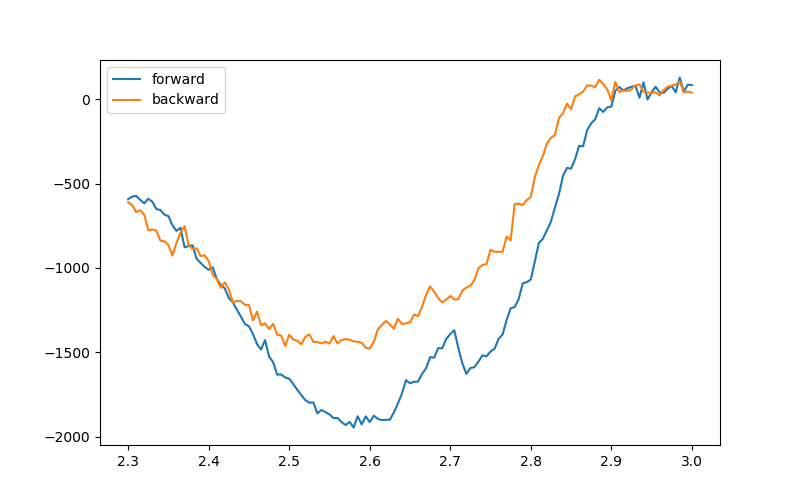

In [272]:
plt.figure(figsize=(8, 5))
plt.plot(data272.srframe_volt_p1_set[:], data272.lockin830_X[:]/1e-9, label='forward')
plt.plot(data273.srframe_volt_p1_set[:], data273.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [273]:
srframe.volt_p1(2.55)

In [274]:
triton.field_set_stable(-0.5)

In [275]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data274, plot274 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p55FieldSweepup_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data275, plot275 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p55FieldSweepdown_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-20 19:37:16
DataSet:
   location = 'data/2020-12-20/#107_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p55FieldSweepup_1nA_1p5K_19-37-15'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-20 19:47:33
Started at 2020-12-20 19:47:37
DataSet:
   location = 'data/2020-12-20/#108_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p55FieldSweepdown_1nA_1p5K_19-47-35'
   <Type>   | <arra

In [276]:
srframe.volt_p1(2.5)

In [277]:
bgvals = np.linspace(2.5, 2.95, 46)
for bg in bgvals:
    srframe.volt_p1(bg)
    time.sleep(15)
    bgstr = str(int(bg)) + 'p' + str(np.round(bg-int(bg), 4))[2:]
    triton.field(0.5)
    data276, plot276 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepup_1nA_1p5K'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
    triton.field(-0.5)
    data277, plot277 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepdown_1nA_1p5K'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-20 19:59:20
DataSet:
   location = 'data/2020-12-20/#109_S13_865_2-25_830_25-28_8302_2-29_vbg2p5V_FieldSweepup_1nA_1p5K_19-59-19'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-20 20:09:38
Started at 2020-12-20 20:09:41
DataSet:
   location = 'data/2020-12-20/#110_S13_865_2-25_830_25-28_8302_2-29_vbg2p5V_FieldSweepdown_1nA_1p5K_20-09-40'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

In [278]:
triton.field_set_stable(0.02)

# scan gate forward backward at different T with fix 0.02T magnet

In [279]:
srframe.volt_p1(2.4)

In [280]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data278, plot278 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p5K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-21 12:21:32
DataSet:
   location = 'data/2020-12-21/#070_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p5K_12-21-30'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-21 12:24:16


In [281]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data279, plot279 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p5K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-21 12:24:33
DataSet:
   location = 'data/2020-12-21/#071_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p5K_12-24-31'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-21 12:27:16


In [282]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data280, plot281 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p5K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-21 12:27:33
DataSet:
   location = 'data/2020-12-21/#072_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p5K_12-27-32'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-21 12:30:17


In [283]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data281, plot281 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p5K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-21 12:30:34
DataSet:
   location = 'data/2020-12-21/#073_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p5K_12-30-32'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-21 12:33:17


In [284]:
triton.pid_setpoint(1.75)
time.sleep(180)

In [285]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data282, plot282 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p75K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-21 12:36:35
DataSet:
   location = 'data/2020-12-21/#074_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p75K_12-36-34'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-21 12:39:19


In [286]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data283, plot283 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p75K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-21 12:39:36
DataSet:
   location = 'data/2020-12-21/#075_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p75K_12-39-34'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-21 12:42:20


In [287]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data284, plot284 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p75K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-21 12:42:37
DataSet:
   location = 'data/2020-12-21/#076_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p75K_12-42-35'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-21 12:45:21


In [288]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data285, plot285 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p75K', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2020-12-21 12:45:38
DataSet:
   location = 'data/2020-12-21/#077_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_0p02T_1p75K_12-45-36'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-21 12:48:21


In [290]:
srframe.volt_p1(2.4)

In [291]:
Tvals = np.linspace(2, 6, 17)
for T in Tvals:
    triton.pid_setpoint(T)
    time.sleep(180)
    Tstr = str(int(T)) + 'p' + str(np.round(T-int(T), 4))[2:]
    
    srframe.volt_p1(2.4)
    time.sleep(15)
    bgvals = np.linspace(2.4, 3, 121)
    data286, plot286 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p02T_1nA_gatesweepforward_T{}K'.format(Tstr), YParam=[lockin865.X, lockin830.X, lockin830_2.X])
    
    srframe.volt_p1(3)
    time.sleep(15)
    bgvals = np.linspace(3, 2.4, 121)
    data287, plot287 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p02T_1nA_gatesweepbackward_T{}K'.format(Tstr), YParam=[lockin865.X, lockin830.X, lockin830_2.X])
    
    srframe.volt_p1(2.4)
    time.sleep(15)
    bgvals = np.linspace(2.4, 3, 121)
    data288, plot288 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p02T_1nA_gatesweepforward_T{}K'.format(Tstr), YParam=[lockin865.X, lockin830.X, lockin830_2.X])
    
    srframe.volt_p1(3)
    time.sleep(15)
    bgvals = np.linspace(3, 2.4, 121)
    data289, plot289 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p02T_1nA_gatesweepbackward_T{}K'.format(Tstr), YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-21 12:53:12
DataSet:
   location = 'data/2020-12-21/#079_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p02T_1nA_gatesweepforward_T2p0K_12-53-11'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-21 12:55:54
Started at 2020-12-21 12:56:10
DataSet:
   location = 'data/2020-12-21/#080_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p02T_1nA_gatesweepbackward_T2p0K_12-56-09'
   <Type>   | <array_id>          | <array.name> | <ar

In [292]:
triton.pid_setpoint(1.5)

In [293]:
triton.field_set_stable(0.03)

# scan gate forward backward at different T with fix 0.03T magnet

In [294]:
Tvals = np.linspace(1.5, 6, 19)
for T in Tvals:
    triton.pid_setpoint(T)
    time.sleep(180)
    Tstr = str(int(T)) + 'p' + str(np.round(T-int(T), 4))[2:]
    
    srframe.volt_p1(2.4)
    time.sleep(15)
    bgvals = np.linspace(2.4, 3, 121)
    data286, plot286 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p03T_1nA_gatesweepforward_T{}K'.format(Tstr), YParam=[lockin865.X, lockin830.X])
    
    srframe.volt_p1(3)
    time.sleep(15)
    bgvals = np.linspace(3, 2.4, 121)
    data287, plot287 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p03T_1nA_gatesweepbackward_T{}K'.format(Tstr), YParam=[lockin865.X, lockin830.X])
    
    srframe.volt_p1(2.4)
    time.sleep(15)
    bgvals = np.linspace(2.4, 3, 121)
    data288, plot288 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p03T_1nA_gatesweepforward_T{}K'.format(Tstr), YParam=[lockin865.X, lockin830.X])
    
    srframe.volt_p1(3)
    time.sleep(15)
    bgvals = np.linspace(3, 2.4, 121)
    data289, plot289 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p03T_1nA_gatesweepbackward_T{}K'.format(Tstr), YParam=[lockin865.X, lockin830.X])

Started at 2020-12-21 18:05:54
DataSet:
   location = 'data/2020-12-21/#147_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p03T_1nA_gatesweepforward_T1p5K_18-05-54'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2020-12-21 18:08:33
Started at 2020-12-21 18:08:49
DataSet:
   location = 'data/2020-12-21/#148_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_B0p03T_1nA_gatesweepbackward_T1p5K_18-08-48'
   <Type>   | <array_id>          | <array.name> | <ar

In [295]:
triton.pid_setpoint(3.5)

# 3.5K data again

In [296]:
triton.field_set_stable(-0.5)

In [297]:
srframe.volt_p1(2.5)

In [298]:
bgvals = np.linspace(2.5, 2.95, 46)
for bg in bgvals:
    srframe.volt_p1(bg)
    time.sleep(15)
    bgstr = str(int(bg)) + 'p' + str(np.round(bg-int(bg), 4))[2:]
    triton.field(0.5)
    data290, plot290 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepup_1nA_3p5K'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
    triton.field(-0.5)
    data291, plot291 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepdown_1nA_3p5K'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-21 23:38:51
DataSet:
   location = 'data/2020-12-21/#223_S13_865_2-25_830_25-28_8302_2-29_vbg2p5V_FieldSweepup_1nA_3p5K_23-38-49'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-21 23:49:08
Started at 2020-12-21 23:49:12
DataSet:
   location = 'data/2020-12-21/#224_S13_865_2-25_830_25-28_8302_2-29_vbg2p5V_FieldSweepdown_1nA_3p5K_23-49-10'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | 

# go to other temperature for the transition point detailed scan

In [299]:
triton.pid_setpoint(3.75)

In [300]:
srframe.volt_p1(2.85)

In [301]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data292, plot292 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data293, plot293 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 15:58:21
DataSet:
   location = 'data/2020-12-22/#090_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3p75K_15-58-19'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 16:08:36
Started at 2020-12-22 16:08:39
DataSet:
   location = 'data/2020-12-22/#091_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3p75K_16-08-38'
   <Type>   | <ar

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


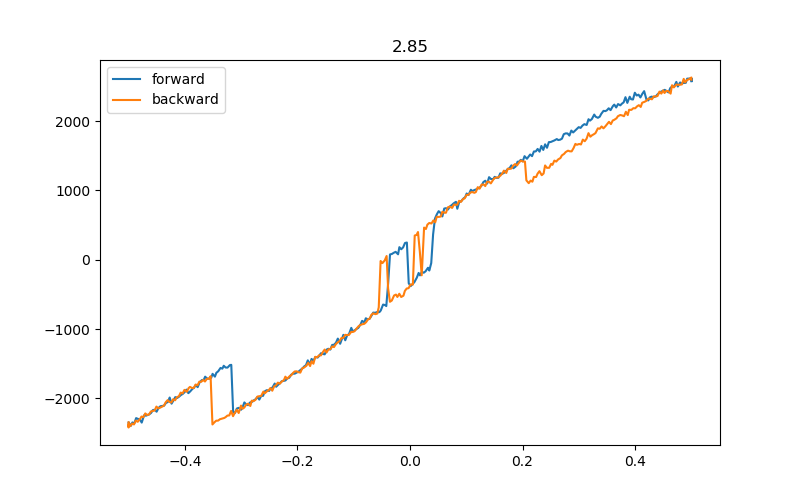

In [302]:
plt.figure(figsize=(8, 5))
plt.plot(data292.triton_field[:], data292.lockin830_X[:]/1e-9, label='forward')
plt.plot(data293.triton_field[:], data293.lockin830_X[:]/1e-9, label='backward')
plt.title('2.85')
plt.legend()

In [303]:
srframe.volt_p1(2.847)

In [304]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data294, plot294 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p847FieldSweepup_1nA_3p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data295, plot295 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p847FieldSweepdown_1nA_3p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 16:21:43
DataSet:
   location = 'data/2020-12-22/#092_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p847FieldSweepup_1nA_3p75K_16-21-42'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 16:32:01
Started at 2020-12-22 16:32:04
DataSet:
   location = 'data/2020-12-22/#093_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p847FieldSweepdown_1nA_3p75K_16-32-03'
   <Type>   | <

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


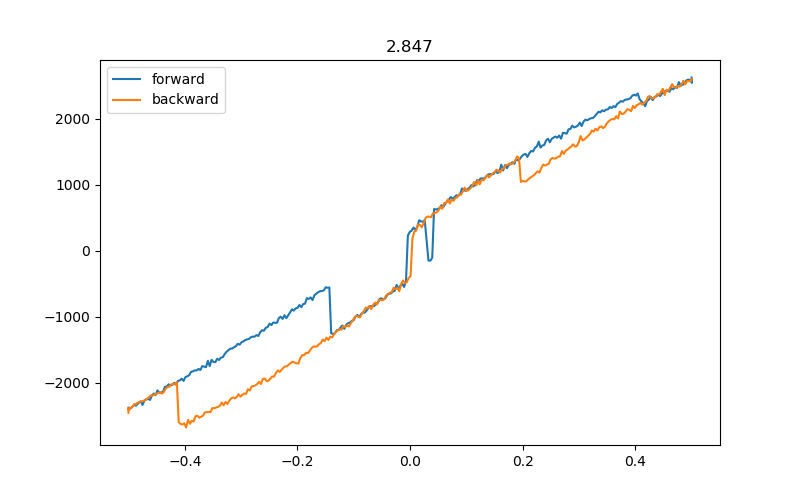

In [305]:
plt.figure(figsize=(8, 5))
plt.plot(data294.triton_field[:], data294.lockin830_X[:]/1e-9, label='forward')
plt.plot(data295.triton_field[:], data295.lockin830_X[:]/1e-9, label='backward')
plt.title('2.847')
plt.legend()

In [306]:
srframe.volt_p1(2.853)

In [307]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data296, plot296 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p853FieldSweepup_1nA_3p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data297, plot297 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p853FieldSweepdown_1nA_3p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 16:46:04
DataSet:
   location = 'data/2020-12-22/#094_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p853FieldSweepup_1nA_3p75K_16-46-03'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 16:56:21
Started at 2020-12-22 16:56:24
DataSet:
   location = 'data/2020-12-22/#095_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p853FieldSweepdown_1nA_3p75K_16-56-23'
   <Type>   | <

<IPython.core.display.Javascript object>


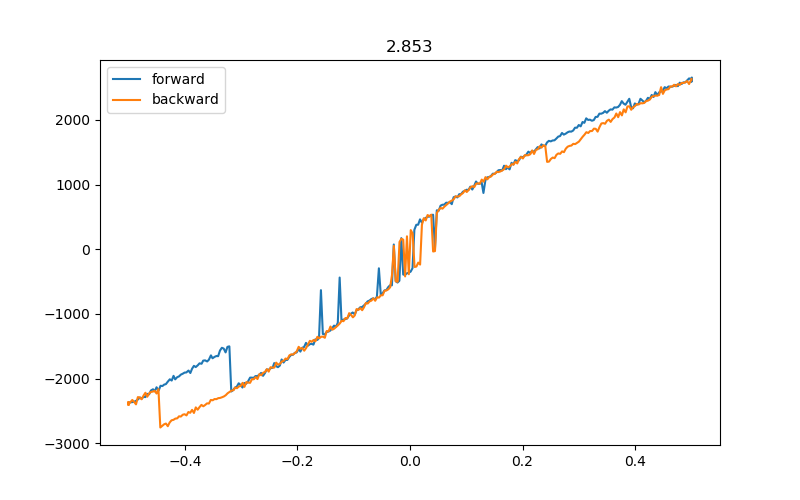

In [309]:
plt.figure(figsize=(8, 5))
plt.plot(data296.triton_field[:], data296.lockin830_X[:]/1e-9, label='forward')
plt.plot(data297.triton_field[:], data297.lockin830_X[:]/1e-9, label='backward')
plt.title('2.853')
plt.legend()

In [310]:
srframe.volt_p1(2.848)

In [311]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data298, plot298 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepup_1nA_3p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data299, plot299 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepdown_1nA_3p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 17:32:52
DataSet:
   location = 'data/2020-12-22/#096_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepup_1nA_3p75K_17-32-51'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 17:43:10
Started at 2020-12-22 17:43:13
DataSet:
   location = 'data/2020-12-22/#097_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepdown_1nA_3p75K_17-43-12'
   <Type>   | <

<IPython.core.display.Javascript object>


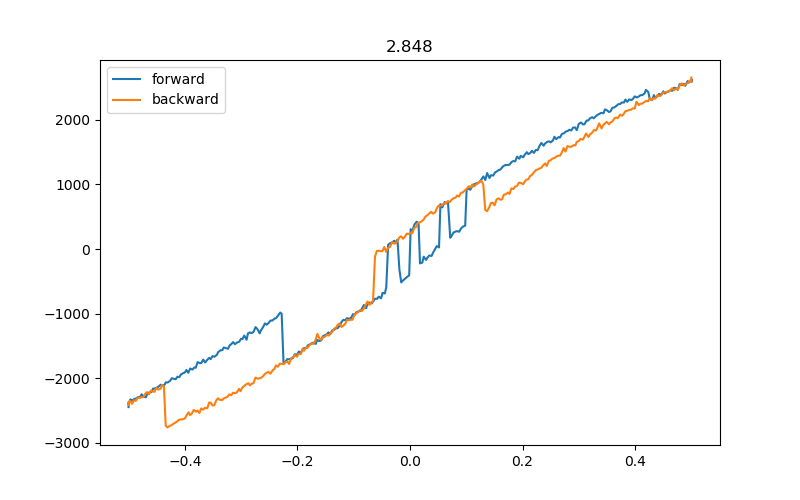

In [314]:
plt.figure(figsize=(8, 5))
plt.plot(data298.triton_field[:], data298.lockin830_X[:]/1e-9, label='forward')
plt.plot(data299.triton_field[:], data299.lockin830_X[:]/1e-9, label='backward')
plt.title('2.848')
plt.legend()

In [313]:
triton.pid_setpoint(3.5)

In [315]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data300, plot300 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data301, plot301 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 18:03:55
DataSet:
   location = 'data/2020-12-22/#098_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepup_1nA_3p5K_18-03-53'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 18:14:12
Started at 2020-12-22 18:14:15
DataSet:
   location = 'data/2020-12-22/#099_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepdown_1nA_3p5K_18-14-14'
   <Type>   | <ar

<IPython.core.display.Javascript object>


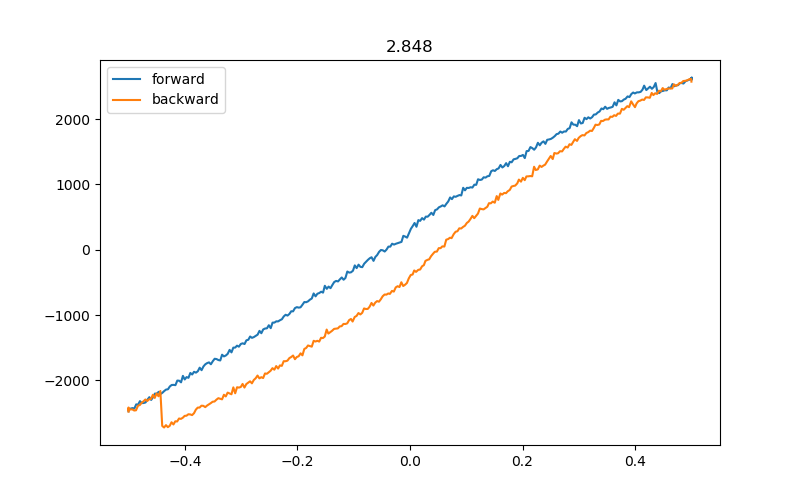

In [319]:
plt.figure(figsize=(8, 5))
plt.plot(data300.triton_field[:], data300.lockin830_X[:]/1e-9, label='forward')
plt.plot(data301.triton_field[:], data301.lockin830_X[:]/1e-9, label='backward')
plt.title('2.848')
plt.legend()

In [316]:
triton.pid_setpoint(4)

In [317]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data302, plot302 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data303, plot303 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 18:27:07
DataSet:
   location = 'data/2020-12-22/#100_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepup_1nA_4K_18-27-05'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 18:37:22
Started at 2020-12-22 18:37:25
DataSet:
   location = 'data/2020-12-22/#101_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepdown_1nA_4K_18-37-24'
   <Type>   | <array_

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


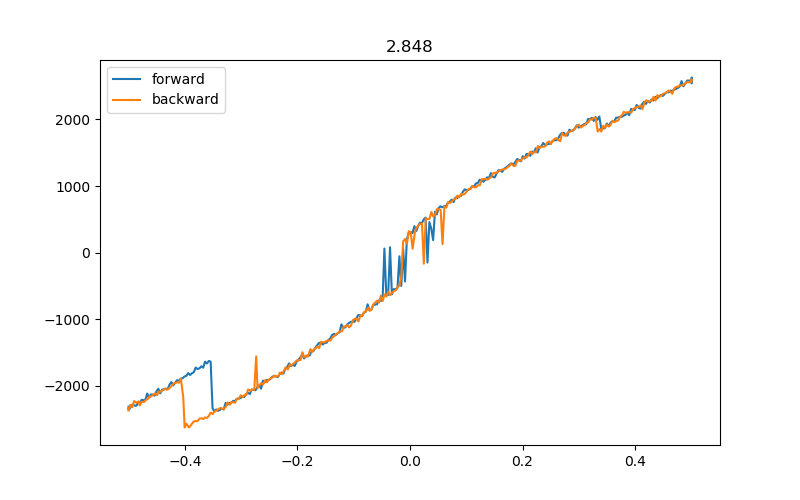

In [318]:
plt.figure(figsize=(8, 5))
plt.plot(data302.triton_field[:], data302.lockin830_X[:]/1e-9, label='forward')
plt.plot(data303.triton_field[:], data303.lockin830_X[:]/1e-9, label='backward')
plt.title('2.848')
plt.legend()

In [320]:
triton.pid_setpoint(3.5)

In [321]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data304, plot304 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data305, plot305 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 19:43:32
DataSet:
   location = 'data/2020-12-22/#102_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepup_1nA_3p5K_19-43-30'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 19:53:48
Started at 2020-12-22 19:53:52
DataSet:
   location = 'data/2020-12-22/#103_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p848FieldSweepdown_1nA_3p5K_19-53-51'
   <Type>   | <ar

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


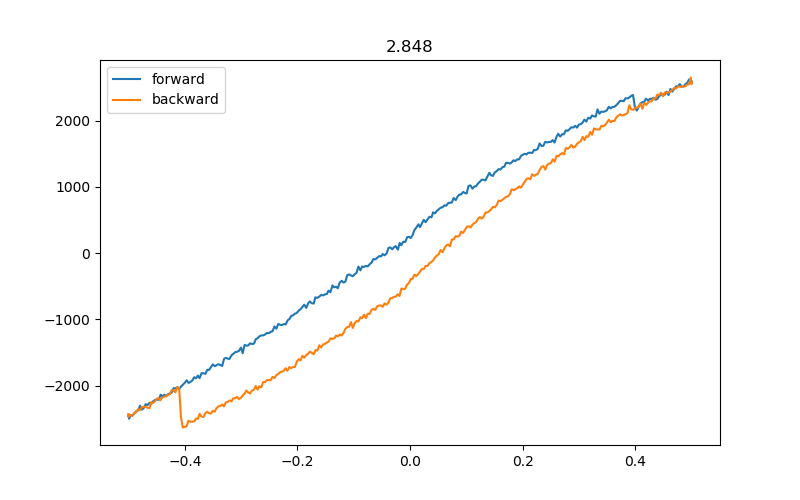

In [322]:
plt.figure(figsize=(8, 5))
plt.plot(data304.triton_field[:], data304.lockin830_X[:]/1e-9, label='forward')
plt.plot(data305.triton_field[:], data305.lockin830_X[:]/1e-9, label='backward')
plt.title('2.848')
plt.legend()

In [323]:
srframe.volt_p1(2.85)

In [324]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data306, plot306 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data307, plot307 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 20:19:36
DataSet:
   location = 'data/2020-12-22/#104_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepup_1nA_3p5K_20-19-35'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 20:29:53
Started at 2020-12-22 20:29:57
DataSet:
   location = 'data/2020-12-22/#105_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p85FieldSweepdown_1nA_3p5K_20-29-56'
   <Type>   | <arra

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


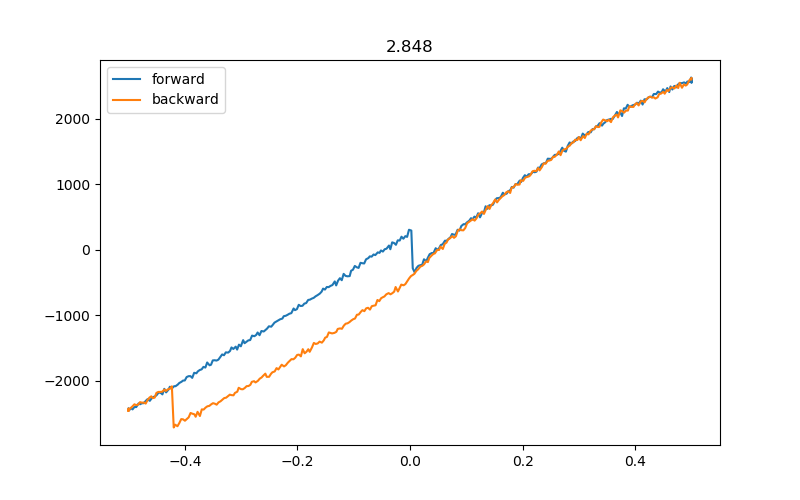

In [325]:
plt.figure(figsize=(8, 5))
plt.plot(data306.triton_field[:], data306.lockin830_X[:]/1e-9, label='forward')
plt.plot(data307.triton_field[:], data307.lockin830_X[:]/1e-9, label='backward')
plt.title('2.848')
plt.legend()

In [326]:
srframe.volt_p1(2.853)

In [327]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data308, plot308 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p853FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data309, plot309 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p853FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 20:42:55
DataSet:
   location = 'data/2020-12-22/#106_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p853FieldSweepup_1nA_3p5K_20-42-53'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 20:53:10
Started at 2020-12-22 20:53:14
DataSet:
   location = 'data/2020-12-22/#107_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p853FieldSweepdown_1nA_3p5K_20-53-13'
   <Type>   | <ar

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


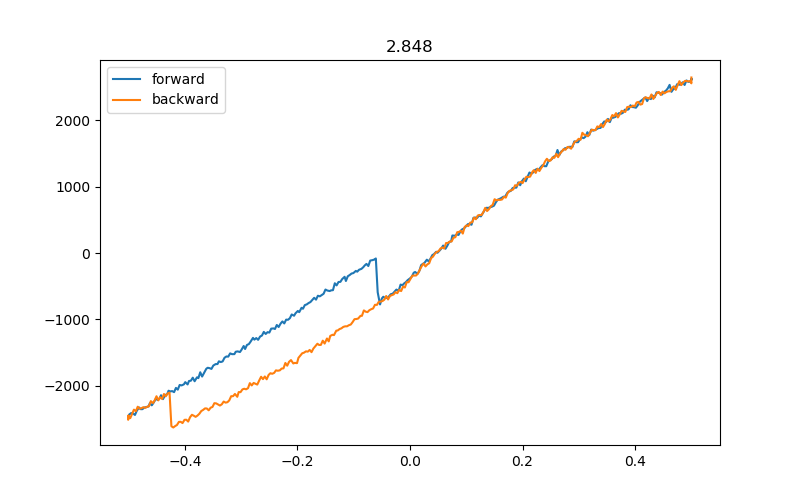

In [328]:
plt.figure(figsize=(8, 5))
plt.plot(data308.triton_field[:], data308.lockin830_X[:]/1e-9, label='forward')
plt.plot(data309.triton_field[:], data309.lockin830_X[:]/1e-9, label='backward')
plt.title('2.848')
plt.legend()

In [329]:
srframe.volt_p1(2.857)

In [330]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data310, plot310 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p857FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data311, plot311 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p857FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 21:13:29
DataSet:
   location = 'data/2020-12-22/#108_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p857FieldSweepup_1nA_3p5K_21-13-28'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 21:23:44
Started at 2020-12-22 21:23:48
DataSet:
   location = 'data/2020-12-22/#109_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p857FieldSweepdown_1nA_3p5K_21-23-47'
   <Type>   | <ar

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


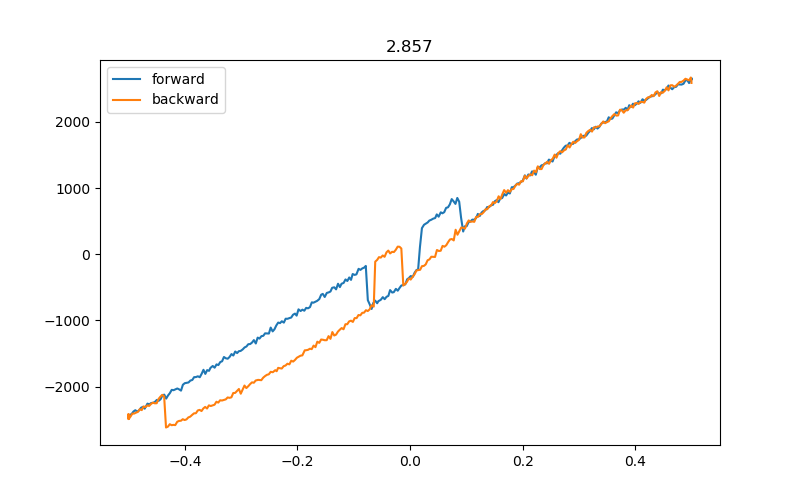

In [331]:
plt.figure(figsize=(8, 5))
plt.plot(data310.triton_field[:], data310.lockin830_X[:]/1e-9, label='forward')
plt.plot(data311.triton_field[:], data311.lockin830_X[:]/1e-9, label='backward')
plt.title('2.857')
plt.legend()

In [332]:
srframe.volt_p1(2.86)

In [333]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data312, plot312 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data313, plot313 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 21:35:35
DataSet:
   location = 'data/2020-12-22/#110_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepup_1nA_3p5K_21-35-34'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 21:45:52
Started at 2020-12-22 21:45:56
DataSet:
   location = 'data/2020-12-22/#111_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p86FieldSweepdown_1nA_3p5K_21-45-54'
   <Type>   | <arra

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


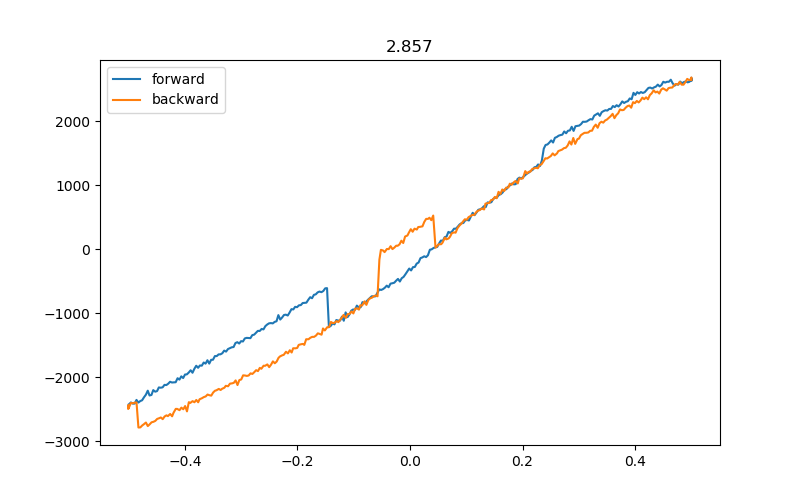

In [334]:
plt.figure(figsize=(8, 5))
plt.plot(data312.triton_field[:], data312.lockin830_X[:]/1e-9, label='forward')
plt.plot(data313.triton_field[:], data313.lockin830_X[:]/1e-9, label='backward')
plt.title('2.857')
plt.legend()

In [335]:
srframe.volt_p1(2.864)

In [336]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data314, plot314 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p864FieldSweepup_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data315, plot315 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p864FieldSweepdown_1nA_3p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 21:58:04
DataSet:
   location = 'data/2020-12-22/#112_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p864FieldSweepup_1nA_3p5K_21-58-02'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-22 22:08:21
Started at 2020-12-22 22:08:25
DataSet:
   location = 'data/2020-12-22/#113_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p864FieldSweepdown_1nA_3p5K_22-08-23'
   <Type>   | <ar

In [337]:
srframe.volt_p1(2.84)

In [338]:
bgvals = np.linspace(2.84, 2.88, 41)
for bg in bgvals:
    srframe.volt_p1(bg)
    time.sleep(15)
    bgstr = str(int(bg)) + 'p' + str(np.round(bg-int(bg), 4))[2:]
    triton.field(0.5)
    data316, plot316 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepup_1nA_3p5K'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
    triton.field(-0.5)
    data317, plot317 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepdown_1nA_3p5K'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-22 22:19:01
DataSet:
   location = 'data/2020-12-22/#114_S13_865_2-25_830_25-28_8302_2-29_vbg2p84V_FieldSweepup_1nA_3p5K_22-18-59'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-22 22:29:18
Started at 2020-12-22 22:29:22
DataSet:
   location = 'data/2020-12-22/#115_S13_865_2-25_830_25-28_8302_2-29_vbg2p84V_FieldSweepdown_1nA_3p5K_22-29-20'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         

  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-12-22/#123_S13_865_2-25_830_25-28_8302_2-29_vbg2p844V_FieldSweepdown_1nA_3p5K_23-53-05'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-23 00:03:22
Started at 2020-12-23 00:03:40
DataSet:
   location = 'data/2020-12-23/#001_S13_865_2-25_830_25-28_8302_2-29_vbg2p845V_FieldSweepup_1nA_3p5K_00-03-39'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Me

In [339]:
triton.pid_setpoint(1.5)

# 1.5K get the lower range of magnetism

In [340]:
srframe.volt_p1(2.25)

In [341]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data318, plot318 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p25FieldSweepup_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data319, plot319 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p25FieldSweepdown_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-23 13:03:18
DataSet:
   location = 'data/2020-12-23/#073_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p25FieldSweepup_1nA_1p5K_13-03-17'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2020-12-23 13:13:33
Started at 2020-12-23 13:13:37
DataSet:
   location = 'data/2020-12-23/#074_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p25FieldSweepdown_1nA_1p5K_13-13-35'
   <Type>   | <arra

In [342]:
bgvals = np.linspace(2.25, 2.5, 26)
for bg in bgvals:
    srframe.volt_p1(bg)
    time.sleep(15)
    bgstr = str(int(bg)) + 'p' + str(np.round(bg-int(bg), 4))[2:]
    triton.field(0.5)
    data320, plot320 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepup_1nA_1p5K'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
    triton.field(-0.5)
    data321, plot321 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_vbg{}V_FieldSweepdown_1nA_1p5K'.format(bgstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2020-12-23 13:25:04
DataSet:
   location = 'data/2020-12-23/#075_S13_865_2-25_830_25-28_8302_2-29_vbg2p25V_FieldSweepup_1nA_1p5K_13-25-02'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
Finished at 2020-12-23 13:35:21
Started at 2020-12-23 13:35:25
DataSet:
   location = 'data/2020-12-23/#076_S13_865_2-25_830_25-28_8302_2-29_vbg2p25V_FieldSweepdown_1nA_1p5K_13-35-23'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         

In [343]:
triton.pid_mode(0)

In [344]:
triton.field_set_stable(0)

In [345]:
triton.condense()

In [346]:
srframe.volt_p1(0)

In [379]:
lockin865.X()

1.7976988147e-06

In [380]:
triton.read_temps()

MC - on:  0.0229111 K
MC_cernox - on:  321.181 K
still - on:  0.679056 K
cold_plate - off:  0.0664829 K
magnet - off:  4.58957 K
PT2h - off:  3.3594 K
PT2p - off:  3.60925 K
PT1h - off:  47.2143 K
PT1p - off:  63.7227 K


In [381]:
triton.read_pressures()

P1:  -1.39466
P2:  329.826
P3:  0.0416
P4:  0.714
P5:  58.7907
POVC:  0.0003


In [348]:
triton.magnet_swh(0)

Wait 5 min for the switch to cool


In [382]:
triton.field_set_stable(-0.0008)

# now lockin865 30,29 lockin830 29-28 8302 2-25 8303 3-2 fan diagram

In [393]:
srframe.volt_p1(-11)#1nA
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data322, plot322 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_30-29_830_29-28_8302_2-25_8303_3-2_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-12-24 12:57:30
DataSet:
   location = 'data/2020-12-24/#002_S13_865_30-29_830_29-28_8302_2-25_8303_3-2_base_1nA_gatesweep_12-57-27'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
   Measured | lockin830_3_X       | X            | (576,)
   Measured | lockin830_3_Y       | Y            | (576,)
Finished at 2020-12-24 13:11:14


In [398]:
srframe.volt_p1(-11)#1nA
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data323, plot323 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_30-29_830_29-28_8302_2-25_8303_3-2_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-12-24 14:48:52
DataSet:
   location = 'data/2020-12-24/#003_S13_865_30-29_830_29-28_8302_2-25_8303_3-2_base_1nA_gatesweep_14-48-49'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
   Measured | lockin830_3_X       | X            | (576,)
   Measured | lockin830_3_Y       | Y            | (576,)
Finished at 2020-12-24 15:02:36


In [556]:
data_gate1 = qc.load_data('data/2020-12-03/#004_S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep_11-31-59')

In [557]:
data_gate2 = qc.load_data('data/2020-12-01/#004_S13_865_30-29_830_29-28_8302_31-30_base_1nA_gatesweep_22-12-38')

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


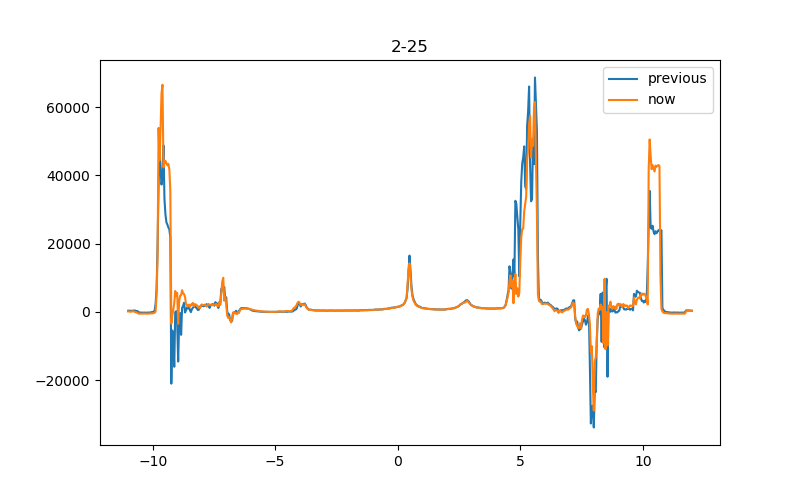

In [399]:
plt.figure(figsize=(8, 5))
plt.plot(data_gate1.srframe_volt_p1_set[:], abs(data_gate1.lockin830_X[:]/1e-9), label='previous')
plt.plot(data323.srframe_volt_p1_set[:], abs(data323.lockin830_2_X[:]/1e-9), label='now')
plt.title('2-25')
plt.legend()

<IPython.core.display.Javascript object>


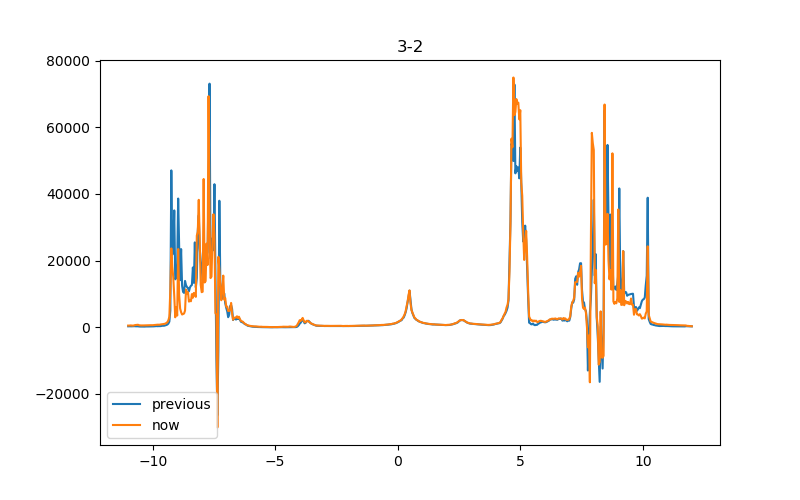

In [400]:
plt.figure(figsize=(8, 5))
plt.plot(data_gate1.srframe_volt_p1_set[:], abs(data_gate1.lockin865_X[:]/1e-9), label='previous')
plt.plot(data323.srframe_volt_p1_set[:], abs(data323.lockin830_3_X[:]/1e-9), label='now')
plt.title('3-2')
plt.legend()

<IPython.core.display.Javascript object>


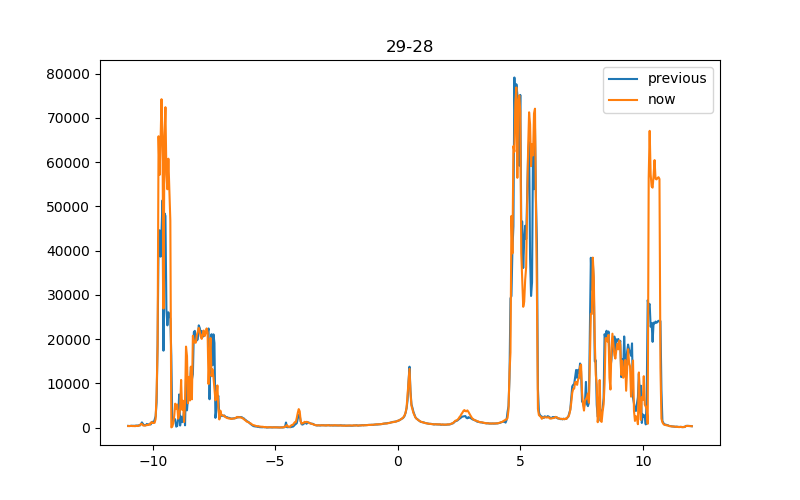

In [403]:
plt.figure(figsize=(8, 5))
plt.plot(data_gate2.srframe_volt_p1_set[:], abs(data_gate2.lockin830_X[:]/1e-9), label='previous')
plt.plot(data323.srframe_volt_p1_set[:], abs(data323.lockin830_X[:]/1e-9), label='now')
plt.title('29-28')
plt.legend()

<IPython.core.display.Javascript object>


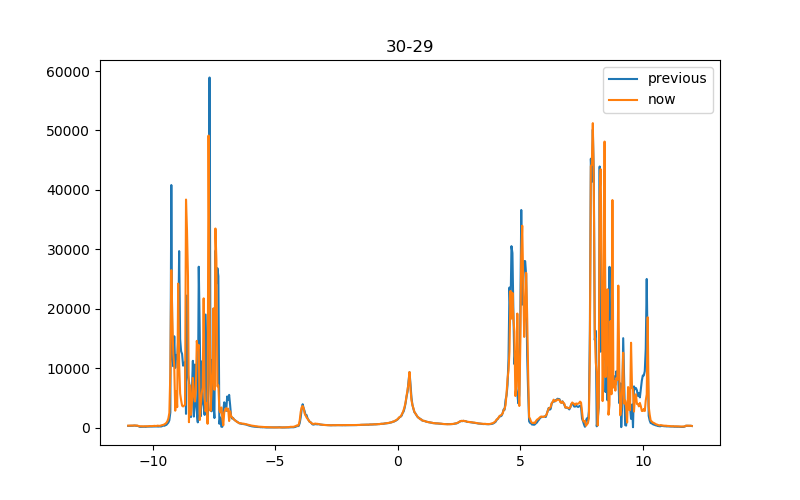

In [404]:
plt.figure(figsize=(8, 5))
plt.plot(data_gate2.srframe_volt_p1_set[:], abs(data_gate2.lockin865_X[:]/1e-9), label='previous')
plt.plot(data323.srframe_volt_p1_set[:], abs(data323.lockin865_X[:]/1e-9), label='now')
plt.title('30-29')
plt.legend()

In [405]:
gvals = np.linspace(-11, 12, 576)
Bvals = np.linspace(0, 4, 81)
data324, plot324 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_30-29_830_29-28_8302_2-25_8303_3-2_base_1nA_Landaufan')

Started at 2020-12-24 15:11:20
DataSet:
   location = 'data/2020-12-24/#004_S13_865_30-29_830_29-28_8302_2-25_8303_3-2_base_1nA_Landaufan_15-11-15'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (81,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (81, 576)
   Measured | lockin865_X                 | X                | (81, 576)
   Measured | lockin865_Y                 | Y                | (81, 576)
   Measured | lockin830_X                 | X                | (81, 576)
   Measured | lockin830_Y                 | Y                | (81, 576)
   Measured | lockin830_2_X               | X                | (81, 576)
   Measured | lockin830_2_Y               | Y                | (81, 576)
   Measured | lockin830_3_X               | X                | (81, 576)
   Measured | lockin830_3_Y               | Y                | (81, 576)
Finished at 2020-12-25 10:34:57


In [406]:
srframe.volt_p1(0)

In [407]:
triton.magnet_POC(1)

In [408]:
gvals = np.linspace(-11, 12, 576)
Bvals = np.concatenate((np.linspace(4.05, 7.95, 79), [7.998]))
data325, plot325 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_30-29_830_29-28_8302_2-25_8303_3-2_base_1nA_Landaufan')

Started at 2020-12-25 10:35:03
DataSet:
   location = 'data/2020-12-25/#001_S13_865_30-29_830_29-28_8302_2-25_8303_3-2_base_1nA_Landaufan_10-34-58'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (80,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (80, 576)
   Measured | lockin865_X                 | X                | (80, 576)
   Measured | lockin865_Y                 | Y                | (80, 576)
   Measured | lockin830_X                 | X                | (80, 576)
   Measured | lockin830_Y                 | Y                | (80, 576)
   Measured | lockin830_2_X               | X                | (80, 576)
   Measured | lockin830_2_Y               | Y                | (80, 576)
   Measured | lockin830_3_X               | X                | (80, 576)
   Measured | lockin830_3_Y               | Y                | (80, 576)
Finished at 2020-12-26 17:49:20
Keyboard Interrup

In [410]:
srframe.volt_p1(0)

In [581]:
triton.magnet_hold()

In [ ]:
triton.field_set_stable(-0.0008)

In [568]:
lockin865.X()

1.891096872e-06

In [15]:
triton.read_temps()

MC - on:  0.049699 K
MC_cernox - on:  321.181 K
still - on:  0.923597 K
cold_plate - off:  0.0664829 K
magnet - on:  4.35465 K
PT2h - off:  3.3594 K
PT2p - off:  3.60925 K
PT1h - off:  47.2143 K
PT1p - off:  63.7227 K


In [585]:
triton.field_set_stable(2)

In [589]:
triton.magnet_sweeprate(0.1)

In [593]:
triton.field_set_stable(5)

In [602]:
triton.field_set_stable(7.2)

In [ ]:
gvals = np.linspace(-11, 12, 576)
Bvals = np.concatenate((np.linspace(7.2, 7.95, 16), [7.998]))
data326, plot326 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_30-29_830_29-28_8302_2-25_8303_3-2_base_1nA_Landaufan')

Started at 2020-12-26 21:51:41


In [16]:
triton.field_set_stable(0.5)

Are you sure you want to use the magnet? [y/n]: y


#some part is missing here, not saved in the notebook

# Rxy T dependence 0.5T 865 25-28 830 2-29 8302 3-30 8303 4-31

In [18]:
lockin865.amplitude(0.3)

In [19]:
srframe.volt_p1(-11)#3nA
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data327, plot327 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep')
srframe.volt_p1(0)

Started at 2020-12-29 21:58:32
DataSet:
   location = 'data/2020-12-29/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_21-58-23'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
   Measured | lockin830_3_X       | X            | (576,)
   Measured | lockin830_3_Y       | Y            | (576,)
Finished at 2020-12-29 22:12:16


In [20]:
triton.pid_setpoint(0.05)

In [23]:
triton.pid_range(10)

In [22]:
triton.pid_mode(1)

In [24]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
bgvals = np.linspace(-11, 12, 576)
data328, plot328 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy0p5T')
srframe.volt_p1(0)

Started at 2020-12-29 22:17:26
DataSet:
   location = 'data/2020-12-29/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy0p5T_22-17-21'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 576)
   Measured | lockin865_X             | X            | (20, 576)
   Measured | lockin865_Y             | Y            | (20, 576)
   Measured | lockin830_X             | X            | (20, 576)
   Measured | lockin830_Y             | Y            | (20, 576)
   Measured | lockin830_2_X           | X            | (20, 576)
   Measured | lockin830_2_Y           | Y            | (20, 576)
   Measured | lockin830_3_X           | X            | (20, 576)
   Measured | lockin830_3_Y           | Y            | (20, 576)
Finished at 2020-12-30 03:44:17


In [25]:
triton.pid_range(31.6)
time.sleep(10)

In [26]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(1.1, 1.4, 4)
bgvals = np.linspace(-11, 12, 576)
data329, plot329 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy0p5T')
srframe.volt_p1(0)

Started at 2020-12-30 03:45:32
DataSet:
   location = 'data/2020-12-30/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy0p5T_03-45-27'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (4,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (4, 576)
   Measured | lockin865_X             | X            | (4, 576)
   Measured | lockin865_Y             | Y            | (4, 576)
   Measured | lockin830_X             | X            | (4, 576)
   Measured | lockin830_Y             | Y            | (4, 576)
   Measured | lockin830_2_X           | X            | (4, 576)
   Measured | lockin830_2_Y           | Y            | (4, 576)
   Measured | lockin830_3_X           | X            | (4, 576)
   Measured | lockin830_3_Y           | Y            | (4, 576)
Finished at 2020-12-30 04:50:31


In [27]:
triton.pid_range(100)
time.sleep(10)

In [28]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(1.5, 2, 6)
bgvals = np.linspace(-11, 12, 576)
data330, plot330 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy0p5T')
srframe.volt_p1(0)

Started at 2020-12-30 04:51:46
DataSet:
   location = 'data/2020-12-30/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy0p5T_04-51-41'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (6, 576)
   Measured | lockin865_X             | X            | (6, 576)
   Measured | lockin865_Y             | Y            | (6, 576)
   Measured | lockin830_X             | X            | (6, 576)
   Measured | lockin830_Y             | Y            | (6, 576)
   Measured | lockin830_2_X           | X            | (6, 576)
   Measured | lockin830_2_Y           | Y            | (6, 576)
   Measured | lockin830_3_X           | X            | (6, 576)
   Measured | lockin830_3_Y           | Y            | (6, 576)
Finished at 2020-12-30 06:29:27


In [29]:
triton.pid_setpoint(2.2)

In [30]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(2.2, 10, 40)
bgvals = np.linspace(-11, 12, 576)
data331, plot331 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy0p5T')
srframe.volt_p1(0)

Started at 2020-12-30 09:50:22
DataSet:
   location = 'data/2020-12-30/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy0p5T_09-50-17'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (40,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (40, 576)
   Measured | lockin865_X             | X            | (40, 576)
   Measured | lockin865_Y             | Y            | (40, 576)
   Measured | lockin830_X             | X            | (40, 576)
   Measured | lockin830_Y             | Y            | (40, 576)
   Measured | lockin830_2_X           | X            | (40, 576)
   Measured | lockin830_2_Y           | Y            | (40, 576)
   Measured | lockin830_3_X           | X            | (40, 576)
   Measured | lockin830_3_Y           | Y            | (40, 576)
Finished at 2020-12-30 20:45:45


In [31]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(10.5, 25, 30)
bgvals = np.linspace(-11, 12, 576)
data332, plot332 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=240, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy0p5T')
srframe.volt_p1(0)

Started at 2020-12-30 20:46:49
DataSet:
   location = 'data/2020-12-30/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy0p5T_20-46-45'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (30,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (30, 576)
   Measured | lockin865_X             | X            | (30, 576)
   Measured | lockin865_Y             | Y            | (30, 576)
   Measured | lockin830_X             | X            | (30, 576)
   Measured | lockin830_Y             | Y            | (30, 576)
   Measured | lockin830_2_X           | X            | (30, 576)
   Measured | lockin830_2_Y           | Y            | (30, 576)
   Measured | lockin830_3_X           | X            | (30, 576)
   Measured | lockin830_3_Y           | Y            | (30, 576)
Finished at 2020-12-31 05:27:13


In [32]:
triton.pid_mode(0)

In [70]:
triton.read_temps()

MC - on:  0.35645 K
MC_cernox - on:  1.21336 K
still - on:  1.26609 K
cold_plate - off:  0.0664829 K
magnet - on:  4.26191 K
PT2h - off:  3.3594 K
PT2p - off:  3.60925 K
PT1h - off:  47.2143 K
PT1p - off:  63.7227 K


In [69]:
triton.read_pressures()

P1:  10.9537
P2:  771.164
P3:  6.2
P4:  3.7
P5:  111.505
POVC:  0.0003


In [64]:
triton.field_set_stable(-0.5)

# Rxy T dependence -0.5T 865 25-28 830 2-29 8302 3-30 8303 4-31

In [71]:
srframe.volt_p1(-11)#3nA
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data333, plot333 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_-0p5T')
srframe.volt_p1(0)

Started at 2020-12-31 15:14:15
DataSet:
   location = 'data/2020-12-31/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_-0p5T_15-14-12'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
   Measured | lockin830_3_X       | X            | (576,)
   Measured | lockin830_3_Y       | Y            | (576,)
Finished at 2020-12-31 15:27:59


In [72]:
triton.pid_setpoint(0.05)

In [75]:
triton.pid_range(10)

In [74]:
triton.pid_mode(1)

In [76]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
bgvals = np.linspace(-11, 12, 576)
data334, plot334 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy-0p5T')
srframe.volt_p1(0)

Started at 2020-12-31 15:31:21
DataSet:
   location = 'data/2020-12-31/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy-0p5T_15-31-16'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 576)
   Measured | lockin865_X             | X            | (20, 576)
   Measured | lockin865_Y             | Y            | (20, 576)
   Measured | lockin830_X             | X            | (20, 576)
   Measured | lockin830_Y             | Y            | (20, 576)
   Measured | lockin830_2_X           | X            | (20, 576)
   Measured | lockin830_2_Y           | Y            | (20, 576)
   Measured | lockin830_3_X           | X            | (20, 576)
   Measured | lockin830_3_Y           | Y            | (20, 576)
Finished at 2020-12-31 20:58:04


In [77]:
triton.pid_range(31.6)
time.sleep(10)

In [78]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(1.1, 1.4, 4)
bgvals = np.linspace(-11, 12, 576)
data335, plot335 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p5T')
srframe.volt_p1(0)

Started at 2020-12-31 20:59:19
DataSet:
   location = 'data/2020-12-31/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p5T_20-59-14'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (4,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (4, 576)
   Measured | lockin865_X             | X            | (4, 576)
   Measured | lockin865_Y             | Y            | (4, 576)
   Measured | lockin830_X             | X            | (4, 576)
   Measured | lockin830_Y             | Y            | (4, 576)
   Measured | lockin830_2_X           | X            | (4, 576)
   Measured | lockin830_2_Y           | Y            | (4, 576)
   Measured | lockin830_3_X           | X            | (4, 576)
   Measured | lockin830_3_Y           | Y            | (4, 576)
Finished at 2020-12-31 22:04:15


In [79]:
triton.pid_range(100)
time.sleep(10)

In [80]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(1.5, 2, 6)
bgvals = np.linspace(-11, 12, 576)
data336, plot336 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy-0p5T')
srframe.volt_p1(0)

Started at 2020-12-31 22:05:30
DataSet:
   location = 'data/2020-12-31/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy-0p5T_22-05-25'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (6, 576)
   Measured | lockin865_X             | X            | (6, 576)
   Measured | lockin865_Y             | Y            | (6, 576)
   Measured | lockin830_X             | X            | (6, 576)
   Measured | lockin830_Y             | Y            | (6, 576)
   Measured | lockin830_2_X           | X            | (6, 576)
   Measured | lockin830_2_Y           | Y            | (6, 576)
   Measured | lockin830_3_X           | X            | (6, 576)
   Measured | lockin830_3_Y           | Y            | (6, 576)
Finished at 2020-12-31 23:43:12


In [81]:
triton.pid_setpoint(2.2)

In [82]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(2.2, 10, 40)
bgvals = np.linspace(-11, 12, 576)
data337, plot337 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T')
srframe.volt_p1(0)

Started at 2021-01-01 00:23:40
DataSet:
   location = 'data/2021-01-01/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T_00-23-35'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (40,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (40, 576)
   Measured | lockin865_X             | X            | (40, 576)
   Measured | lockin865_Y             | Y            | (40, 576)
   Measured | lockin830_X             | X            | (40, 576)
   Measured | lockin830_Y             | Y            | (40, 576)
   Measured | lockin830_2_X           | X            | (40, 576)
   Measured | lockin830_2_Y           | Y            | (40, 576)
   Measured | lockin830_3_X           | X            | (40, 576)
   Measured | lockin830_3_Y           | Y            | (40, 576)
Finished at 2021-01-01 11:18:08


In [87]:
triton.pid_setpoint(10.5)

In [88]:
triton.pid_range(100)

In [89]:
triton.pid_mode(1)

In [90]:
srframe.volt_p1(-11)
time.sleep(25)
Tvals = np.linspace(10.5, 25, 30)
bgvals = np.linspace(-11, 12, 576)
data338, plot338 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=240, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy-0p5T')
srframe.volt_p1(0)

Started at 2021-01-01 11:32:21
DataSet:
   location = 'data/2021-01-01/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy-0p5T_11-32-16'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (30,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (30, 576)
   Measured | lockin865_X             | X            | (30, 576)
   Measured | lockin865_Y             | Y            | (30, 576)
   Measured | lockin830_X             | X            | (30, 576)
   Measured | lockin830_Y             | Y            | (30, 576)
   Measured | lockin830_2_X           | X            | (30, 576)
   Measured | lockin830_2_Y           | Y            | (30, 576)
   Measured | lockin830_3_X           | X            | (30, 576)
   Measured | lockin830_3_Y           | Y            | (30, 576)
Finished at 2021-01-01 20:15:48


In [508]:
triton.write('SET:DEV:V9:VALV:SIG:STATE:OPEN')

In [500]:
triton.write('SET:DEV:V9:VALV:SIG:STATE:CLOSE')

In [91]:
triton.pid_mode(0)

In [552]:
triton.read_temps()

MC - on:  0.0409667 K
MC_cernox - on:  321.181 K
still - on:  0.882704 K
cold_plate - off:  0.0664829 K
magnet - off:  4.22324 K
PT2h - off:  3.3594 K
PT2p - off:  3.60925 K
PT1h - off:  47.2143 K
PT1p - off:  63.7227 K


In [329]:
triton.condense()

In [549]:
triton.read_pressures()

P1:  14.4818
P2:  884.011
P3:  0.1
P4:  5.0
P5:  130.391
POVC:  0.0003


In [550]:
triton.ask('READ:SYS:DR:ACTN')

'STAT:SYS:DR:ACTN:COND'

In [544]:
triton.read_valves()

V1:  OPEN
V2:  CLOSE
V3:  CLOSE
V4:  CLOSE
V5:  OPEN
V6:  CLOSE
V7:  CLOSE
V8:  CLOSE
V9:  CLOSE


In [545]:
triton.read_pumps()

Turbo: 1,  speed: 819.0 Hz
KNF: 1
Forepump: 1


In [534]:
triton.turbo(1)

In [554]:
lockin865.amplitude(0.1)

# dV/dI T dependence for BKT 

In [555]:
srframe.volt_p1(-11)#1nA
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data339, plot339 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2021-01-02 10:38:48
DataSet:
   location = 'data/2021-01-02/#001_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_base_1nA_gatesweep_10-38-44'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
   Measured | lockin830_3_X       | X            | (576,)
   Measured | lockin830_3_Y       | Y            | (576,)
Finished at 2021-01-02 10:52:30


<IPython.core.display.Javascript object>


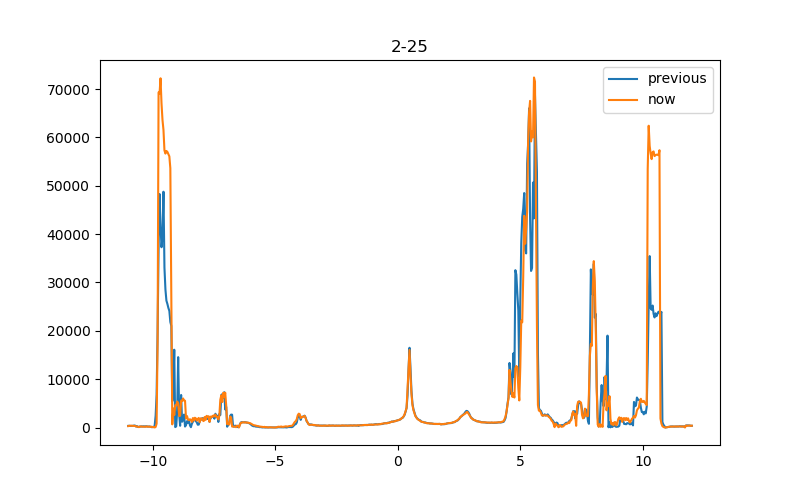

In [558]:
plt.figure(figsize=(8, 5))
plt.plot(data_gate1.srframe_volt_p1_set[:], abs(data_gate1.lockin830_X[:]/1e-9), label='previous')
plt.plot(data339.srframe_volt_p1_set[:], abs(data339.lockin830_X[:]/1e-9), label='now')
plt.title('2-25')
plt.legend()

<IPython.core.display.Javascript object>


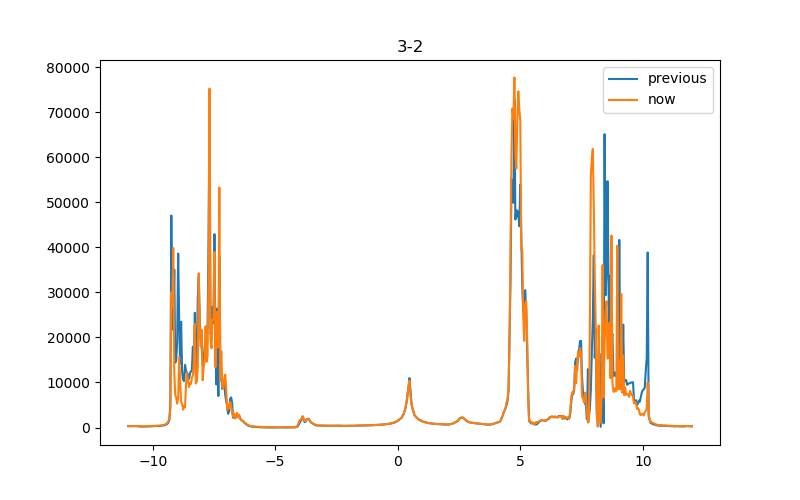

In [559]:
plt.figure(figsize=(8, 5))
plt.plot(data_gate1.srframe_volt_p1_set[:], abs(data_gate1.lockin865_X[:]/1e-9), label='previous')
plt.plot(data339.srframe_volt_p1_set[:], abs(data339.lockin865_X[:]/1e-9), label='now')
plt.title('3-2')
plt.legend()

<IPython.core.display.Javascript object>


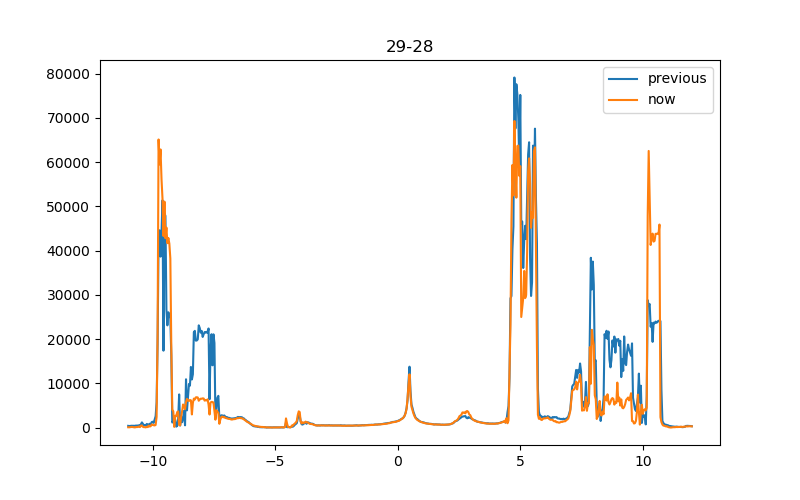

In [560]:
plt.figure(figsize=(8, 5))
plt.plot(data_gate2.srframe_volt_p1_set[:], abs(data_gate2.lockin830_X[:]/1e-9), label='previous')
plt.plot(data339.srframe_volt_p1_set[:], abs(data339.lockin830_2_X[:]/1e-9), label='now')
plt.title('29-28')
plt.legend()

<IPython.core.display.Javascript object>


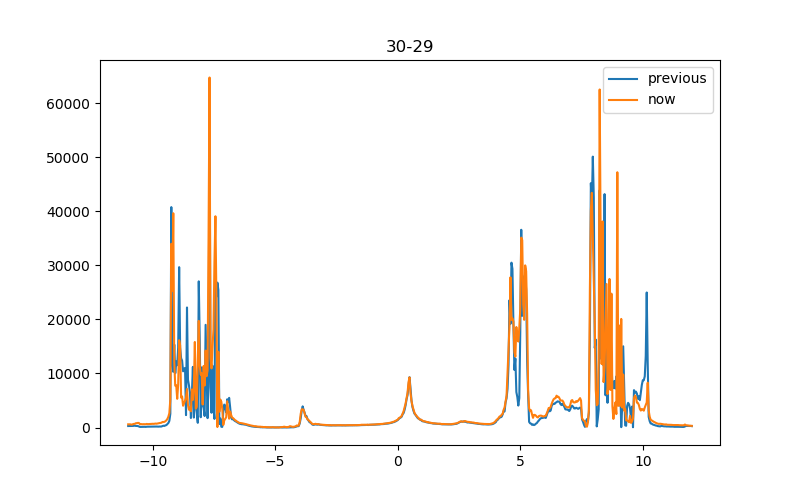

In [561]:
plt.figure(figsize=(8, 5))
plt.plot(data_gate2.srframe_volt_p1_set[:], abs(data_gate2.lockin865_X[:]/1e-9), label='previous')
plt.plot(data339.srframe_volt_p1_set[:], abs(data339.lockin830_3_X[:]/1e-9), label='now')
plt.title('30-29')
plt.legend()

In [562]:
lockin865.amplitude(0.01)# 1nA 10Mohm

In [565]:
srframe.volt_p1(-6)

In [566]:
bgvals = np.linspace(-6, -4, 41)
Ivals = np.linspace(-1.7, 1.7, 171)
data340, plot340 = npd.twod_param_sweep(srframe.volt_p1, bgvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=15, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_gate_Ic_hole_baseT', ZParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
srframe.volt_p5(0)

Started at 2021-01-02 11:03:28
DataSet:
   location = 'data/2021-01-02/#003_S13_865_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_gate_Ic_hole_baseT_11-03-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (41,)
   Setpoint | srframe_volt_p5_set | volt_p5      | (41, 171)
   Measured | lockin865_X         | X            | (41, 171)
   Measured | lockin865_Y         | Y            | (41, 171)
   Measured | lockin830_X         | X            | (41, 171)
   Measured | lockin830_Y         | Y            | (41, 171)
   Measured | lockin830_2_X       | X            | (41, 171)
   Measured | lockin830_2_Y       | Y            | (41, 171)
   Measured | lockin830_3_X       | X            | (41, 171)
   Measured | lockin830_3_Y       | Y            | (41, 171)
Finished at 2021-01-02 13:43:53


In [567]:
srframe.volt_p1(-5.3)

In [568]:
srframe.volt_p5(-2)#1nA
time.sleep(30)
Ivals = np.linspace(-2, 2, 401)
data341, plot341 = npd.single_param_sweep(srframe.volt_p5, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_base_1nA_dV/dI_Vg-5p3V')
srframe.volt_p5(0)

Started at 2021-01-02 14:29:32
DataSet:
   location = 'data/2021-01-02/#004_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_base_1nA_dV/dI_Vg-5p3V_14-29-29'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (401,)
   Measured | lockin865_X         | X            | (401,)
   Measured | lockin865_Y         | Y            | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
   Measured | lockin830_2_X       | X            | (401,)
   Measured | lockin830_2_Y       | Y            | (401,)
   Measured | lockin830_3_X       | X            | (401,)
   Measured | lockin830_3_Y       | Y            | (401,)
Finished at 2021-01-02 14:39:05


In [603]:
triton.pid_setpoint(0.05)

In [606]:
triton.pid_range(10)

In [605]:
triton.pid_mode(1)

In [575]:
srframe.volt_p5(-2)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
Ivals = np.linspace(-2, 2, 401)
data342, plot342 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweepto1K_Vg-5p3V')
srframe.volt_p5(0)

Started at 2021-01-02 14:49:27
DataSet:
   location = 'data/2021-01-02/#005_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweepto1K_Vg-5p3V_14-49-23'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (20, 401)
   Measured | lockin865_X             | X            | (20, 401)
   Measured | lockin865_Y             | Y            | (20, 401)
   Measured | lockin830_X             | X            | (20, 401)
   Measured | lockin830_Y             | Y            | (20, 401)
   Measured | lockin830_2_X           | X            | (20, 401)
   Measured | lockin830_2_Y           | Y            | (20, 401)
   Measured | lockin830_3_X           | X            | (20, 401)
   Measured | lockin830_3_Y           | Y            | (20, 401)
Finished at 2021-01-02 18:40:33


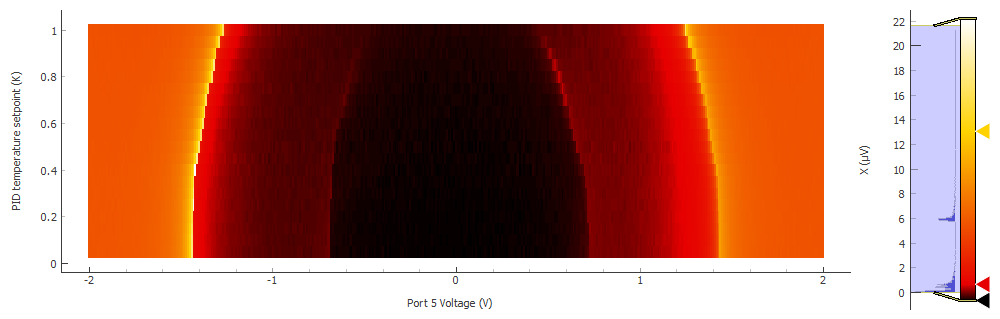

In [596]:
plot342[2]

In [576]:
triton.pid_range(31.6)
time.sleep(10)

In [577]:
srframe.volt_p5(-2)
time.sleep(25)
Tvals = np.linspace(1.05, 1.4, 8)
Ivals = np.linspace(-2, 2, 401)
data343, plot343 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p05to1p4K_Vg-5p3V')
srframe.volt_p5(0)

Started at 2021-01-02 18:41:16
DataSet:
   location = 'data/2021-01-02/#006_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p05to1p4K_Vg-5p3V_18-41-11'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (8,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (8, 401)
   Measured | lockin865_X             | X            | (8, 401)
   Measured | lockin865_Y             | Y            | (8, 401)
   Measured | lockin830_X             | X            | (8, 401)
   Measured | lockin830_Y             | Y            | (8, 401)
   Measured | lockin830_2_X           | X            | (8, 401)
   Measured | lockin830_2_Y           | Y            | (8, 401)
   Measured | lockin830_3_X           | X            | (8, 401)
   Measured | lockin830_3_Y           | Y            | (8, 401)
Finished at 2021-01-02 20:13:44


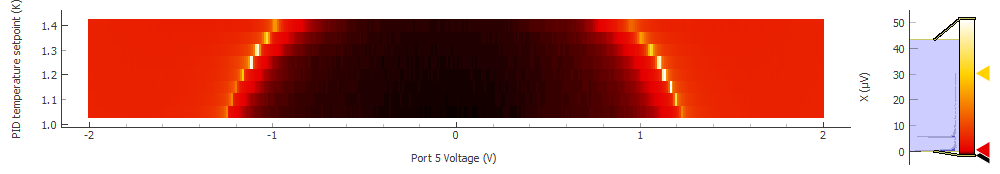

In [597]:
plot343[2]

In [578]:
triton.pid_range(100)
time.sleep(10)

In [579]:
srframe.volt_p5(-2)
time.sleep(25)
Tvals = np.linspace(1.45, 2, 12)
Ivals = np.linspace(-2, 2, 401)
data344, plot344 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p45to2K_Vg-5p3V')
srframe.volt_p5(0)

Started at 2021-01-02 20:14:27
DataSet:
   location = 'data/2021-01-02/#007_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p45to2K_Vg-5p3V_20-14-22'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (12,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (12, 401)
   Measured | lockin865_X             | X            | (12, 401)
   Measured | lockin865_Y             | Y            | (12, 401)
   Measured | lockin830_X             | X            | (12, 401)
   Measured | lockin830_Y             | Y            | (12, 401)
   Measured | lockin830_2_X           | X            | (12, 401)
   Measured | lockin830_2_Y           | Y            | (12, 401)
   Measured | lockin830_3_X           | X            | (12, 401)
   Measured | lockin830_3_Y           | Y            | (12, 401)
Finished at 2021-01-02 22:33:09


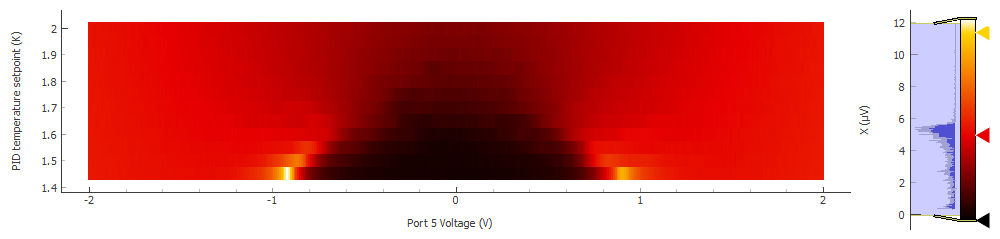

In [599]:
plot344[2]

In [580]:
triton.pid_mode(0)

In [593]:
triton.read_temps()

MC - on:  0.0379556 K
MC_cernox - off:  321.181 K
still - off:  0.702661 K
cold_plate - off:  0.0664829 K
magnet - off:  4.24965 K
PT2h - off:  3.3594 K
PT2p - off:  3.60925 K
PT1h - off:  47.2143 K
PT1p - off:  63.7227 K


In [587]:
srframe.volt_p1(0)

In [601]:
srframe.volt_p1(-5.05)

In [602]:
srframe.volt_p5(-2)#1nA
time.sleep(30)
Ivals = np.linspace(-2, 2, 401)
data345, plot345 = npd.single_param_sweep(srframe.volt_p5, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_base_1nA_dV/dI_Vg-5p05V')
srframe.volt_p5(0)

Started at 2021-01-03 11:40:38
DataSet:
   location = 'data/2021-01-03/#001_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_base_1nA_dV/dI_Vg-5p05V_11-40-35'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (401,)
   Measured | lockin865_X         | X            | (401,)
   Measured | lockin865_Y         | Y            | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
   Measured | lockin830_2_X       | X            | (401,)
   Measured | lockin830_2_Y       | Y            | (401,)
   Measured | lockin830_3_X       | X            | (401,)
   Measured | lockin830_3_Y       | Y            | (401,)
Finished at 2021-01-03 11:50:12


In [607]:
srframe.volt_p5(-2)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
Ivals = np.linspace(-2, 2, 401)
data346, plot346 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweepto1K_Vg-5p05V')
srframe.volt_p5(0)

Started at 2021-01-03 11:51:57
DataSet:
   location = 'data/2021-01-03/#002_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweepto1K_Vg-5p05V_11-51-52'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (20, 401)
   Measured | lockin865_X             | X            | (20, 401)
   Measured | lockin865_Y             | Y            | (20, 401)
   Measured | lockin830_X             | X            | (20, 401)
   Measured | lockin830_Y             | Y            | (20, 401)
   Measured | lockin830_2_X           | X            | (20, 401)
   Measured | lockin830_2_Y           | Y            | (20, 401)
   Measured | lockin830_3_X           | X            | (20, 401)
   Measured | lockin830_3_Y           | Y            | (20, 401)
Finished at 2021-01-03 15:42:58


In [608]:
triton.pid_range(31.6)
time.sleep(10)

In [609]:
srframe.volt_p5(-2)
time.sleep(25)
Tvals = np.linspace(1.05, 1.4, 8)
Ivals = np.linspace(-2, 2, 401)
data347, plot347 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p05to1p4K_Vg-5p05V')
srframe.volt_p5(0)

Started at 2021-01-03 15:43:41
DataSet:
   location = 'data/2021-01-03/#003_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p05to1p4K_Vg-5p05V_15-43-36'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (8,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (8, 401)
   Measured | lockin865_X             | X            | (8, 401)
   Measured | lockin865_Y             | Y            | (8, 401)
   Measured | lockin830_X             | X            | (8, 401)
   Measured | lockin830_Y             | Y            | (8, 401)
   Measured | lockin830_2_X           | X            | (8, 401)
   Measured | lockin830_2_Y           | Y            | (8, 401)
   Measured | lockin830_3_X           | X            | (8, 401)
   Measured | lockin830_3_Y           | Y            | (8, 401)
Finished at 2021-01-03 17:16:08


In [610]:
triton.pid_range(100)
time.sleep(10)

In [611]:
srframe.volt_p5(-2)
time.sleep(25)
Tvals = np.linspace(1.45, 2, 12)
Ivals = np.linspace(-2, 2, 401)
data348, plot348 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p45to2K_Vg-5p05V')
srframe.volt_p5(0)

Started at 2021-01-03 17:16:51
DataSet:
   location = 'data/2021-01-03/#004_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p45to2K_Vg-5p05V_17-16-46'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (12,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (12, 401)
   Measured | lockin865_X             | X            | (12, 401)
   Measured | lockin865_Y             | Y            | (12, 401)
   Measured | lockin830_X             | X            | (12, 401)
   Measured | lockin830_Y             | Y            | (12, 401)
   Measured | lockin830_2_X           | X            | (12, 401)
   Measured | lockin830_2_Y           | Y            | (12, 401)
   Measured | lockin830_3_X           | X            | (12, 401)
   Measured | lockin830_3_Y           | Y            | (12, 401)
Finished at 2021-01-03 19:35:31


In [612]:
triton.pid_setpoint(2.05)

In [613]:
srframe.volt_p5(-2)
time.sleep(25)
Tvals = np.linspace(2.05, 3, 20)
Ivals = np.linspace(-2, 2, 401)
data349, plot349 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep2p05to3K_Vg-5p05V')
srframe.volt_p5(0)

Started at 2021-01-03 21:39:16
DataSet:
   location = 'data/2021-01-03/#005_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep2p05to3K_Vg-5p05V_21-39-11'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (20, 401)
   Measured | lockin865_X             | X            | (20, 401)
   Measured | lockin865_Y             | Y            | (20, 401)
   Measured | lockin830_X             | X            | (20, 401)
   Measured | lockin830_Y             | Y            | (20, 401)
   Measured | lockin830_2_X           | X            | (20, 401)
   Measured | lockin830_2_Y           | Y            | (20, 401)
   Measured | lockin830_3_X           | X            | (20, 401)
   Measured | lockin830_3_Y           | Y            | (20, 401)
Finished at 2021-01-04 01:30:29


In [633]:
triton.pid_mode(0)

In [634]:
srframe.volt_p1(0)

In [635]:
triton.condense()

In [618]:
triton.read_temps()

MC - on:  0.0265653 K
MC_cernox - on:  321.181 K
still - on:  0.70142 K
cold_plate - off:  0.0664829 K
magnet - off:  4.24965 K
PT2h - off:  3.3594 K
PT2p - off:  3.60925 K
PT1h - off:  47.2143 K
PT1p - off:  63.7227 K


#go to Vg -5.3 for bigger range DC current 

In [619]:
srframe.volt_p1(-5.3)

In [620]:
srframe.volt_p5(-3)#1nA
time.sleep(30)
Ivals = np.linspace(-3, 3, 501)
data350, plot350 = npd.single_param_sweep(srframe.volt_p5, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_base_1nA_dV/dI_Vg-5p3V')
srframe.volt_p5(0)

Started at 2021-01-04 10:50:58
DataSet:
   location = 'data/2021-01-04/#001_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_base_1nA_dV/dI_Vg-5p3V_10-50-55'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (501,)
   Measured | lockin865_X         | X            | (501,)
   Measured | lockin865_Y         | Y            | (501,)
   Measured | lockin830_X         | X            | (501,)
   Measured | lockin830_Y         | Y            | (501,)
   Measured | lockin830_2_X       | X            | (501,)
   Measured | lockin830_2_Y       | Y            | (501,)
   Measured | lockin830_3_X       | X            | (501,)
   Measured | lockin830_3_Y       | Y            | (501,)
Finished at 2021-01-04 11:02:55


In [621]:
triton.pid_setpoint(0.05)

In [624]:
triton.pid_range(10)

In [623]:
triton.pid_mode(1)

In [625]:
srframe.volt_p5(-3)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
Ivals = np.linspace(-3, 3, 501)
data351, plot351 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweepto1K_Vg-5p3V')
srframe.volt_p5(0)

Started at 2021-01-04 11:31:54
DataSet:
   location = 'data/2021-01-04/#002_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweepto1K_Vg-5p3V_11-31-50'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (20, 501)
   Measured | lockin865_X             | X            | (20, 501)
   Measured | lockin865_Y             | Y            | (20, 501)
   Measured | lockin830_X             | X            | (20, 501)
   Measured | lockin830_Y             | Y            | (20, 501)
   Measured | lockin830_2_X           | X            | (20, 501)
   Measured | lockin830_2_Y           | Y            | (20, 501)
   Measured | lockin830_3_X           | X            | (20, 501)
   Measured | lockin830_3_Y           | Y            | (20, 501)
Finished at 2021-01-04 16:09:09


In [626]:
triton.pid_range(31.6)
time.sleep(10)

In [627]:
srframe.volt_p5(-3)
time.sleep(25)
Tvals = np.linspace(1.05, 1.4, 8)
Ivals = np.linspace(-3, 3, 501)
data352, plot352 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p05to1p4K_Vg-5p3V')
srframe.volt_p5(0)

Started at 2021-01-04 16:09:54
DataSet:
   location = 'data/2021-01-04/#003_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p05to1p4K_Vg-5p3V_16-09-49'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (8,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (8, 501)
   Measured | lockin865_X             | X            | (8, 501)
   Measured | lockin865_Y             | Y            | (8, 501)
   Measured | lockin830_X             | X            | (8, 501)
   Measured | lockin830_Y             | Y            | (8, 501)
   Measured | lockin830_2_X           | X            | (8, 501)
   Measured | lockin830_2_Y           | Y            | (8, 501)
   Measured | lockin830_3_X           | X            | (8, 501)
   Measured | lockin830_3_Y           | Y            | (8, 501)
Finished at 2021-01-04 17:59:30


In [628]:
triton.pid_range(100)
time.sleep(10)

In [629]:
srframe.volt_p5(-3)
time.sleep(25)
Tvals = np.linspace(1.45, 2, 12)
Ivals = np.linspace(-3, 3, 501)
data353, plot353 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p45to2K_Vg-5p3V')
srframe.volt_p5(0)

Started at 2021-01-04 18:00:13
DataSet:
   location = 'data/2021-01-04/#004_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep1p45to2K_Vg-5p3V_18-00-08'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (12,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (12, 501)
   Measured | lockin865_X             | X            | (12, 501)
   Measured | lockin865_Y             | Y            | (12, 501)
   Measured | lockin830_X             | X            | (12, 501)
   Measured | lockin830_Y             | Y            | (12, 501)
   Measured | lockin830_2_X           | X            | (12, 501)
   Measured | lockin830_2_Y           | Y            | (12, 501)
   Measured | lockin830_3_X           | X            | (12, 501)
   Measured | lockin830_3_Y           | Y            | (12, 501)
Finished at 2021-01-04 20:44:38


In [631]:
triton.pid_setpoint(2.05)

In [632]:
srframe.volt_p5(-3)
time.sleep(25)
Tvals = np.linspace(2.05, 3, 20)
Ivals = np.linspace(-3, 3, 501)
data354, plot354 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p5, Ivals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep2p05to3K_Vg-5p3V')
srframe.volt_p5(0)

Started at 2021-01-04 21:04:42
DataSet:
   location = 'data/2021-01-04/#005_S13_865_3-2_830_2-25_8302_29-28_8303_30-29_1nA_sweepDCcurrentTsweep2p05to3K_Vg-5p3V_21-04-37'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p5_set     | volt_p5      | (20, 501)
   Measured | lockin865_X             | X            | (20, 501)
   Measured | lockin865_Y             | Y            | (20, 501)
   Measured | lockin830_X             | X            | (20, 501)
   Measured | lockin830_Y             | Y            | (20, 501)
   Measured | lockin830_2_X           | X            | (20, 501)
   Measured | lockin830_2_Y           | Y            | (20, 501)
   Measured | lockin830_3_X           | X            | (20, 501)
   Measured | lockin830_3_Y           | Y            | (20, 501)
Finished at 2021-01-05 01:38:49


In [636]:
lockin865.amplitude(0.1) #come back to 100MOhm resistor

In [637]:
triton.field_set_stable(0.5)

# fine gate scan at low field

In [638]:
srframe.volt_p1(-11)#1nA
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data355, plot355 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_3-2_8303_2-29_base_1nA_gatesweep_0p5T')
srframe.volt_p1(0)

Started at 2021-01-05 10:19:41
DataSet:
   location = 'data/2021-01-05/#001_S13_865_2-25_830_25-28_8302_3-2_8303_2-29_base_1nA_gatesweep_0p5T_10-19-38'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
   Measured | lockin830_3_X       | X            | (576,)
   Measured | lockin830_3_Y       | Y            | (576,)
Finished at 2021-01-05 10:33:24


In [639]:
gvals = np.linspace(-11, 12, 576)
Bvals = np.linspace(0.5, -0.5, 101)
data356, plot356 = npd.twod_param_sweep(triton.field_set_stable, Bvals, srframe.volt_p1, gvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='S13_865_2-25_830_25-28_8302_3-2_8303_2-29_base_1nA_Blowfield')

Started at 2021-01-05 10:39:52
DataSet:
   location = 'data/2021-01-05/#002_S13_865_2-25_830_25-28_8302_3-2_8303_2-29_base_1nA_Blowfield_10-39-47'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (101,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (101, 576)
   Measured | lockin865_X                 | X                | (101, 576)
   Measured | lockin865_Y                 | Y                | (101, 576)
   Measured | lockin830_X                 | X                | (101, 576)
   Measured | lockin830_Y                 | Y                | (101, 576)
   Measured | lockin830_2_X               | X                | (101, 576)
   Measured | lockin830_2_Y               | Y                | (101, 576)
   Measured | lockin830_3_X               | X                | (101, 576)
   Measured | lockin830_3_Y               | Y                | (101, 576)
Finished at 2021-01-06 10:01:09
Keyboard

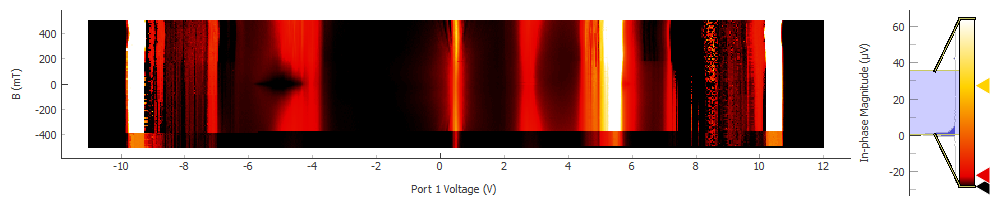

In [642]:
plot356[0]

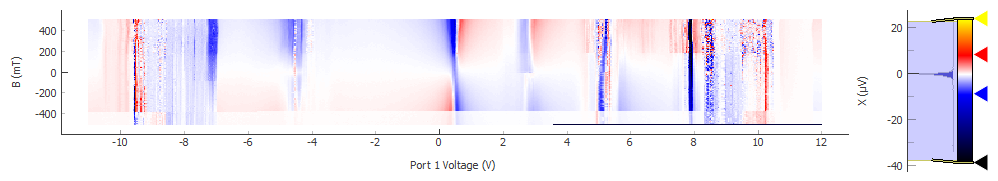

In [645]:
plot356[2]

In [640]:
srframe.volt_p1(0)

In [641]:
lockin865.amplitude(0.1)

In [646]:
#try one time gate sweep

In [675]:
srframe.volt_p1(-11)#1nA
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data357, plot357 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_3-2_8303_2-29_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2021-01-06 11:46:13
DataSet:
   location = 'data/2021-01-06/#002_S13_865_2-25_830_25-28_8302_3-2_8303_2-29_base_1nA_gatesweep_11-46-10'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
   Measured | lockin830_3_X       | X            | (576,)
   Measured | lockin830_3_Y       | Y            | (576,)
Finished at 2021-01-06 11:59:57


In [672]:
triton.read_temps()

MC - on:  0.0253259 K
MC_cernox - off:  1.21336 K
still - on:  0.753552 K
cold_plate - off:  0.317063 K
magnet - off:  4.24965 K
PT2h - off:  3.38952 K
PT2p - off:  3.6214 K
PT1h - off:  46.8279 K
PT1p - off:  63.0673 K


In [673]:
triton.read_pressures()

P1:  54.4325
P2:  562.007
P3:  0.0578
P4:  1.35
P5:  80.3225
POVC:  0.0003


In [674]:
triton.read_pumps()

Turbo: 1,  speed: 819.0 Hz
KNF: 1
Forepump: 1


In [695]:
triton.pid_setpoint(3)

In [689]:
triton.pid_range(100)

In [678]:
triton.pid_mode(1)

In [696]:
srframe.volt_p1(1.8)

In [697]:
lockin865.amplitude(0.2)

# 3K bigger range C-1 C3

In [698]:
srframe.volt_p1(1.8)#2nA
time.sleep(30)
gvals = np.linspace(1.8, 4.5, 271)
data358, plot358 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_2nA_gatesweep_5T')
srframe.volt_p1(1.8)

Started at 2021-01-06 14:09:22
DataSet:
   location = 'data/2021-01-06/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_2nA_gatesweep_5T_14-09-18'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (271,)
   Measured | lockin865_X         | X            | (271,)
   Measured | lockin865_Y         | Y            | (271,)
   Measured | lockin830_X         | X            | (271,)
   Measured | lockin830_Y         | Y            | (271,)
   Measured | lockin830_2_X       | X            | (271,)
   Measured | lockin830_2_Y       | Y            | (271,)
   Measured | lockin830_3_X       | X            | (271,)
   Measured | lockin830_3_Y       | Y            | (271,)
Finished at 2021-01-06 14:15:49


In [699]:
bgnvals = np.linspace(1.8, 4.5, 271)
bvals = np.linspace(5, -5, 251)
data359, plot359 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_3K_B-n_1quarter')
srframe.volt_p1(1.8)

Started at 2021-01-06 14:19:50
DataSet:
   location = 'data/2021-01-06/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_3K_B-n_1quarter_14-19-45'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (251,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (251, 271)
   Measured | lockin865_X                 | X                | (251, 271)
   Measured | lockin865_Y                 | Y                | (251, 271)
   Measured | lockin830_X                 | X                | (251, 271)
   Measured | lockin830_Y                 | Y                | (251, 271)
   Measured | lockin830_2_X               | X                | (251, 271)
   Measured | lockin830_2_Y               | Y                | (251, 271)
   Measured | lockin830_3_X               | X                | (251, 271)
   Measured | lockin830_3_Y               | Y                | (251, 271)
Finished at 2021-01-07 18:46:53


In [700]:
triton.pid_setpoint(5)

In [701]:
time.sleep(1200)

In [702]:
bgnvals = np.linspace(1.8, 4.5, 271)
bvals = np.linspace(-5, 5, 251)
data360, plot360 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_5K_B-n_1quarter')
srframe.volt_p1(1.8)

Started at 2021-01-07 19:07:02
DataSet:
   location = 'data/2021-01-07/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_5K_B-n_1quarter_19-06-57'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (251,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (251, 271)
   Measured | lockin865_X                 | X                | (251, 271)
   Measured | lockin865_Y                 | Y                | (251, 271)
   Measured | lockin830_X                 | X                | (251, 271)
   Measured | lockin830_Y                 | Y                | (251, 271)
   Measured | lockin830_2_X               | X                | (251, 271)
   Measured | lockin830_2_Y               | Y                | (251, 271)
   Measured | lockin830_3_X               | X                | (251, 271)
   Measured | lockin830_3_Y               | Y                | (251, 271)
Finished at 2021-01-08 23:25:12


In [703]:
triton.pid_setpoint(7.5)

In [704]:
time.sleep(1200)

In [705]:
bgnvals = np.linspace(1.8, 4.5, 271)
bvals = np.linspace(5, -5, 251)
data361, plot361 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_7p5K_B-n_1quarter')
srframe.volt_p1(1.8)

Started at 2021-01-08 23:45:21
DataSet:
   location = 'data/2021-01-08/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_7p5K_B-n_1quarter_23-45-16'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (251,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (251, 271)
   Measured | lockin865_X                 | X                | (251, 271)
   Measured | lockin865_Y                 | Y                | (251, 271)
   Measured | lockin830_X                 | X                | (251, 271)
   Measured | lockin830_Y                 | Y                | (251, 271)
   Measured | lockin830_2_X               | X                | (251, 271)
   Measured | lockin830_2_Y               | Y                | (251, 271)
   Measured | lockin830_3_X               | X                | (251, 271)
   Measured | lockin830_3_Y               | Y                | (251, 271)
Finished at 2021-01-10 04:04:26


In [706]:
srframe.volt_p1(0)

In [707]:
triton.pid_mode(0)

In [708]:
triton.field_set_stable(-2.5)

In [709]:
time.sleep(300)

In [710]:
triton.magnet_POC(1)

In [711]:
triton.field_set_stable(0)

In [712]:
triton.condense()

In [778]:
triton.read_temps()

MC - on:  1.52762 K
MC_cernox - on:  1.30853 K
still - on:  2.11357 K
cold_plate - off:  0.317063 K
magnet - on:  4.25519 K
PT2h - off:  3.38952 K
PT2p - off:  3.6214 K
PT1h - off:  46.8279 K
PT1p - off:  63.0673 K


# around one quarter 0.5T T dependence Rxx and Rxy

In [714]:
triton.field_set_stable(0.5)

In [716]:
lockin865.amplitude(0.3)

In [717]:
srframe.volt_p1(1.5)#3nA
time.sleep(30)
gvals = np.linspace(1.5, 4.5, 301)
data362, plot362 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_0p5T')
srframe.volt_p1(1.5)

Started at 2021-01-10 13:13:48
DataSet:
   location = 'data/2021-01-10/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_0p5T_13-13-45'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-10 13:20:59


In [718]:
triton.pid_setpoint(0.05)

In [721]:
triton.pid_range(10)

In [720]:
triton.pid_mode(1)

In [722]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
bgvals = np.linspace(1.5, 4.5, 301)
data363, plot363 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy0p5T')
srframe.volt_p1(1.5)

Started at 2021-01-10 13:26:47
DataSet:
   location = 'data/2021-01-10/#002_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy0p5T_13-26-42'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 301)
   Measured | lockin865_X             | X            | (20, 301)
   Measured | lockin865_Y             | Y            | (20, 301)
   Measured | lockin830_X             | X            | (20, 301)
   Measured | lockin830_Y             | Y            | (20, 301)
   Measured | lockin830_2_X           | X            | (20, 301)
   Measured | lockin830_2_Y           | Y            | (20, 301)
   Measured | lockin830_3_X           | X            | (20, 301)
   Measured | lockin830_3_Y           | Y            | (20, 301)
Finished at 2021-01-10 16:37:17


In [723]:
triton.pid_range(31.6)
time.sleep(10)

In [724]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(1.1, 1.4, 4)
bgvals = np.linspace(1.5, 4.5, 301)
data364, plot364 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy0p5T')
srframe.volt_p1(1.5)

Started at 2021-01-10 16:37:58
DataSet:
   location = 'data/2021-01-10/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy0p5T_16-37-53'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (4,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (4, 301)
   Measured | lockin865_X             | X            | (4, 301)
   Measured | lockin865_Y             | Y            | (4, 301)
   Measured | lockin830_X             | X            | (4, 301)
   Measured | lockin830_Y             | Y            | (4, 301)
   Measured | lockin830_2_X           | X            | (4, 301)
   Measured | lockin830_2_Y           | Y            | (4, 301)
   Measured | lockin830_3_X           | X            | (4, 301)
   Measured | lockin830_3_Y           | Y            | (4, 301)
Finished at 2021-01-10 17:16:06


In [725]:
triton.pid_range(100)
time.sleep(10)

In [726]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(1.5, 2, 6)
bgvals = np.linspace(1.5, 4.5, 301)
data365, plot365 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy0p5T')
srframe.volt_p1(1.5)

Started at 2021-01-10 17:16:46
DataSet:
   location = 'data/2021-01-10/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy0p5T_17-16-42'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (6, 301)
   Measured | lockin865_X             | X            | (6, 301)
   Measured | lockin865_Y             | Y            | (6, 301)
   Measured | lockin830_X             | X            | (6, 301)
   Measured | lockin830_Y             | Y            | (6, 301)
   Measured | lockin830_2_X           | X            | (6, 301)
   Measured | lockin830_2_Y           | Y            | (6, 301)
   Measured | lockin830_3_X           | X            | (6, 301)
   Measured | lockin830_3_Y           | Y            | (6, 301)
Finished at 2021-01-10 18:13:58


In [727]:
triton.pid_setpoint(2.2)

In [728]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(2.2, 10, 40)
bgvals = np.linspace(1.5, 4.5, 301)
data366, plot366 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy0p5T')
srframe.volt_p1(1.5)

Started at 2021-01-10 20:25:51
DataSet:
   location = 'data/2021-01-10/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy0p5T_20-25-47'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (40,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (40, 301)
   Measured | lockin865_X             | X            | (40, 301)
   Measured | lockin865_Y             | Y            | (40, 301)
   Measured | lockin830_X             | X            | (40, 301)
   Measured | lockin830_Y             | Y            | (40, 301)
   Measured | lockin830_2_X           | X            | (40, 301)
   Measured | lockin830_2_Y           | Y            | (40, 301)
   Measured | lockin830_3_X           | X            | (40, 301)
   Measured | lockin830_3_Y           | Y            | (40, 301)
Finished at 2021-01-11 02:47:02


In [754]:
srframe.volt_p1(0)

In [755]:
triton.pid_mode(0)

In [760]:
triton.condense()

In [733]:
triton.read_temps()

MC - on:  0.0270986 K
MC_cernox - off:  321.181 K
still - off:  0.677198 K
cold_plate - off:  0.317063 K
magnet - on:  4.6223 K
PT2h - off:  3.38952 K
PT2p - off:  3.6214 K
PT1h - off:  46.8279 K
PT1p - off:  63.0673 K


# around one quarter -0.5T T dependence Rxx and Rxy

In [734]:
srframe.volt_p1(1.5)#3nA
time.sleep(30)
gvals = np.linspace(1.5, 4.5, 301)
data367, plot367 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_-0p5T')
srframe.volt_p1(1.5)

Started at 2021-01-11 11:02:16
DataSet:
   location = 'data/2021-01-11/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_-0p5T_11-02-13'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-11 11:09:26


In [739]:
triton.pid_setpoint(0.05)

In [740]:
triton.pid_range(10)

In [737]:
triton.pid_mode(1)

In [741]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
bgvals = np.linspace(1.5, 4.5, 301)
data368, plot368 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy-0p5T')
srframe.volt_p1(1.5)

Started at 2021-01-11 11:38:23
DataSet:
   location = 'data/2021-01-11/#002_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy-0p5T_11-38-18'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 301)
   Measured | lockin865_X             | X            | (20, 301)
   Measured | lockin865_Y             | Y            | (20, 301)
   Measured | lockin830_X             | X            | (20, 301)
   Measured | lockin830_Y             | Y            | (20, 301)
   Measured | lockin830_2_X           | X            | (20, 301)
   Measured | lockin830_2_Y           | Y            | (20, 301)
   Measured | lockin830_3_X           | X            | (20, 301)
   Measured | lockin830_3_Y           | Y            | (20, 301)
Finished at 2021-01-11 14:48:53


In [742]:
triton.pid_range(31.6)
time.sleep(10)

In [743]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(1.1, 1.4, 4)
bgvals = np.linspace(1.5, 4.5, 301)
data369, plot369 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p5T')
srframe.volt_p1(1.5)

Started at 2021-01-11 14:49:34
DataSet:
   location = 'data/2021-01-11/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p5T_14-49-29'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (4,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (4, 301)
   Measured | lockin865_X             | X            | (4, 301)
   Measured | lockin865_Y             | Y            | (4, 301)
   Measured | lockin830_X             | X            | (4, 301)
   Measured | lockin830_Y             | Y            | (4, 301)
   Measured | lockin830_2_X           | X            | (4, 301)
   Measured | lockin830_2_Y           | Y            | (4, 301)
   Measured | lockin830_3_X           | X            | (4, 301)
   Measured | lockin830_3_Y           | Y            | (4, 301)
Finished at 2021-01-11 15:27:42


In [748]:
triton.pid_range(100)
time.sleep(10)

In [745]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(1.5, 2, 6)
bgvals = np.linspace(1.5, 4.5, 301)
data370, plot370 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy-0p5T')
srframe.volt_p1(1.5)

Started at 2021-01-11 15:28:22
DataSet:
   location = 'data/2021-01-11/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy-0p5T_15-28-17'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (6, 301)
   Measured | lockin865_X             | X            | (6, 301)
   Measured | lockin865_Y             | Y            | (6, 301)
   Measured | lockin830_X             | X            | (6, 301)
   Measured | lockin830_Y             | Y            | (6, 301)
   Measured | lockin830_2_X           | X            | (6, 301)
   Measured | lockin830_2_Y           | Y            | (6, 301)
   Measured | lockin830_3_X           | X            | (6, 301)
   Measured | lockin830_3_Y           | Y            | (6, 301)
Finished at 2021-01-11 16:25:35


In [747]:
triton.pid_setpoint(2.2)

In [750]:
triton.pid_mode(1)

In [751]:
triton.pid_range(100)

In [752]:
triton.pid_setpoint(2.2)

In [753]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(2.2, 10, 40)
bgvals = np.linspace(1.5, 4.5, 301)
data371, plot371 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T')
srframe.volt_p1(1.5)

Started at 2021-01-11 16:47:44
DataSet:
   location = 'data/2021-01-11/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T_16-47-39'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (40,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (40, 301)
   Measured | lockin865_X             | X            | (40, 301)
   Measured | lockin865_Y             | Y            | (40, 301)
   Measured | lockin830_X             | X            | (40, 301)
   Measured | lockin830_Y             | Y            | (40, 301)
   Measured | lockin830_2_X           | X            | (40, 301)
   Measured | lockin830_2_Y           | Y            | (40, 301)
   Measured | lockin830_3_X           | X            | (40, 301)
   Measured | lockin830_3_Y           | Y            | (40, 301)
Finished at 2021-01-11 23:08:54


In [813]:
triton.read_temps()

MC - on:  0.643902 K
MC_cernox - on:  1.21336 K
still - on:  0.676505 K
cold_plate - off:  0.317063 K
magnet - on:  4.32398 K
PT2h - off:  3.38952 K
PT2p - off:  3.6214 K
PT1h - off:  46.8279 K
PT1p - off:  63.0673 K


In [811]:
triton.read_pressures()

P1:  15.0007
P2:  1042.58
P3:  0.0886
P4:  2.2
P5:  115.604
POVC:  0.0003


# base T around one quarter fan

In [763]:
lockin865.amplitude(0.2)

In [808]:
triton.field_set_stable(-4)

In [814]:
triton.magnet_POC(0)

In [815]:
time.sleep(3600)

In [816]:
triton.field_set_stable(-5)

In [817]:
bgnvals = np.linspace(1.8, 4.5, 271)
bvals = np.linspace(-5, 5, 251)
data372, plot372 = npd.twod_param_sweep(triton.field_set_stable, bvals, srframe.volt_p1, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=1.8, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_base_B-n_1quarter')
srframe.volt_p1(1.8)

Started at 2021-01-12 02:41:43
DataSet:
   location = 'data/2021-01-12/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_base_B-n_1quarter_02-41-38'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (251,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (251, 271)
   Measured | lockin865_X                 | X                | (251, 271)
   Measured | lockin865_Y                 | Y                | (251, 271)
   Measured | lockin830_X                 | X                | (251, 271)
   Measured | lockin830_Y                 | Y                | (251, 271)
   Measured | lockin830_2_X               | X                | (251, 271)
   Measured | lockin830_2_Y               | Y                | (251, 271)
   Measured | lockin830_3_X               | X                | (251, 271)
   Measured | lockin830_3_Y               | Y                | (251, 271)
Finished at 2021-01-13 06:09:14


In [818]:
srframe.volt_p1(0)

In [819]:
triton.field_set_stable(3)

In [820]:
time.sleep(300)

In [821]:
triton.field_set_stable(0)

# check DC current switch again

In [822]:
triton.field_set_stable(-0.5)

In [824]:
lockin865.amplitude(0.1)

In [825]:
srframe.volt_p1(2.76)

In [826]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data373, plot373 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data374, plot374 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2021-01-13 10:36:25
DataSet:
   location = 'data/2021-01-13/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepup_1nA_base_10-36-24'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2021-01-13 10:46:41
Started at 2021-01-13 10:46:45
DataSet:
   location = 'data/2021-01-13/#002_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepdown_1nA_base_10-46-43'
   <Type>   | <ar

<IPython.core.display.Javascript object>


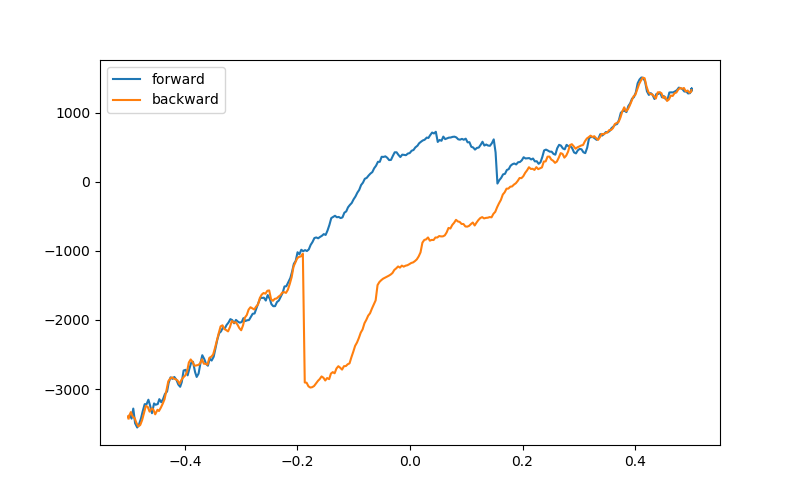

In [827]:
plt.figure(figsize=(8, 5))
plt.plot(data373.triton_field[:], data373.lockin830_X[:]/1e-9, label='forward')
plt.plot(data374.triton_field[:], data374.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [828]:
triton.field_set_stable(-0.0008)

In [829]:
srframe.volt_p5(0)
time.sleep(15)
bgvals = np.linspace(0, 7.5, 151)
data375, plot375 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_base')

Started at 2021-01-13 11:06:34
DataSet:
   location = 'data/2021-01-13/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_base_11-06-30'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2021-01-13 11:10:10


In [830]:
srframe.volt_p5(7.5)
time.sleep(15)
bgvals = np.linspace(7.5, -7.5, 301)
data376, plot376 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_base')

Started at 2021-01-13 11:10:29
DataSet:
   location = 'data/2021-01-13/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_base_11-10-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-13 11:17:38


In [831]:
srframe.volt_p5(-7.5)
time.sleep(15)
bgvals = np.linspace(-7.5, 7.5, 301)
data377, plot377 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_base')

Started at 2021-01-13 11:17:57
DataSet:
   location = 'data/2021-01-13/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_base_11-17-54'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-13 11:25:08


In [832]:
srframe.volt_p5(0)

<IPython.core.display.Javascript object>


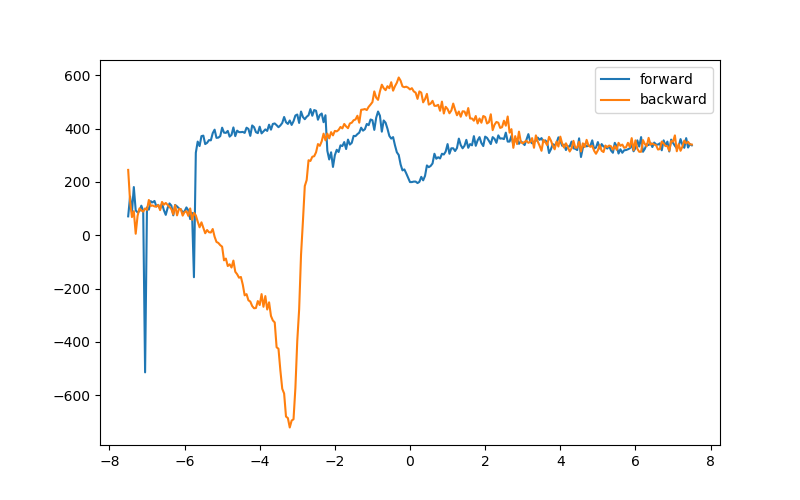

In [833]:
plt.figure(figsize=(8, 5))
plt.plot(data376.srframe_volt_p5_set[:], data376.lockin830_X[:]/1e-9, label='forward')
plt.plot(data377.srframe_volt_p5_set[:], data377.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [857]:
triton.pid_setpoint(2.5)

In [855]:
triton.pid_range(100)

In [856]:
triton.pid_mode(1)

In [858]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data378, plot378 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepup_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data379, plot379 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepdown_1nA_2p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2021-01-13 11:41:55
DataSet:
   location = 'data/2021-01-13/#006_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepup_1nA_2p5K_11-41-53'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2021-01-13 11:52:13
Started at 2021-01-13 11:52:17
DataSet:
   location = 'data/2021-01-13/#007_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepdown_1nA_2p5K_11-52-15'
   <Type>   | <ar

<IPython.core.display.Javascript object>


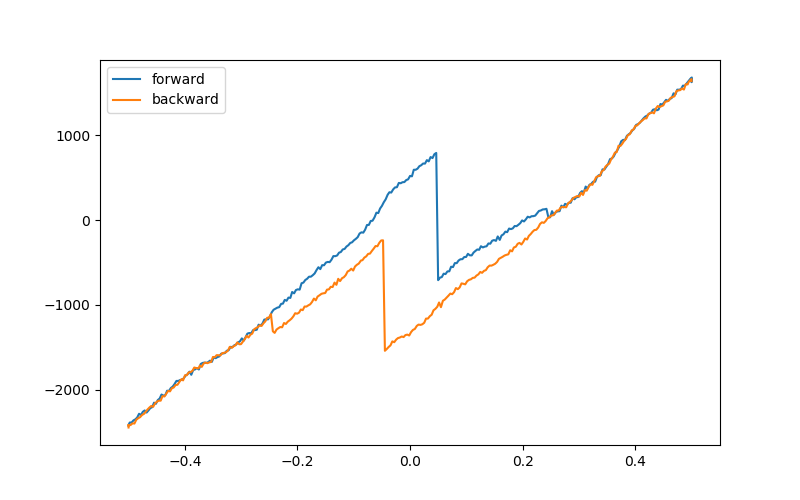

In [863]:
plt.figure(figsize=(8, 5))
plt.plot(data378.triton_field[:], data378.lockin830_X[:]/1e-9, label='forward')
plt.plot(data379.triton_field[:], data379.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [859]:
triton.field_set_stable(-0.0008)

In [860]:
srframe.volt_p5(0)
time.sleep(15)
bgvals = np.linspace(0, 7.5, 151)
data380, plot380 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_2p5K')

Started at 2021-01-13 12:08:03
DataSet:
   location = 'data/2021-01-13/#008_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_2p5K_12-08-00'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2021-01-13 12:11:40


In [861]:
srframe.volt_p5(7.5)
time.sleep(15)
bgvals = np.linspace(7.5, -7.5, 301)
data381, plot381 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_2p5K')

Started at 2021-01-13 12:11:59
DataSet:
   location = 'data/2021-01-13/#009_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_2p5K_12-11-56'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-13 12:19:10


In [862]:
srframe.volt_p5(-7.5)
time.sleep(15)
bgvals = np.linspace(-7.5, 7.5, 301)
data382, plot382 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_2p5K')

Started at 2021-01-13 12:19:29
DataSet:
   location = 'data/2021-01-13/#010_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p76_1nA_DCsweep_2p5K_12-19-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-13 12:26:40


<IPython.core.display.Javascript object>


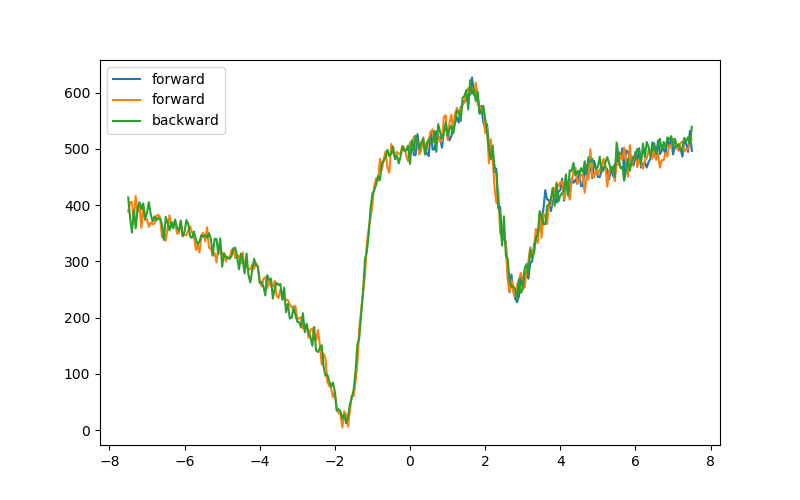

In [865]:
plt.figure(figsize=(8, 5))
plt.plot(data380.srframe_volt_p5_set[:], data380.lockin830_X[:]/1e-9, label='forward')
plt.plot(data381.srframe_volt_p5_set[:], data381.lockin830_X[:]/1e-9, label='forward')
plt.plot(data382.srframe_volt_p5_set[:], data382.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [866]:
srframe.volt_p1(2.7)

In [867]:
srframe.volt_p5(7.5)
time.sleep(15)
bgvals = np.linspace(7.5, -7.5, 301)
data383, plot383 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_2p5K')

Started at 2021-01-13 12:33:13
DataSet:
   location = 'data/2021-01-13/#011_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_2p5K_12-33-10'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-13 12:40:25


In [868]:
srframe.volt_p5(-7.5)
time.sleep(15)
bgvals = np.linspace(-7.5, 7.5, 301)
data384, plot384 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_2p5K')

Started at 2021-01-13 12:40:44
DataSet:
   location = 'data/2021-01-13/#012_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_2p5K_12-40-41'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-13 12:47:55


In [870]:
srframe.volt_p5(0)

<IPython.core.display.Javascript object>


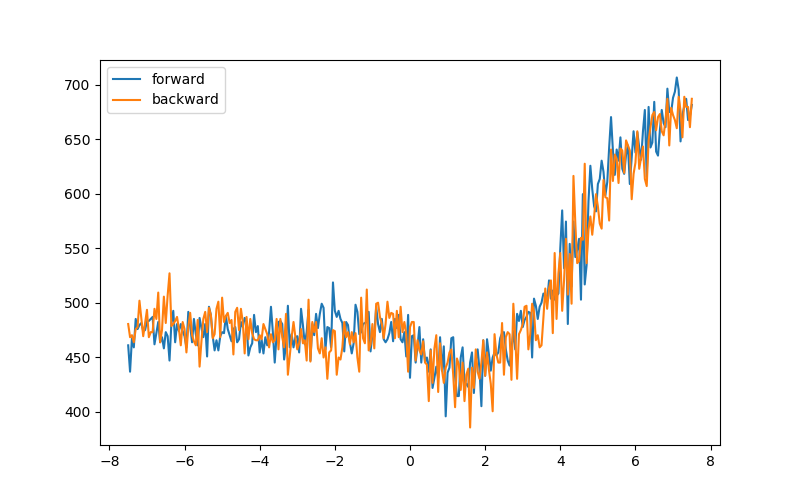

In [869]:
plt.figure(figsize=(8, 5))
plt.plot(data383.srframe_volt_p5_set[:], data383.lockin830_X[:]/1e-9, label='forward')
plt.plot(data384.srframe_volt_p5_set[:], data384.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [871]:
triton.field_set_stable(-0.5)

In [872]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data385, plot385 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data386, plot386 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2021-01-13 13:01:24
DataSet:
   location = 'data/2021-01-13/#013_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepup_1nA_4K_13-01-23'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2021-01-13 13:11:40
Started at 2021-01-13 13:11:43
DataSet:
   location = 'data/2021-01-13/#014_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepdown_1nA_4K_13-11-42'
   <Type>   | <array_id

In [873]:
triton.field_set_stable(-0.0008)

In [874]:
srframe.volt_p5(0)
time.sleep(15)
bgvals = np.linspace(0, 7.5, 151)
data387, plot387 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4K')

Started at 2021-01-13 13:31:03
DataSet:
   location = 'data/2021-01-13/#015_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4K_13-30-59'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2021-01-13 13:34:39


In [875]:
srframe.volt_p5(7.5)
time.sleep(15)
bgvals = np.linspace(7.5, -7.5, 301)
data388, plot388 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4K')

Started at 2021-01-13 13:34:58
DataSet:
   location = 'data/2021-01-13/#016_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4K_13-34-55'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-13 13:42:10


In [876]:
srframe.volt_p5(-7.5)
time.sleep(15)
bgvals = np.linspace(-7.5, 7.5, 301)
data389, plot389 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4K')

Started at 2021-01-13 13:42:30
DataSet:
   location = 'data/2021-01-13/#017_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4K_13-42-26'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-13 13:49:41


<IPython.core.display.Javascript object>


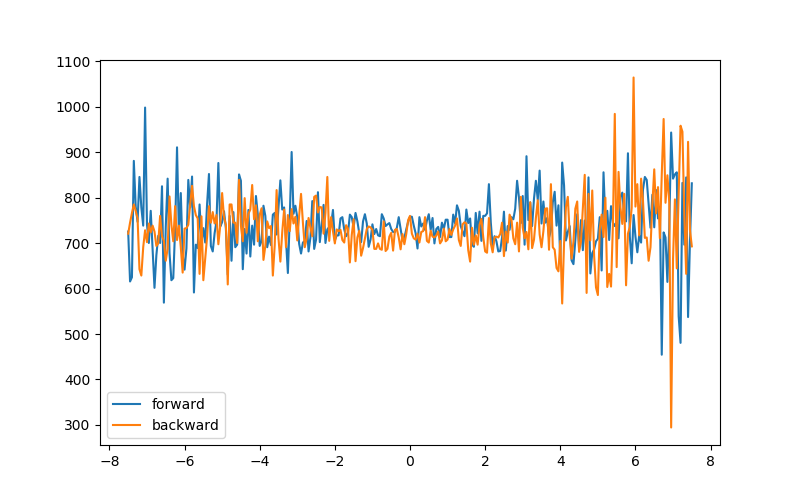

In [877]:
plt.figure(figsize=(8, 5))
plt.plot(data388.srframe_volt_p5_set[:], data388.lockin830_X[:]/1e-9, label='forward')
plt.plot(data389.srframe_volt_p5_set[:], data389.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [878]:
srframe.volt_p5(-4)

In [879]:
triton.field_set_stable(-0.5)

In [880]:
triton.magnet_sweeprate(0.1)#40nADC
triton.field(0.5)
data390, plot390 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepup_1nA_4K_40nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data391, plot391 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepdown_1nA_4K_40nA', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2021-01-13 14:09:14
DataSet:
   location = 'data/2021-01-13/#018_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepup_1nA_4K_40nA_14-09-13'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2021-01-13 14:19:32
Started at 2021-01-13 14:19:35
DataSet:
   location = 'data/2021-01-13/#019_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepdown_1nA_4K_40nA_14-19-34'
   <Type>   |

<IPython.core.display.Javascript object>


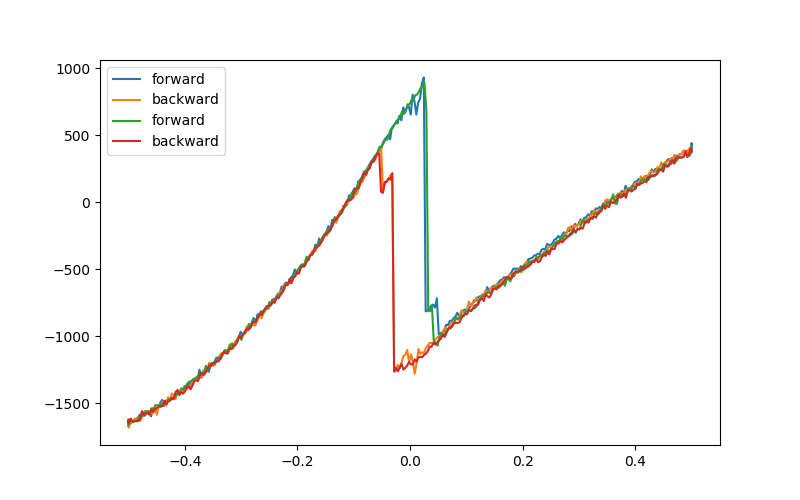

In [882]:
plt.figure(figsize=(8, 5))
plt.plot(data390.triton_field[:], data390.lockin830_X[:]/1e-9, label='forward')
plt.plot(data391.triton_field[:], data391.lockin830_X[:]/1e-9, label='backward')

plt.plot(data385.triton_field[:], data385.lockin830_X[:]/1e-9, label='forward')
plt.plot(data386.triton_field[:], data386.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [883]:
srframe.volt_p5(0)

In [884]:
triton.pid_setpoint(4.5)

In [885]:
triton.field_set_stable(-0.0008)

In [886]:
srframe.volt_p5(0)
time.sleep(15)
bgvals = np.linspace(0, 7.5, 151)
data392, plot392 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4p5K')

Started at 2021-01-13 15:22:19
DataSet:
   location = 'data/2021-01-13/#020_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4p5K_15-22-16'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2021-01-13 15:25:55


In [887]:
srframe.volt_p5(7.5)
time.sleep(15)
bgvals = np.linspace(7.5, -7.5, 151)
data393, plot393 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4p5K')

Started at 2021-01-13 15:26:15
DataSet:
   location = 'data/2021-01-13/#021_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4p5K_15-26-11'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2021-01-13 15:29:51


In [888]:
srframe.volt_p5(-7.5)
time.sleep(15)
bgvals = np.linspace(-7.5, 7.5, 151)
data394, plot394 = npd.single_param_sweep(srframe.volt_p5, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4p5K')

Started at 2021-01-13 15:30:10
DataSet:
   location = 'data/2021-01-13/#022_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vg2p7_1nA_DCsweep_4p5K_15-30-07'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (151,)
   Measured | lockin865_X         | X            | (151,)
   Measured | lockin865_Y         | Y            | (151,)
   Measured | lockin830_X         | X            | (151,)
   Measured | lockin830_Y         | Y            | (151,)
   Measured | lockin830_2_X       | X            | (151,)
   Measured | lockin830_2_Y       | Y            | (151,)
   Measured | lockin830_3_X       | X            | (151,)
   Measured | lockin830_3_Y       | Y            | (151,)
Finished at 2021-01-13 15:33:47


<IPython.core.display.Javascript object>


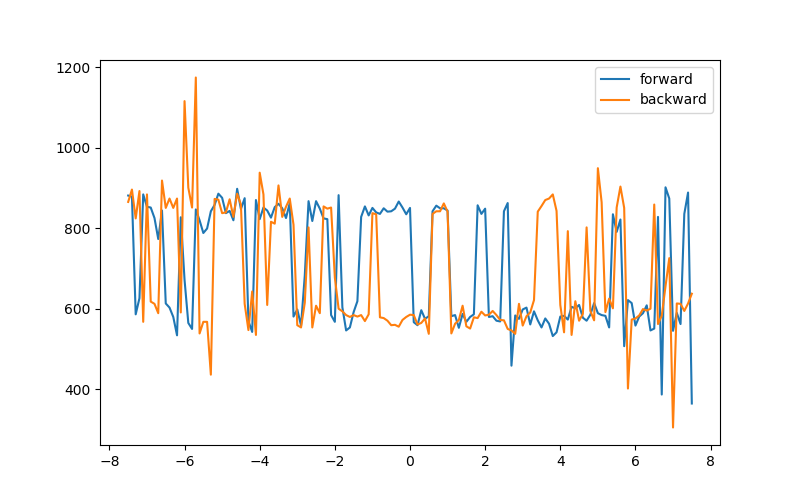

In [889]:
plt.figure(figsize=(8, 5))
plt.plot(data393.srframe_volt_p5_set[:], data393.lockin830_X[:]/1e-9, label='forward')
plt.plot(data394.srframe_volt_p5_set[:], data394.lockin830_X[:]/1e-9, label='backward')

plt.legend()

In [890]:
srframe.volt_p5(0)

In [891]:
triton.field_set_stable(-0.5)

In [892]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data395, plot395 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepup_1nA_4p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data396, plot396 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepdown_1nA_4p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2021-01-13 15:41:58
DataSet:
   location = 'data/2021-01-13/#023_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepup_1nA_4p5K_15-41-57'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2021-01-13 15:52:14
Started at 2021-01-13 15:52:18
DataSet:
   location = 'data/2021-01-13/#024_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p7FieldSweepdown_1nA_4p5K_15-52-17'
   <Type>   | <arra

In [893]:
triton.pid_mode(0)

In [894]:
triton.condense()

In [895]:
srframe.volt_p1(0)

In [911]:
triton.read_pressures()

P1:  45.3528
P2:  2312.44
P3:  0.462
P4:  5.4
P5:  190.005
POVC:  0.0003


In [915]:
triton.read_temps()

MC - on:  0.715319 K
MC_cernox - off:  1.21336 K
still - off:  0.546052 K
cold_plate - off:  0.317063 K
magnet - on:  4.57831 K
PT2h - off:  3.38952 K
PT2p - off:  3.6214 K
PT1h - off:  46.8279 K
PT1p - off:  63.0673 K


# now try onsager symmerization for better hysterisis loop at vg = 2.76

now source current from 2 ground 27, 830 +25 - 28, 865 +29 - 28

In [916]:
srframe.volt_p1(2.76)

In [917]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data397, plot397 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data398, plot398 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 18:39:08
DataSet:
   location = 'data/2021-01-13/#025_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_base_18-39-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 18:49:25
Started at 2021-01-13 18:49:28
DataSet:
   location = 'data/2021-01-13/#026_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_base_18-49-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured

<IPython.core.display.Javascript object>


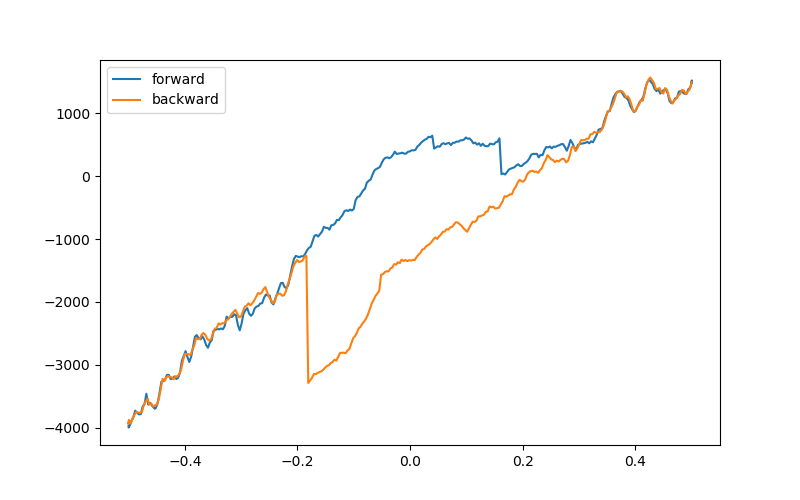

In [918]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data397.triton_field[:], data397.lockin830_X[:]/1e-9, label='forward')
plt.plot(data398.triton_field[:], data398.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [925]:
triton.pid_setpoint(0.1)

In [924]:
triton.pid_range(10)

In [921]:
triton.pid_mode(1)

In [926]:
triton.pid_setpoint(0.1)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data399, plot399 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_100mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data400, plot400 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_100mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 19:04:06
DataSet:
   location = 'data/2021-01-13/#027_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_100mK_19-04-06'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 19:14:25
Started at 2021-01-13 19:14:28
DataSet:
   location = 'data/2021-01-13/#028_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_100mK_19-14-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measur

In [927]:
triton.pid_setpoint(0.3)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data399, plot399 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_300mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data400, plot400 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_300mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 19:27:48
DataSet:
   location = 'data/2021-01-13/#029_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_300mK_19-27-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 19:38:06
Started at 2021-01-13 19:38:09
DataSet:
   location = 'data/2021-01-13/#030_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_300mK_19-38-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measur

In [928]:
triton.pid_setpoint(0.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data399, plot399 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_500mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data400, plot400 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_500mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 19:51:30
DataSet:
   location = 'data/2021-01-13/#031_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_500mK_19-51-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 20:01:49
Started at 2021-01-13 20:01:52
DataSet:
   location = 'data/2021-01-13/#032_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_500mK_20-01-51'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measur

In [929]:
triton.pid_setpoint(0.75)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data399, plot399 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_750mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data400, plot400 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_750mK', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 20:15:14
DataSet:
   location = 'data/2021-01-13/#033_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_750mK_20-15-13'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 20:25:32
Started at 2021-01-13 20:25:35
DataSet:
   location = 'data/2021-01-13/#034_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_750mK_20-25-34'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measur

In [930]:
triton.pid_setpoint(1)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data399, plot399 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_1K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data400, plot400 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_1K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 20:38:57
DataSet:
   location = 'data/2021-01-13/#035_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_1K_20-38-56'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 20:49:13
Started at 2021-01-13 20:49:16
DataSet:
   location = 'data/2021-01-13/#036_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_1K_20-49-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | l

In [931]:
triton.pid_range(31.6)
time.sleep(10)

In [932]:
triton.pid_setpoint(1.25)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data399, plot399 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_1p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data400, plot400 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_1p25K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 21:02:55
DataSet:
   location = 'data/2021-01-13/#037_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_1p25K_21-02-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 21:13:16
Started at 2021-01-13 21:14:25
DataSet:
   location = 'data/2021-01-13/#038_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_1p25K_21-13-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measur

In [933]:
triton.pid_range(100)
time.sleep(10)

In [934]:
triton.pid_setpoint(1.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data399, plot399 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data400, plot400 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_1p5K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 21:26:54
DataSet:
   location = 'data/2021-01-13/#039_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_1p5K_21-26-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 21:37:13
Started at 2021-01-13 21:38:27
DataSet:
   location = 'data/2021-01-13/#040_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_1p5K_21-37-18'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured

In [935]:
triton.pid_setpoint(1.75)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data399, plot399 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_1p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data400, plot400 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_1p75K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 21:50:39
DataSet:
   location = 'data/2021-01-13/#041_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_1p75K_21-50-38'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 22:00:58
Started at 2021-01-13 22:01:01
DataSet:
   location = 'data/2021-01-13/#042_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_1p75K_22-01-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measur

In [936]:
triton.pid_setpoint(2)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data399, plot399 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])
triton.field(-0.5)
data400, plot400 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_2K', XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 22:14:23
DataSet:
   location = 'data/2021-01-13/#043_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_2K_22-14-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 22:24:39
Started at 2021-01-13 22:24:43
DataSet:
   location = 'data/2021-01-13/#044_S13_865_29-28_830_25-28_vbg2p76FieldSweepdown_1nA_2K_22-24-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | l

In [937]:
Tvals = np.linspace(2.25, 8, 24)
for T in Tvals:
    triton.pid_setpoint(T)
    time.sleep(180)
    Tstr = str(int(T)) + 'p' + str(np.round(T-int(T), 4))[2:]
    triton.field(0.5)
    data399, plot399 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_{}K'.format(Tstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X])
    triton.field(-0.5)
    data400, plot400 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_{}K'.format(Tstr), XParam=triton.field, YParam=[lockin865.X, lockin830.X])

Started at 2021-01-13 22:39:47
DataSet:
   location = 'data/2021-01-13/#045_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_2p25K_22-39-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-13 22:50:11
Started at 2021-01-13 22:51:34
DataSet:
   location = 'data/2021-01-13/#046_S13_865_29-28_830_25-28_vbg2p76FieldSweepup_1nA_2p25K_22-50-17'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured

In [938]:
triton.pid_mode(0)

In [46]:
triton.magnet_POC(1)

In [981]:
triton.field_set_stable(-0.5)

In [941]:
triton.condense()

In [945]:
triton.read_temps()

MC - on:  1.0067 K
MC_cernox - on:  1.21336 K
still - on:  0.607156 K
cold_plate - off:  0.317063 K
magnet - off:  4.74907 K
PT2h - off:  3.38952 K
PT2p - off:  3.6214 K
PT1h - off:  46.8279 K
PT1p - off:  63.0673 K


In [943]:
triton.read_pressures()

P1:  45.249
P2:  2186.3
P3:  1.07
P4:  5.9
P5:  194.623
POVC:  0.0003


now source current from 25 ground 28, 830 +2 - 27

In [946]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data401, plot401 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin830.X])
triton.field(-0.5)
data402, plot402 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 10:56:59
DataSet:
   location = 'data/2021-01-14/#042_S13_830_2-27_vbg2p76FieldSweepup_1nA_base_10-56-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 11:07:16
Started at 2021-01-14 11:07:19
DataSet:
   location = 'data/2021-01-14/#043_S13_830_2-27_vbg2p76FieldSweepdown_1nA_base_11-07-18'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 11:17:37


<IPython.core.display.Javascript object>


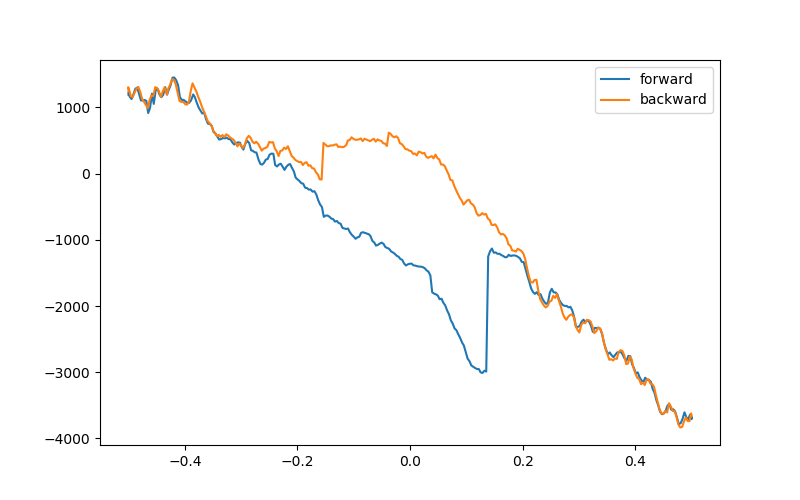

In [955]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data401.triton_field[:], data401.lockin830_X[:]/1e-9, label='forward')
plt.plot(data402.triton_field[:], data402.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [959]:
triton.pid_setpoint(0.1)

In [958]:
triton.pid_range(10)

In [956]:
triton.pid_mode(1)

In [960]:
triton.pid_setpoint(0.1)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data403, plot403 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_100mK', XParam=triton.field, YParam=[lockin830.X])
triton.field(-0.5)
data404, plot404 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepdown_1nA_100mK', XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 11:28:16
DataSet:
   location = 'data/2021-01-14/#044_S13_830_2-27_vbg2p76FieldSweepup_1nA_100mK_11-28-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 11:38:35
Started at 2021-01-14 11:38:38
DataSet:
   location = 'data/2021-01-14/#045_S13_830_2-27_vbg2p76FieldSweepdown_1nA_100mK_11-38-37'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 11:48:56


In [961]:
triton.pid_setpoint(0.3)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data403, plot403 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_300mK', XParam=triton.field, YParam=[lockin830.X])
triton.field(-0.5)
data404, plot404 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepdown_1nA_300mK', XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 11:51:59
DataSet:
   location = 'data/2021-01-14/#046_S13_830_2-27_vbg2p76FieldSweepup_1nA_300mK_11-51-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 12:02:17
Started at 2021-01-14 12:02:20
DataSet:
   location = 'data/2021-01-14/#047_S13_830_2-27_vbg2p76FieldSweepdown_1nA_300mK_12-02-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 12:12:39


In [962]:
triton.pid_setpoint(0.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data403, plot403 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_500mK', XParam=triton.field, YParam=[lockin830.X])
triton.field(-0.5)
data404, plot404 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepdown_1nA_500mK', XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 12:15:44
DataSet:
   location = 'data/2021-01-14/#048_S13_830_2-27_vbg2p76FieldSweepup_1nA_500mK_12-15-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 12:26:03
Started at 2021-01-14 12:26:06
DataSet:
   location = 'data/2021-01-14/#049_S13_830_2-27_vbg2p76FieldSweepdown_1nA_500mK_12-26-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 12:36:25


In [963]:
triton.pid_setpoint(0.75)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data403, plot403 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_750mK', XParam=triton.field, YParam=[lockin830.X])
triton.field(-0.5)
data404, plot404 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepdown_1nA_750mK', XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 12:39:28
DataSet:
   location = 'data/2021-01-14/#050_S13_830_2-27_vbg2p76FieldSweepup_1nA_750mK_12-39-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 12:49:44
Started at 2021-01-14 12:49:47
DataSet:
   location = 'data/2021-01-14/#051_S13_830_2-27_vbg2p76FieldSweepdown_1nA_750mK_12-49-46'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 13:00:05


In [964]:
triton.pid_setpoint(1)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data403, plot403 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_1K', XParam=triton.field, YParam=[lockin830.X])
triton.field(-0.5)
data404, plot404 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepdown_1nA_1K', XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 13:03:09
DataSet:
   location = 'data/2021-01-14/#052_S13_830_2-27_vbg2p76FieldSweepup_1nA_1K_13-03-08'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 13:13:28
Started at 2021-01-14 13:13:31
DataSet:
   location = 'data/2021-01-14/#053_S13_830_2-27_vbg2p76FieldSweepdown_1nA_1K_13-13-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 13:23:49


In [965]:
triton.pid_range(31.6)
time.sleep(10)

In [966]:
triton.pid_setpoint(1.25)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data403, plot403 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_1p25K', XParam=triton.field, YParam=[lockin830.X])
triton.field(-0.5)
data404, plot404 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepdown_1nA_1p25K', XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 13:27:04
DataSet:
   location = 'data/2021-01-14/#054_S13_830_2-27_vbg2p76FieldSweepup_1nA_1p25K_13-27-03'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 13:37:23
Started at 2021-01-14 13:37:26
DataSet:
   location = 'data/2021-01-14/#055_S13_830_2-27_vbg2p76FieldSweepdown_1nA_1p25K_13-37-25'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 13:47:44


In [967]:
triton.pid_range(100)
time.sleep(10)

In [968]:
triton.pid_setpoint(1.5)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data403, plot403 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_1p5K', XParam=triton.field, YParam=[lockin830.X])
triton.field(-0.5)
data404, plot404 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepdown_1nA_1p5K', XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 13:50:58
DataSet:
   location = 'data/2021-01-14/#056_S13_830_2-27_vbg2p76FieldSweepup_1nA_1p5K_13-50-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 14:01:14
Started at 2021-01-14 14:01:17
DataSet:
   location = 'data/2021-01-14/#057_S13_830_2-27_vbg2p76FieldSweepdown_1nA_1p5K_14-01-17'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 14:11:35


In [969]:
triton.pid_setpoint(1.75)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data403, plot403 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_1p75K', XParam=triton.field, YParam=[lockin830.X])
triton.field(-0.5)
data404, plot404 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepdown_1nA_1p75K', XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 14:14:39
DataSet:
   location = 'data/2021-01-14/#058_S13_830_2-27_vbg2p76FieldSweepup_1nA_1p75K_14-14-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 14:24:55
Started at 2021-01-14 14:24:58
DataSet:
   location = 'data/2021-01-14/#059_S13_830_2-27_vbg2p76FieldSweepdown_1nA_1p75K_14-24-58'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 14:35:15


In [970]:
triton.pid_setpoint(2)
time.sleep(180)
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data403, plot403 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_2K', XParam=triton.field, YParam=[lockin830.X])
triton.field(-0.5)
data404, plot404 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepdown_1nA_2K', XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 14:38:20
DataSet:
   location = 'data/2021-01-14/#060_S13_830_2-27_vbg2p76FieldSweepup_1nA_2K_14-38-20'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 14:48:39
Started at 2021-01-14 14:48:42
DataSet:
   location = 'data/2021-01-14/#061_S13_830_2-27_vbg2p76FieldSweepdown_1nA_2K_14-48-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 14:59:01


In [972]:
triton.pid_mode(1)

In [976]:
triton.pid_range(100)

In [978]:
triton.pid_setpoint(2.25)

In [979]:
Tvals = np.linspace(2.25, 8, 24)
for T in Tvals:
    triton.pid_setpoint(T)
    time.sleep(180)
    Tstr = str(int(T)) + 'p' + str(np.round(T-int(T), 4))[2:]
    triton.field(0.5)
    data399, plot399 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_{}K'.format(Tstr), XParam=triton.field, YParam=[lockin830.X])
    triton.field(-0.5)
    data400, plot400 = npd.data_log(1, triton.field, lockin830.X, lockin830.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_830_2-27_vbg2p76FieldSweepup_1nA_{}K'.format(Tstr), XParam=triton.field, YParam=[lockin830.X])

Started at 2021-01-14 15:09:53
DataSet:
   location = 'data/2021-01-14/#062_S13_830_2-27_vbg2p76FieldSweepup_1nA_2p25K_15-09-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 15:20:12
Started at 2021-01-14 15:20:15
DataSet:
   location = 'data/2021-01-14/#063_S13_830_2-27_vbg2p76FieldSweepup_1nA_2p25K_15-20-15'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2021-01-14 15:30:33
Started at 2021-01-14 15:33:35
DataSet:
   location 

In [982]:
triton.pid_setpoint(4)

In [983]:
lockin865.amplitude(0.1)

# 4K  B field gate switch

In [7]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data401, plot401 = npd.data_log(1, triton.field, srframe.volt_p1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data402, plot402 = npd.data_log(1, triton.field, srframe.volt_p1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Are you sure you want to use the magnet? [y/n]: y
Started at 2021-01-15 10:24:07
DataSet:
   location = 'data/2021-01-15/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p76FieldSweepup_1nA_4K_10-24-04'
   <Type>   | <array_id>      | <array.name> | <array.shape>
   Setpoint | count_set       | count        | (900,)
   Measured | time0           | time0        | (900,)
   Measured | triton_field    | field        | (900,)
   Measured | srframe_volt_p1 | volt_p1      | (900,)
   Measured | lockin865_X     | X            | (900,)
   Measured | lockin865_Y     | Y            | (900,)
   Measured | lockin830_X     | X            | (900,)
   Measured | lockin830_Y     | Y            | (900,)
   Measured | lockin830_2_X   | X            | (900,)
   Measured | lockin830_2_Y   | Y            | (900,)
   Measured | lockin830_3_X   | X            | (900,)
   Measured | lockin830_3_Y   | Y            | (900,)
Finished at 2021-01-15 10:31:28
Started at 2021-01-15 10:31:31
DataSet:
   location 

<IPython.core.display.Javascript object>


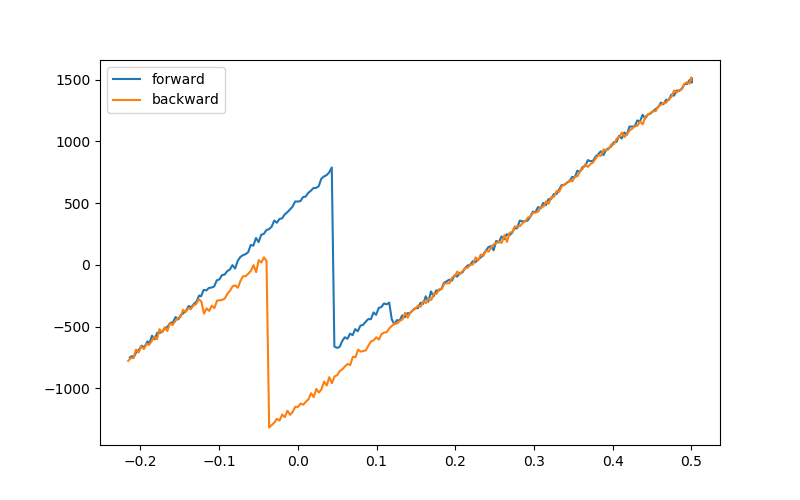

In [8]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data401.triton_field[:], data401.lockin830_X[:]/1e-9, label='forward')
plt.plot(data402.triton_field[:], data402.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [12]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data188, plot188 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2021-01-15 10:50:19
DataSet:
   location = 'data/2021-01-15/#009_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_nu1peak_1nA_10-50-17'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2021-01-15 10:53:02


In [13]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data189, plot189 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2021-01-15 10:53:19
DataSet:
   location = 'data/2021-01-15/#010_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_nu1peak_1nA_10-53-18'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2021-01-15 10:56:03


<IPython.core.display.Javascript object>


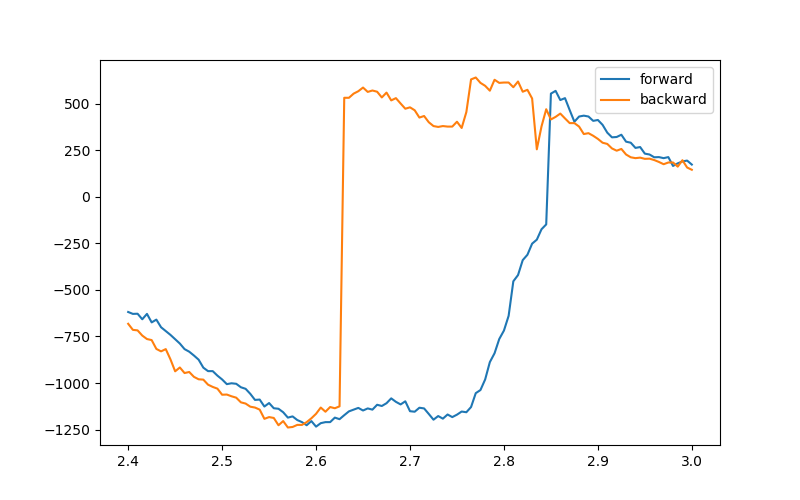

In [14]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data188.srframe_volt_p1_set [:], data188.lockin830_X[:]/1e-9, label='forward')
plt.plot(data189.srframe_volt_p1_set [:], data189.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [28]:
triton.field(0.05)

In [31]:
srframe.volt_p1(2.4)
time.sleep(15)
bgvals = np.linspace(2.4, 3, 121)
data188, plot188 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2021-01-15 12:54:20
DataSet:
   location = 'data/2021-01-15/#013_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_nu1peak_1nA_12-54-18'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2021-01-15 12:57:03


In [32]:
srframe.volt_p1(3)
time.sleep(15)
bgvals = np.linspace(3, 2.4, 121)
data189, plot189 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_nu1peak_1nA', YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2021-01-15 12:57:20
DataSet:
   location = 'data/2021-01-15/#014_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_nu1peak_1nA_12-57-19'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (121,)
   Measured | lockin865_X         | X            | (121,)
   Measured | lockin865_Y         | Y            | (121,)
   Measured | lockin830_X         | X            | (121,)
   Measured | lockin830_Y         | Y            | (121,)
   Measured | lockin830_2_X       | X            | (121,)
   Measured | lockin830_2_Y       | Y            | (121,)
   Measured | lockin830_3_X       | X            | (121,)
   Measured | lockin830_3_Y       | Y            | (121,)
Finished at 2021-01-15 13:00:04


<IPython.core.display.Javascript object>


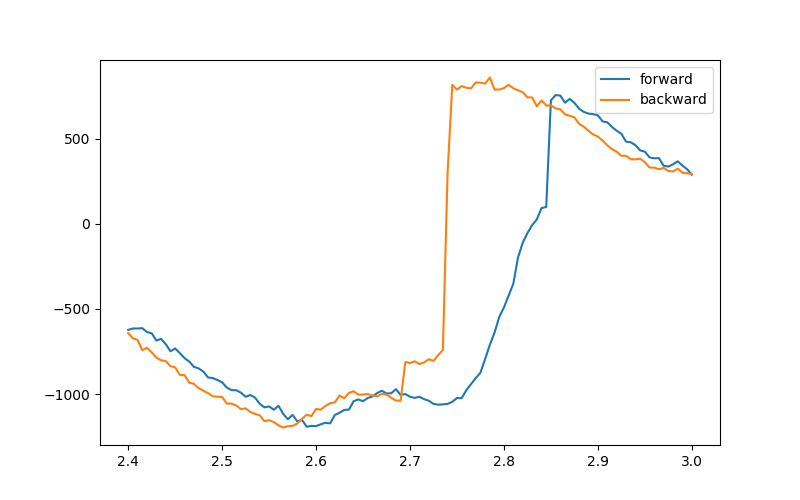

In [33]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data188.srframe_volt_p1_set [:], data188.lockin830_X[:]/1e-9, label='forward')
plt.plot(data189.srframe_volt_p1_set [:], data189.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [34]:
srframe.volt_p1(2.8)

In [35]:
triton.field_set_stable(-0.4)

In [36]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data401, plot401 = npd.data_log(1, triton.field, srframe.volt_p1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p8FieldSweepup_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])
triton.field(-0.5)
data402, plot402 = npd.data_log(1, triton.field, srframe.volt_p1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p8FieldSweepdown_1nA_4K', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X])

Started at 2021-01-15 13:06:07
DataSet:
   location = 'data/2021-01-15/#015_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg2p8FieldSweepup_1nA_4K_13-06-06'
   <Type>   | <array_id>      | <array.name> | <array.shape>
   Setpoint | count_set       | count        | (900,)
   Measured | time0           | time0        | (900,)
   Measured | triton_field    | field        | (900,)
   Measured | srframe_volt_p1 | volt_p1      | (900,)
   Measured | lockin865_X     | X            | (900,)
   Measured | lockin865_Y     | Y            | (900,)
   Measured | lockin830_X     | X            | (900,)
   Measured | lockin830_Y     | Y            | (900,)
   Measured | lockin830_2_X   | X            | (900,)
   Measured | lockin830_2_Y   | Y            | (900,)
   Measured | lockin830_3_X   | X            | (900,)
   Measured | lockin830_3_Y   | Y            | (900,)
Finished at 2021-01-15 13:15:26
Started at 2021-01-15 13:15:29
DataSet:
   location = 'data/2021-01-15/#016_S13_865_2-25_830_25-28_8302

<IPython.core.display.Javascript object>


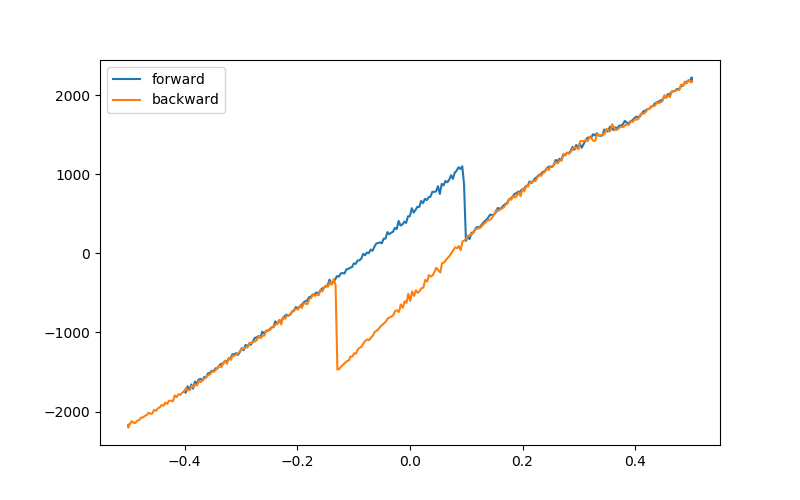

In [37]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data401.triton_field[:], data401.lockin830_X[:]/1e-9, label='forward')
plt.plot(data402.triton_field[:], data402.lockin830_X[:]/1e-9, label='backward')
plt.legend()

<IPython.core.display.Javascript object>


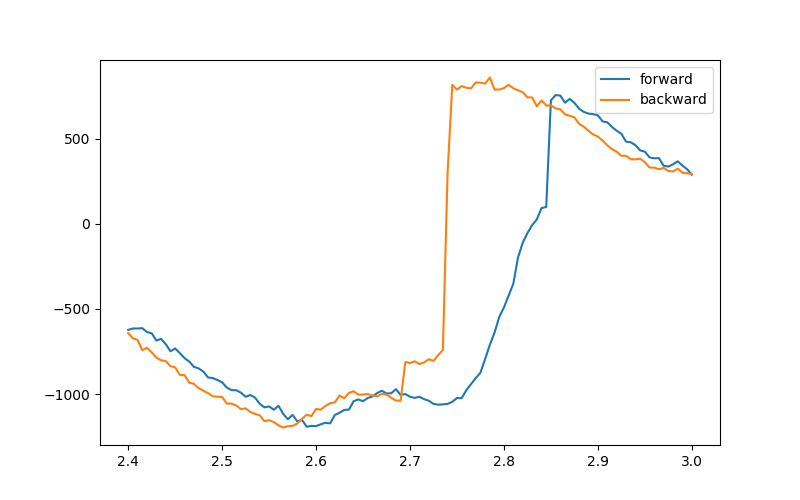

In [39]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data188.srframe_volt_p1_set [:], data188.lockin830_X[:]/1e-9, label='forward')
plt.plot(data189.srframe_volt_p1_set [:], data189.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [38]:
triton.field(0.05)

In [40]:
data401, plot401 = npd.data_log(1, triton.field, srframe.volt_p1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=420, breakif=npd.breakat(triton.field, 0.5, 0.002, 420), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_magnetic_bit_1nA_4K', YParam=[triton.field, lockin830.X, srframe.volt_p1])

Started at 2021-01-15 13:36:09
DataSet:
   location = 'data/2021-01-15/#017_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_magnetic_bit_1nA_4K_13-36-08'
   <Type>   | <array_id>      | <array.name> | <array.shape>
   Setpoint | count_set       | count        | (25200,)
   Measured | time0           | time0        | (25200,)
   Measured | triton_field    | field        | (25200,)
   Measured | srframe_volt_p1 | volt_p1      | (25200,)
   Measured | lockin865_X     | X            | (25200,)
   Measured | lockin865_Y     | Y            | (25200,)
   Measured | lockin830_X     | X            | (25200,)
   Measured | lockin830_Y     | Y            | (25200,)
   Measured | lockin830_2_X   | X            | (25200,)
   Measured | lockin830_2_Y   | Y            | (25200,)
   Measured | lockin830_3_X   | X            | (25200,)
   Measured | lockin830_3_Y   | Y            | (25200,)
Finished at 2021-01-15 19:33:42
Keyboard Interrupt


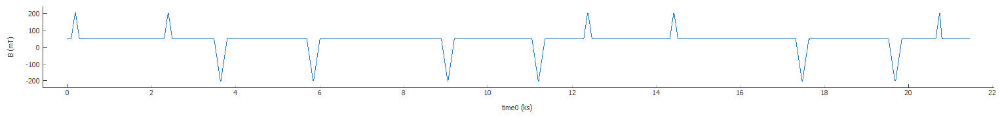

In [41]:
plot401[0]

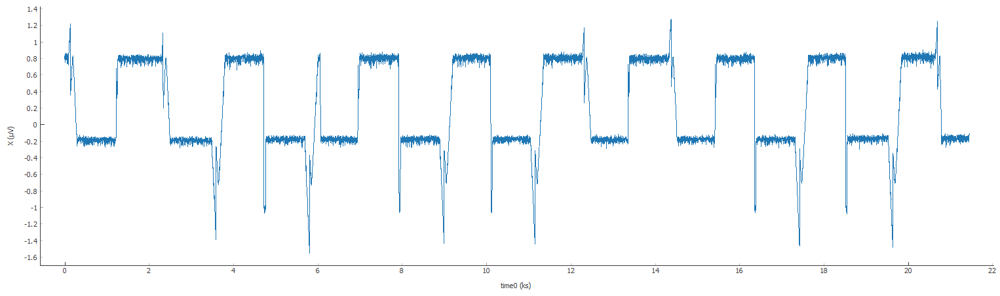

In [42]:
plot401[1]

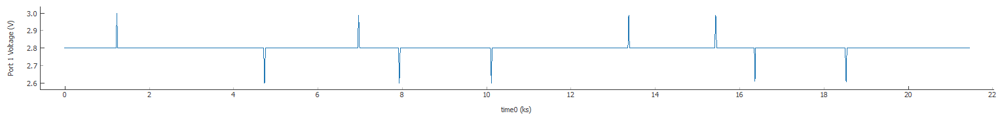

In [43]:
plot401[2]

In [44]:
triton.pid_mode(0)

In [47]:
triton.field_set_stable(0)

In [48]:
srframe.volt_p1(0)

In [49]:
triton.condense()

In [55]:
triton.read_pressures()

P1:  53.5504
P2:  2382.48
P3:  5.7
P4:  5.0
P5:  184.402
POVC:  0.0003


In [60]:
triton.read_temps()

MC - on:  0.0237731 K
MC_cernox - on:  321.181 K
still - on:  0.722035 K
cold_plate - off:  0.317063 K
magnet - off:  4.65633 K
PT2h - off:  3.38952 K
PT2p - off:  3.6214 K
PT1h - off:  46.8279 K
PT1p - off:  63.0673 K


In [61]:
triton.field_set_stable(0.25)

In [62]:
lockin865.amplitude(0.3)

# around one quarter 0.25T T dependence Rxx and Rxy

In [63]:
srframe.volt_p1(1.5)#3nA
time.sleep(30)
gvals = np.linspace(1.5, 4.5, 301)
data410, plot410 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_0p25T')
srframe.volt_p1(1.5)

Started at 2021-01-16 11:16:22
DataSet:
   location = 'data/2021-01-16/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_0p25T_11-16-19'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-16 11:23:33


In [68]:
triton.pid_setpoint(0.05)

In [69]:
triton.pid_range(10)

In [66]:
triton.pid_mode(1)

In [70]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
bgvals = np.linspace(1.5, 4.5, 301)
data411, plot411 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy0p25T')
srframe.volt_p1(1.5)

Started at 2021-01-16 11:27:31
DataSet:
   location = 'data/2021-01-16/#002_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy0p25T_11-27-26'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 301)
   Measured | lockin865_X             | X            | (20, 301)
   Measured | lockin865_Y             | Y            | (20, 301)
   Measured | lockin830_X             | X            | (20, 301)
   Measured | lockin830_Y             | Y            | (20, 301)
   Measured | lockin830_2_X           | X            | (20, 301)
   Measured | lockin830_2_Y           | Y            | (20, 301)
   Measured | lockin830_3_X           | X            | (20, 301)
   Measured | lockin830_3_Y           | Y            | (20, 301)
Finished at 2021-01-16 14:38:03


In [71]:
triton.pid_range(31.6)
time.sleep(10)

In [72]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(1.1, 1.4, 4)
bgvals = np.linspace(1.5, 4.5, 301)
data412, plot412 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy0p25T')
srframe.volt_p1(1.5)

Started at 2021-01-16 14:38:44
DataSet:
   location = 'data/2021-01-16/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy0p25T_14-38-39'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (4,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (4, 301)
   Measured | lockin865_X             | X            | (4, 301)
   Measured | lockin865_Y             | Y            | (4, 301)
   Measured | lockin830_X             | X            | (4, 301)
   Measured | lockin830_Y             | Y            | (4, 301)
   Measured | lockin830_2_X           | X            | (4, 301)
   Measured | lockin830_2_Y           | Y            | (4, 301)
   Measured | lockin830_3_X           | X            | (4, 301)
   Measured | lockin830_3_Y           | Y            | (4, 301)
Finished at 2021-01-16 15:16:53


In [73]:
triton.pid_range(100)
time.sleep(10)

In [74]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(1.5, 2, 6)
bgvals = np.linspace(1.5, 4.5, 301)
data413, plot413 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy0p25T')
srframe.volt_p1(1.5)

Started at 2021-01-16 15:17:34
DataSet:
   location = 'data/2021-01-16/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy0p25T_15-17-29'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (6, 301)
   Measured | lockin865_X             | X            | (6, 301)
   Measured | lockin865_Y             | Y            | (6, 301)
   Measured | lockin830_X             | X            | (6, 301)
   Measured | lockin830_Y             | Y            | (6, 301)
   Measured | lockin830_2_X           | X            | (6, 301)
   Measured | lockin830_2_Y           | Y            | (6, 301)
   Measured | lockin830_3_X           | X            | (6, 301)
   Measured | lockin830_3_Y           | Y            | (6, 301)
Finished at 2021-01-16 16:14:46


In [75]:
triton.pid_setpoint(2.2)

In [76]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(2.2, 10, 40)
bgvals = np.linspace(1.5, 4.5, 301)
data414, plot414 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy0p25T')
srframe.volt_p1(1.5)

Started at 2021-01-16 16:44:23
DataSet:
   location = 'data/2021-01-16/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy0p25T_16-44-18'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (40,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (40, 301)
   Measured | lockin865_X             | X            | (40, 301)
   Measured | lockin865_Y             | Y            | (40, 301)
   Measured | lockin830_X             | X            | (40, 301)
   Measured | lockin830_Y             | Y            | (40, 301)
   Measured | lockin830_2_X           | X            | (40, 301)
   Measured | lockin830_2_Y           | Y            | (40, 301)
   Measured | lockin830_3_X           | X            | (40, 301)
   Measured | lockin830_3_Y           | Y            | (40, 301)
Finished at 2021-01-16 23:05:44


In [102]:
triton.pid_mode(0)

In [103]:
triton.condense()

In [80]:
triton.field_set_stable(-0.25)

# around one quarter -0.25T T dependence Rxx and Rxy

In [81]:
srframe.volt_p1(1.5)#3nA
time.sleep(30)
gvals = np.linspace(1.5, 4.5, 301)
data415, plot415 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_-0p25T')
srframe.volt_p1(1.5)

Started at 2021-01-17 13:35:50
DataSet:
   location = 'data/2021-01-17/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_-0p25T_13-35-47'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (301,)
   Measured | lockin865_X         | X            | (301,)
   Measured | lockin865_Y         | Y            | (301,)
   Measured | lockin830_X         | X            | (301,)
   Measured | lockin830_Y         | Y            | (301,)
   Measured | lockin830_2_X       | X            | (301,)
   Measured | lockin830_2_Y       | Y            | (301,)
   Measured | lockin830_3_X       | X            | (301,)
   Measured | lockin830_3_Y       | Y            | (301,)
Finished at 2021-01-17 13:43:01


In [88]:
triton.pid_setpoint(0.05)

In [89]:
triton.pid_range(10)

In [85]:
triton.pid_mode(1)

In [90]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(0.05, 1, 20)
bgvals = np.linspace(1.5, 4.5, 301)
data416, plot416 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy-0p25T')
srframe.volt_p1(1.5)

Started at 2021-01-17 13:45:42
DataSet:
   location = 'data/2021-01-17/#002_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy-0p25T_13-45-37'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (20, 301)
   Measured | lockin865_X             | X            | (20, 301)
   Measured | lockin865_Y             | Y            | (20, 301)
   Measured | lockin830_X             | X            | (20, 301)
   Measured | lockin830_Y             | Y            | (20, 301)
   Measured | lockin830_2_X           | X            | (20, 301)
   Measured | lockin830_2_Y           | Y            | (20, 301)
   Measured | lockin830_3_X           | X            | (20, 301)
   Measured | lockin830_3_Y           | Y            | (20, 301)
Finished at 2021-01-17 16:56:14


In [91]:
triton.pid_range(31.6)
time.sleep(10)

In [92]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(1.1, 1.4, 4)
bgvals = np.linspace(1.5, 4.5, 301)
data416, plot416 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p25T')
srframe.volt_p1(1.5)

Started at 2021-01-17 16:56:55
DataSet:
   location = 'data/2021-01-17/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p25T_16-56-50'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (4,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (4, 301)
   Measured | lockin865_X             | X            | (4, 301)
   Measured | lockin865_Y             | Y            | (4, 301)
   Measured | lockin830_X             | X            | (4, 301)
   Measured | lockin830_Y             | Y            | (4, 301)
   Measured | lockin830_2_X           | X            | (4, 301)
   Measured | lockin830_2_Y           | Y            | (4, 301)
   Measured | lockin830_3_X           | X            | (4, 301)
   Measured | lockin830_3_Y           | Y            | (4, 301)
Finished at 2021-01-17 17:35:03


In [93]:
triton.pid_range(100)
time.sleep(10)

In [94]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(1.5, 2, 6)
bgvals = np.linspace(1.5, 4.5, 301)
data417, plot417 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy-0p25T')
srframe.volt_p1(1.5)

Started at 2021-01-17 17:35:44
DataSet:
   location = 'data/2021-01-17/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy-0p25T_17-35-39'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (6, 301)
   Measured | lockin865_X             | X            | (6, 301)
   Measured | lockin865_Y             | Y            | (6, 301)
   Measured | lockin830_X             | X            | (6, 301)
   Measured | lockin830_Y             | Y            | (6, 301)
   Measured | lockin830_2_X           | X            | (6, 301)
   Measured | lockin830_2_Y           | Y            | (6, 301)
   Measured | lockin830_3_X           | X            | (6, 301)
   Measured | lockin830_3_Y           | Y            | (6, 301)
Finished at 2021-01-17 18:32:56


In [96]:
triton.pid_mode(1)

In [98]:
triton.pid_range(100)

In [99]:
triton.pid_setpoint(2.2)

In [100]:
srframe.volt_p1(1.5)
time.sleep(25)
Tvals = np.linspace(2.2, 10, 40)
bgvals = np.linspace(1.5, 4.5, 301)
data418, plot418 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, SetDelay1=180, SetDelay2=1.1, Param2_SetBetween=1.5, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy-0p25T')
srframe.volt_p1(1.5)

Started at 2021-01-17 19:50:41
DataSet:
   location = 'data/2021-01-17/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy-0p25T_19-50-36'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (40,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (40, 301)
   Measured | lockin865_X             | X            | (40, 301)
   Measured | lockin865_Y             | Y            | (40, 301)
   Measured | lockin830_X             | X            | (40, 301)
   Measured | lockin830_Y             | Y            | (40, 301)
   Measured | lockin830_2_X           | X            | (40, 301)
   Measured | lockin830_2_Y           | Y            | (40, 301)
   Measured | lockin830_3_X           | X            | (40, 301)
   Measured | lockin830_3_Y           | Y            | (40, 301)
Finished at 2021-01-18 02:11:57


In [101]:
srframe.volt_p1(0)

In [106]:
lockin865.amplitude(0.1)

 # quickly check minus one quarter

In [107]:
srframe.volt_p1(-11)#1nA
time.sleep(30)
gvals = np.linspace(-11, 12, 576)
data419, plot419 = npd.single_param_sweep(srframe.volt_p1, gvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_1nA_gatesweep')
srframe.volt_p1(0)

Started at 2021-01-19 11:32:18
DataSet:
   location = 'data/2021-01-19/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_1nA_gatesweep_11-32-14'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (576,)
   Measured | lockin865_X         | X            | (576,)
   Measured | lockin865_Y         | Y            | (576,)
   Measured | lockin830_X         | X            | (576,)
   Measured | lockin830_Y         | Y            | (576,)
   Measured | lockin830_2_X       | X            | (576,)
   Measured | lockin830_2_Y       | Y            | (576,)
   Measured | lockin830_3_X       | X            | (576,)
   Measured | lockin830_3_Y       | Y            | (576,)
Finished at 2021-01-19 11:46:02


<IPython.core.display.Javascript object>


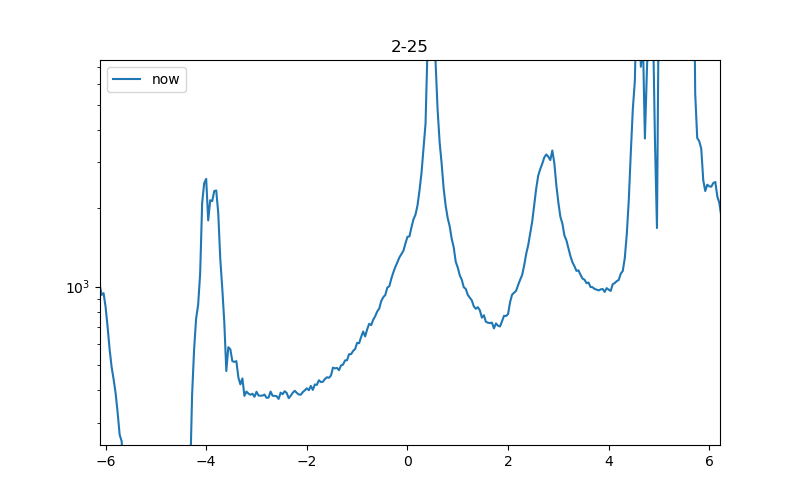

In [109]:
plt.figure(figsize=(8, 5))
plt.semilogy(data419.srframe_volt_p1_set[:], abs(data419.lockin865_X[:]/1e-9), label='now')
plt.title('2-25')
plt.legend()

In [110]:
triton.field_set_stable(-0.5)

In [111]:
srframe.volt_p1(-1.76)

In [113]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data175, plot175 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vb-1p76FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data176, plot176 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg-1p76FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2021-01-19 12:08:28
DataSet:
   location = 'data/2021-01-19/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vb-1p76FieldSweepup_1nA_base_12-08-27'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2021-01-19 12:18:45
Started at 2021-01-19 12:18:49
DataSet:
   location = 'data/2021-01-19/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg-1p76FieldSweepdown_1nA_base_12-18-48'
   <Type>   | <a

<IPython.core.display.Javascript object>


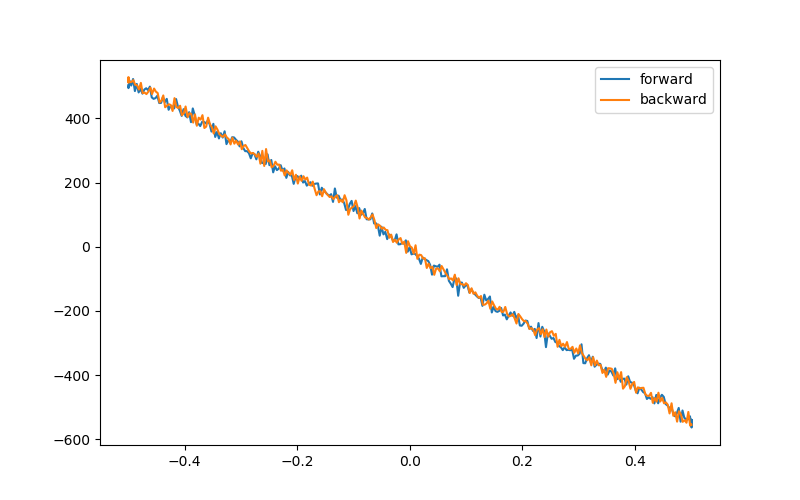

In [114]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data175.triton_field[:], data175.lockin830_X[:]/1e-9, label='forward')
plt.plot(data176.triton_field[:], data176.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [115]:
srframe.volt_p1(-1.85)

In [116]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data177, plot177 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vb-1p85FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data178, plot178 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg-1p85FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2021-01-19 12:51:35
DataSet:
   location = 'data/2021-01-19/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vb-1p85FieldSweepup_1nA_base_12-51-33'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2021-01-19 13:01:50
Started at 2021-01-19 13:01:54
DataSet:
   location = 'data/2021-01-19/#006_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg-1p85FieldSweepdown_1nA_base_13-01-52'
   <Type>   | <a

<IPython.core.display.Javascript object>


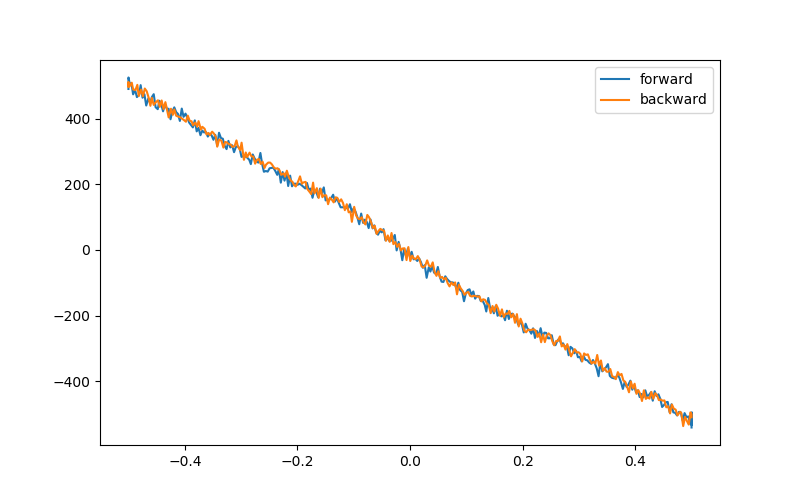

In [117]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data177.triton_field[:], data177.lockin830_X[:]/1e-9, label='forward')
plt.plot(data178.triton_field[:], data178.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [118]:
srframe.volt_p1(-2)

In [119]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data179, plot179 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vb-2FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data180, plot180 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg-2FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2021-01-19 13:23:20
DataSet:
   location = 'data/2021-01-19/#007_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vb-2FieldSweepup_1nA_base_13-23-19'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2021-01-19 13:33:35
Started at 2021-01-19 13:33:39
DataSet:
   location = 'data/2021-01-19/#008_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg-2FieldSweepdown_1nA_base_13-33-37'
   <Type>   | <array_i

<IPython.core.display.Javascript object>


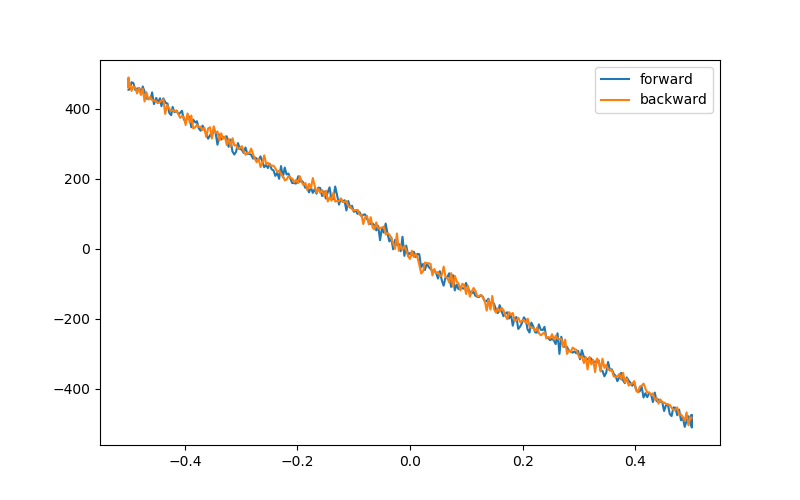

In [120]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data179.triton_field[:], data179.lockin830_X[:]/1e-9, label='forward')
plt.plot(data180.triton_field[:], data180.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [121]:
srframe.volt_p1(-2.1)

In [122]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data181, plot181 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vb-2p1FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data182, plot182 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg-2p1FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2021-01-19 15:56:55
DataSet:
   location = 'data/2021-01-19/#009_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vb-2p1FieldSweepup_1nA_base_15-56-53'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2021-01-19 16:07:12
Started at 2021-01-19 16:07:16
DataSet:
   location = 'data/2021-01-19/#010_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg-2p1FieldSweepdown_1nA_base_16-07-14'
   <Type>   | <arr

<IPython.core.display.Javascript object>


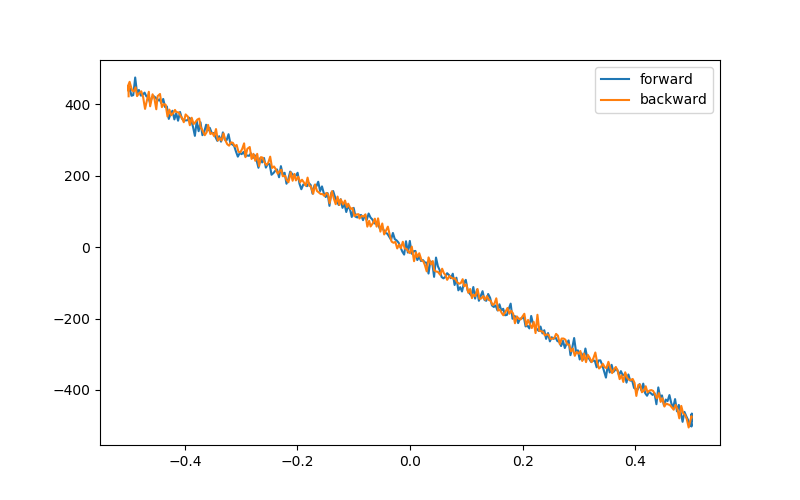

In [123]:
plt.figure(figsize=(8, 5)) # 2.65V
plt.plot(data181.triton_field[:], data181.lockin830_X[:]/1e-9, label='forward')
plt.plot(data182.triton_field[:], data182.lockin830_X[:]/1e-9, label='backward')
plt.legend()

In [124]:
srframe.volt_p1(-2.2)

In [125]:
triton.magnet_sweeprate(0.1)
triton.field(0.5)
data183, plot183 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, 0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vb-2p2FieldSweepup_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])
triton.field(-0.5)
data184, plot184 = npd.data_log(1, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, lockin830_2.X, lockin830_2.Y, lockin830_3.X, lockin830_3.Y, minutes=15, breakif=npd.breakat(triton.field, -0.5, 0.002, 10), DataName='S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg-2p2FieldSweepdown_1nA_base', XParam=triton.field, YParam=[lockin865.X, lockin830.X, lockin830_2.X, lockin830_3.X])

Started at 2021-01-19 23:18:45
DataSet:
   location = 'data/2021-01-19/#011_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vb-2p2FieldSweepup_1nA_base_23-18-43'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | count_set     | count        | (900,)
   Measured | time0         | time0        | (900,)
   Measured | triton_field  | field        | (900,)
   Measured | lockin865_X   | X            | (900,)
   Measured | lockin865_Y   | Y            | (900,)
   Measured | lockin830_X   | X            | (900,)
   Measured | lockin830_Y   | Y            | (900,)
   Measured | lockin830_2_X | X            | (900,)
   Measured | lockin830_2_Y | Y            | (900,)
   Measured | lockin830_3_X | X            | (900,)
   Measured | lockin830_3_Y | Y            | (900,)
Finished at 2021-01-19 23:29:02
Started at 2021-01-19 23:29:06
DataSet:
   location = 'data/2021-01-19/#012_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_vbg-2p2FieldSweepdown_1nA_base_23-29-04'
   <Type>   | <arr

In [126]:
srframe.volt_p1(0)

In [127]:
triton.field_set_stable(0)

In [150]:
triton.pid_setpoint(40)

In [139]:
triton.pid_range(100)

In [130]:
triton.pid_mode(1)

In [151]:
triton.read_pressures()

P1:  737.797
P2:  744.898
P3:  0.0162
P4:  0.0099
P5:  41.7209
POVC:  0.0003


In [152]:
triton.fullcooldown()

In [153]:
triton.close()
lockin865.close()
lockin830.close()
lockin830_2.close()
lockin830_3.close()
srframe.close()